In [1]:
# %load_ext autoreload
# %autoreload 2

In [2]:
import numpy as np
import scipy
import scipy.linalg

import pandas as pd
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.stats import norm, chi2
from matplotlib.patches import Ellipse
from matplotlib import cm
import itertools
%matplotlib inline

In [3]:
def plot_3d_function(f, a = 10, k = 100):
    x = np.linspace(-a, a, k)
    y = x.copy()
    xy = np.transpose([np.tile(x, len(y)), np.repeat(y, len(x))])
    z = f(xy)
    fig = go.Figure(data=[go.Surface(x = x,  y= y, z=z.reshape((x.shape[0], -1)))])
    fig.update_layout(title = f.__name__, margin=dict(l=65, r=50, b=65, t=90))
    fig.show()

# Funkcje celu

In [4]:
def sphere_function(X):
    return np.sum(X**2, axis=1)

In [5]:
def ellipsoid_function(X, a=2):
    n = X.shape[-1]
    return np.sum((a**(np.arange(n)/(n-1)))*X**2, axis=1)

In [6]:
def rastrigin_function(X):
    return 10.0 * X.shape[1] + np.sum(X**2, axis=1) - 10.0 * np.sum(np.cos(2 * np.pi * X), axis=1)

In [7]:
def schwefel_function(X):
    return 418.9829 * X.shape[1] - np.sum(X * np.sin(np.sqrt(np.abs(X))), axis=1)

In [8]:
def griewank_function(X):
    return 1 + np.sum(X**2 / 4000, axis=1) - np.prod(np.cos(X / np.sqrt(np.linspace(1, X.shape[1], X.shape[1]))), axis=1)

In [9]:
def cigar_function(X, a = 3):
    if len(X.shape) == 1:
        X = X[np.newaxis,:]
    x1 = X[:,0]**2
    x2 = np.sum(a*X[:,1:]**2, axis = 1)
    return x1+x2

In [10]:
def discus_function(X, a = 3):
    if len(X.shape) == 1:
        X = X[np.newaxis,:]
    x1 = a*X[:,0]**2
    x2 = np.sum(X[:,1:]**2, axis = 1)
    return x1+x2

In [11]:
def cigar_discus_function(X, a = 2):
    if len(X.shape) == 1:
        X = X[np.newaxis,:]
    x1 = a*X[:,0]**2
    x2 = np.sum((a**0.5)*X[:,1:-1]**2, axis = 1)
    x3 = X[:,-1]**2
    return x1+x2+x3

In [12]:
def parab_ridge_function(X):
    if len(X.shape) == 1:
        X = X[np.newaxis,:]
    x1 = - X[:,0]
    x2 = 100*np.sum(X[:,1:]**2, axis = 1)
    return x1+x2

In [13]:
def two_axes_function(X, a = 5):
    if len(X.shape) == 1:
        X = X[np.newaxis,:]
    n = X.shape[-1]
    k = n//2
    x1 = np.sum(a*X[:,:k]**2, axis = 1)
    x2 = np.sum(X[:,k:]**2, axis = 1)
    return x1+x2

# Implementacja CMA-ES

In [14]:
class CMA_ES:
    def __init__(self, x0, sigma, maxfevals = 10000, popsize = None, weights = None):
        N = x0.shape[0]
        self.dimension = N
        self.chiN = N**0.5 * (1 - 1. / (4 * N) + 1. / (21 * N**2))
        self.lam = 4 + int(3 * np.log(N)) if not popsize else popsize
        print(f"Popsize: {self.lam}")
        self.mu = int(self.lam / 2)
        
        if weights:
            self.weights = weights
        else:
            self.weights = np.array([np.log(self.lam / 2 + 0.5) - np.log(i + 1) if i < self.mu else 0
                        for i in range(self.lam)])
            self.weights /= np.sum(self.weights)
        self.mueff = np.sum(self.weights)**2 / np.sum(self.weights**2)
        
        self.cc = (4 + self.mueff/N) / (N+4 + 2 * self.mueff/N)
        self.cs = (self.mueff + 2) / (N + self.mueff + 5)
        self.c1 = 2 / ((N + 1.3)**2 + self.mueff) 
        self.cmu = min([1 - self.c1, 2 * (self.mueff - 2 + 1/self.mueff) / ((N + 2)**2 + self.mueff)])
        self.damps = 2 * self.mueff/self.lam + 0.3 + self.cs

        self.xmean = x0[:]
        self.sigma = sigma
        self.pc = np.zeros(N) 
        self.ps =np.zeros(N) 
        self.lazy_gap_evals = 0.5 * N * self.lam * (self.c1 + self.cmu)**-1 / N**2
        self.maxfevals = maxfevals
        self.C = np.identity(N)
        self.counteval = 0 
        self.fitvals = []   
        self.best = (x0, None)
        self.condition_number = 1
        self.eigen_values = np.ones(N)
        self.eigen_vectors = np.identity(N)
        self.updated_eval = 0
        self.inv_sqrt = np.identity(N)

    def _update_eigensystem(self, current_eval, lazy_gap_evals):
        if current_eval <= self.updated_eval + lazy_gap_evals:
            return self
        self.eigen_values, self.eigen_vectors = np.linalg.eig(self.C)
        self.inv_sqrt = self.eigen_vectors @ np.diag(self.eigen_values**-0.5) @ self.eigen_vectors.T
        self.condition_number = self.eigen_values.max() / self.eigen_values.min()
         
    def sample(self):
        """Wylosuj próbkę nowych osobników"""
        # TODO
        y = self.xmean + self.sigma * np.dot(np.random.randn(self.lam, self.dimension), 
                                                  np.linalg.cholesky(self.C).T)
        return y
    
    def update(self, x, fitvals):
        """Zaktualizuj wartości uzyskanych parametrów"""
        self.counteval += fitvals.shape[0] # Zwiększamy licznik wykonań
        N = self.xmean.shape[0]
        x_old = self.xmean.copy()
        
        # Posortuj osobniki po wartości funkcji celu
        # TODD
        I = np.argsort(fitvals)
        x = x[I, :]
        
        #TODO Wartości funkcji celu dla posortowanych użytkowników
        self.fitvals = fitvals[I]
        self.best = (x[0], self.fitvals[0])        
        self.xmean = (self.weights @ x).ravel()
        
#         self.xmean = x_old  + (self.weights @ (x - x_old)).ravel()
        if self._update_eigensystem(self.counteval, self.lazy_gap_evals) is None:
            self.updated_eval = self.counteval

        # Wektor przesunięcia średniej
        y = (x - x_old)/self.sigma
#         print(self.inv_sqrt, self.inv_sqrt.shape, y, y.shape)
#         W sumie nieużywane
        z = (self.inv_sqrt @ y.T).T
        
        # Aktualizacja ścieżki ewolucji dla sigmy

        self.ps = (1-self.cs) * self.ps + np.sqrt(self.cs*(2-self.cs)*self.mueff) * (self.inv_sqrt @ \
                (self.xmean - x_old) / self.sigma)
 
        # Aktualizacja ścieżki ewolucji dla macierzy kowariancji
        self.pc = (1-self.cc) * self.pc + np.sqrt(self.cc*(2-self.cc)*self.mueff) * (self.xmean - x_old)/self.sigma
        
        #Aktualizacja macierzy kowariancji
        C_mu = np.sum(np.array([w * np.outer(yi, yi) for w, yi in zip(self.weights, y)]), axis=0)
        
        self.C = (1-self.c1-self.cmu*np.sum(self.weights))*self.C +\
                 self.c1 * self.pc.reshape(-1,1) @ self.pc.reshape(1,-1) +\
                 self.cmu * C_mu

        self.C = (self.C + self.C.T)/2.0 # Upewniamy się, że macierz jest symetryczna
        
        # Aktualizacja rozmiaru kroku
        
        self.sigma = self.sigma * np.exp(self.cmu/self.damps * (np.linalg.norm(self.ps) / self.chiN - 1))
        
#         print("\nxmean:", self.xmean, "\nC:", self.C, "\nsigma:", self.sigma)
        
    
    def terminate(self):
        """Zakończ algorytm"""
        if self.counteval <= 0:
            return False
        if self.counteval >= self.maxfevals:
            return True
        if self.condition_number > 1e13:
            return True
        if self.sigma * np.max(self.eigen_values)**0.5 < 1e-13:
            return True
        return False

In [15]:
def optimize(func, x0, sigma, maxfevals = 1000, popsize = None, weights = None):
    cma_es = CMA_ES(x0, sigma, maxfevals, popsize, weights)
    res = []
    cntr = 0
    while not cma_es.terminate():
        cntr+=1
        x = cma_es.sample()
        f_eval = func(x)
        cma_es.update(x, f_eval)
        res.append(cma_es.best)
        if cntr % 100 == 0:
            print(f"Iteration {cntr:5d}: {res[-1][1]}")
    return res

In [16]:
def optimize_and_plot(f, sigma = 1, d = 10, popsize = None, maxfevals = 1000):
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, popsize = popsize, maxfevals = maxfevals)
    print(f"Best: {res[-1][0]}, value: {res[-1][1]}")
    y = np.array([nd for st, nd in res])
    fig = px.line(x = np.arange(y.shape[0]) + 1, y = y)
    fig.show()
    return res

In [17]:
def plot_cov_ellipse(pos, cov, q=0.95, ax=None, color='green'):
    if ax is None:
        ax = plt.gca()

    q = np.asarray(q)
    r2 = chi2.ppf(q, 2)
    val, vec = np.linalg.eigh(cov)
    width, height = 2 * np.sqrt(val[:] * r2)
    rotation = np.degrees(np.arctan(vec[::-1, 0][0] / vec[::-1, 0][1]))

    ellip = Ellipse(xy=pos, width=width, height=height, edgecolor=color,
                    angle=rotation, alpha=1.0, facecolor='none')

    ax.add_artist(ellip)
    return width, height

In [18]:
def plot_grid(f, samples, cma_es):
    domain_X = np.arange(np.min(samples[:, 0])*0.8, np.max(samples[:, 0])*1.2, (np.max(samples[:, 0]) - np.min(samples[:, 0]))/100)
    domain_Y = np.arange(np.min(samples[:, 1])*0.8, np.max(samples[:, 1])*1.2, (np.max(samples[:, 1]) - np.min(samples[:, 1]))/100)
    X, Y = np.meshgrid(domain_X, domain_Y)
    Z = f(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])
    plt.figure(figsize=(9, 9))
    plt.contour(X, Y, Z, 50)
    plt.plot(samples[:cma_es.mu, 0], samples[:cma_es.mu, 1], 'go', alpha=0.4)
    plt.plot(samples[cma_es.mu:, 0], samples[cma_es.mu:, 1], 'ro', alpha=0.4)
#     plt.plot(cma_es.xmean[0], cma_es.xmean[1], 'k*', markersize=6)

In [19]:
def optimize_and_show_progress(func, g = 5, d = 2, sigma = 1, maxfevals = 1000, popsize = None, weights = None):
    x0 = np.repeat(100.0, d)
    cma_es = CMA_ES(x0, sigma, maxfevals, popsize, weights)
    res = []
    cntr = 0
    while not cma_es.terminate() and cntr < g:
        cntr+=1
        x = cma_es.sample()
        f_eval = func(x)
        I = np.argsort(f_eval)
        x = x[I, :]
        f_eval = f_eval[I]
        plot_grid(func, x, cma_es)
        width, height = plot_cov_ellipse(cma_es.xmean, cma_es.C, color='brown')
        cma_es.update(x, f_eval)
        width, height = plot_cov_ellipse(cma_es.xmean, cma_es.C, color='blue')
        plt.show()
        res.append(cma_es.best)
        if cntr % 100 == 0:
            print(f"Iteration {cntr:5d}: {res[-1][1]}")
    print(f"Best: {res[-1][0]}, value: {res[-1][1]}")

# Ewaluacja CMA-ES

In [23]:
optimize_and_plot(sphere_function, d = 2)

Popsize: 6
Iteration   100: 0.00042516702481514045
Best: [-4.11587582e-06  1.56917382e-06], value: 1.9402740268445322e-11


[(array([97.98995242, 98.94686771]), 19392.513404275094),
 (array([95.73164544, 97.6329636 ]), 18696.74351986233),
 (array([94.17976094, 97.67846304]), 18410.90951225563),
 (array([88.38010925, 96.31931831]), 17088.454791392192),
 (array([79.09304205, 93.76433322]), 15047.459485455238),
 (array([77.23583218, 93.52134055]), 14711.614911325887),
 (array([76.10620901, 93.60221506]), 14553.529714612294),
 (array([55.93400649, 88.08087148]), 10886.85300303371),
 (array([49.73350991, 85.86783336]), 9846.706813742729),
 (array([44.80663738, 85.26102652]), 9277.077396699573),
 (array([23.21785147, 79.44499817]), 6850.576361897129),
 (array([-6.30077406, 71.10359588]), 5095.421100661499),
 (array([-7.39047913, 70.76500922]), 5062.30571184478),
 (array([-8.27033405, 69.71247017]), 4928.226923154186),
 (array([-26.36896553,  63.61629175]), 4742.35491943493),
 (array([-9.98897324, 68.13597313]), 4742.290421172749),
 (array([-24.00584812,  63.27710431]), 4580.272674601633),
 (array([-12.27520396,  

In [24]:
optimize_and_plot(sphere_function, sigma = 200)

Popsize: 10
Iteration   100: 8160.05806331687
Best: [ 16.63698919  -9.36234882  24.12909577  50.87832081  -2.33757571
 -16.62231615   0.94144101 -13.36781695  53.93176139 -35.42333842], value: 8160.05806331687


[(array([ 123.04194709,   42.02039329,  259.29529391,   40.91355925,
           13.22565215,   76.36716539,  357.41877229,  170.75684069,
         -146.07426661,  -55.96897075]),
  273196.1592794531),
 (array([ 133.21784448,  217.89675793,  257.57580023,  -26.94186182,
         -134.68694635,   58.92735489,  200.95363858,    0.63736773,
           36.74341171, -201.85498262]),
  236388.4380707302),
 (array([  -7.60651161,  230.88614605,  310.9750272 ,   40.03268054,
          -57.95137785,  -33.46937696,  -29.48756124,  184.1678978 ,
          -46.86791666, -103.81031233]),
  203913.42930240592),
 (array([  75.35745875,  338.4516685 ,  104.23617904,   61.17281493,
         -367.86820273,   92.93969043,   10.71714305,  107.34532749,
         -221.21507335,  -24.24428059]),
  339962.14375200897),
 (array([ -35.4173421 ,    6.88882442,  209.92723925,  459.13757371,
          177.13052181, -107.19158948,  -21.34319003,  188.14856803,
          -63.5507919 ,  -42.17770587]),
  340716.937439

In [22]:
optimize_and_plot(sphere_function)

Popsize: 10
Iteration   100: 452.41816645905493
Best: [  4.15587679  -3.72533294  -6.90114398   0.66775781   6.4208059
  -2.34321547   6.56415469  11.30769165 -12.41753642   1.15430717], value: 452.41816645905493


In [23]:
optimize_and_plot(ellipsoid_function)

Popsize: 10
Iteration   100: 1264.0696634575295
Best: [ 7.51324487  9.29450514  1.59903926 -9.12971376 21.03339542 -2.60396325
 -4.24130644 13.56865852 -4.6292353   2.2851217 ], value: 1264.0696634575295


In [24]:
optimize_and_plot(griewank_function)

Popsize: 10
Iteration   100: 1.4897882618520881
Best: [ -9.67507441   0.42780552  10.89690599   6.62331696 -25.02600165
   5.59583552  11.72682137  19.38862519  15.53382482  18.23987184], value: 1.4897882618520881


In [25]:
optimize_and_plot(rastrigin_function)

Popsize: 10
Iteration   100: 2380.6311015393567
Best: [ 15.88082274  12.69938092  15.23196577 -27.30697758   3.98104852
  10.4171456    6.74081345  19.04957387 -17.30781491  -7.47247239], value: 2380.6311015393567


# Działanie algorytmu na przykładzie kilku generacji

Popsize: 10


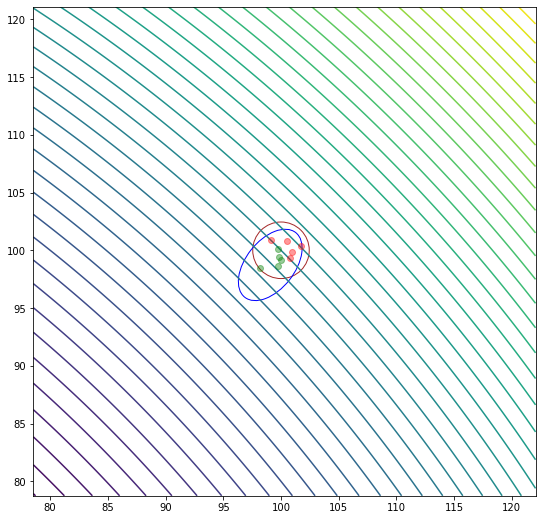

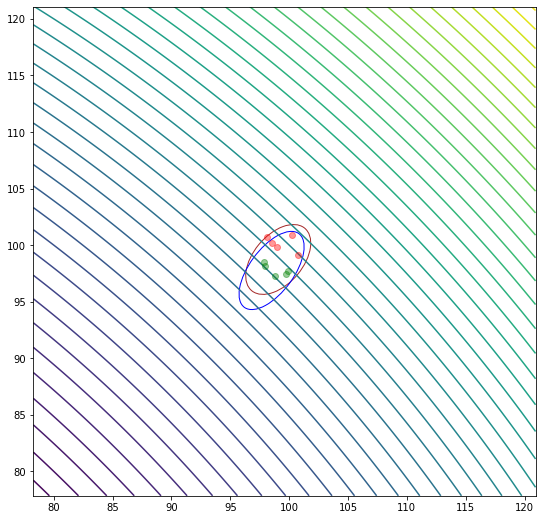

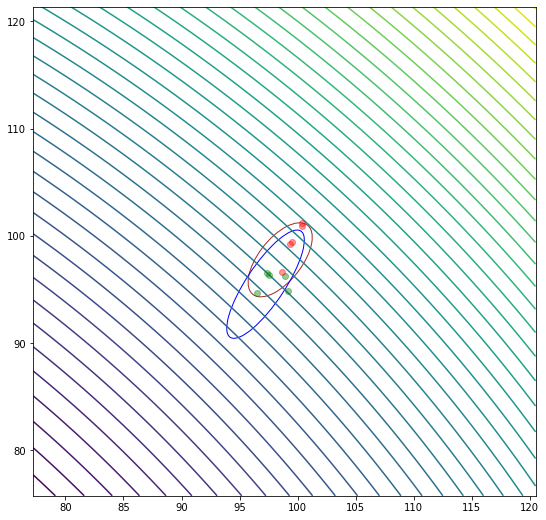

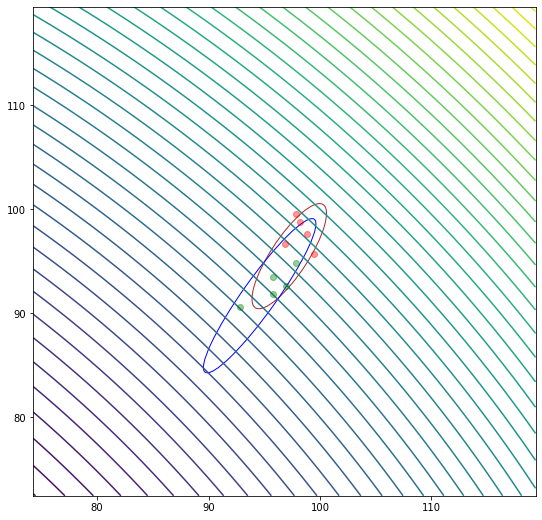

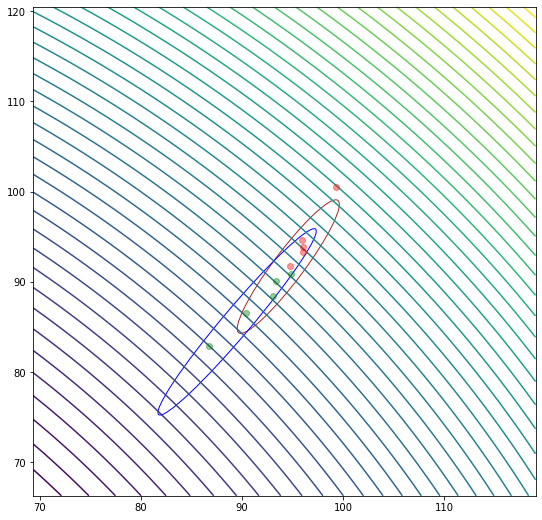

Best: [86.72862276 82.85227283], value: 14386.353119987818


In [110]:
optimize_and_show_progress(sphere_function, g = 5, d = 2, sigma = 1, popsize = 10)

Popsize: 10


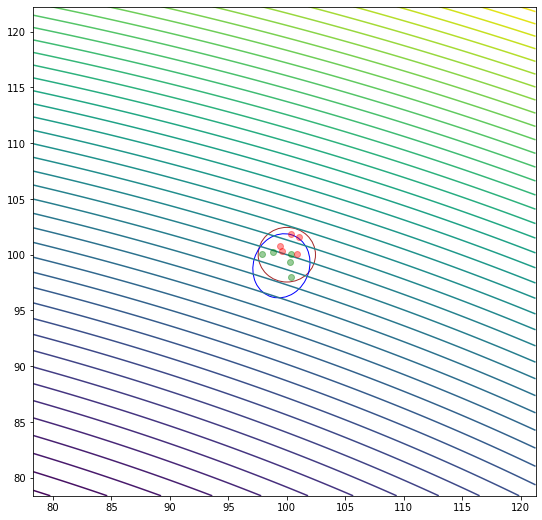

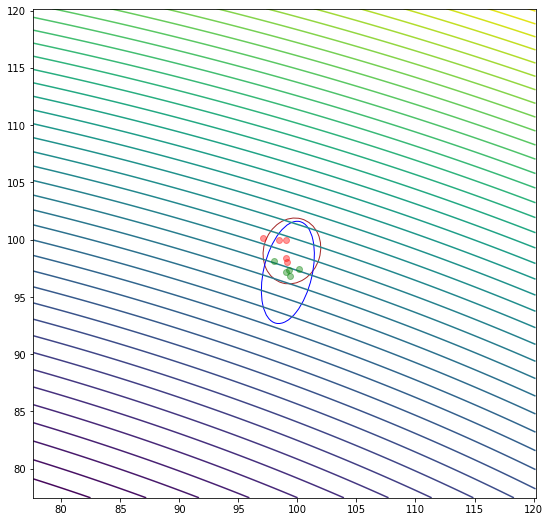

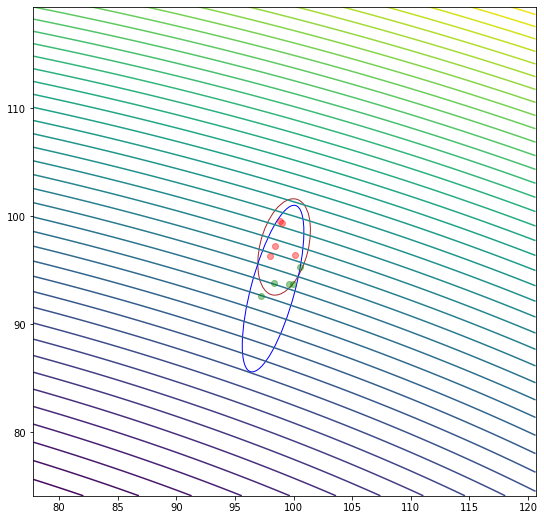

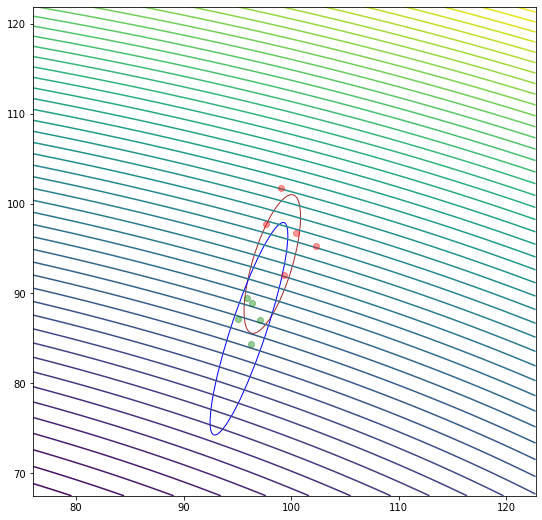

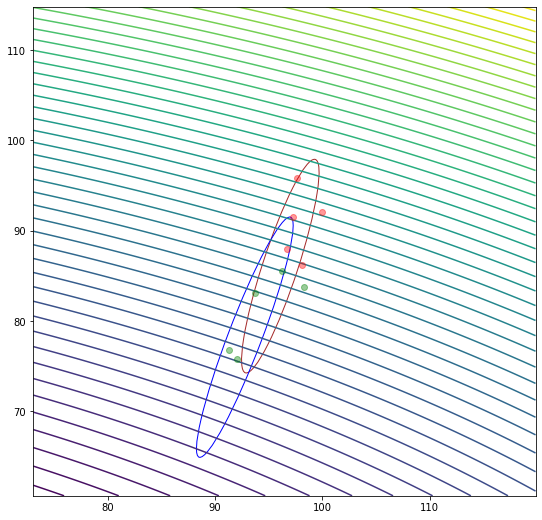

Best: [92.08444679 75.8191167 ], value: 25725.160713497335


In [224]:
optimize_and_show_progress(cigar_function, g = 5, d = 2, sigma = 1, popsize = 10)

Popsize: 10


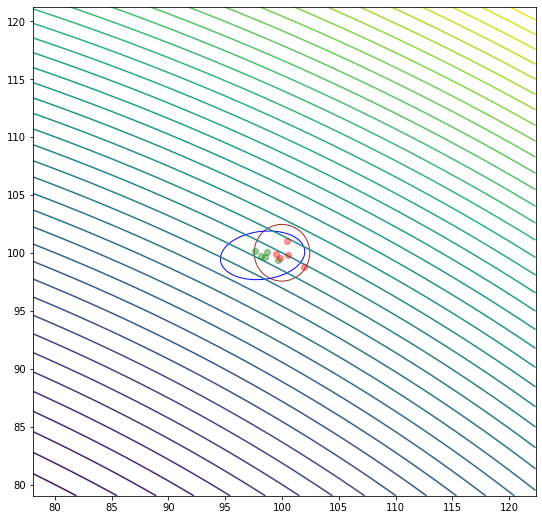

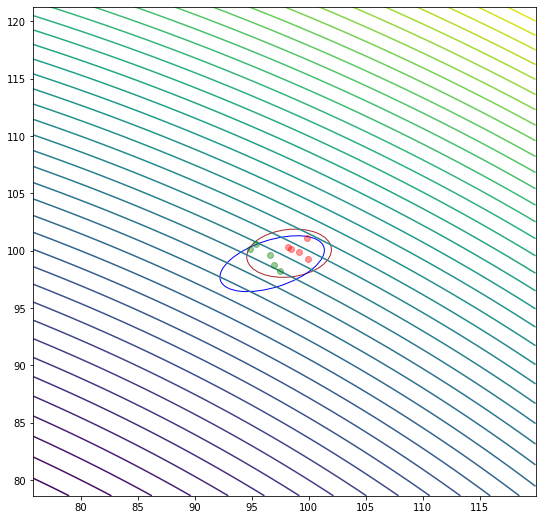

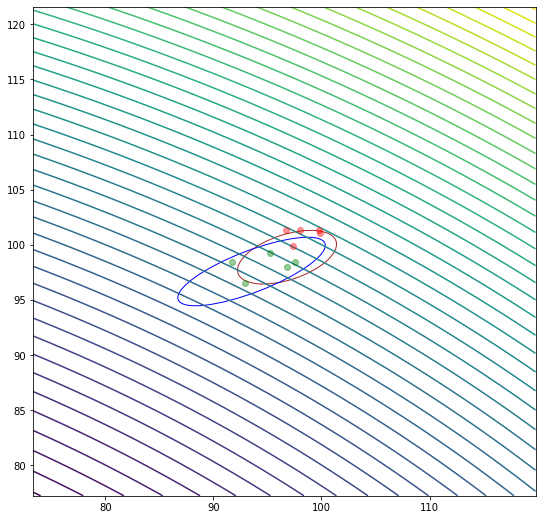

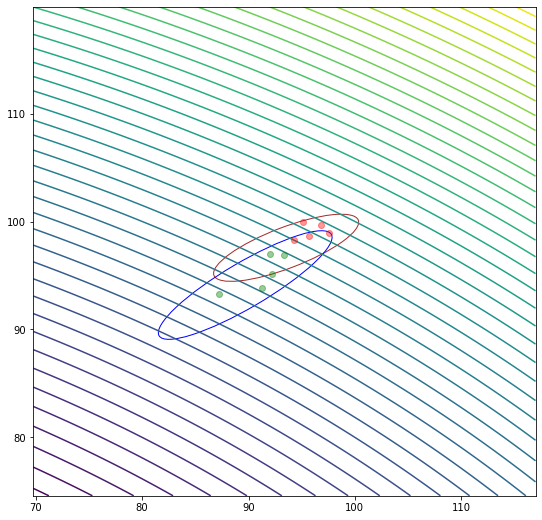

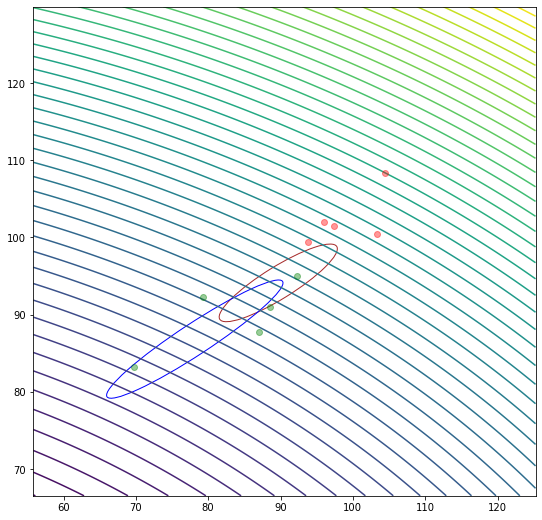

Best: [69.77741648 83.16069001], value: 18700.288576345167


In [225]:
optimize_and_show_progress(ellipsoid_function, g = 5, d = 2, sigma = 1, popsize = 10)

Popsize: 10


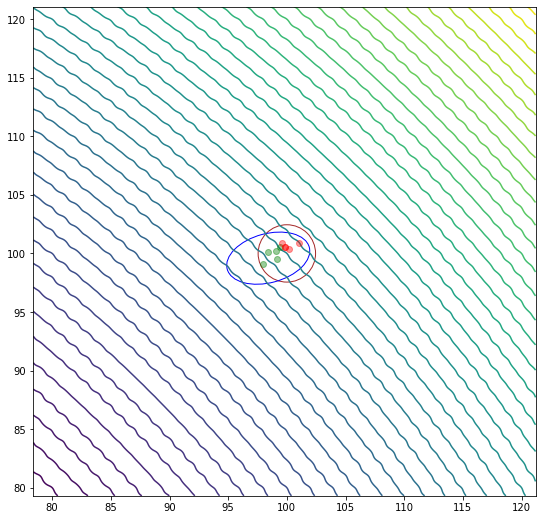

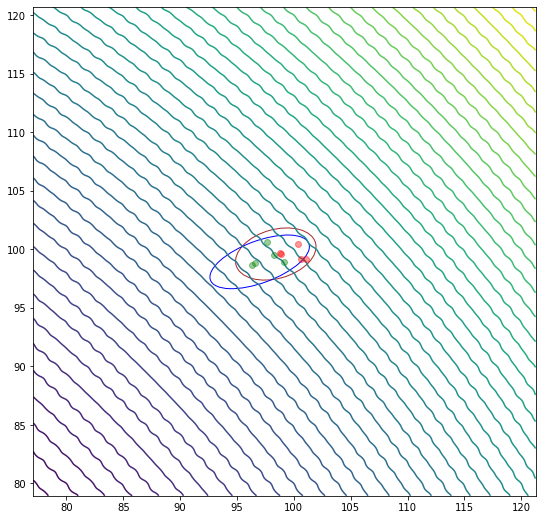

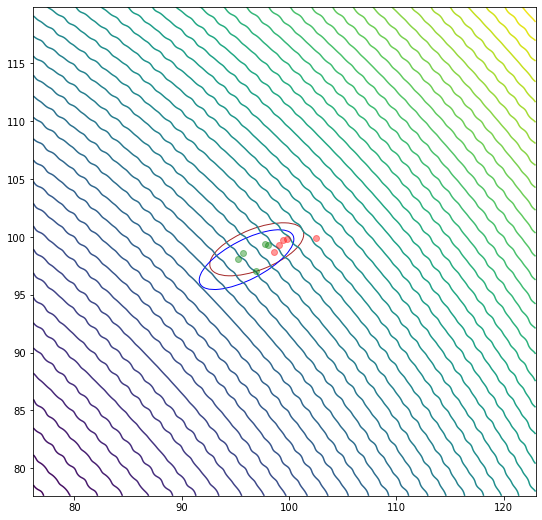

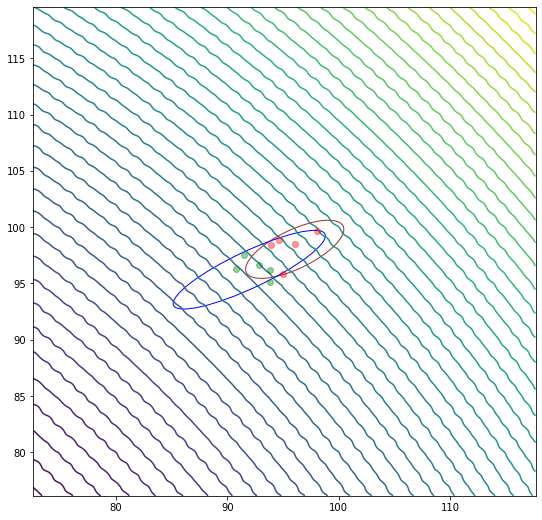

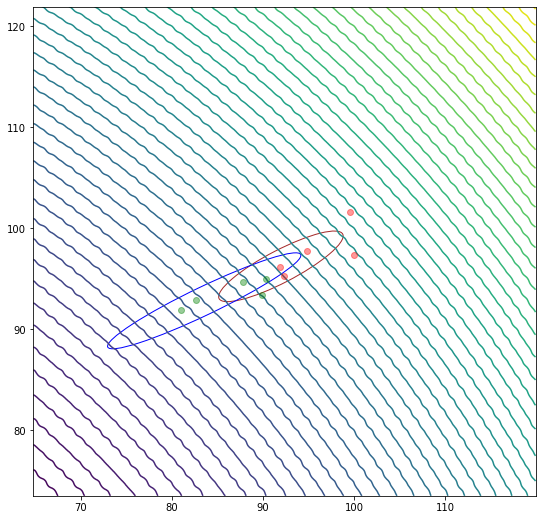

Best: [80.9973749  91.88830443], value: 15006.399804377766


In [226]:
optimize_and_show_progress(rastrigin_function, g = 5, d = 2, sigma = 1, popsize = 10)

# $(\mu + \lambda)$-ES

In [20]:
def es(objective_function, chromosome_length, population_size, number_of_iterations, number_of_offspring, number_of_parents, sigma, tau, tau_0, log_frequency=1):

    best_solution = np.empty((1, chromosome_length))
    best_solution_objective_value = 0.00

    log_objective_values = np.empty((number_of_iterations, 4))
    log_best_solutions = np.empty((number_of_iterations, chromosome_length))
    log_best_sigmas = np.empty((number_of_iterations, chromosome_length))

    # generating an initial population
    current_population_solutions = 100.0 * np.random.rand(population_size, chromosome_length)
    current_population_sigmas = sigma * np.ones((population_size, chromosome_length))

    # evaluating the objective function on the current population
    current_population_objective_values = objective_function(current_population_solutions)

    for t in range(number_of_iterations):

        # selecting the parent indices by the roulette wheel method
        fitness_values = current_population_objective_values - current_population_objective_values.min()
        if fitness_values.sum() > 0:
            fitness_values = fitness_values / fitness_values.sum()
        else:
            fitness_values = 1.0 / population_size * np.ones(population_size)
        parent_indices = np.random.choice(population_size, (number_of_offspring, number_of_parents), True, fitness_values).astype(np.int64)

        # creating the children population by Global Intermediere Recombination
        children_population_solutions = np.zeros((number_of_offspring, chromosome_length))
        children_population_sigmas = np.zeros((number_of_offspring, chromosome_length))
        for i in range(number_of_offspring):
            children_population_solutions[i, :] = current_population_solutions[parent_indices[i, :], :].mean(axis=0)
            children_population_sigmas[i, :] = current_population_sigmas[parent_indices[i, :], :].mean(axis=0)

        # mutating the children population by adding random gaussian noise
        children_population_sigmas = children_population_sigmas * np.exp(tau * np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1))
        children_population_solutions = children_population_solutions + children_population_sigmas * np.random.randn(number_of_offspring, chromosome_length)

        # evaluating the objective function on the children population
        children_population_objective_values = objective_function(children_population_solutions)

        # replacing the current population by (Mu + Lambda) Replacement
        current_population_objective_values = np.hstack([current_population_objective_values, children_population_objective_values])
        current_population_solutions = np.vstack([current_population_solutions, children_population_solutions])
        current_population_sigmas = np.vstack([current_population_sigmas, children_population_sigmas])

        I = np.argsort(current_population_objective_values)[::-1]
        current_population_solutions = current_population_solutions[I[:population_size], :]
        current_population_sigmas = current_population_sigmas[I[:population_size], :]
        current_population_objective_values = current_population_objective_values[I[:population_size]]

        # recording some statistics
        if best_solution_objective_value < current_population_objective_values[0]:
            best_solution = current_population_solutions[0, :]
            best_solution_objective_value = current_population_objective_values[0]
        log_objective_values[t, :] = [current_population_objective_values.min(), current_population_objective_values.max(), current_population_objective_values.mean(), current_population_objective_values.std()]
        log_best_solutions[t, :] = current_population_solutions[0, :]
        log_best_sigmas[t, :] = current_population_sigmas[0, :]

        if np.mod(t, log_frequency) == 0:
            print("Iteration %04d : best score = %0.8f, mean score = %0.8f." % (t, log_objective_values[:t+1, 1].max(), log_objective_values[t, 2]))

    return best_solution_objective_value, best_solution, log_objective_values, log_best_solutions, log_best_sigmas

# Benchmarks

## sphere_function

In [19]:
functions = [sphere_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    

df = pd.DataFrame(results)
# print("\n", df)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])
#     (func, x0, sigma, maxfevals, popsize, weights)
# (f, sigma = 1, d = 10, popsize = None)


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 176.01846450861956
Iteration   200: 0.3670201642623261
Iteration   300: 0.008002835712609038
Iteration   400: 1.4430449834717302e-05
Iteration   500: 1.3108648720624679e-07
Iteration   600: 5.95565938997472e-10
Iteration   700: 4.559661203052805e-12
Iteration   800: 9.72151193491311e-15
Iteration   900: 6.333194922079073e-17
Iteration  1000: 8.908057025717306e-19
Iteration  1100: 5.537692834206795e-21
Iteration  1200: 3.6637074517539375e-23
Iteration  1300: 9.799097709349872e-26
Best: [-4.56484207e-14  2.25294820e-14 -5.43076034e-14  2.01949499e-14
  3.43796531e-14]
Value: 7.130468204278354e-27

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 3.427200845876323e-05
Iteration   200: 3.959596979908394e-14
Iteration   300: 2.3746681393863195e-23
Best: [ 4.56540911e-14  1.38087384e-14  6.80338448e-14  2.73588956e-14
 -6.95480951e-14]
Value: 1.248902803085952e-26

D: 5 
Sigma: 1.0
Popsize: 100
Best: [ 3.27902800e-14 -4.48829703e-14 -6.47005313e-14 

Iteration  1800: 2.4048372461013228e-11
Iteration  1900: 5.612355752167421e-12
Iteration  2000: 7.404729574029936e-13
Iteration  2100: 1.084450725851898e-13
Iteration  2200: 1.5047062377217475e-14
Iteration  2300: 3.2560057197510925e-15
Iteration  2400: 3.365508140695306e-16
Iteration  2500: 4.3793112860318504e-17
Best: [ 1.59264236e-09 -1.51126084e-09 -4.80253614e-10 -8.25487958e-10
 -2.28973925e-09  1.98720243e-09 -2.24958641e-09 -6.02568620e-10
 -1.95254492e-09  1.58334656e-10 -1.29148141e-10 -6.54370282e-10
  2.64320009e-09 -3.38076582e-10 -1.74965936e-10 -1.83145192e-09
  2.59862527e-09  3.72204382e-10 -1.29571533e-09  3.26698833e-10]
Value: 4.3793112860318504e-17

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 65.78441100121879
Iteration   200: 0.03642613603896697
Iteration   300: 1.1888405300711169e-05
Iteration   400: 5.427791847760654e-09
Iteration   500: 4.336008401083355e-12
Best: [ 6.77903842e-08 -5.75298329e-07  8.18570387e-07  9.91041523e-08
  1.33461256e-07 -4.48583240e

Iteration   200: 110.40189338389423
Iteration   300: 18.662618315466663
Iteration   400: 16.470160576480737
Iteration   500: 2.848794259877473
Iteration   600: 0.909500733365138
Iteration   700: 0.14417621408928083
Iteration   800: 0.026359194625986612
Iteration   900: 0.009128560749065574
Iteration  1000: 0.0006747634936385128
Iteration  1100: 8.865195249088298e-05
Iteration  1200: 4.916724687323556e-05
Iteration  1300: 1.478717331630397e-05
Iteration  1400: 2.825838134371518e-06
Iteration  1500: 4.156967832143669e-07
Iteration  1600: 2.1404899388891175e-07
Iteration  1700: 3.5332650939138917e-08
Iteration  1800: 1.567392286775828e-08
Iteration  1900: 2.3586826353301264e-09
Iteration  2000: 5.281208820041764e-10
Iteration  2100: 1.6178307547287768e-10
Iteration  2200: 3.8038445561341875e-11
Iteration  2300: 1.1881980995412565e-11
Iteration  2400: 3.026882814663552e-12
Iteration  2500: 1.0321435387964664e-12
Iteration  2600: 7.718457233058534e-14
Iteration  2700: 3.405648178250664e-14


Iteration   100: 15436.494410392583
Iteration   200: 12090.990291764096
Iteration   300: 15237.658043768108
Iteration   400: 15376.419386915959
Iteration   500: 11427.14121797378
Iteration   600: 7388.17553599898
Iteration   700: 13415.266672147292
Iteration   800: 13551.610256989363
Iteration   900: 11280.962985636952
Iteration  1000: 10445.479530403249
Iteration  1100: 5843.920425024317
Iteration  1200: 7890.610346463164
Iteration  1300: 7066.105289599102
Iteration  1400: 9822.188919976641
Iteration  1500: 6409.816178580438
Iteration  1600: 7612.290283452856
Iteration  1700: 7770.897802325046
Iteration  1800: 5483.428586020753
Iteration  1900: 4855.008850834462
Iteration  2000: 3872.3367795957706
Iteration  2100: 4527.373304581938
Iteration  2200: 5454.659508410376
Iteration  2300: 3897.1446688061924
Iteration  2400: 3003.2357034704514
Iteration  2500: 3418.38575897123
Iteration  2600: 4037.1423362484384
Iteration  2700: 4104.937168716212
Iteration  2800: 2717.2665784855476
Iteration

Iteration  3200: 5.717754701967359e-16
Iteration  3300: 2.7023357985568983e-16
Iteration  3400: 6.402706057039331e-17
Iteration  3500: 6.860583731028568e-18
Iteration  3600: 3.021391563610613e-18
Iteration  3700: 5.862747826989373e-19
Iteration  3800: 1.4701786912079973e-19
Iteration  3900: 4.361422476873949e-20
Iteration  4000: 2.705702800157922e-21
Iteration  4100: 1.4992319666944626e-21
Iteration  4200: 1.5913161985125213e-22
Iteration  4300: 1.2175084588908033e-22
Iteration  4400: 1.7999710191936274e-23
Iteration  4500: 4.5590383179424834e-24
Iteration  4600: 1.192763623134764e-24
Iteration  4700: 4.980723040818433e-25
Iteration  4800: 4.174722236733241e-26
Best: [ 3.21952312e-14 -2.08194100e-14  5.63488799e-14 -1.69970595e-13
 -2.11890368e-15 -7.62970374e-16 -8.74266255e-14  5.70487217e-14
 -3.09676456e-15  8.63753827e-14]
Value: 5.190852008438294e-26

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 135.04995073619665
Iteration   200: 0.05330343467961567
Iteration   300: 6.49708969

Iteration  2800: 282026.8813171489
Iteration  2900: 194538.88247375406
Iteration  3000: 230519.8131391687
Iteration  3100: 303321.1071875323
Iteration  3200: 225726.31457486138
Iteration  3300: 191641.46229443004
Iteration  3400: 183300.75568378286
Iteration  3500: 172782.68203325963
Iteration  3600: 175696.31933407456
Iteration  3700: 212190.2127270869
Iteration  3800: 219904.32103381367
Iteration  3900: 113178.77218423058
Iteration  4000: 161793.42408865198
Iteration  4100: 124855.55727697074
Iteration  4200: 78138.10140046167
Iteration  4300: 104221.45121582734
Iteration  4400: 84717.52848159602
Iteration  4500: 123440.99233360622
Iteration  4600: 93538.03682525724
Iteration  4700: 68150.45906754097
Iteration  4800: 77235.25183463891
Iteration  4900: 74722.03346395255
Iteration  5000: 71870.71794464723
Iteration  5100: 41982.04414797683
Iteration  5200: 57824.55296205719
Iteration  5300: 51006.69332065333
Iteration  5400: 41340.03108737263
Iteration  5500: 53162.936897588304
Iterati

Popsize            6             20            100
D  Sigma                                          
5  1.0    7.130468e-27  1.248903e-26  9.188621e-27
   10.0   4.396585e-27  9.897474e-27  1.058897e-26
   100.0  2.013632e-26  1.133547e-26  1.056805e-26
10 1.0    4.753360e-26  1.967321e-26  1.779583e-26
   10.0   2.542051e-26  2.538928e-26  2.039260e-26
   100.0  5.190852e-26  1.698203e-26  2.060847e-26
20 1.0    4.347772e-12  4.379311e-17  4.336008e-12
   10.0   2.008674e-11  3.340590e-17  9.744280e-13
   100.0  3.628259e-09  2.174982e-15  8.782933e-12
50 1.0    2.880178e+00  7.649933e-01  1.852169e+01
   10.0   8.592538e+01  2.823402e+00  2.926587e+01
   100.0  1.019775e+04  1.517370e+02  6.126047e+02

In [35]:
functions = [sphere_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -11686.03605896, mean score = -11953.90242254.
Iteration 0100 : best score = -0.00586371, mean score = -0.00592650.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.000000

Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 5.485359408853653e-33

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -13587.26523305, mean score = -22740.78001937.
Iteration 0100 : best score = -0.01041075, mean score = -0.01183978.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 1.3159381971447473e-13

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -53809.78745545, mean score = -54158.08699652.
Iteration 0100 : best score = -4799.09767390, mean score = -4940.09413368.
Iteration 0200 : best score = -4094.54683283, mean score = -4095.17837302.
Iteration 0300 : b

Iteration 3700 : best score = -2607.69690752, mean score = -2607.70749225.
Iteration 3800 : best score = -2605.76312740, mean score = -2605.81730831.
Iteration 3900 : best score = -2595.46539341, mean score = -2595.57914365.
Iteration 4000 : best score = -2552.50619572, mean score = -2553.69452381.
Iteration 4100 : best score = -2511.03723131, mean score = -2511.03897587.
Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e-05
  9.52248232e-07 1.51181215e-05 7.70167599e-08 6.80848207e-11
  1.12504675e-05 5.42570883e-08 6.96627900e-07 1.31252686e-16
  4.36485178e-11 7.88328495e-17 6.68399624e-11 6.18932394e-12
  1.88082760e-05 7.11382186e-14 4.34173455e-12 2.63874593e-09
  1.45221368e-04 3.10851240e-09 1.51372679e-08 2.60854268e-05
  3.65083463e-13 5.34890614e-05 3.99462126e-09 8.98752118e-12

Iteration 0100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[0.0e+000 4.4e-323 4.4e-323 4.4e-323 4.4e-323]]
Value: 9.626574758536387e-44

D: 10 
Sigma: 10.0 
Popsize: 6
Iteration 0000 : best score = -23085.37283914, mean score = -24799.93617048.
Iteration 0100 : best score = -43.23484117, mean score = -43.25478826.
Iteration 0200 : best score = -2.00798035, mean score = -2.01570371.
Iteration 0300 : best score = -1.96170761, mean score = -1.96171174.
Iteration 0400 : best score = -0.18804890, mean score = -0.22210680.
Iteration 0500 : best score = -0.00331593, mean score = -0.00348315.
Iteration 0600 : best score = -0.00280655, mean score = -0.00280655.
Iteration 0700 : best score = -0.00000837, mean score = -0.00000886.
Iteration 0800 : best score = -0.00000021, mean score = -0.00000021.
Iteration 0900 : best score = -0.00000002, mean score = -0.00000002.
Iteration 1000 : best score = -0.00000002, mea

Iteration 0300 : best score = -2.54379459, mean score = -2.55015437.
Iteration 0400 : best score = -2.35689863, mean score = -2.35695299.
Iteration 0500 : best score = -2.26767726, mean score = -2.26788725.
Iteration 0600 : best score = -2.26446215, mean score = -2.26460370.
Iteration 0700 : best score = -2.18111448, mean score = -2.18111842.
Iteration 0800 : best score = -2.18043165, mean score = -2.18043440.
Iteration 0900 : best score = -2.18027198, mean score = -2.18028422.
Iteration 1000 : best score = -0.10226570, mean score = -0.10577485.
Iteration 1100 : best score = -0.07615363, mean score = -0.07624100.
Iteration 1200 : best score = -0.07457186, mean score = -0.07457193.
Best: [[0.2028008  0.12764372 0.12381849 0.10887459 0.07996891 0.07186164
  0.0475133  0.04380826 0.03805594 0.03765113 0.02888857 0.01997045
  0.01725533 0.01698323 0.01304874 0.00918254 0.00704737 0.00316932
  0.00245765 0.        ]]
Value: 0.07454868874254365

D: 20 
Sigma: 10.0 
Popsize: 100
Iteration 000

Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1900 : best score = -0.0

Iteration 0100 : best score = -0.00020206, mean score = -0.00051838.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 5.883587042820066e-14

D: 20 
Sigma: 100 
Popsize: 6
Iteration 0000 : best score = -47087.53516220, mean score = -68961.00016558.
Iteration 0100 : best score = -682.88597880, mean score = -701.11285349.
Iteration 0200 : best score = -107.62235212, mean score = -112.02780051.
Iteration 0300 : best score = -42.57496402, mean score = -42.85120962.
Iteration 0400 : best score = -16.79094511, mean score = -17.02526944.
Iteration 0500 : best score = -12.95739974, mean score = -12.97386814.
Iteration 0600 : best score = -11.00655698, mean score = -11.00901313.
Iteration 0700 : best score = -10.96220351, mean score = -10.96256684.
Iteration 0800 : best score = -10.65319050, mean s

Iteration 4000 : best score = -6498.60542437, mean score = -6498.91072402.
Iteration 4100 : best score = -6456.36406814, mean score = -6457.03634260.
Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e-05
  9.52248232e-07 1.51181215e-05 7.70167599e-08 6.80848207e-11
  1.12504675e-05 5.42570883e-08 6.96627900e-07 1.31252686e-16
  4.36485178e-11 7.88328495e-17 6.68399624e-11 6.18932394e-12
  1.88082760e-05 7.11382186e-14 4.34173455e-12 2.63874593e-09
  1.45221368e-04 3.10851240e-09 1.51372679e-08 2.60854268e-05
  3.65083463e-13 5.34890614e-05 3.99462126e-09 8.98752118e-12
  9.43438430e-06 2.13111495e-11 2.03389519e-06 1.16709838e-09
  7.55644913e-07 1.32989660e-05 6.66261208e-05 8.80122079e-07
  5.12027691e-07 5.64813636e-06]]
Value: 6393.081939681984

D: 50 
Sigma: 100 
Popsize: 20
Iteration

Popsize             6              20            100
D  Sigma                                            
5  1.0    2.605118e-250  1.003127e-144  2.228956e-40
   10.0   7.350188e-240  6.163383e-150  9.626575e-44
   100.0  1.246256e-236  6.906549e-147  1.176027e-41
10 1.0     4.312462e-12   5.485359e-33  1.315938e-13
   10.0    7.741827e-27   8.578846e-24  2.879430e-11
   100.0   3.907587e-24   4.662352e-29  5.883587e-14
20 1.0     1.777061e-02   1.888066e+00  6.514088e+00
   10.0    1.602739e-02   7.454869e-02  2.188972e-03
   100.0   8.138974e-02   4.872516e-02  1.905481e-02
50 1.0     2.510840e+03   1.893059e+01  5.323411e+02
   10.0    1.234880e+03   3.690706e+01  1.829087e+02
   100.0   6.393082e+03   5.771443e+01  3.162534e+02

## ellipsoid_function

In [22]:
functions = [ellipsoid_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 132.257431878498
Iteration   200: 0.9405558295205958
Iteration   300: 0.010398240284022059
Iteration   400: 1.6429774860220063e-05
Iteration   500: 4.4583347867457183e-07
Iteration   600: 6.846856485984566e-10
Iteration   700: 8.575817410925746e-12
Iteration   800: 6.205816748011241e-14
Iteration   900: 4.404721724873174e-16
Iteration  1000: 1.4249150119784099e-18
Iteration  1100: 5.87819701361764e-21
Iteration  1200: 9.582555991823538e-24
Iteration  1300: 8.908864318256141e-26
Best: [ 5.29614769e-14  2.16030220e-14  2.50193527e-14 -4.50372044e-16
 -6.25191183e-16]
Value: 4.246285072504257e-27

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 0.00017462878393151882
Iteration   200: 9.991310940328895e-13
Iteration   300: 3.3707120191479197e-22
Best: [ 6.35505665e-14 -7.38970043e-14  3.68681322e-16 -1.39275120e-15
 -1.62831680e-14]
Value: 1.1066395387083772e-26

D: 5 
Sigma: 1.0
Popsize: 100
Best: [ 4.22551644e-14 -1.16162168e-14  5.92788050e-15

Iteration  1900: 1.0128532024549991e-11
Iteration  2000: 9.195658491095668e-13
Iteration  2100: 1.686036627514607e-13
Iteration  2200: 3.797693493075998e-14
Iteration  2300: 3.4305165916869923e-15
Iteration  2400: 3.5567723833957924e-16
Iteration  2500: 1.1047554432507342e-16
Best: [ 6.01643638e-10 -1.70157710e-10  9.60552629e-10  2.05923720e-09
 -8.12847037e-10 -4.90425335e-10  2.80635551e-09 -1.06577065e-09
  9.07213735e-10 -1.52472390e-09 -1.87506892e-09 -2.92311796e-09
 -5.71628106e-10  1.74394262e-09  1.08830285e-09  1.13968151e-09
  2.40564081e-09  1.37640114e-09  4.26549926e-09  2.37552376e-09]
Value: 1.1047554432507342e-16

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 107.30100074867204
Iteration   200: 0.05894308609545722
Iteration   300: 2.3254495286923174e-05
Iteration   400: 8.682170441510793e-09
Iteration   500: 8.011159916466013e-12
Best: [-6.05267599e-07  8.77879637e-09 -4.85394595e-07 -3.32862824e-07
  3.62123087e-07 -5.29798251e-07  4.02217463e-07  9.28367188e-07
  

Iteration   300: 33.19799768819473
Iteration   400: 7.446937451200618
Iteration   500: 4.450759075641621
Iteration   600: 0.2279497054084927
Iteration   700: 0.10758574976054575
Iteration   800: 0.018222918640531
Iteration   900: 0.0033108760179361165
Iteration  1000: 0.0011403061328403206
Iteration  1100: 0.00027156238789353173
Iteration  1200: 6.836291452601378e-05
Iteration  1300: 8.782326275623345e-06
Iteration  1400: 1.027210909897713e-06
Iteration  1500: 4.6934405028880136e-07
Iteration  1600: 7.836554426744184e-08
Iteration  1700: 2.2636080798842104e-08
Iteration  1800: 5.882220783445728e-09
Iteration  1900: 1.056993536583294e-09
Iteration  2000: 1.6783604575422685e-10
Iteration  2100: 6.518271183897207e-11
Iteration  2200: 1.2879904357048202e-11
Iteration  2300: 2.308529459447421e-12
Iteration  2400: 6.153621479720367e-13
Iteration  2500: 1.7830378001988145e-13
Iteration  2600: 2.0825030684706593e-14
Iteration  2700: 5.260614396694931e-15
Iteration  2800: 1.9699269584143854e-15

Iteration   200: 18446.282810343113
Iteration   300: 20711.357147631814
Iteration   400: 26643.7749010253
Iteration   500: 17679.84951694739
Iteration   600: 18377.086255824306
Iteration   700: 18525.198856679668
Iteration   800: 20918.92907231198
Iteration   900: 11841.145758092911
Iteration  1000: 14962.129387358058
Iteration  1100: 11183.981742140175
Iteration  1200: 8717.069001927537
Iteration  1300: 10009.362806936972
Iteration  1400: 11308.81527200674
Iteration  1500: 12974.880288088405
Iteration  1600: 7356.373729078543
Iteration  1700: 6980.450107304083
Iteration  1800: 9103.524846358538
Iteration  1900: 8602.206639684895
Iteration  2000: 8079.5622498089115
Iteration  2100: 6834.711345994326
Iteration  2200: 8330.43630269178
Iteration  2300: 6396.284253444617
Iteration  2400: 7631.983350933156
Iteration  2500: 6562.602924953762
Iteration  2600: 4728.061970307038
Iteration  2700: 3805.9702714853993
Iteration  2800: 4113.260283455675
Iteration  2900: 4481.8751575634315
Iteration 

Iteration  3600: 1.0337574140315074e-18
Iteration  3700: 1.7681339004666258e-19
Iteration  3800: 6.552923860936983e-20
Iteration  3900: 6.930328896232828e-21
Iteration  4000: 3.13363763410593e-21
Iteration  4100: 6.678167221917982e-22
Iteration  4200: 1.5964868598983225e-22
Iteration  4300: 4.651371897755604e-23
Iteration  4400: 3.5039244671402615e-24
Iteration  4500: 3.524087119905396e-24
Iteration  4600: 3.8963703408614655e-25
Iteration  4700: 2.3533340728278973e-25
Best: [ 1.01513628e-13  6.85720732e-14  2.97378062e-14 -2.50415570e-14
 -3.17687764e-14  8.91835296e-15  3.49478588e-15 -1.30384882e-14
  1.64584662e-15  4.73133055e-14]
Value: 2.348852366215177e-26

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 110.48437129401022
Iteration   200: 0.07600768189072574
Iteration   300: 0.00012321574395342225
Iteration   400: 1.2174307064538256e-07
Iteration   500: 1.4258774438060742e-10
Iteration   600: 3.3733957258931853e-13
Iteration   700: 2.709398598591752e-16
Iteration   800: 5.171228

Iteration  3500: 248495.7674412054
Iteration  3600: 197323.57073271883
Iteration  3700: 212709.50148700172
Iteration  3800: 171054.86874726307
Iteration  3900: 192469.41656748648
Iteration  4000: 146664.3507240337
Iteration  4100: 153091.7191870074
Iteration  4200: 152334.4935294314
Iteration  4300: 155854.09904661193
Iteration  4400: 86265.61884990391
Iteration  4500: 126289.32909272781
Iteration  4600: 120877.28659689268
Iteration  4700: 95378.73780613887
Iteration  4800: 121392.41632484955
Iteration  4900: 82614.70904795035
Iteration  5000: 89449.48329338367
Iteration  5100: 79162.79446043164
Iteration  5200: 79315.733517809
Iteration  5300: 75266.9297738061
Iteration  5400: 76733.9153821565
Iteration  5500: 90203.37418705206
Iteration  5600: 62138.8435413405
Iteration  5700: 52449.37125762714
Iteration  5800: 43148.42289977542
Iteration  5900: 50112.88839508726
Iteration  6000: 36604.16287465546
Iteration  6100: 44754.988864582636
Iteration  6200: 36640.3725165612
Iteration  6300: 

Popsize            6             20            100
D  Sigma                                          
5  1.0    4.246285e-27  1.106640e-26  4.977150e-27
   10.0   2.519904e-26  2.145591e-26  5.826265e-27
   100.0  1.948573e-26  4.993671e-27  1.070992e-26
10 1.0    6.383634e-26  3.995525e-26  2.921389e-26
   10.0   2.925068e-26  1.674367e-26  2.337700e-26
   100.0  2.348852e-26  2.845410e-26  2.612356e-26
20 1.0    5.705406e-12  1.104755e-16  8.011160e-12
   10.0   3.954328e-11  9.411347e-17  1.815040e-12
   100.0  2.269366e-09  1.964232e-15  1.178600e-11
50 1.0    3.513781e+00  8.366232e-01  3.447244e+01
   10.0   9.082637e+01  3.715359e+00  5.393480e+01
   100.0  1.252639e+04  2.128454e+02  7.920308e+02

In [36]:
functions = [ellipsoid_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -18624.08676963, mean score = -19450.80270402.
Iteration 0100 : best score = -0.00672024, mean score = -0.00675169.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.000000

Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 1.3092654898183613e-26

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -19653.12817974, mean score = -30381.61921522.
Iteration 0100 : best score = -0.00053677, mean score = -0.00056765.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 4.802165116250509e-12

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -58960.70966102, mean score = -60885.38919845.
Iteration 0100 : best score = -1202.79374038, mean score = -1205.24480419.
Iteration 0200 : best score = -845.72466352, mean score = -846.48699993.
Iteration 0300 : bes

Iteration 3500 : best score = -5426.53024674, mean score = -5426.53664767.
Iteration 3600 : best score = -5426.01129035, mean score = -5426.01190567.
Iteration 3700 : best score = -5425.01301062, mean score = -5425.02143027.
Iteration 3800 : best score = -5421.22177967, mean score = -5421.26588895.
Iteration 3900 : best score = -5416.46490880, mean score = -5416.65701149.
Iteration 4000 : best score = -5190.84408750, mean score = -5198.14548168.
Iteration 4100 : best score = -4381.26843812, mean score = -4392.58726475.
Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e-05
  9.52248232e-07 1.51181215e-05 7.70167599e-08 6.80848207e-11
  1.12504675e-05 5.42570883e-08 6.96627900e-07 1.31252686e-16
  4.36485178e-11 7.88328495e-17 6.68399624e-11 6.18932394e-12
  1.88082760e-05 7.11382186e-14 4.3

Iteration 0100 : best score = -398.93754009, mean score = -403.74182454.
Iteration 0200 : best score = -4.21319660, mean score = -4.29725944.
Iteration 0300 : best score = -1.19040178, mean score = -1.33026880.
Iteration 0400 : best score = -0.05870285, mean score = -0.05939637.
Iteration 0500 : best score = -0.05570477, mean score = -0.05575017.
Iteration 0600 : best score = -0.05460434, mean score = -0.05460499.
Iteration 0700 : best score = -0.05431977, mean score = -0.05434598.
Iteration 0800 : best score = -0.01058649, mean score = -0.01058774.
Iteration 0900 : best score = -0.01053432, mean score = -0.01053479.
Iteration 1000 : best score = -0.01017052, mean score = -0.01022257.
Iteration 1100 : best score = -0.00008258, mean score = -0.00008382.
Iteration 1200 : best score = -0.00003131, mean score = -0.00003147.
Best: [[3.17361280e-01 1.03068406e-01 8.66161631e-02 8.38658940e-02
  8.25543828e-02 4.90157888e-02 4.19656159e-02 3.92296416e-02
  3.70507739e-02 3.27673365e-02 2.8483

Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1700 : best score = -0.0

Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 1.3047930879270012e-35

D: 10 
Sigma: 100 
Popsize: 100
Iteration 0000 : best score = -18206.39747228, mean score = -43053.37903138.
Iteration 0100 : best score = -0.00016852, mean score = -0.00026647.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 2.2281979309419265e-14

D: 20 
Sigma: 100 
Popsize: 6
Iteration 0000 : best score = -73697.50507583, mean score = -85372.77459594.
Iteration 0100 : best score = -1691.63856895, mean score = -1725.01462970.
Iteration 0200 : best score = -908.50589621, mean score = -910.51102003.
Iteration 0300 : be

Iteration 3500 : best score = -1205.39766363, mean score = -1205.39956042.
Iteration 3600 : best score = -1205.35202220, mean score = -1205.35202947.
Iteration 3700 : best score = -1205.35066792, mean score = -1205.35068464.
Iteration 3800 : best score = -1205.34836810, mean score = -1205.34838777.
Iteration 3900 : best score = -1205.34596917, mean score = -1205.34599843.
Iteration 4000 : best score = -1205.34455007, mean score = -1205.34459033.
Iteration 4100 : best score = -1205.32508905, mean score = -1205.32594858.
Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e-05
  9.52248232e-07 1.51181215e-05 7.70167599e-08 6.80848207e-11
  1.12504675e-05 5.42570883e-08 6.96627900e-07 1.31252686e-16
  4.36485178e-11 7.88328495e-17 6.68399624e-11 6.18932394e-12
  1.88082760e-05 7.11382186e-14 4.3

Popsize             6              20            100
D  Sigma                                            
5  1.0    2.523345e-216  8.601202e-139  2.901589e-40
   10.0   2.048377e-253  5.957533e-133  7.315046e-42
   100.0  3.120681e-226  1.399288e-132  5.524433e-43
10 1.0     5.067031e-37   1.309265e-26  4.802165e-12
   10.0    3.397814e-23   5.346891e-29  4.547670e-16
   100.0   2.486422e-29   1.304793e-35  2.228198e-14
20 1.0     3.058515e-03   3.189051e-02  5.875750e-01
   10.0    2.055044e-03   3.066028e-05  3.448986e-02
   100.0   1.898784e-01   1.033581e-01  1.423376e-01
50 1.0     1.582716e+03   1.646963e+02  1.043331e+03
   10.0    2.770382e+03   2.545393e+02  2.004804e+03
   100.0   1.205321e+03   1.948542e+02  2.161757e+03

## rastrigin_function

In [23]:
functions = [rastrigin_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 287.6487954762697
Iteration   200: 44.18305275103882
Iteration   300: 36.601301089543405
Iteration   400: 13.261023743086938
Iteration   500: 10.957648294742796
Iteration   600: 10.94460076399956
Iteration   700: 10.944539864831249
Iteration   800: 10.944539554038712
Iteration   900: 10.944539552400173
Iteration  1000: 10.944539552388093
Iteration  1100: 10.94453955238805
Iteration  1200: 10.944539552388044
Iteration  1300: 10.94453955238805
Iteration  1400: 10.94453955238805
Iteration  1500: 10.94453955238805
Iteration  1600: 10.94453955238805
Iteration  1700: 10.94453955238805
Iteration  1800: 10.94453955238805
Iteration  1900: 10.94453955238805
Iteration  2000: 10.94453955238805
Iteration  2100: 10.944539552388058
Iteration  2200: 10.94453955238805
Iteration  2300: 10.94453955238805
Iteration  2400: 10.94453955238805
Iteration  2500: 10.94453955238805
Iteration  2600: 10.94453955238805
Iteration  2700: 10.944539552388058
Iteration  2800:

Iteration  2700: 234.3705426482278
Iteration  2800: 241.3714615833286
Iteration  2900: 231.13258766965708
Iteration  3000: 243.22104709942744
Iteration  3100: 205.27297339392123
Iteration  3200: 151.85149234036916
Iteration  3300: 138.37309401124517
Iteration  3400: 117.8548116052362
Iteration  3500: 130.4035180538839
Iteration  3600: 114.88206173742216
Iteration  3700: 119.9496499992496
Iteration  3800: 102.69810285786266
Iteration  3900: 97.91557484318218
Iteration  4000: 99.85973601091212
Iteration  4100: 91.86246447384545
Iteration  4200: 91.46898561840561
Iteration  4300: 90.18691926523616
Iteration  4400: 89.79089217427335
Iteration  4500: 89.3231699119026
Iteration  4600: 88.94571658544908
Iteration  4700: 88.86593264979922
Iteration  4800: 88.92311941180898
Iteration  4900: 88.6524131510468
Iteration  5000: 88.62960715800324
Iteration  5100: 88.64894358295626
Iteration  5200: 88.60406291206428
Iteration  5300: 88.58414374960324
Iteration  5400: 88.58080114035863
Iteration  5500

Iteration  1000: 8.954621438201457
Iteration  1100: 8.954621438201457
Iteration  1200: 8.954621438201457
Iteration  1300: 8.954621438201457
Iteration  1400: 8.954621438201457
Iteration  1500: 8.954621438201457
Iteration  1600: 8.954621438201457
Iteration  1700: 8.954621438201457
Iteration  1800: 8.954621438201457
Iteration  1900: 8.954621438201457
Iteration  2000: 8.954621438201457
Iteration  2100: 8.954621438201457
Iteration  2200: 8.954621438201457
Iteration  2300: 8.954621438201457
Iteration  2400: 8.954621438201457
Iteration  2500: 8.954621438201457
Best: [-1.98991223e+00 -1.16684495e-09  1.60981206e-09  2.07535768e-09
  9.94958637e-01 -1.98991223e+00 -1.27006423e-09 -1.12063580e-09
 -1.44307409e-09  9.67140080e-10]
Value: 8.954621438201457

D: 10 
Sigma: 10.0
Popsize: 100
Iteration   100: 6.569125478259608
Iteration   200: 0.9949590571022213
Iteration   300: 0.9949590570932685
Iteration   400: 0.9949590570932827
Iteration   500: 0.9949590570932685
Best: [-9.94958638e-01 -3.6970509

Iteration  5300: 1365.7916451558403
Iteration  5400: 981.1580053686199
Iteration  5500: 1113.0626777640882
Iteration  5600: 1263.4660769223367
Iteration  5700: 1026.322672014811
Iteration  5800: 1028.520782592977
Iteration  5900: 1220.0229115125273
Iteration  6000: 965.407652240682
Iteration  6100: 1326.6290586916732
Iteration  6200: 1003.9008524336442
Iteration  6300: 980.5843397410832
Iteration  6400: 932.1919674114682
Iteration  6500: 861.7798208878972
Iteration  6600: 891.9701800086141
Iteration  6700: 824.8406974627206
Iteration  6800: 882.6813945130617
Iteration  6900: 869.0108807941749
Iteration  7000: 1055.9464857997584
Iteration  7100: 752.0604124363645
Iteration  7200: 844.0537888851981
Iteration  7300: 1067.9149594161947
Iteration  7400: 836.8544466973686
Iteration  7500: 849.2553330426786
Iteration  7600: 842.9096685352374
Iteration  7700: 829.2917919982549
Iteration  7800: 782.3474616184574
Iteration  7900: 797.1820490564285
Iteration  8000: 681.6972761951234
Iteration  81

Iteration  2100: 12.93453640661484
Iteration  2200: 12.934545283525068
Iteration  2300: 12.93448708665997
Iteration  2400: 12.934466797959885
Iteration  2500: 12.93445928643159
Iteration  2600: 12.934457900795309
Iteration  2700: 12.934457731127296
Iteration  2800: 12.93445768364657
Iteration  2900: 12.934457670425815
Iteration  3000: 12.934457667886846
Iteration  3100: 12.934457666732342
Iteration  3200: 12.934457666613909
Iteration  3300: 12.934457666584237
Iteration  3400: 12.934457666576876
Iteration  3500: 12.93445766657564
Iteration  3600: 12.934457666574758
Iteration  3700: 12.934457666574659
Iteration  3800: 12.934457666574659
Iteration  3900: 12.934457666574644
Iteration  4000: 12.93445766657463
Iteration  4100: 12.93445766657463
Iteration  4200: 12.93445766657463
Iteration  4300: 12.93445766657463
Iteration  4400: 12.93445766657463
Iteration  4500: 12.93445766657463
Iteration  4600: 12.93445766657463
Iteration  4700: 12.93445766657463
Iteration  4800: 12.93445766657463
Iterat

Iteration   100: 312.5097015615188
Iteration   200: 114.58055041960642
Iteration   300: 127.04374865421748
Iteration   400: 5.849637519700877
Iteration   500: 4.975228619686078
Best: [ 1.68369844e-04 -1.34856399e-04 -2.31201519e-04  3.12871905e-04
 -1.31635664e-04 -4.19462223e-04  7.51723886e-05 -5.20474590e-05
  9.94820530e-01 -4.11156958e-06  9.94153683e-01 -6.12630016e-05
 -3.14755589e-04  9.94739588e-01 -9.94484930e-01 -9.95424530e-01
 -6.57667033e-04  1.46715519e-04 -1.16183856e-04  2.41824521e-04]
Value: 4.975228619686078

D: 50 
Sigma: 100
Popsize: 6
Iteration   100: 1359787.1042493512
Iteration   200: 1210767.9495786543
Iteration   300: 956531.8687579029
Iteration   400: 1232404.4912845094
Iteration   500: 1385893.7399581212
Iteration   600: 1853055.232881444
Iteration   700: 1064383.0495862835
Iteration   800: 912009.0942509212
Iteration   900: 653985.2019557409
Iteration  1000: 998367.6660369353
Iteration  1100: 740861.2282902864
Iteration  1200: 622844.1223309205
Iteration  

Popsize           6           20           100
D  Sigma                                      
5  1.0      10.944540    0.994959     0.000000
   10.0      5.969749    0.994959     0.994959
   100.0     5.969749    0.994959     0.000000
10 1.0      35.818445    5.969754     0.994959
   10.0     26.863829    8.954621     0.994959
   100.0    12.934458    5.969754     0.000000
20 1.0      88.550666   26.863854     2.985426
   10.0     36.813439   13.929422     6.965034
   100.0    47.758828   12.934463     4.975229
50 1.0     724.126123  433.678713   457.684546
   10.0    927.438947  497.436691   473.852475
   100.0  9155.467035  705.097084  1164.361390

In [26]:
functions = [rastrigin_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 50]
popsizes = [50, 100, 150]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 50
Iteration   100: 0.9949591687905084
Iteration   200: 0.9949590570932827
Iteration   300: 0.9949590570932827
Iteration   400: 0.9949590570932827
Iteration   500: 0.9949590570932827
Iteration   600: 0.9949590570932827
Iteration   700: 0.9949590570932827
Iteration   800: 0.9949590570932827
Iteration   900: 0.9949590570932827
Best: [-1.10851293e-09 -9.94958639e-01 -4.28062421e-10  3.06959841e-10
 -1.28743664e-10]
Value: 0.9949590570932827

D: 5 
Sigma: 1.0
Popsize: 100
Iteration   100: 0.0
Iteration   200: 0.0
Iteration   300: 0.0
Iteration   400: 0.0
Iteration   500: 0.0
Best: [ 1.88248439e-10  2.44978958e-10 -8.31160676e-11  9.00127382e-10
 -1.19596575e-10]
Value: 0.0

D: 5 
Sigma: 1.0
Popsize: 150
Iteration   100: 0.0
Iteration   200: 0.0
Iteration   300: 0.0
Best: [ 5.57304559e-10  1.37191094e-09  1.24584918e-10 -9.60032311e-12
 -2.34705008e-10]
Value: 0.0

D: 10 
Sigma: 1.0
Popsize: 50
Iteration   100: 71.35592741228668
Iteration   200: 4.87526023396174
I

Iteration   500: 0.0
Best: [-7.37230057e-10  9.92898268e-10 -1.85195243e-09  3.28421714e-09
 -1.39359182e-09 -1.24074728e-09 -2.62845762e-09  3.48675764e-09
  4.79174472e-11 -5.36720721e-09]
Value: 0.0

D: 10 
Sigma: 10.0
Popsize: 150
Iteration   100: 1.0043697702322874
Iteration   200: 0.9949590570932685
Iteration   300: 0.9949590570932685
Best: [ 7.18972279e-10  7.71548766e-10  5.99951381e-10  1.93219992e-09
  8.46006074e-10 -7.19508210e-10 -4.98568147e-11 -9.94958639e-01
  2.56941828e-10 -1.27859894e-09]
Value: 0.9949590570932685

D: 20 
Sigma: 10.0
Popsize: 50
Iteration   100: 338.96148025152246
Iteration   200: 152.95954426597677
Iteration   300: 137.97530341376302
Iteration   400: 128.5076542086628
Iteration   500: 139.34791657886035
Iteration   600: 7.779803865775591
Iteration   700: 5.041033449751524
Iteration   800: 4.9756630714851156
Iteration   900: 4.974804183216463
Iteration  1000: 4.974795409079945
Best: [ 3.85306143e-07  1.72715190e-06 -1.12257342e-06  1.01856910e-05
  9

Iteration   100: 144.0358377975705
Iteration   200: 124.57691773916994
Iteration   300: 3.344450027420862
Best: [-1.37333875e-03 -9.95118328e-01 -1.14994464e-03 -1.47519381e-03
  7.03904178e-04 -3.81503586e-04  1.66340146e-03 -1.06311067e-03
  2.70725792e-04 -2.18764908e-03 -2.49594114e-03 -9.95261794e-01
  1.39395095e-03 -8.07997983e-05  3.04901582e-03  2.50675790e-04
 -1.46030757e-03 -1.07521847e-03 -8.37700352e-04  9.94729212e-01]
Value: 2.9921145665752533

D: 50 
Sigma: 50
Popsize: 50
Iteration   100: 51377.4178323222
Iteration   200: 25960.02338789857
Iteration   300: 8493.647089259603
Iteration   400: 5415.056447755866
Iteration   500: 2726.3131016676516
Iteration   600: 1562.8315977536245
Iteration   700: 1098.5633477626532
Iteration   800: 792.565547350471
Iteration   900: 636.8004369808614
Iteration  1000: 596.0251589252678
Best: [-0.26453469 -3.33464286 -0.6275085   2.39344654 -1.16539188 -1.31114094
  3.12574108  1.14166005  0.99920296 -1.00852863  0.85130541  1.48501202
 -1

Popsize          50          100         150
D  Sigma                                    
5  1.0      0.994959    0.000000    0.000000
   10.0     0.994959    0.000000    0.994959
   50.0     0.994959    0.000000    0.994959
10 1.0      3.979836    1.989918    0.000000
   10.0     6.964708    0.000000    0.994959
   50.0     1.989918    0.994959    0.000000
20 1.0      9.949591    3.979846    3.992315
   10.0     4.974795    3.981267    1.001747
   50.0     8.954632    6.964741    2.992115
50 1.0    463.465387  470.431350  517.625255
   10.0   491.503488  509.293060  575.472115
   50.0   596.025159  689.369476  951.282466

In [37]:
functions = [rastrigin_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -13548.47663219, mean score = -13817.98753089.
Iteration 0100 : best score = -47.75772362, mean score = -47.75776586.
Iteration 0200 : best score = -47.75747036, mean score = -47.75747036.
Iteration 0300 : best score = -47.75747036, mean score = -47.75747036.
Iteration 0400 : best score = -47.75747035, mean score = -47.75747035.
Iteration 0500 : best score = -47.75747035, mean score = -47.75747035.
Iteration 0600 : best score = -47.75747035, mean score = -47.75747035.
Iteration 0700 : best score = -47.75747035, mean score = -47.75747035.
Iteration 0800 : best score = -47.75747035, mean score = -47.75747035.
Iteration 0900 : best score = -47.75747035, mean score = -47.75747035.
Iteration 1000 : best score = -47.75747035, mean score = -47.75747035.
Iteration 1100 : best score = -47.75747035, mean score = -47.75747035.
Iteration 1200 : best score = -47.75747035, mean score = -47.75747035.
Iteration 1300 : best score = -47.7574703

Iteration 0700 : best score = -294.48412021, mean score = -294.48412021.
Iteration 0800 : best score = -294.48412021, mean score = -294.48412021.
Iteration 0900 : best score = -294.48412021, mean score = -294.48412021.
Iteration 1000 : best score = -294.48412021, mean score = -294.48412021.
Iteration 1100 : best score = -294.48412021, mean score = -294.48412021.
Iteration 1200 : best score = -294.48412021, mean score = -294.48412021.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 294.4841202106068

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -11233.49982872, mean score = -19004.78123000.
Iteration 0100 : best score = -32.83374451, mean score = -32.83403232.
Iteration 0200 : best score = -32.83355303, mean score = -32.83355303.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.758

Iteration 3200 : best score = -5506.14001555, mean score = -5506.14418083.
Iteration 3300 : best score = -5505.43597147, mean score = -5505.43684060.
Iteration 3400 : best score = -5504.98940322, mean score = -5504.99578919.
Iteration 3500 : best score = -5504.54706240, mean score = -5504.54943938.
Iteration 3600 : best score = -5504.39906215, mean score = -5504.40159676.
Iteration 3700 : best score = -5504.28764685, mean score = -5504.29020304.
Iteration 3800 : best score = -5503.94395527, mean score = -5503.94487658.
Iteration 3900 : best score = -5503.89824493, mean score = -5503.89842376.
Iteration 4000 : best score = -5503.88250292, mean score = -5503.88293842.
Iteration 4100 : best score = -5503.13015426, mean score = -5503.15336722.
Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e

Iteration 1200 : best score = -11.93947841, mean score = -11.93947841.
Best: [[0.2 0.2 0.2 0.2 0.2]]
Value: 11.939478412766874

D: 5 
Sigma: 10.0 
Popsize: 100
Iteration 0000 : best score = -1908.89450939, mean score = -9303.96867961.
Iteration 0100 : best score = -2.98487717, mean score = -2.98487717.
Iteration 0200 : best score = -2.98487717, mean score = -2.98487717.
Best: [[0.2 0.2 0.2 0.2 0.2]]
Value: 2.9848771712798623

D: 10 
Sigma: 10.0 
Popsize: 6
Iteration 0000 : best score = -18177.33046766, mean score = -19798.35254520.
Iteration 0100 : best score = -241.36417278, mean score = -241.71145078.
Iteration 0200 : best score = -237.33722440, mean score = -237.33728457.
Iteration 0300 : best score = -236.80175019, mean score = -236.80178760.
Iteration 0400 : best score = -236.79571761, mean score = -236.79573186.
Iteration 0500 : best score = -236.79545455, mean score = -236.79545483.
Iteration 0600 : best score = -236.79543400, mean score = -236.79543400.
Iteration 0700 : best sc

Best: [[0.16666667 0.16666667 0.16666667 0.16666667 0.16666667 0.16666667
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.        ]]
Value: 1113.219418306144

D: 20 
Sigma: 10.0 
Popsize: 20
Iteration 0000 : best score = -26538.17663665, mean score = -37521.51918529.
Iteration 0100 : best score = -381.39509478, mean score = -381.84417477.
Iteration 0200 : best score = -371.77968135, mean score = -371.86053343.
Iteration 0300 : best score = -367.75079505, mean score = -367.75173610.
Iteration 0400 : best score = -367.17180930, mean score = -367.17536019.
Iteration 0500 : best score = -367.12924782, mean score = -367.12939593.
Iteration 0600 : best score = -367.12821722, mean score = -367.12821743.
Iteration 0700 : best score = -367.12780778, mean score = -367.12780790.
Iteration 0800 : best score = -367.12759364, mean score = -367.12763510.
Iteration 0900 : best score = -367.12595652, mean score = -36

Iteration 0500 : best score = -53.72678303, mean score = -53.72678303.
Iteration 0600 : best score = -53.72678303, mean score = -53.72678303.
Iteration 0700 : best score = -53.72678303, mean score = -53.72678303.
Iteration 0800 : best score = -53.72678303, mean score = -53.72678303.
Iteration 0900 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1000 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1100 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1200 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1300 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1400 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1500 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1600 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1700 : best score = -53.72678303, mean score = -53.72678303.
Iteration 1800 : best score = -53.72678303, mean score = -53.72678303.
Iterat

Iteration 0100 : best score = -33.82869582, mean score = -33.82907602.
Iteration 0200 : best score = -33.82846647, mean score = -33.82846647.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 33.828466472149984

D: 20 
Sigma: 100 
Popsize: 6
Iteration 0000 : best score = -44734.24005976, mean score = -69346.46567716.
Iteration 0100 : best score = -6850.60976827, mean score = -6882.17999597.
Iteration 0200 : best score = -1831.54832837, mean score = -1914.86262922.
Iteration 0300 : best score = -1677.14397324, mean score = -1677.30399125.
Iteration 0400 : best score = -1649.17294599, mean score = -1649.54646338.
Iteration 0500 : best score = -1626.54023398, mean score = -1626.54148411.
Iteration 0600 : best score = -1625.83377607, mean score = -1625.83650706.
Iteration 0700 : best score = -1625.46374456, mean score = -1625.46569953.
Iteration 0800 : best sco

Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e-05
  9.52248232e-07 1.51181215e-05 7.70167599e-08 6.80848207e-11
  1.12504675e-05 5.42570883e-08 6.96627900e-07 1.31252686e-16
  4.36485178e-11 7.88328495e-17 6.68399624e-11 6.18932394e-12
  1.88082760e-05 7.11382186e-14 4.34173455e-12 2.63874593e-09
  1.45221368e-04 3.10851240e-09 1.51372679e-08 2.60854268e-05
  3.65083463e-13 5.34890614e-05 3.99462126e-09 8.98752118e-12
  9.43438430e-06 2.13111495e-11 2.03389519e-06 1.16709838e-09
  7.55644913e-07 1.32989660e-05 6.66261208e-05 8.80122079e-07
  5.12027691e-07 5.64813636e-06]]
Value: 5808.086994893936

D: 50 
Sigma: 100 
Popsize: 20
Iteration 0000 : best score = -129734.36618214, mean score = -161170.74449478.
Iteration 0100 : best score = -18077.50289591, mean score = -18891.23431759.
Ite

Popsize           6            20           100
D  Sigma                                       
5  1.0      47.757470     4.974790     6.964708
   10.0      6.964708    11.939478     2.984877
   100.0    53.726783     9.949580     4.974790
10 1.0     211.920077   294.484120    32.833553
   10.0    236.793572    79.596289    59.697169
   100.0    72.631398   129.342431    33.828466
20 1.0     978.895277   323.359157   142.120051
   10.0   1113.219418   367.125949   372.112014
   100.0  1571.613391   405.078921   190.084990
50 1.0    5501.276683  8342.255505  2739.437663
   10.0   5735.908781  1711.804611  1351.632881
   100.0  5808.086995  3334.059741  1075.265188

## schwefel_function

In [27]:
functions = [schwefel_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100, 250]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 1777.0417655967115
Iteration   200: 1776.7398853425664
Iteration   300: 1776.739596481958
Iteration   400: 1776.7395902689595
Iteration   500: 1776.7395902424491
Iteration   600: 1776.7395902422281
Iteration   700: 1776.7395902422277
Iteration   800: 1776.7395902422277
Iteration   900: 1776.7395902422277
Iteration  1000: 1776.7395902422277
Iteration  1100: 1776.7395902422277
Iteration  1200: 1776.7395902422277
Iteration  1300: 1776.7395902422277
Iteration  1400: 1776.7395902422277
Iteration  1500: 1776.7395902422277
Iteration  1600: 1776.7395902422277
Iteration  1700: 1776.7395902422277
Iteration  1800: 1776.7395902422277
Iteration  1900: 1776.7395902422277
Iteration  2000: 1776.7395902422277
Iteration  2100: 1776.7395902422277
Iteration  2200: 1776.7395902422277
Iteration  2300: 1776.7395902422277
Iteration  2400: 1776.7395902422277
Iteration  2500: 1776.7395902422277
Iteration  2600: 1776.7395902422277
Iteration  2700: 1776.7395902422277


Iteration  2300: 3553.4791804844554
Iteration  2400: 3553.4791804844554
Iteration  2500: 3553.4791804844554
Best: [65.54786404 65.54786474 65.54786563 65.54786492 65.54786551 65.54786514
 65.54786494 65.54786577 65.54786608 65.54786566]
Value: 3553.4791804844554

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 3553.479180516346
Iteration   200: 3553.4791804844554
Iteration   300: 3553.4791804844554
Iteration   400: 3553.4791804844554
Iteration   500: 3553.4791804844554
Best: [65.54786495 65.54786518 65.54786508 65.5478646  65.54786454 65.54786547
 65.54786543 65.54786524 65.5478643  65.54786586]
Value: 3553.4791804844554

D: 10 
Sigma: 1.0
Popsize: 250
Best: [1.27915460e+11 1.43996876e+11 2.20079234e+11 1.88475331e+11
 1.80020164e+11 1.99988761e+11 1.28295446e+11 1.34530210e+11
 1.93201913e+11 1.77584834e+11]
Value: -573735484272.4161

D: 20 
Sigma: 1.0
Popsize: 6
Iteration   100: 7398.360717155242
Iteration   200: 7120.458851401129
Iteration   300: 7112.3203494632735
Iteration   400: 

Iteration  6000: 17629.882750303776
Iteration  6100: 17629.673603697334
Iteration  6200: 17629.699987230455
Iteration  6300: 17629.7154737625
Iteration  6400: 17629.681913974604
Iteration  6500: 17629.824767954702
Iteration  6600: 17629.693366644162
Iteration  6700: 17629.794721143426
Iteration  6800: 17629.79647896224
Iteration  6900: 17629.48460148362
Iteration  7000: 17629.46509998499
Iteration  7100: 17629.508308145
Iteration  7200: 17629.498332353338
Iteration  7300: 17629.462084628252
Iteration  7400: 17629.589050181334
Iteration  7500: 17629.490942771114
Iteration  7600: 17629.444008762282
Iteration  7700: 17629.40186590207
Iteration  7800: 17629.37653537734
Iteration  7900: 17629.394502277748
Iteration  8000: 17629.348113280364
Iteration  8100: 17629.315028165103
Iteration  8200: 17629.293075463807
Iteration  8300: 17629.291743069614
Best: [ 65.8018871   65.56778426  65.65211284  65.46905004  65.42766369
  65.33320674  65.40178869  65.34366373  65.4367393   65.6897248
  65.5176

Iteration  1300: 3553.4791813011657
Iteration  1400: 3553.479180973157
Iteration  1500: 3553.479180567646
Iteration  1600: 3553.4791804901633
Iteration  1700: 3553.4791804880842
Iteration  1800: 3553.4791804850074
Iteration  1900: 3553.4791804846736
Iteration  2000: 3553.4791804844904
Iteration  2100: 3553.4791804844654
Iteration  2200: 3553.4791804844567
Iteration  2300: 3553.4791804844554
Iteration  2400: 3553.4791804844554
Iteration  2500: 3553.4791804844554
Iteration  2600: 3553.4791804844554
Iteration  2700: 3553.4791804844554
Iteration  2800: 3553.4791804844554
Iteration  2900: 3553.4791804844554
Iteration  3000: 3553.4791804844554
Iteration  3100: 3553.4791804844554
Iteration  3200: 3553.4791804844554
Iteration  3300: 3553.4791804844554
Iteration  3400: 3553.4791804844554
Iteration  3500: 3553.4791804844554
Iteration  3600: 3553.4791804844554
Iteration  3700: 3553.4791804844554
Iteration  3800: 3553.4791804844554
Iteration  3900: 3553.4791804844554
Iteration  4000: 3553.47918048

Iteration  1900: 7106.958360968911
Iteration  2000: 7106.958360968911
Iteration  2100: 7106.958360968911
Iteration  2200: 7106.958360968911
Iteration  2300: 7106.958360968911
Iteration  2400: 7106.958360968911
Iteration  2500: 7106.958360968911
Best: [65.54786549 65.54786441 65.54786519 65.54786626 65.54786513 65.54786458
 65.54786485 65.54786478 65.54786585 65.54786479 65.54786578 65.54786435
 65.54786488 65.54786551 65.54786469 65.54786588 65.54786517 65.54786568
 65.54786561 65.54786599]
Value: 7106.958360968911

D: 20 
Sigma: 10.0
Popsize: 100
Iteration   100: 7107.476812870873
Iteration   200: 7106.958522601725
Iteration   300: 7106.958361096972
Iteration   400: 7106.9583609689635
Iteration   500: 7106.958360968911
Best: [65.54786557 65.54786586 65.54786516 65.54786433 65.54786456 65.54786495
 65.54786497 65.54786512 65.54786523 65.54786518 65.54786557 65.54786545
 65.54786522 65.54786528 65.54786427 65.54786558 65.54786466 65.54786456
 65.54786548 65.54786474]
Value: 7106.9583609

Iteration   800: 1006.7696865605421
Iteration   900: 1006.7696865605421
Iteration  1000: 1006.7696865605421
Iteration  1100: 1006.7696865605421
Iteration  1200: 1006.7696865605421
Iteration  1300: 1006.7696865605421
Iteration  1400: 1006.7696865605421
Iteration  1500: 1006.7696865605421
Iteration  1600: 1006.7696865605421
Iteration  1700: 1006.7696865605421
Iteration  1800: 1006.7696865605421
Iteration  1900: 1006.7696865605421
Iteration  2000: 1006.7696865605421
Iteration  2100: 1006.7696865605421
Iteration  2200: 1006.7696865605421
Iteration  2300: 1006.7696865605421
Iteration  2400: 1006.7696865605421
Iteration  2500: 1006.7696865605421
Iteration  2600: 1006.7696865605421
Iteration  2700: 1006.7696865605421
Iteration  2800: 1006.7696865605421
Iteration  2900: 1006.7696865605421
Iteration  3000: 1006.7696865605421
Iteration  3100: 1006.7696865605421
Iteration  3200: 1006.7696865605421
Iteration  3300: 1006.7696865605421
Iteration  3400: 1006.7696865605421
Iteration  3500: 1006.769686

Iteration   200: 1717.3831919920553
Iteration   300: 1717.3831919920553
Iteration   400: 1717.3831919920553
Iteration   500: 1717.3831919920553
Best: [ 203.81425259 -302.52493568  203.81425279  420.96874639  203.8142526
  203.81425274  420.96874647  203.81425268  203.81425322 -124.82935671]
Value: 1717.3831919920553

D: 10 
Sigma: 100
Popsize: 250
Best: [ 6.97133513e+12  1.78193457e+13  1.92337711e+12  6.24816589e+12
  1.82450027e+11  2.53068067e+12 -4.66026046e+12  2.89636662e+11
 -2.52074023e+12 -5.19461339e+11]
Value: -28687311811321.39

D: 20 
Sigma: 100
Popsize: 6
Iteration   100: 7050.4864756193365
Iteration   200: 3677.5741186994946
Iteration   300: 996.0725363765168
Iteration   400: 2535.993051200783
Iteration   500: 3058.865201951997
Iteration   600: -1318.1646935708104
Iteration   700: -4497.954312908625
Iteration   800: -4175.330822019834
Iteration   900: -6030.203216217238
Iteration  1000: -6546.959307729692
Iteration  1100: -7939.816857505142
Iteration  1200: -9335.9670538

Iteration  5800: -73343.65001127176
Iteration  5900: -73121.3181791906
Iteration  6000: -75863.3315031573
Iteration  6100: -76515.6194411572
Iteration  6200: -73571.93705461512
Iteration  6300: -76242.63854369154
Iteration  6400: -78704.38585956726
Iteration  6500: -80335.94215904284
Iteration  6600: -79750.24627442873
Iteration  6700: -80275.43130874372
Iteration  6800: -79298.62439205754
Iteration  6900: -81025.93827758363
Iteration  7000: -83042.39134590284
Iteration  7100: -84318.39776086839
Iteration  7200: -83969.4447455673
Iteration  7300: -82878.9016251651
Iteration  7400: -84286.34367335355
Iteration  7500: -86414.78416864338
Iteration  7600: -84773.53974167499
Iteration  7700: -86531.48716655551
Iteration  7800: -85583.74753087331
Iteration  7900: -85981.88729403293
Iteration  8000: -88760.26107460898
Iteration  8100: -87473.34419387457
Iteration  8200: -86071.5102302513
Iteration  8300: -87930.24179570339
Best: [ 4174.17534482 -3010.11409905  1115.21695757  -147.14735044
   

Popsize            6             20            100           250
D  Sigma                                                        
5  1.0     1776.739590   1776.739590 -3.974639e+11 -2.078582e+09
   10.0    1638.531354   1776.739590 -3.106898e+11 -6.507244e+10
   100.0   1006.769687   1085.698411 -1.721259e+11 -8.106057e+10
10 1.0     3553.479180   3553.479180  3.553479e+03 -5.737355e+11
   10.0    3553.479180   3553.479180  3.553479e+03 -9.599304e+12
   100.0  -1776.512780  -1204.088179  1.717383e+03 -2.868731e+13
20 1.0     7106.958361   7106.958361  7.106958e+03  7.106958e+03
   10.0    7028.301998   7106.958361  7.106958e+03  7.106958e+03
   100.0 -10382.849363   -651.323479  4.146618e+02 -2.668822e+11
50 1.0    17629.362723  17767.414194  1.776768e+04  1.777075e+04
   10.0   15612.129819  17767.603203  1.776909e+04  1.778094e+04
   100.0 -87918.601954  -9538.631151  3.691129e+03  1.314554e+04

In [38]:
functions = [schwefel_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -1905.79034519, mean score = -1919.12000266.
Iteration 0100 : best score = -1776.73959355, mean score = -1776.73959396.
Iteration 0200 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0300 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0400 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0500 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0600 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0700 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0800 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 0900 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 1000 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 1100 : best score = -1776.73959024, mean score = -1776.73959024.
Iteration 1200 : best score = -1776.73959024, mean score = -1776.73959

Iteration 0300 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 0400 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 0500 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 0600 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 0700 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 0800 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 0900 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 1000 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 1100 : best score = -3613.16886081, mean score = -3613.16886081.
Iteration 1200 : best score = -3613.16886081, mean score = -3613.16886081.
Best: [[2.12199579e-314 6.36598737e-314 1.06099790e-313 1.48539705e-313
  1.90979621e-313 2.33419537e-313 2.75859453e-313 3.18299369e-313
  3.60739285e-313 4.03179200e-313]]
Value: 3613.1688608107343

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : 

Iteration 2600 : best score = -18445.18325801, mean score = -18445.18326249.
Iteration 2700 : best score = -18445.18051100, mean score = -18445.18058024.
Iteration 2800 : best score = -18445.16962081, mean score = -18445.17002831.
Iteration 2900 : best score = -18445.16619719, mean score = -18445.16621230.
Iteration 3000 : best score = -18445.14350332, mean score = -18445.14352766.
Iteration 3100 : best score = -18445.14172442, mean score = -18445.14176886.
Iteration 3200 : best score = -18445.14061274, mean score = -18445.14062166.
Iteration 3300 : best score = -18445.13795562, mean score = -18445.13797494.
Iteration 3400 : best score = -18445.12272165, mean score = -18445.12281392.
Iteration 3500 : best score = -18445.11155757, mean score = -18445.11180334.
Iteration 3600 : best score = -18444.99066062, mean score = -18444.99123560.
Iteration 3700 : best score = -18444.95691725, mean score = -18444.95692865.
Iteration 3800 : best score = -18444.95592417, mean score = -18444.95594012.

Iteration 0000 : best score = -1879.36371788, mean score = -1964.82114882.
Iteration 0100 : best score = -750.25373632, mean score = -750.25373633.
Iteration 0200 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0300 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0400 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0500 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0600 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0700 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0800 : best score = -750.25373625, mean score = -750.25373625.
Iteration 0900 : best score = -750.25373625, mean score = -750.25373625.
Iteration 1000 : best score = -750.25373625, mean score = -750.25373625.
Iteration 1100 : best score = -750.25373625, mean score = -750.25373625.
Iteration 1200 : best score = -750.25373625, mean score = -750.25373625.
Best: [[0.0e+000 4.4e-323 4.4e-323 4.4e-323 4.4e-

Iteration 2300 : best score = -7365.53936296, mean score = -7365.53936306.
Iteration 2400 : best score = -7365.46789092, mean score = -7365.46842318.
Iteration 2500 : best score = -7365.14631243, mean score = -7365.15022331.
Iteration 2600 : best score = -7365.13588485, mean score = -7365.13588573.
Iteration 2700 : best score = -7365.13561687, mean score = -7365.13561723.
Iteration 2800 : best score = -7365.13552674, mean score = -7365.13552720.
Iteration 2900 : best score = -7365.13505140, mean score = -7365.13507207.
Iteration 3000 : best score = -7365.13406549, mean score = -7365.13406549.
Iteration 3100 : best score = -7365.13406524, mean score = -7365.13406525.
Iteration 3200 : best score = -7365.13406510, mean score = -7365.13406510.
Iteration 3300 : best score = -7365.13405836, mean score = -7365.13405844.
Iteration 3400 : best score = -7365.13405694, mean score = -7365.13405694.
Iteration 3500 : best score = -7365.13405517, mean score = -7365.13405525.
Iteration 3600 : best sco

Iteration 0100 : best score = -18311.78592605, mean score = -18315.38446861.
Iteration 0200 : best score = -18282.92271884, mean score = -18283.51011343.
Best: [[2.60150666e-20 1.39496350e-12 2.61849867e-10 1.03336554e-05
  1.96316595e-06 7.10448543e-09 4.01945087e-06 7.18243260e-08
  2.76905933e-07 1.38436825e-05 7.84804370e-07 1.47197594e-08
  4.94174852e-11 5.76485183e-09 1.28167282e-10 1.78005204e-05
  9.52248232e-07 1.51181215e-05 7.70167599e-08 6.80848207e-11
  1.12504675e-05 5.42570883e-08 6.96627900e-07 1.31252686e-16
  4.36485178e-11 7.88328495e-17 6.68399624e-11 6.18932394e-12
  1.88082760e-05 7.11382186e-14 4.34173455e-12 2.63874593e-09
  1.45221368e-04 3.10851240e-09 1.51372679e-08 2.60854268e-05
  3.65083463e-13 5.34890614e-05 3.99462126e-09 8.98752118e-12
  9.43438430e-06 2.13111495e-11 2.03389519e-06 1.16709838e-09
  7.55644913e-07 1.32989660e-05 6.66261208e-05 8.80122079e-07
  5.12027691e-07 5.64813636e-06]]
Value: 18276.927013821783

D: 5 
Sigma: 100 
Popsize: 6
Iterat

C:\Users\Jakub\anaconda3\lib\site-packages\numpy\core\_methods.py:199: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims)
C:\Users\Jakub\anaconda3\lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)


Iteration 1200 : best score = 700936736691066224508524711397244585985062361664292008889163599237289019601272328091899097854442726390767204393621172765158696525141612656627312665497344233349876994457499855686188528566272.00000000, mean score = 429003161217968388395141847014746746668507401965824833404413757045658482157524774675205113162549958784991019243197550740665028637070515592000389353197970279581260518861465099878358736437248.00000000.
Best: [-8.37450193e+130 -3.64837903e+200  1.69814822e+130  6.89162818e+134
  3.78112599e+134]
Value: -3.41718857452545e+200

D: 5 
Sigma: 100 
Popsize: 100
Iteration 0000 : best score = -1194.21287366, mean score = -1907.15193747.
Iteration 0100 : best score = 101822139587672105708905562112.00000000, mean score = 30672123589711181352657747968.00000000.
Iteration 0200 : best score = 5880087334027100349282260642784085865680142026170454507520.00000000, mean score = 913229651183358001104197582410736893692238211582185701376.00000000.
Best: [-2.26215068e+53

Iteration 0600 : best score = 28218492828670236.00000000, mean score = 22730254406263884.00000000.
Iteration 0700 : best score = 62363482273934450688.00000000, mean score = 43214323674003177472.00000000.
Iteration 0800 : best score = 2800699050740210454233088.00000000, mean score = 2554352431029055521816576.00000000.
Iteration 0900 : best score = 19855302659583157265760256.00000000, mean score = 18982603781106086667354112.00000000.
Iteration 1000 : best score = 26257870567781049833619456.00000000, mean score = 25261672478051828389380096.00000000.
Iteration 1100 : best score = 26948712946283874955034624.00000000, mean score = 26650852514566551088660480.00000000.
Iteration 1200 : best score = 36618544364040101824561152.00000000, mean score = 34583182641687156272136192.00000000.
Iteration 1300 : best score = 86362213919054233910378496.00000000, mean score = 84795822774410509314686976.00000000.
Iteration 1400 : best score = 86481945739824951786995712.00000000, mean score = 8612295737758816

D: 50 
Sigma: 100 
Popsize: 6
Iteration 0000 : best score = -19995.80251554, mean score = -20205.65107426.
Iteration 0100 : best score = 29519.16415134, mean score = 23630.64654503.
Iteration 0200 : best score = 82558.18119085, mean score = 61958.98039398.
Iteration 0300 : best score = 143549.82989937, mean score = 119882.29290242.
Iteration 0400 : best score = 3694196.50220485, mean score = 3126954.04493745.
Iteration 0500 : best score = 19719049.96020344, mean score = 18367423.28308936.
Iteration 0600 : best score = 23918198.82366876, mean score = 22880215.16382769.
Iteration 0700 : best score = 35186807.31242719, mean score = 33144917.64787650.
Iteration 0800 : best score = 640160292.65852535, mean score = 597167376.84430933.
Iteration 0900 : best score = 1172995057.22679210, mean score = 1119012490.95987940.
Iteration 1000 : best score = 11883593460.25829315, mean score = 9031249047.96441841.
Iteration 1100 : best score = 2049783794391.11303711, mean score = 2005193655277.46777344.

Popsize            6              20            100
D  Sigma                                           
5  1.0    1.776740e+03   1.776740e+03  1.776740e+03
   10.0   1.776740e+03   7.502537e+02 -2.333348e+76
   100.0 -3.750458e+03 -3.417189e+200 -1.948571e+74
10 1.0    3.613169e+03   3.613169e+03  3.553479e+03
   10.0   3.593031e+03   3.672859e+03  3.553479e+03
   100.0 -5.625530e+03 -1.026755e+127 -1.319712e+48
20 1.0    7.265890e+03   7.265894e+03  7.206200e+03
   10.0   7.365134e+03   7.146510e+03  7.325584e+03
   100.0 -6.042655e+60  -2.791096e+80 -2.565472e+34
50 1.0    1.844494e+04   1.813138e+04  1.822658e+04
   10.0   1.840919e+04   1.816563e+04  1.827693e+04
   100.0 -2.603127e+27  -2.420661e+37 -1.200402e+24

## griewank_function

In [28]:
functions = [griewank_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 12.30653670274478
Iteration   200: 12.30607749133933
Iteration   300: 12.306064202909477
Iteration   400: 12.30606415204904
Iteration   500: 12.306064149903467
Iteration   600: 12.306064149897292
Iteration   700: 12.306064149897221
Iteration   800: 12.306064149897223
Iteration   900: 12.306064149897221
Iteration  1000: 12.306064149897221
Iteration  1100: 12.306064149897223
Iteration  1200: 12.306064149897223
Iteration  1300: 12.306064149897221
Iteration  1400: 12.306064149897223
Iteration  1500: 12.306064149897221
Iteration  1600: 12.306064149897221
Iteration  1700: 12.306064149897221
Iteration  1800: 12.30606414989722
Iteration  1900: 12.306064149897221
Iteration  2000: 12.306064149897221
Iteration  2100: 12.306064149897221
Iteration  2200: 12.306064149897221
Iteration  2300: 12.306064149897221
Iteration  2400: 12.306064149897221
Iteration  2500: 12.306064149897221
Iteration  2600: 12.306064149897221
Iteration  2700: 12.30606414989722
Iter

Iteration  1400: 0.007396040334114895
Iteration  1500: 0.007396040334114895
Iteration  1600: 0.007396040334114895
Iteration  1700: 0.007396040334114895
Iteration  1800: 0.007396040334115006
Iteration  1900: 0.007396040334114895
Iteration  2000: 0.007396040334114895
Iteration  2100: 0.007396040334114895
Iteration  2200: 0.007396040334115006
Iteration  2300: 0.007396040334115006
Iteration  2400: 0.007396040334115006
Iteration  2500: 0.007396040334114895
Best: [ 3.14002264e+00  4.43844449e+00 -6.73419694e-09 -4.10209549e-09
  4.17875691e-09  6.51183357e-09  1.14425528e-08  6.74727849e-09
 -2.26042422e-08 -2.59734321e-09]
Value: 0.007396040334114895

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 1.0279626000420095e-06
Iteration   200: 0.0
Iteration   300: 0.0
Iteration   400: 0.0
Iteration   500: 0.0
Best: [-3.12624356e-09 -5.30067601e-09  3.48412319e-09  1.31780485e-09
 -4.50397367e-10 -1.22244856e-08  1.90099559e-08 -9.43740647e-09
  6.16079718e-09  1.13597621e-08]
Value: 0.0

D: 20 
S

Iteration  5100: 0.6037375414890477
Iteration  5200: 0.5435103837207884
Iteration  5300: 0.522892383106784
Iteration  5400: 0.48986054175863636
Iteration  5500: 0.4347737351512908
Iteration  5600: 0.5317927956080116
Iteration  5700: 0.5331236459055652
Iteration  5800: 0.5410434673958093
Iteration  5900: 0.4068543154217701
Iteration  6000: 0.3881035347009062
Iteration  6100: 0.5631820163226045
Iteration  6200: 0.3439628713180849
Iteration  6300: 0.3568359599017267
Iteration  6400: 0.3559625879048737
Iteration  6500: 0.30918746783576323
Iteration  6600: 0.23783883293717456
Iteration  6700: 0.2145692574818865
Iteration  6800: 0.27899590286558984
Iteration  6900: 0.17803550867295492
Iteration  7000: 0.20783426100200686
Iteration  7100: 0.1666227370853547
Iteration  7200: 0.13261511031642492
Iteration  7300: 0.209265296622673
Iteration  7400: 0.21433162859836774
Iteration  7500: 0.12914067988321953
Iteration  7600: 0.10472297767220662
Iteration  7700: 0.13399888883709887
Iteration  7800: 0.

Iteration  2500: 0.007396040334218479
Iteration  2600: 0.007396040334146314
Iteration  2700: 0.00739604033412522
Iteration  2800: 0.0073960403341172265
Iteration  2900: 0.00739604033411545
Iteration  3000: 0.007396040334115117
Iteration  3100: 0.007396040334115006
Iteration  3200: 0.007396040334115117
Iteration  3300: 0.007396040334115006
Iteration  3400: 0.007396040334115117
Iteration  3500: 0.007396040334115006
Iteration  3600: 0.007396040334115006
Iteration  3700: 0.007396040334115006
Iteration  3800: 0.007396040334115006
Iteration  3900: 0.007396040334115006
Iteration  4000: 0.007396040334114895
Iteration  4100: 0.007396040334115006
Iteration  4200: 0.007396040334114895
Iteration  4300: 0.007396040334114895
Iteration  4400: 0.007396040334115006
Iteration  4500: 0.007396040334114895
Iteration  4600: 0.007396040334115006
Iteration  4700: 0.007396040334114895
Iteration  4800: 0.007396040334115006
Iteration  4900: 0.007396040334114895
Iteration  5000: 0.007396040334115006
Iteration  51

Iteration   200: 0.0011189829663270645
Iteration   300: 9.372162476095625e-07
Iteration   400: 7.402555235458408e-10
Iteration   500: 4.704014955336788e-13
Best: [ 3.88109470e-07  1.33205948e-07 -7.41466700e-08 -4.29600747e-08
 -8.31595336e-07 -3.22353531e-07 -1.25689315e-07  2.89542116e-08
 -5.05944327e-07 -7.88489645e-07 -1.11092186e-06  1.32588519e-06
  7.17180332e-07 -8.00735381e-08  1.35685416e-06 -8.32908530e-07
 -3.51913895e-08 -2.83854719e-07  8.03476661e-07  6.80541621e-07]
Value: 4.704014955336788e-13

D: 50 
Sigma: 10.0
Popsize: 6
Iteration   100: 6.391247275193454
Iteration   200: 5.170840019890623
Iteration   300: 5.762517886939033
Iteration   400: 4.373496844130783
Iteration   500: 4.013055045485094
Iteration   600: 4.759239860028638
Iteration   700: 3.255151062042661
Iteration   800: 3.2492585985900457
Iteration   900: 3.545387649525177
Iteration  1000: 2.5419504195065774
Iteration  1100: 2.8280040611376918
Iteration  1200: 3.324355267673081
Iteration  1300: 3.2062227611

Iteration  5100: 0.11082004145812319
Iteration  5200: 0.11082004145812308
Iteration  5300: 0.11082004145812319
Iteration  5400: 0.1108200414581233
Iteration  5500: 0.11082004145812319
Iteration  5600: 0.11082004145812319
Iteration  5700: 0.11082004145812308
Best: [-6.28004462e+00 -5.21028532e-09 -1.00268318e-08 -1.88119285e+01
  7.00729313e+00]
Value: 0.11082004145812319

D: 5 
Sigma: 100
Popsize: 20
Iteration   100: 0.07939327478083924
Iteration   200: 0.007396040351290822
Iteration   300: 0.007396040334115006
Iteration   400: 0.007396040334115006
Iteration   500: 0.007396040334114895
Iteration   600: 0.007396040334114895
Iteration   700: 0.007396040334114895
Iteration   800: 0.007396040334115006
Iteration   900: 0.007396040334115006
Iteration  1000: 0.007396040334114895
Iteration  1100: 0.007396040334114895
Iteration  1200: 0.007396040334114895
Iteration  1300: 0.007396040334114895
Iteration  1400: 0.007396040334114895
Iteration  1500: 0.007396040334115006
Iteration  1600: 0.00739604

Iteration   100: 25.696204557009953
Iteration   200: 8.917417120149945
Iteration   300: 2.71946923420958
Iteration   400: 1.5229925376610496
Iteration   500: 1.1418739533808904
Best: [-6.30820205 -0.44361806  3.51507123  0.10610505 -1.31745822  3.26963673
  1.44314391  7.97272564 -0.42450289  2.41274547 -0.92002645 -2.02117283
 -1.40566701 -0.26499797  2.90254628 -1.32062802  2.23989931 -1.87318662
  1.77576531  2.01079791 -6.7332986  -1.78827974 -1.90233699 -1.27729214
 -1.37662635  0.03037089  2.51515158 -1.26273649 -2.44950683  1.73002456
  2.38359493  1.9034016  -8.99797568 -5.82185523  2.15288673  1.94321678
  4.15581055  8.3897123  -2.81004523 -2.64670689 -1.37071685  2.72982047
  2.29879521 -7.24728862  1.02662694 -0.25431422 -0.6450437   2.33576617
  0.81995602  3.95802523]
Value: 1.1418739533808904


Popsize            6         20            100
D  Sigma                                      
5  1.0    1.230606e+01  0.019697  0.000000e+00
   10.0   1.231607e-02  0.032013  0.000000e+00
   100.0  1.108200e-01  0.007396  9.857285e-03
10 1.0    7.396040e-03  0.007396  0.000000e+00
   10.0   7.396040e-03  0.000000  0.000000e+00
   100.0  7.396040e-03  0.000000  0.000000e+00
20 1.0    7.396040e-03  0.000000  5.273559e-13
   10.0   2.852829e-12  0.000000  4.704015e-13
   100.0  2.214144e-02  0.007396  6.599166e-13
50 1.0    8.529629e-02  0.044311  5.168693e-01
   10.0   9.887438e-01  0.124688  7.644083e-01
   100.0  2.278162e+00  1.030653  1.141874e+00

In [29]:
functions = [griewank_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 20.0]
popsizes = [20, 50, 100, 150]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 0.06562659841693341
Iteration   200: 0.012316072529597322
Iteration   300: 0.01231607251926159
Iteration   400: 0.01231607251926159
Iteration   500: 0.01231607251926159
Iteration   600: 0.01231607251926159
Iteration   700: 0.012316072519261478
Iteration   800: 0.012316072519261478
Iteration   900: 0.01231607251926159
Iteration  1000: 0.012316072519261478
Iteration  1100: 0.012316072519261478
Best: [ 3.14002261e+00  4.07906578e-09 -1.70370623e-08  6.27064392e+00
 -3.25286205e-09]
Value: 0.012316072519261478

D: 5 
Sigma: 1.0
Popsize: 50
Iteration   100: 0.012316106711627195
Iteration   200: 0.012316072519261478
Iteration   300: 0.012316072519261478
Iteration   400: 0.012316072519261478
Iteration   500: 0.01231607251926159
Iteration   600: 0.012316072519261478
Iteration   700: 0.012316072519261478
Best: [-3.14002261e+00  7.62934498e-09  2.14472307e-09  6.27064393e+00
 -7.42872142e-09]
Value: 0.012316072519261478

D: 5 
Sigma: 1.0
Popsize: 10

Iteration   100: 5.689061567269903
Iteration   200: 1.2777433870940935
Iteration   300: 1.067634325434399
Iteration   400: 1.0539494033228158
Iteration   500: 1.0290480052862006
Iteration   600: 0.9697529488051095
Iteration   700: 0.7550435024587261
Iteration   800: 0.5696624567805699
Iteration   900: 0.2962614568612767
Iteration  1000: 0.21472228556281525
Best: [ 0.11246839  0.24870669 -0.44005879 -0.4941548  -0.00370286 -0.26842448
 -0.35238315  0.24988121 -0.27810093 -0.15892191  0.50236131 -0.34574437
 -0.4138066  -0.57326173  0.31791025  0.16592696  0.10441385 -0.23448758
  0.0092823  -0.17761012  0.51883062  0.50417065  0.1117619  -0.51354729
 -0.03419361 -0.25448044 -0.23027182 -0.7053967  -0.52704854 -0.0703698
 -0.95264343 -0.31908935 -0.08711381  1.02195269  0.37300068 -0.55199284
  0.63238026 -0.16503074 -0.00437674  0.21236063 -0.10329677  0.08703672
  0.01279749 -0.09135838 -0.36318658 -0.1237079  -0.61577014  0.1843606
  0.53930933  0.07934444]
Value: 0.21472228556281525


Iteration   600: 1.2299663287862472e-08
Iteration   700: 1.553853712366049e-10
Iteration   800: 1.421640583032513e-12
Iteration   900: 2.5424107263916085e-14
Iteration  1000: 2.220446049250313e-16
Best: [-5.18095571e-09  1.73993638e-09  1.72225531e-08 -1.25661400e-08
  1.13687763e-08 -2.36523975e-09  1.56780413e-08 -3.44332353e-08
  1.55476321e-08 -2.20908349e-08 -9.76255421e-09  1.60473419e-08
  2.69185513e-08  1.74328785e-08  4.44602099e-09 -6.89530709e-08
  1.04340247e-08 -3.08021893e-09  3.09077297e-08 -3.60651342e-08]
Value: 2.220446049250313e-16

D: 20 
Sigma: 10.0
Popsize: 100
Iteration   100: 0.7933120870728468
Iteration   200: 0.0014883537754795118
Iteration   300: 7.739035081666401e-07
Iteration   400: 3.7239977768166455e-10
Iteration   500: 2.4913404672588513e-13
Best: [ 2.67902187e-07  2.00668780e-07  8.92633832e-08  3.63910550e-07
 -3.13172239e-07  5.76460669e-08 -1.73813999e-07  7.24240274e-08
 -6.48957594e-07 -7.49829711e-07 -6.80954290e-08 -1.02094892e-06
 -5.39494149e-

Iteration   500: 2.568478763009807e-11
Iteration   600: 4.6851411639181606e-14
Iteration   700: 0.0
Iteration   800: 0.0
Iteration   900: 0.0
Iteration  1000: 0.0
Iteration  1100: 0.0
Iteration  1200: 0.0
Iteration  1300: 0.0
Iteration  1400: 0.0
Iteration  1500: 0.0
Iteration  1600: 0.0
Iteration  1700: 0.0
Iteration  1800: 0.0
Iteration  1900: 0.0
Iteration  2000: 0.0
Iteration  2100: 0.0
Iteration  2200: 0.0
Iteration  2300: 0.0
Iteration  2400: 0.0
Iteration  2500: 0.0
Best: [-5.65829173e-09  1.45118462e-09  7.40242361e-09  1.74375494e-08
 -2.03921200e-08  1.45192702e-08 -2.28772458e-08 -2.50126689e-08
  8.56660220e-09 -1.73428387e-08]
Value: 0.0

D: 10 
Sigma: 20.0
Popsize: 50
Iteration   100: 0.016459524259159197
Iteration   200: 0.0073960412787899
Iteration   300: 0.007396040334115117
Iteration   400: 0.007396040334114895
Iteration   500: 0.007396040334114895
Iteration   600: 0.007396040334114895
Iteration   700: 0.007396040334114895
Iteration   800: 0.007396040334114895
Iterati

Iteration   100: 3.309745447439787
Iteration   200: 1.5125955728567353
Iteration   300: 1.0684568638706011
Best: [-4.73689612 -2.23000402 -3.798009   -2.49622206 -1.21155637 -1.33401828
  1.12082989 -0.17558902  1.30482451  2.21425919 -2.15975726  1.11025119
 -1.61769119  3.51486244  0.8084588   3.09636554  0.30866828  1.12580116
 -3.93904453  1.30551499  0.75756169 -0.14384411 -0.34677593 -1.08503671
 -2.40801887 -0.35223948  0.26878361 -0.67839153  2.59495331 -0.91754454
  0.25741089 -1.96494455  0.28168553  2.1937579  -2.06917198  1.19254471
 -3.40326097  0.27195829  0.95542365  0.53077398  5.84144801  2.38536186
 -1.07324429  1.84801569  1.0820491   2.85006886 -1.52367467 -2.47794958
  1.5436909  -0.97112129]
Value: 1.0544138974347963


Popsize        20            50            100           150
D  Sigma                                                    
5  1.0    0.012316  1.231607e-02  9.864672e-03  7.396040e-03
   10.0   0.012316  9.857285e-03  0.000000e+00  0.000000e+00
   20.0   0.027093  0.000000e+00  9.857285e-03  1.232099e-02
10 1.0    0.000000  0.000000e+00  0.000000e+00  0.000000e+00
   10.0   0.007396  0.000000e+00  0.000000e+00  0.000000e+00
   20.0   0.000000  7.396040e-03  0.000000e+00  0.000000e+00
20 1.0    0.000000  1.110223e-15  8.386625e-13  2.656930e-11
   10.0   0.000000  2.220446e-16  2.491340e-13  1.040645e-11
   20.0   0.000000  2.220446e-16  1.619815e-13  7.868262e-12
50 1.0    0.038641  2.147223e-01  5.858153e-01  9.239362e-01
   10.0   0.171113  2.067042e-01  7.000187e-01  9.975010e-01
   20.0   0.362965  4.391114e-01  9.764901e-01  1.054414e+00

In [40]:
functions = [griewank_function]
ds = [50]
sigmas = [1.0, 10.0, 20.0]
popsizes = [10, 20, 35, 50, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 100000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 50 
Sigma: 1.0
Popsize: 10
Iteration   100: 47.942991772335475
Iteration   200: 13.259964191236316
Iteration   300: 2.095915732468943
Iteration   400: 1.180336238110244
Iteration   500: 1.1090629595681833
Iteration   600: 1.1095720693831017
Iteration   700: 1.073525295921906
Iteration   800: 1.0740343739380038
Iteration   900: 1.056681916012826
Iteration  1000: 1.049010213762988
Iteration  1100: 1.0500811703101653
Iteration  1200: 1.0380824855005162
Iteration  1300: 1.028144834653035
Iteration  1400: 1.0093801986804474
Iteration  1500: 1.0168142435866236
Iteration  1600: 1.0040766441029216
Iteration  1700: 1.023191103547782
Iteration  1800: 1.0171172062433969
Iteration  1900: 0.9632343292619526
Iteration  2000: 0.9222780376442121
Iteration  2100: 0.8879787338888938
Iteration  2200: 0.8707983153701766
Iteration  2300: 0.8129747803277692
Iteration  2400: 0.7583956399202287
Iteration  2500: 0.6820100545022378
Iteration  2600: 0.5475578719691292
Iteration  2700: 0.5720645503169604
Iter

Iteration  2800: 4.9378001340749655e-05
Best: [ 2.03392854e-03  9.40345895e-04  1.56881201e-03 -1.50916186e-03
 -2.47015631e-03 -1.70532938e-03 -2.92661158e-03 -2.19118115e-03
 -1.50416298e-03 -3.37387479e-03 -1.40888694e-03 -2.39716531e-04
  9.61312244e-05  4.86432417e-03  2.13591892e-03 -2.14605345e-04
  1.20849884e-02 -7.79402327e-03  2.05976040e-02 -1.06028875e-02
 -6.17145020e-03 -5.02028589e-03 -9.52820134e-03 -4.06393080e-03
 -1.89354871e-03  4.61810131e-03  5.37122088e-03  5.12729764e-04
  2.92786536e-03 -1.31656842e-02 -2.66143631e-04  3.25520736e-03
 -5.47399655e-03 -3.64661858e-03 -5.12406155e-03 -6.85891196e-03
 -4.69251506e-04 -2.11264510e-03  8.16930770e-03  1.50408656e-04
  7.11088882e-04 -2.34120652e-03 -7.16089916e-03 -4.01960060e-03
 -4.48417595e-04 -8.19745527e-04  2.34766857e-03 -6.62043387e-03
 -6.02364884e-03 -5.69955093e-03]
Value: 3.9585276540132774e-05

D: 50 
Sigma: 1.0
Popsize: 50
Iteration   100: 4.986529226672941
Iteration   200: 1.2821792897704543
Iteratio

Iteration   300: 1.7252416889443314
Iteration   400: 1.589325967310907
Iteration   500: 1.2763028727788677
Iteration   600: 1.3463325107124722
Iteration   700: 1.2299807342244484
Iteration   800: 1.1512892742029752
Iteration   900: 1.120171142123797
Iteration  1000: 1.1067545008675599
Iteration  1100: 1.0585402124093233
Iteration  1200: 1.0413328688159915
Iteration  1300: 1.040116317957895
Iteration  1400: 0.9700847257384599
Iteration  1500: 1.0160756738684393
Iteration  1600: 0.9565950726968778
Iteration  1700: 0.8246425955393084
Iteration  1800: 0.7093419031783055
Iteration  1900: 0.6260807463670335
Iteration  2000: 0.538867404315279
Iteration  2100: 0.38902220018301115
Iteration  2200: 0.2793300807645298
Iteration  2300: 0.22127781572189298
Iteration  2400: 0.1886213474587145
Iteration  2500: 0.13708798622212093
Iteration  2600: 0.10800429408083867
Iteration  2700: 0.08374534452983373
Iteration  2800: 0.052648160500611274
Iteration  2900: 0.04469810982106104
Iteration  3000: 0.02635

Iteration  4000: 1.033900268733906
Iteration  4100: 1.0449907636776943
Iteration  4200: 1.0246468406363536
Iteration  4300: 0.94131082686692
Iteration  4400: 0.968189290376313
Iteration  4500: 0.9288642791956297
Iteration  4600: 0.957578282917892
Iteration  4700: 0.9457444286783523
Iteration  4800: 0.8670591179843736
Iteration  4900: 0.9180686708835087
Iteration  5000: 0.8020296173637051
Iteration  5100: 0.844343326696262
Iteration  5200: 0.744140128631265
Iteration  5300: 0.5766739517517783
Iteration  5400: 0.6581782796925082
Iteration  5500: 0.5632005224030261
Iteration  5600: 0.6280664428543816
Iteration  5700: 0.4241615079759109
Iteration  5800: 0.4926013788206176
Iteration  5900: 0.414101129722212
Iteration  6000: 0.3289874718525164
Iteration  6100: 0.3738197786552794
Iteration  6200: 0.2728199058584033
Iteration  6300: 0.24594562374739848
Iteration  6400: 0.14488521392035092
Iteration  6500: 0.18812182327817129
Iteration  6600: 0.18731979465542858
Iteration  6700: 0.1210266031067

Iteration  1900: 0.0009564539663186045
Iteration  2000: 0.0005069394176629993
Best: [ 0.0025514  -0.01317809 -0.00366096  0.00634429  0.00083573  0.00223939
  0.00712232  0.00069225 -0.00136647  0.01685333  0.02125363 -0.01123073
 -0.02745085 -0.00974626 -0.02768601 -0.03032669  0.04457276  0.0143723
  0.01126954  0.00762577  0.00886072  0.01002069  0.01635996  0.01643802
 -0.01307464 -0.03383448  0.01893847 -0.0209555   0.01097297 -0.02354372
  0.01310589  0.01120268 -0.01756246 -0.00602524 -0.04411233 -0.01773131
 -0.01197164 -0.03555253 -0.01716246  0.05077564 -0.04548921 -0.01287595
  0.0396741   0.0035073   0.01894411 -0.02678048  0.01762434 -0.02376763
 -0.03981193  0.00950551]
Value: 0.0005069394176629993

D: 50 
Sigma: 20.0
Popsize: 100
Iteration   100: 3.7069701542680265
Iteration   200: 1.7262360445074874
Iteration   300: 1.232345164528355
Iteration   400: 1.0629443887428405
Iteration   500: 0.9095859429363938
Iteration   600: 0.6264276267077049
Iteration   700: 0.22264741216

Popsize        10        20        35        50        100
D  Sigma                                                  
50 1.0    0.000045  0.000012  0.000040  0.000132  0.002051
   10.0   0.000379  0.000064  0.000083  0.000216  0.003928
   20.0   0.002302  0.000133  0.000188  0.000507  0.007528

In [39]:
functions = [griewank_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -3.68847099, mean score = -3.89987892.
Iteration 0100 : best score = -3.06114743, mean score = -3.06114804.
Iteration 0200 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0300 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0400 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0500 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0600 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0700 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0800 : best score = -3.06113842, mean score = -3.06113842.
Iteration 0900 : best score = -3.06113842, mean score = -3.06113842.
Iteration 1000 : best score = -3.06113842, mean score = -3.06113842.
Iteration 1100 : best score = -3.06113842, mean score = -3.06113842.
Iteration 1200 : best score = -3.06113842, mean score = -3.06113842.
Iteration 1300 : best score = -3.06113842, mean score = -3.06113842.
Iter

Iteration 1100 : best score = -0.35390925, mean score = -0.35390925.
Iteration 1200 : best score = -0.35390925, mean score = -0.35390925.
Best: [[7.48954160e+39 5.56302807e+37 2.61725795e+36 1.33338972e+48
  5.16988699e+37 2.87378629e+38 9.38402251e+38 2.12310360e+40
  1.96649149e+37 8.58648932e+36]]
Value: 0.35390924514182764

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -3.55794720, mean score = -6.16905323.
Iteration 0100 : best score = -0.14781801, mean score = -0.14782443.
Iteration 0200 : best score = -0.14778096, mean score = -0.14778096.
Best: [[7.48954160e+39 5.56302807e+37 2.61725795e+36 1.33338972e+48
  5.16988699e+37 2.87378629e+38 9.38402251e+38 2.12310360e+40
  1.96649149e+37 8.58648932e+36]]
Value: 0.14778095554017812

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -17.05859871, mean score = -17.31435713.
Iteration 0100 : best score = -4.19716692, mean score = -4.20503332.
Iteration 0200 : best score = -1.93019007, mean score = -1.97646459.


Iteration 0200 : best score = -1.60552436, mean score = -1.60948465.
Iteration 0300 : best score = -1.46794416, mean score = -1.46852630.
Iteration 0400 : best score = -1.41133242, mean score = -1.41192429.
Iteration 0500 : best score = -1.28208214, mean score = -1.28543150.
Iteration 0600 : best score = -1.23429486, mean score = -1.23440232.
Iteration 0700 : best score = -1.19530800, mean score = -1.19661324.
Iteration 0800 : best score = -1.17364297, mean score = -1.17368658.
Iteration 0900 : best score = -1.16600249, mean score = -1.16607870.
Iteration 1000 : best score = -1.15347298, mean score = -1.15364363.
Iteration 1100 : best score = -1.06635983, mean score = -1.06647801.
Iteration 1200 : best score = -1.06288769, mean score = -1.06294176.
Best: [[2.97333736e+18 9.37989868e+20 2.29902262e+20 1.10272414e+20
  5.09327487e+20 7.97938211e+19 1.09947425e+20 9.84225980e+19
  6.02877119e+20 9.34133098e+19 2.73806101e+20 4.06431796e+19
  3.90299179e+20 1.06266201e+21 5.77104676e+19 5.

Iteration 2200 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2300 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2400 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2500 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2600 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2700 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2800 : best score = -0.13546217, mean score = -0.13546217.
Iteration 2900 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3000 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3100 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3200 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3300 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3400 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3500 : best score = -0.13546217, mean score = -0.13546217.
Iteration 3600 : best score = -0.1

Iteration 1500 : best score = -1.04846212, mean score = -1.04847077.
Iteration 1600 : best score = -1.04648259, mean score = -1.04648689.
Iteration 1700 : best score = -1.04500184, mean score = -1.04501379.
Iteration 1800 : best score = -1.04480455, mean score = -1.04480679.
Iteration 1900 : best score = -1.04370962, mean score = -1.04371288.
Iteration 2000 : best score = -1.04198809, mean score = -1.04208605.
Iteration 2100 : best score = -1.02426192, mean score = -1.02436068.
Iteration 2200 : best score = -1.01440059, mean score = -1.01462000.
Iteration 2300 : best score = -0.92550734, mean score = -0.92562916.
Iteration 2400 : best score = -0.88910668, mean score = -0.88975045.
Iteration 2500 : best score = -0.87073568, mean score = -0.87074314.
Iteration 2600 : best score = -0.87021052, mean score = -0.87021179.
Iteration 2700 : best score = -0.87014125, mean score = -0.87014168.
Iteration 2800 : best score = -0.87010824, mean score = -0.87010842.
Iteration 2900 : best score = -0.8

Iteration 0000 : best score = -2.23239193, mean score = -4.22385859.
Iteration 0100 : best score = -0.07634259, mean score = -0.07634285.
Iteration 0200 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0300 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0400 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0500 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0600 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0700 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0800 : best score = -0.07633065, mean score = -0.07633065.
Iteration 0900 : best score = -0.07633065, mean score = -0.07633065.
Iteration 1000 : best score = -0.07633065, mean score = -0.07633065.
Iteration 1100 : best score = -0.07633065, mean score = -0.07633065.
Iteration 1200 : best score = -0.07633065, mean score = -0.07633065.
Best: [[0.0e+000 4.4e-323 4.4e-323 4.4e-323 4.4e-323]]
Value: 0.07633064554089841

D: 5 
Sigma: 100 
Po

Iteration 4100 : best score = -0.04134757, mean score = -0.04134758.
Best: [[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.    0.    0.   ]]
Value: 0.04134709612540577

D: 20 
Sigma: 100 
Popsize: 20
Iteration 0000 : best score = -12.44971962, mean score = -17.72690916.
Iteration 0100 : best score = -1.00293927, mean score = -1.01380887.
Iteration 0200 : best score = -0.20727170, mean score = -0.20871487.
Iteration 0300 : best score = -0.14977187, mean score = -0.14984128.
Iteration 0400 : best score = -0.11628835, mean score = -0.11708534.
Iteration 0500 : best score = -0.11179013, mean score = -0.11193326.
Iteration 0600 : best score = -0.10321711, mean score = -0.10322770.
Iteration 0700 : best score = -0.10309034, mean score = -0.10310071.
Iteration 0800 : best score = -0.06675709, mean score = -0.06677128.
Iteration 0900 : best score = -0.06653993, mean score = -0.06654128.
Iteration 1000 : best score = -0.06651179, mean sco

Popsize        6         20        100
D  Sigma                              
5  1.0    3.061138  0.660214  0.325059
   10.0   0.187175  0.140463  0.145418
   100.0  0.130599  0.076331  0.091179
10 1.0    0.617911  0.353909  0.147781
   10.0   0.135462  0.241232  0.081150
   100.0  0.162369  0.248648  0.150144
20 1.0    0.867694  0.024611  0.102982
   10.0   0.227891  0.181261  0.206388
   100.0  0.041347  0.066501  0.098654
50 1.0    2.187943  1.061381  1.157708
   10.0   0.865743  0.908601  1.275241
   100.0  1.875346  1.525123  1.059422

## cigar_function

In [30]:
functions = [cigar_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 26.7257167013366
Iteration   200: 0.1033164540708283
Iteration   300: 0.0013909533899524793
Iteration   400: 8.111165551503278e-06
Iteration   500: 1.6779623382276674e-08
Iteration   600: 7.475701643185922e-11
Iteration   700: 2.7075980135737257e-13
Iteration   800: 5.689151729318766e-15
Iteration   900: 6.417727384167116e-17
Iteration  1000: 8.116463976455733e-20
Iteration  1100: 3.1117090436058565e-21
Iteration  1200: 1.045591434788377e-23
Iteration  1300: 2.3228822712242644e-26
Best: [-2.85621398e-14 -6.81613639e-14  5.88971827e-14 -1.38701113e-14
 -3.28904447e-15]
Value: 2.5769938190522566e-26

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 0.0009610161450041638
Iteration   200: 8.393847141024305e-14
Iteration   300: 9.454195461721633e-23
Best: [-7.70671716e-14 -1.13378259e-14 -1.87053010e-15  1.01028113e-14
 -8.70324391e-14]
Value: 2.9365621207325437e-26

D: 5 
Sigma: 1.0
Popsize: 100
Best: [-2.52349885e-15  5.01603962e-15 -1.46584735e-

Iteration  1900: 1.392850412544896e-11
Iteration  2000: 1.4607782315902258e-12
Iteration  2100: 3.1613424717689524e-13
Iteration  2200: 4.410614750405187e-14
Iteration  2300: 6.9147861523316366e-15
Iteration  2400: 1.1086488639458499e-15
Iteration  2500: 2.624786825763766e-16
Best: [ 5.37925372e-09 -3.55218941e-09  2.00892695e-09 -2.02053144e-09
 -2.77931593e-09 -2.60132284e-09  1.80676716e-09  8.91619770e-10
 -9.16367202e-10 -2.32514263e-09  1.18777436e-09  4.45079583e-09
 -9.79536921e-11  4.56461720e-10 -9.90602173e-10 -2.12509815e-09
  2.07217336e-09  8.38420920e-11 -9.63839664e-10  3.85444676e-10]
Value: 2.624786825763766e-16

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 121.7645714088576
Iteration   200: 0.058034827660534596
Iteration   300: 2.098532324776832e-05
Iteration   400: 1.28547845624906e-08
Iteration   500: 7.593143560272559e-12
Best: [-4.14428452e-07 -7.30738713e-07 -4.74623286e-07 -5.96546695e-08
 -1.21653830e-07  2.65275845e-07  2.62240982e-07 -2.49456046e-07
 -6.8

Iteration   300: 21.70593940196265
Iteration   400: 18.63032995283657
Iteration   500: 2.872118834341686
Iteration   600: 0.7218149253298711
Iteration   700: 0.210906012244385
Iteration   800: 0.05016465841438351
Iteration   900: 0.005866280987345167
Iteration  1000: 0.0019580317333581674
Iteration  1100: 0.00038861869412850253
Iteration  1200: 9.843941591942863e-05
Iteration  1300: 2.0841377893082002e-05
Iteration  1400: 7.35164995401082e-06
Iteration  1500: 2.4397002907438352e-06
Iteration  1600: 6.913143561164898e-07
Iteration  1700: 5.527310654323861e-08
Iteration  1800: 2.5379190692391915e-08
Iteration  1900: 5.1787132781233666e-09
Iteration  2000: 1.3209816525023837e-09
Iteration  2100: 3.866591985752684e-10
Iteration  2200: 1.001340696052811e-10
Iteration  2300: 9.502778799836571e-12
Iteration  2400: 5.115581460246729e-12
Iteration  2500: 1.219382028704375e-12
Iteration  2600: 2.511959537272006e-13
Iteration  2700: 5.761819726037041e-14
Iteration  2800: 7.331829347061802e-15
Ite

Iteration   200: 50471.17237469891
Iteration   300: 42586.33499143621
Iteration   400: 24850.203803770426
Iteration   500: 36743.053120262884
Iteration   600: 46461.96047339559
Iteration   700: 42250.24218667107
Iteration   800: 33231.213143394794
Iteration   900: 22031.490109129583
Iteration  1000: 29673.09320679124
Iteration  1100: 22780.20907416422
Iteration  1200: 25066.662203391403
Iteration  1300: 26978.605760017992
Iteration  1400: 23287.46957212685
Iteration  1500: 16718.380179088446
Iteration  1600: 13552.543377480606
Iteration  1700: 18546.564089720872
Iteration  1800: 16543.544278028046
Iteration  1900: 11874.304133190926
Iteration  2000: 12390.631973875023
Iteration  2100: 13929.490787066945
Iteration  2200: 10685.950396767119
Iteration  2300: 12278.83082271886
Iteration  2400: 12021.312691766534
Iteration  2500: 10704.836948009674
Iteration  2600: 11512.148725993442
Iteration  2700: 11972.905129818373
Iteration  2800: 11018.858515576929
Iteration  2900: 7006.250908114202
I

Iteration  2600: 3.720547302554227e-12
Iteration  2700: 1.663654969675902e-12
Iteration  2800: 1.897677782372158e-13
Iteration  2900: 7.054530949640487e-14
Iteration  3000: 1.406833019369571e-14
Iteration  3100: 3.537982413291908e-15
Iteration  3200: 5.2213040611847065e-16
Iteration  3300: 1.3598061748075828e-16
Iteration  3400: 2.6988547471589302e-17
Iteration  3500: 2.2100257208226526e-17
Iteration  3600: 2.6131329890550657e-18
Iteration  3700: 5.938624930348855e-19
Iteration  3800: 1.55427840044211e-19
Iteration  3900: 5.848187471145639e-20
Iteration  4000: 6.97367717619055e-21
Iteration  4100: 1.4780754581219581e-21
Iteration  4200: 4.1585625832658674e-22
Iteration  4300: 8.156533398125742e-23
Iteration  4400: 1.239425336103457e-23
Iteration  4500: 4.592497180600912e-24
Iteration  4600: 6.9355678804262205e-25
Iteration  4700: 4.0510720138454963e-25
Iteration  4800: 1.5181686733653507e-25
Best: [-6.31144576e-14  1.80701024e-14  2.28646264e-14  3.37382066e-14
 -1.64358142e-14  6.0934

Iteration  2300: 1115265.6326450454
Iteration  2400: 1530576.1891518584
Iteration  2500: 1192763.430903036
Iteration  2600: 780628.765471933
Iteration  2700: 974032.1357712207
Iteration  2800: 497186.48946669116
Iteration  2900: 517953.98776726704
Iteration  3000: 599402.3439763308
Iteration  3100: 628603.9829348279
Iteration  3200: 780024.331102634
Iteration  3300: 609537.0620678214
Iteration  3400: 755796.6596258072
Iteration  3500: 576971.3289201669
Iteration  3600: 428117.1607585118
Iteration  3700: 460516.42840793007
Iteration  3800: 424573.38667793
Iteration  3900: 490715.43366760155
Iteration  4000: 344125.5043666267
Iteration  4100: 293728.8073356186
Iteration  4200: 269957.4726004046
Iteration  4300: 246235.33598770772
Iteration  4400: 262551.4234227846
Iteration  4500: 274032.8674945293
Iteration  4600: 241280.39425179551
Iteration  4700: 154529.15887805092
Iteration  4800: 189976.1769184376
Iteration  4900: 259019.7790966428
Iteration  5000: 170321.07469340158
Iteration  510

Popsize            6             20            100
D  Sigma                                          
5  1.0    2.576994e-26  2.936562e-26  5.060029e-27
   10.0   2.382634e-26  1.513341e-26  2.307863e-27
   100.0  2.544053e-26  1.557000e-27  1.408172e-26
10 1.0    2.491135e-26  7.568999e-26  2.725553e-26
   10.0   6.342222e-26  5.228806e-26  4.182010e-26
   100.0  4.528353e-26  3.069427e-26  2.425793e-26
20 1.0    9.689169e-12  2.624787e-16  7.593144e-12
   10.0   8.968146e-11  1.568164e-16  2.764504e-12
   100.0  2.970776e-09  4.206579e-15  1.701212e-11
50 1.0    5.108244e+00  2.447541e+00  6.442957e+01
   10.0   2.469119e+02  9.565426e+00  6.545316e+01
   100.0  1.261360e+04  4.045570e+02  2.265586e+03

In [41]:
functions = [cigar_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -15682.85560025, mean score = -16312.45759458.
Iteration 0100 : best score = -699.95902777, mean score = -700.35044793.
Iteration 0200 : best score = -0.01125662, mean score = -0.01481833.
Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.00

Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 4.672156731873089e-34

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -24685.44582016, mean score = -62737.96018933.
Iteration 0100 : best score = -0.00018668, mean score = -0.00029369.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 1.229361527013449e-15

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -116117.72559317, mean score = -118545.20590840.
Iteration 0100 : best score = -7813.01586878, mean score = -8036.72218523.
Iteration 0200 : best score = -4288.43622931, mean score = -4290.56875414.
Iteration 0300 : best score = -3406.55233728, mean score = -3406.71950173.
Iteration 0400 : best score = -338.49424360, mean score = -339.78185816.
Iteration 050

Iteration 3500 : best score = -16000.80366278, mean score = -16002.58110532.
Iteration 3600 : best score = -15399.28112273, mean score = -15429.42581180.
Iteration 3700 : best score = -12357.56217451, mean score = -12358.91252499.
Iteration 3800 : best score = -12253.25711521, mean score = -12253.96066272.
Iteration 3900 : best score = -12231.33440696, mean score = -12231.36823363.
Iteration 4000 : best score = -12225.98678633, mean score = -12226.30534330.
Iteration 4100 : best score = -12207.02835501, mean score = -12207.05623099.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.

Iteration 0700 : best score = -0.13547965, mean score = -0.13550533.
Iteration 0800 : best score = -0.00245967, mean score = -0.00247428.
Iteration 0900 : best score = -0.00101562, mean score = -0.00105660.
Iteration 1000 : best score = -0.00002512, mean score = -0.00002623.
Iteration 1100 : best score = -0.00000441, mean score = -0.00000441.
Iteration 1200 : best score = -0.00000428, mean score = -0.00000428.
Iteration 1300 : best score = -0.00000426, mean score = -0.00000426.
Iteration 1400 : best score = -0.00000426, mean score = -0.00000426.
Iteration 1500 : best score = -0.00000018, mean score = -0.00000018.
Iteration 1600 : best score = -0.00000018, mean score = -0.00000018.
Iteration 1700 : best score = -0.00000018, mean score = -0.00000018.
Iteration 1800 : best score = -0.00000002, mean score = -0.00000003.
Iteration 1900 : best score = -0.00000001, mean score = -0.00000001.
Iteration 2000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2100 : best score = -0.0

Iteration 0100 : best score = -251.89736857, mean score = -257.21465447.
Iteration 0200 : best score = -1.56938421, mean score = -1.63328233.
Best: [[0.14815716 0.13426912 0.10881389 0.10501659 0.08465502 0.07530318
  0.05898845 0.0584497  0.04352313 0.0268526  0.02359098 0.02290605
  0.02140281 0.0205715  0.02041915 0.01896957 0.01624034 0.01132129
  0.00054947 0.        ]]
Value: 0.15022207358729942

D: 50 
Sigma: 10.0 
Popsize: 6
Iteration 0000 : best score = -391743.95211768, mean score = -398676.61519836.
Iteration 0100 : best score = -65506.02208384, mean score = -65880.51983773.
Iteration 0200 : best score = -25562.33241100, mean score = -25805.31324918.
Iteration 0300 : best score = -16149.71679128, mean score = -16215.26866456.
Iteration 0400 : best score = -10233.97565068, mean score = -10320.42991494.
Iteration 0500 : best score = -7688.12551693, mean score = -7704.73618195.
Iteration 0600 : best score = -6922.55457452, mean score = -6926.44878452.
Iteration 0700 : best scor

Iteration 2400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3800 : best score = -0.0

Iteration 1900 : best score = -413.94567701, mean score = -413.95346201.
Iteration 2000 : best score = -410.12233343, mean score = -410.12238937.
Iteration 2100 : best score = -410.11623859, mean score = -410.11631795.
Iteration 2200 : best score = -409.18766397, mean score = -409.19088523.
Iteration 2300 : best score = -409.15966361, mean score = -409.15966521.
Iteration 2400 : best score = -409.15885714, mean score = -409.15886766.
Iteration 2500 : best score = -409.15823257, mean score = -409.15826418.
Iteration 2600 : best score = -409.12722353, mean score = -409.12722404.
Iteration 2700 : best score = -409.12722146, mean score = -409.12722146.
Iteration 2800 : best score = -409.12721317, mean score = -409.12721346.
Iteration 2900 : best score = -409.12720922, mean score = -409.12720930.
Iteration 3000 : best score = -409.12720462, mean score = -409.12720463.
Iteration 3100 : best score = -409.12720460, mean score = -409.12720460.
Iteration 3200 : best score = -409.12720278, mean s

Iteration 0900 : best score = -617.11446504, mean score = -618.23915115.
Iteration 1000 : best score = -588.05904743, mean score = -588.11763481.
Iteration 1100 : best score = -575.53797301, mean score = -575.87854349.
Iteration 1200 : best score = -334.68099471, mean score = -346.24512995.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  0.11837877]]
Value: 250.84504307887937

D: 50 
Sigma: 100 
Popsize: 100
Iteration 0000 : best score = -288563.03025554, mean score = -485253.01082

Popsize             6              20            100
D  Sigma                                            
5  1.0    4.257270e-240  3.551517e-146  5.459073e-37
   10.0   2.807858e-222  4.742568e-149  1.331146e-40
   100.0  2.368306e-224  3.377916e-139  4.591825e-38
10 1.0     4.098915e-18   4.672157e-34  1.229362e-15
   10.0    5.259688e-28   6.650814e-29  8.618614e-14
   100.0   2.017612e-29   2.411730e-33  1.959760e-13
20 1.0     6.621170e+01   1.268767e-02  5.608687e-03
   10.0    3.761750e-05   9.154372e+00  1.502221e-01
   100.0   7.905888e+00   3.540814e-03  9.761744e+01
50 1.0     1.220538e+04   4.829740e+02  2.502985e+03
   10.0    1.340506e+03   8.057638e+02  4.404809e+02
   100.0   3.794279e+03   2.508450e+02  5.582432e+03

## discus_function

In [31]:
functions = [discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 78.28271267486471
Iteration   200: 0.09011846886448548
Iteration   300: 0.00012164160618134905
Iteration   400: 3.181841131420741e-06
Iteration   500: 6.041152092597197e-09
Iteration   600: 1.6435999018618134e-11
Iteration   700: 1.327243181015071e-14
Iteration   800: 8.695470924574295e-16
Iteration   900: 1.955012013011742e-17
Iteration  1000: 1.1523156099864311e-19
Iteration  1100: 2.5128290055733906e-22
Iteration  1200: 2.4666230377370193e-24
Best: [-3.54328424e-14 -1.34800425e-13 -3.35550963e-15  5.22798004e-14
  4.58464333e-14]
Value: 2.678394601451323e-26

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 0.0061952891086037125
Iteration   200: 4.451477774303923e-12
Iteration   300: 8.204792781631155e-22
Best: [-5.87997510e-15  9.24629327e-14 -2.96258370e-14  1.30198755e-14
  6.68849803e-15]
Value: 9.74505962934645e-27

D: 5 
Sigma: 1.0
Popsize: 100
Best: [-2.09924978e-14 -3.23282890e-14 -3.43860786e-14 -1.71490521e-14
 -1.86227961e-14]
Va

Iteration  2400: 6.911794206019106e-16
Iteration  2500: 1.8178012657313453e-16
Best: [-2.22396550e-09  4.12551442e-10  3.06655271e-10  2.73042088e-09
  6.16262637e-09 -3.08544067e-09  3.52305234e-09  5.14889155e-10
  2.41377558e-09 -9.60736525e-10 -9.58414084e-10  6.18196004e-09
 -9.70566407e-10  2.25308112e-09 -9.37730339e-12 -2.27057500e-09
  4.85220505e-10 -2.00415178e-09 -8.38053457e-10  6.08562438e-09]
Value: 1.8178012657313453e-16

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 92.56243042689321
Iteration   200: 0.04606446131690188
Iteration   300: 1.2638505348703034e-05
Iteration   400: 8.26542132945266e-09
Iteration   500: 3.1043909496763466e-12
Best: [-2.92815858e-07  3.98653194e-09  7.48740451e-07  2.79077704e-07
  5.16070837e-08  3.09059878e-08 -8.07895794e-07 -3.34324799e-07
 -3.04366503e-07  3.81070032e-08  2.20864742e-07  3.86535258e-07
 -3.02213199e-07 -5.65209638e-07 -4.41109045e-08 -2.61267132e-07
  5.72761160e-07  1.02888311e-07 -5.52132901e-07  1.54249508e-07]
Value

Best: [-1.88792655e-14  5.14385090e-14 -2.52983842e-14  1.83740610e-14
  4.66264771e-14]
Value: 6.866842925449337e-27

D: 10 
Sigma: 10.0
Popsize: 6
Iteration   100: 634.6023907013714
Iteration   200: 183.77266965174752
Iteration   300: 44.49147133303349
Iteration   400: 8.91204570286967
Iteration   500: 1.6878725669445478
Iteration   600: 0.461099836195799
Iteration   700: 0.08356889098304485
Iteration   800: 0.04114418122194742
Iteration   900: 0.006629770387288701
Iteration  1000: 0.0008878211016676755
Iteration  1100: 0.00022039773407434802
Iteration  1200: 8.433939255672005e-05
Iteration  1300: 5.099353012082549e-06
Iteration  1400: 1.8532585583799302e-06
Iteration  1500: 4.61660168999517e-07
Iteration  1600: 1.6011827426638121e-07
Iteration  1700: 4.821279834058069e-08
Iteration  1800: 9.452253096309913e-09
Iteration  1900: 1.143565716778433e-09
Iteration  2000: 1.1652582109985466e-09
Iteration  2100: 8.182857152603932e-11
Iteration  2200: 3.707865799046152e-11
Iteration  2300: 3

Iteration   100: 28192.43338032313
Iteration   200: 22131.920419532078
Iteration   300: 13674.927423334006
Iteration   400: 13848.54773339527
Iteration   500: 16956.9961733567
Iteration   600: 13412.241510453285
Iteration   700: 12343.124348616513
Iteration   800: 10433.34512958488
Iteration   900: 11334.373041995936
Iteration  1000: 9190.75209247644
Iteration  1100: 7200.99246330494
Iteration  1200: 13201.575527503992
Iteration  1300: 8253.176768680243
Iteration  1400: 6728.476448460998
Iteration  1500: 7670.294442935637
Iteration  1600: 7857.046723052803
Iteration  1700: 5778.222942816993
Iteration  1800: 4592.33828684054
Iteration  1900: 6675.714646568251
Iteration  2000: 4464.3540338483535
Iteration  2100: 2715.0857935594267
Iteration  2200: 5712.004886163947
Iteration  2300: 3602.93856229102
Iteration  2400: 3851.852733285024
Iteration  2500: 3694.4984543076152
Iteration  2600: 4317.260182592505
Iteration  2700: 3182.6574817275728
Iteration  2800: 3834.558671106617
Iteration  2900

Iteration  3300: 9.43336978714732e-17
Iteration  3400: 2.599895660717649e-17
Iteration  3500: 2.260743411766061e-18
Iteration  3600: 9.378299394284965e-19
Iteration  3700: 8.74766052749186e-20
Iteration  3800: 7.054999446689347e-20
Iteration  3900: 6.501529406429763e-21
Iteration  4000: 7.128562043923832e-22
Iteration  4100: 6.071380135816538e-22
Iteration  4200: 1.617161934871427e-22
Iteration  4300: 9.582165758793302e-24
Iteration  4400: 4.456086987283285e-24
Iteration  4500: 9.312238140678576e-25
Iteration  4600: 2.9004540847006255e-25
Best: [-3.31371381e-14  8.73910265e-15 -8.53488801e-14  6.65212256e-16
 -6.42894405e-14 -8.77833473e-14  2.11417160e-14 -4.87728996e-14
 -1.52327846e-13 -2.72318996e-14]
Value: 4.926562057661069e-26

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 41.974335001898055
Iteration   200: 0.08854243815891812
Iteration   300: 0.00012043138575912535
Iteration   400: 1.3819144361088036e-07
Iteration   500: 2.1361746370760935e-10
Iteration   600: 2.3495453211474

Iteration  3300: 210739.4934101393
Iteration  3400: 218123.2030816517
Iteration  3500: 209669.6412789725
Iteration  3600: 135089.18876687525
Iteration  3700: 127312.32747579087
Iteration  3800: 132815.72518931737
Iteration  3900: 149045.254616114
Iteration  4000: 102044.91092773373
Iteration  4100: 156081.2659023864
Iteration  4200: 87211.18106636817
Iteration  4300: 95478.17088035072
Iteration  4400: 98271.48316591991
Iteration  4500: 78901.69242135818
Iteration  4600: 71325.85214198714
Iteration  4700: 102630.3408624799
Iteration  4800: 66944.155651386
Iteration  4900: 70030.50447490679
Iteration  5000: 75811.5782644016
Iteration  5100: 65442.10334356212
Iteration  5200: 60105.411561720735
Iteration  5300: 44664.21567314347
Iteration  5400: 44925.92456862851
Iteration  5500: 33911.52273706025
Iteration  5600: 45226.24998223245
Iteration  5700: 58966.511949641295
Iteration  5800: 33913.06942138276
Iteration  5900: 27496.4690073988
Iteration  6000: 36140.98543614279
Iteration  6100: 34

Popsize            6             20            100
D  Sigma                                          
5  1.0    2.678395e-26  9.745060e-27  4.190474e-27
   10.0   3.094858e-26  9.143192e-27  6.866843e-27
   100.0  2.719527e-26  7.332328e-27  6.909221e-27
10 1.0    4.662241e-26  3.660837e-26  1.672737e-26
   10.0   4.682619e-26  1.742895e-26  1.723020e-26
   100.0  4.926562e-26  3.737841e-26  2.127257e-26
20 1.0    4.364185e-12  1.817801e-16  3.104391e-12
   10.0   3.292794e-11  5.041629e-17  2.459061e-12
   100.0  2.215066e-09  1.776361e-15  6.389469e-12
50 1.0    3.379118e+00  1.026803e+00  3.598105e+01
   10.0   8.546617e+01  2.274066e+00  4.533010e+01
   100.0  6.547099e+03  1.606950e+02  8.009574e+02

In [42]:
functions = [discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -4803.94063163, mean score = -5779.23105220.
Iteration 0100 : best score = -0.72715564, mean score = -1.64829125.
Iteration 0200 : best score = -0.00000034, mean score = -0.00000034.
Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.00000000

Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 3.3634855761114397e-25

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -16155.23633010, mean score = -23225.06191390.
Iteration 0100 : best score = -0.00227839, mean score = -0.00321238.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 4.3171955788245926e-13

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -43478.64193608, mean score = -47256.72488378.
Iteration 0100 : best score = -8104.54993449, mean score = -8189.62513863.
Iteration 0200 : best score = -1573.72481558, mean score = -1588.44094308.
Iteration 0300 : best score = -451.88675498, mean score = -452.58485086.
Iteration 0400 : best score = -419.65908113, mean score = -420.11526553.
Iteration 0500 : best score = -312.54304498, mean score = -312.55334976.
Iteration 0

Iteration 3700 : best score = -286.96168424, mean score = -286.96772436.
Iteration 3800 : best score = -285.26879839, mean score = -285.31532147.
Iteration 3900 : best score = -282.51945585, mean score = -282.52012343.
Iteration 4000 : best score = -282.45388116, mean score = -282.45406646.
Iteration 4100 : best score = -281.92432711, mean score = -281.93096321.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  0.11837877]]
Value: 279.7114591373529

D: 50 
Sigma: 1.0 
Popsize: 20
Ite

Iteration 0700 : best score = -0.00022646, mean score = -0.00028862.
Iteration 0800 : best score = -0.00003987, mean score = -0.00004031.
Iteration 0900 : best score = -0.00001308, mean score = -0.00001403.
Iteration 1000 : best score = -0.00000301, mean score = -0.00000301.
Iteration 1100 : best score = -0.00000280, mean score = -0.00000280.
Iteration 1200 : best score = -0.00000280, mean score = -0.00000280.
Iteration 1300 : best score = -0.00000280, mean score = -0.00000280.
Iteration 1400 : best score = -0.00000280, mean score = -0.00000280.
Iteration 1500 : best score = -0.00000280, mean score = -0.00000280.
Iteration 1600 : best score = -0.00000280, mean score = -0.00000280.
Iteration 1700 : best score = -0.00000012, mean score = -0.00000014.
Iteration 1800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2100 : best score = -0.0

Iteration 0100 : best score = -6.60922656, mean score = -7.54314332.
Iteration 0200 : best score = -0.00140977, mean score = -0.00154893.
Best: [[0.13807769 0.0980813  0.07820988 0.07791509 0.07056971 0.07021084
  0.06909159 0.06113766 0.04681874 0.0449251  0.04214802 0.0384953
  0.03368945 0.03253752 0.02608687 0.02589069 0.02210896 0.01433796
  0.00966764 0.        ]]
Value: 0.00032964953319799113

D: 50 
Sigma: 10.0 
Popsize: 6
Iteration 0000 : best score = -120679.69820700, mean score = -130621.08797934.
Iteration 0100 : best score = -8708.69255210, mean score = -8895.42743094.
Iteration 0200 : best score = -3039.97694961, mean score = -3063.53701020.
Iteration 0300 : best score = -1612.86282434, mean score = -1628.79224531.
Iteration 0400 : best score = -1056.30956723, mean score = -1069.53791009.
Iteration 0500 : best score = -793.11896685, mean score = -795.16254455.
Iteration 0600 : best score = -680.97528846, mean score = -681.03542695.
Iteration 0700 : best score = -598.04328

Iteration 2500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3900 : best score = -0.0

Iteration 1700 : best score = -36.56902215, mean score = -37.99896441.
Iteration 1800 : best score = -24.30014888, mean score = -24.30355132.
Iteration 1900 : best score = -23.46206402, mean score = -23.46214742.
Iteration 2000 : best score = -23.45571855, mean score = -23.45582754.
Iteration 2100 : best score = -23.43318567, mean score = -23.43318988.
Iteration 2200 : best score = -23.43229585, mean score = -23.43230644.
Iteration 2300 : best score = -23.43226119, mean score = -23.43226138.
Iteration 2400 : best score = -23.43219901, mean score = -23.43219902.
Iteration 2500 : best score = -23.43219754, mean score = -23.43219755.
Iteration 2600 : best score = -23.43219273, mean score = -23.43219338.
Iteration 2700 : best score = -23.43192453, mean score = -23.43194930.
Iteration 2800 : best score = -23.10128381, mean score = -23.10857268.
Iteration 2900 : best score = -22.81763714, mean score = -22.81767345.
Iteration 3000 : best score = -22.81584995, mean score = -22.81585006.
Iterat

Iteration 0900 : best score = -666.49512665, mean score = -666.68999372.
Iteration 1000 : best score = -658.01972844, mean score = -658.36540124.
Iteration 1100 : best score = -612.36592454, mean score = -612.48675151.
Iteration 1200 : best score = -597.53781640, mean score = -597.61585079.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  0.11837877]]
Value: 593.9998380080018

D: 50 
Sigma: 100 
Popsize: 100
Iteration 0000 : best score = -125757.78048402, mean score = -171286.587759

Popsize             6              20            100
D  Sigma                                            
5  1.0    3.848888e-231  6.740794e-137  4.877166e-39
   10.0   8.880426e-252  3.144137e-153  1.252602e-42
   100.0  4.203433e-215  5.373689e-141  1.168158e-41
10 1.0     3.851497e-06   3.363486e-25  4.317196e-13
   10.0    6.062561e-28   5.749402e-37  1.205120e-11
   100.0   1.103206e-01   1.260508e-32  3.353555e-15
20 1.0     1.152802e-01   5.128240e-03  3.046747e+00
   10.0    2.722895e-03   9.567911e+00  3.296495e-04
   100.0   2.280373e+01   5.120683e-01  3.413971e-02
50 1.0     2.797115e+02   1.465701e+02  6.475392e+02
   10.0    3.275427e+02   5.115480e+03  3.652577e+02
   100.0   5.755302e+02   5.939998e+02  1.028382e+03

## cigar_discus_function

In [32]:
functions = [cigar_discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 853.5275510656462
Iteration   200: 1.6938490902358794
Iteration   300: 0.011735210998782927
Iteration   400: 9.308792213352724e-05
Iteration   500: 7.230116780520858e-07
Iteration   600: 2.7673982017914784e-09
Iteration   700: 6.514623327400137e-12
Iteration   800: 1.0928495860749434e-13
Iteration   900: 1.606509241310528e-16
Iteration  1000: 9.816175053138071e-18
Iteration  1100: 1.4200681226555045e-19
Iteration  1200: 1.5797905751483475e-21
Iteration  1300: 1.788287095997053e-24
Best: [ 1.31767639e-14 -7.77986085e-14 -3.10718189e-14  5.06206663e-14
 -1.30139961e-13]
Value: 3.0832583625697544e-26

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 0.00031764258428921145
Iteration   200: 6.041211886740712e-14
Iteration   300: 1.2338426667812073e-23
Best: [5.77179583e-15 5.35615231e-14 4.32489253e-14 1.02208174e-14
 1.67029054e-14]
Value: 7.195741522149866e-27

D: 5 
Sigma: 1.0
Popsize: 100
Best: [ 1.40727130e-14 -6.60935469e-15  1.46086858e-14 -

Iteration  2200: 4.94503906785806e-14
Iteration  2300: 8.826530516414324e-15
Iteration  2400: 8.676810402282242e-16
Iteration  2500: 1.8829629915096984e-16
Best: [-2.98499158e-09 -2.70277013e-09 -1.52738445e-09 -1.74509468e-09
  2.23545429e-10  5.61378236e-09 -3.69464092e-10 -6.21729542e-09
  3.50000364e-09 -1.18297395e-09 -9.94825834e-10 -5.52614766e-10
 -2.16236896e-09 -8.77478378e-11 -7.53441237e-10 -1.62075342e-09
 -2.02090658e-09  2.15186385e-09  2.23384798e-09 -1.17632775e-09]
Value: 1.8829629915096984e-16

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 117.78747575550553
Iteration   200: 0.10357367672946298
Iteration   300: 3.149555004508808e-05
Iteration   400: 1.2472120623925067e-08
Iteration   500: 6.3028321724137045e-12
Best: [-1.95166196e-07  2.81838918e-07 -4.01882038e-07  2.71834526e-07
 -3.30485609e-07 -5.28339362e-07 -2.09843429e-07 -4.78268993e-07
  3.86346970e-07 -2.03902519e-07 -4.14647964e-07 -8.54540276e-07
 -1.19148532e-06 -3.77773778e-07  2.57587993e-07  1.17074

Iteration   300: 30.446605797157744
Iteration   400: 24.67912723604676
Iteration   500: 3.429749130758909
Iteration   600: 0.6951330950144542
Iteration   700: 0.207872486945454
Iteration   800: 0.03590967769315366
Iteration   900: 0.02559505452622079
Iteration  1000: 0.002073564563464875
Iteration  1100: 0.00021740893472076839
Iteration  1200: 9.435844323283084e-05
Iteration  1300: 1.9468568724686093e-05
Iteration  1400: 6.001935830365666e-06
Iteration  1500: 1.0303708284524915e-06
Iteration  1600: 5.499737719438715e-07
Iteration  1700: 7.517432886663393e-08
Iteration  1800: 1.6212601051543182e-08
Iteration  1900: 6.761931440063007e-09
Iteration  2000: 8.429665363435635e-10
Iteration  2100: 3.4133127602495556e-10
Iteration  2200: 4.071026820435426e-11
Iteration  2300: 1.3564009718113028e-11
Iteration  2400: 4.100806848567983e-12
Iteration  2500: 1.368963459890401e-12
Iteration  2600: 8.35077969909365e-14
Iteration  2700: 6.329670371383739e-14
Iteration  2800: 6.5067445578807895e-15
Ite

Iteration   100: 32493.427588373557
Iteration   200: 19541.211544813817
Iteration   300: 21050.189045879717
Iteration   400: 17458.699926417812
Iteration   500: 14291.814879341146
Iteration   600: 16654.567357267406
Iteration   700: 13733.754965090364
Iteration   800: 13132.095433262893
Iteration   900: 13491.838063384434
Iteration  1000: 11265.716548562912
Iteration  1100: 10000.742516694923
Iteration  1200: 15825.430175315412
Iteration  1300: 10643.391614912254
Iteration  1400: 13749.063028229084
Iteration  1500: 10633.236856736152
Iteration  1600: 8844.663329591338
Iteration  1700: 9982.1349782505
Iteration  1800: 9673.058382010595
Iteration  1900: 10255.449049611374
Iteration  2000: 6618.591940597069
Iteration  2100: 7732.122631089648
Iteration  2200: 5864.07936228596
Iteration  2300: 4421.813112869103
Iteration  2400: 6628.331656195224
Iteration  2500: 6765.493643694261
Iteration  2600: 4618.716579963477
Iteration  2700: 3549.8362209652846
Iteration  2800: 3303.5575457985087
Itera

Iteration  3400: 1.5551751325758883e-17
Iteration  3500: 2.092718689433246e-18
Iteration  3600: 4.0437883493748597e-19
Iteration  3700: 7.260364435068634e-20
Iteration  3800: 2.7255190506278845e-20
Iteration  3900: 3.3012352845155165e-21
Iteration  4000: 7.847820532418324e-22
Iteration  4100: 4.3933524923683035e-22
Iteration  4200: 5.235958923099435e-23
Iteration  4300: 2.0898617991786823e-23
Iteration  4400: 3.0707304491998032e-24
Iteration  4500: 1.557746733928797e-24
Iteration  4600: 2.3562029527807794e-25
Best: [-4.67775520e-14  1.58695451e-13 -3.25103807e-16 -1.86168523e-14
  9.89144776e-14  6.39837759e-14 -3.26990877e-14 -2.46283266e-14
  9.48850672e-14 -5.80010414e-15]
Value: 7.524490350573727e-26

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 78.40469751830489
Iteration   200: 0.0936199425970035
Iteration   300: 0.0002499445191648217
Iteration   400: 1.0731595582759978e-07
Iteration   500: 5.279879171409856e-10
Iteration   600: 1.2042859613763939e-12
Iteration   700: 1.0403013

Iteration  3300: 338863.41958534194
Iteration  3400: 172126.93238252104
Iteration  3500: 230923.62950338924
Iteration  3600: 258446.57832683122
Iteration  3700: 243857.19136897923
Iteration  3800: 183635.49241411727
Iteration  3900: 204540.41477646717
Iteration  4000: 186534.25937961644
Iteration  4100: 206503.1328621542
Iteration  4200: 167662.4652871609
Iteration  4300: 141166.53165452357
Iteration  4400: 103050.32037003183
Iteration  4500: 155167.36465545383
Iteration  4600: 100604.74905865898
Iteration  4700: 117297.89818363484
Iteration  4800: 94377.38995394176
Iteration  4900: 66679.72628719926
Iteration  5000: 89171.66118869258
Iteration  5100: 89877.84920007382
Iteration  5200: 53440.33802270067
Iteration  5300: 72714.2698206711
Iteration  5400: 81722.571808033
Iteration  5500: 64552.46754040319
Iteration  5600: 62403.80154447219
Iteration  5700: 76612.88723786376
Iteration  5800: 39373.57710914392
Iteration  5900: 48383.468425799365
Iteration  6000: 54848.08261201987
Iteration

Popsize            6             20            100
D  Sigma                                          
5  1.0    3.083258e-26  7.195742e-27  5.075736e-27
   10.0   4.346639e-26  3.473360e-27  1.139314e-26
   100.0  2.833894e-26  5.482802e-27  7.501591e-27
10 1.0    5.440464e-26  2.933819e-26  2.414116e-26
   10.0   5.128963e-26  3.534087e-26  3.225559e-26
   100.0  7.524490e-26  2.908094e-26  3.099946e-26
20 1.0    5.542396e-12  1.882963e-16  6.302832e-12
   10.0   5.137360e-11  8.413676e-17  1.304453e-12
   100.0  3.649668e-09  2.429308e-15  5.817782e-12
50 1.0    3.192488e+00  1.175325e+00  3.595486e+01
   10.0   1.140605e+02  4.375464e+00  4.736718e+01
   100.0  9.124105e+03  2.088481e+02  9.367381e+02

In [43]:
functions = [cigar_discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -18686.45927312, mean score = -19651.56830070.
Iteration 0100 : best score = -0.00025003, mean score = -0.00027113.
Iteration 0200 : best score = -0.00000001, mean score = -0.00000001.
Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.000000

Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 3.4614455081411606e-28

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -16886.29324048, mean score = -33045.49045599.
Iteration 0100 : best score = -0.00076237, mean score = -0.00094648.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 2.8020543272773e-11

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -72987.05552279, mean score = -74247.32403416.
Iteration 0100 : best score = -4179.25799136, mean score = -4310.88007539.
Iteration 0200 : best score = -3366.93631428, mean score = -3367.75252249.
Iteration 0300 : best score = -2930.71467389, mean score = -2936.65573017.
Iteration 0400 : bes

Iteration 3600 : best score = -515.56018924, mean score = -515.58844333.
Iteration 3700 : best score = -514.98034086, mean score = -514.98085146.
Iteration 3800 : best score = -514.94715696, mean score = -514.94879563.
Iteration 3900 : best score = -514.73373512, mean score = -514.73644086.
Iteration 4000 : best score = -514.68238277, mean score = -514.68271531.
Iteration 4100 : best score = -514.66231208, mean score = -514.66231880.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  

Iteration 0700 : best score = -0.27474726, mean score = -0.27502063.
Iteration 0800 : best score = -0.00783233, mean score = -0.00798192.
Iteration 0900 : best score = -0.00642885, mean score = -0.00642926.
Iteration 1000 : best score = -0.00002948, mean score = -0.00003011.
Iteration 1100 : best score = -0.00000539, mean score = -0.00000541.
Iteration 1200 : best score = -0.00000002, mean score = -0.00000002.
Iteration 1300 : best score = -0.00000002, mean score = -0.00000002.
Iteration 1400 : best score = -0.00000001, mean score = -0.00000001.
Iteration 1500 : best score = -0.00000001, mean score = -0.00000001.
Iteration 1600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2100 : best score = -0.0

Iteration 0100 : best score = -20.32955234, mean score = -26.19248684.
Iteration 0200 : best score = -0.13452700, mean score = -0.14478034.
Best: [[0.2179961  0.19358116 0.11856949 0.1105725  0.05501979 0.04680935
  0.04086772 0.03922606 0.03354817 0.02639495 0.02104024 0.0200204
  0.01869329 0.01807122 0.01582379 0.01168322 0.00813949 0.00323577
  0.00070729 0.        ]]
Value: 0.0053616867992793684

D: 50 
Sigma: 10.0 
Popsize: 6
Iteration 0000 : best score = -176878.23786423, mean score = -212025.39818156.
Iteration 0100 : best score = -17747.82815128, mean score = -18249.34425747.
Iteration 0200 : best score = -12505.05241638, mean score = -12506.29488670.
Iteration 0300 : best score = -11523.59393195, mean score = -11535.49474162.
Iteration 0400 : best score = -11094.29640017, mean score = -11099.92585496.
Iteration 0500 : best score = -10327.67490187, mean score = -10339.76916190.
Iteration 0600 : best score = -9715.54142290, mean score = -9719.73781457.
Iteration 0700 : best sco

Iteration 2600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 4000 : best score = -0.0

Iteration 1900 : best score = -2.32006367, mean score = -2.32006367.
Iteration 2000 : best score = -2.32006304, mean score = -2.32006305.
Iteration 2100 : best score = -2.32006133, mean score = -2.32006133.
Iteration 2200 : best score = -2.32006129, mean score = -2.32006129.
Iteration 2300 : best score = -2.32006126, mean score = -2.32006126.
Iteration 2400 : best score = -2.32006083, mean score = -2.32006090.
Iteration 2500 : best score = -2.31948938, mean score = -2.31952893.
Iteration 2600 : best score = -0.53227840, mean score = -0.54351711.
Iteration 2700 : best score = -0.42086871, mean score = -0.42086919.
Iteration 2800 : best score = -0.42084689, mean score = -0.42084759.
Iteration 2900 : best score = -0.41450496, mean score = -0.41540995.
Iteration 3000 : best score = -0.40307064, mean score = -0.40307073.
Iteration 3100 : best score = -0.40306852, mean score = -0.40306852.
Iteration 3200 : best score = -0.40306678, mean score = -0.40306683.
Iteration 3300 : best score = -0.4

Iteration 1000 : best score = -1173.99862563, mean score = -1175.17489084.
Iteration 1100 : best score = -1153.52559312, mean score = -1153.90840638.
Iteration 1200 : best score = -969.46423098, mean score = -970.03459134.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  0.11837877]]
Value: 958.2870505169938

D: 50 
Sigma: 100 
Popsize: 100
Iteration 0000 : best score = -163772.92520761, mean score = -225506.09234572.
Iteration 0100 : best score = -16264.22881448, mean score = -1724

Popsize             6              20            100
D  Sigma                                            
5  1.0    5.648315e-235  8.231112e-146  7.935115e-44
   10.0   2.981195e-227  3.372072e-148  2.581705e-44
   100.0  1.962600e-225  1.118774e-144  4.824716e-38
10 1.0     3.218822e-26   3.461446e-28  2.802054e-11
   10.0    1.210697e-24   1.601362e-30  1.793041e-13
   100.0   6.135738e-15   6.052346e-24  6.885712e-16
20 1.0     2.633375e+03   8.163541e-04  9.093225e-03
   10.0    4.366040e-01   4.345430e-04  5.361687e-03
   100.0   5.960650e-02   1.703582e-04  6.646283e-02
50 1.0     5.146602e+02   4.313970e+01  8.028747e+02
   10.0    5.484419e+03   1.806670e+02  2.468668e+02
   100.0   4.029044e+03   9.582871e+02  4.021688e+03

## parab_ridge_function

In [33]:
functions = [parab_ridge_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 741.9391230690007
Iteration   200: -173.19014731489693
Iteration   300: -191.79223638008995
Iteration   400: -729.4855612300644
Iteration   500: -4865.902761193625
Iteration   600: -388592.9676466265
Best: [ 6.38989223e+06  1.03458395e+01  5.96447021e+01  1.12917496e+02
 -1.07036427e+02]
Value: -3602723.777718362

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: -1182.5900928443193
Best: [ 5.54954310e+09 -2.21317034e+03  1.43730164e+03  4.01957353e+03
 -3.56995511e+03]
Value: -1962992114.0105157

D: 5 
Sigma: 1.0
Popsize: 100
Best: [ 1.79589905e+10  2.95804872e+03 -6.42853959e+03 -2.83011845e+03
  5.28652794e+03]
Value: -9355678329.290281

D: 10 
Sigma: 1.0
Popsize: 6
Iteration   100: 314590.64593424584
Iteration   200: 9795.405960257911
Iteration   300: 592.16193367542
Iteration   400: 34.87156511258359
Iteration   500: -9.939504329627631
Iteration   600: -34.848330090503524
Iteration   700: -38.88866421137014
Iteration   800: -44.87383497982

Iteration  8100: 124.26349924095928
Iteration  8200: 103.68470204560955
Iteration  8300: 121.94848895314709
Best: [ 1.48792704e+02  1.66956228e-01 -4.83677031e-01  1.05794896e-02
  1.40968550e-01 -3.08036599e-01 -2.54085146e-01 -5.07519221e-02
 -7.50810725e-04  2.92719232e-01  4.64055097e-01  3.31464726e-01
  2.90842169e-01  3.56824799e-02 -2.94744111e-01 -6.01143376e-02
 -1.66520777e-01  1.41454151e-01 -2.93327513e-01 -2.49846424e-02
  1.96614316e-01 -3.87565014e-02 -1.19069442e-02  3.11834593e-01
 -2.55741629e-02  2.27748709e-03 -2.15491581e-02  1.13847753e-02
  1.18514911e-01  9.11272403e-02  1.85759449e-01  4.02557141e-01
 -7.25687792e-02 -3.38553697e-01 -2.10890089e-01 -7.34483851e-03
 -1.87443347e-01  2.19739051e-01  2.27566217e-01 -3.87154395e-02
 -1.16645658e-01 -1.81368107e-01 -1.76790244e-01  3.62714977e-01
  5.76176863e-02 -1.48974627e-02 -2.20559411e-02  2.01917251e-01
 -2.58334777e-01 -1.24362773e-02]
Value: 65.7382090884827

D: 50 
Sigma: 1.0
Popsize: 20
Iteration   100: 

Iteration   100: 1331.1035377277321
Iteration   200: -902.0529332152184
Best: [ 1.85018166e+09 -1.71948639e+02  8.34067801e+02 -3.02160983e+02
 -7.33278148e+02 -9.01627925e+02  2.33096961e+02 -1.03994944e+03
  5.41775956e+02  1.17570104e+03  3.20729786e+02 -6.47050417e+01
  6.70913186e+02  9.02055596e+02  4.91048532e+02 -7.02026498e+02
 -6.54524725e+02 -8.69258378e+01 -9.20339643e+02 -6.45721384e+02]
Value: -971823407.275974

D: 50 
Sigma: 10.0
Popsize: 6
Iteration   100: 1916479.5587552867
Iteration   200: 1272231.2477651178
Iteration   300: 1517684.4156165952
Iteration   400: 1531932.9661792708
Iteration   500: 1474348.6317561253
Iteration   600: 827027.9706554959
Iteration   700: 1343073.6593598237
Iteration   800: 988630.9158723903
Iteration   900: 788528.0671295285
Iteration  1000: 940302.0533952914
Iteration  1100: 829088.8127486558
Iteration  1200: 996940.499663319
Iteration  1300: 535082.7960955639
Iteration  1400: 573782.5721444832
Iteration  1500: 643170.5788104531
Iteration 

Iteration   100: 6050.097511812688
Iteration   200: -105.15817208580418
Iteration   300: -1562879.947221403
Best: [ 1.91844570e+08  3.62357669e+02 -4.61572501e+02  1.37244255e+01
 -2.87502047e+02  2.76992530e+02 -6.18595061e+01  2.21487204e+02
 -4.33135198e+02 -2.68146259e+02]
Value: -110213110.43433763

D: 10 
Sigma: 100
Popsize: 100
Best: [ 1.12876098e+10 -1.15826534e+03 -1.92788125e+03 -3.31751891e+03
 -9.59417191e+01 -3.47810810e+03 -6.32457508e+02  1.96139066e+03
 -8.83699468e+02  2.00721912e+03]
Value: -7564851133.25237

D: 20 
Sigma: 100
Popsize: 6
Iteration   100: 9975719.40233598
Iteration   200: 9872649.84562373
Iteration   300: 9281964.597753458
Iteration   400: 6509424.391512601
Iteration   500: 4459551.3379104035
Iteration   600: 1559302.8315120484
Iteration   700: 1567562.9576251993
Iteration   800: 1212513.2711742395
Iteration   900: 1419173.9619569783
Iteration  1000: 496614.1151246706
Iteration  1100: 617162.5184712546
Iteration  1200: 152688.90811052526
Iteration  130

Iteration  1300: 540176.2130544229
Iteration  1400: 556380.4756046486
Iteration  1500: 370033.22259987955
Iteration  1600: 280417.7873206469
Iteration  1700: 190961.2419827777
Iteration  1800: 139264.59955752283
Iteration  1900: 126160.8096717569
Iteration  2000: 60227.335967206265
Iteration  2100: 51391.73826195851
Iteration  2200: 29020.60520928014
Iteration  2300: 25313.671855458168
Iteration  2400: 15801.97019870689
Iteration  2500: 13261.666119155949
Best: [-4.21965541e+02 -1.11542789e-01  4.16384105e-01 -4.38639843e-01
  8.69402750e-01  1.92903615e+00  2.14537266e+00 -4.38762987e-02
  6.27143353e-01 -3.64887159e-01  2.65974082e+00  6.30580236e-01
 -2.63764891e+00 -1.21433941e+00 -8.61536072e-01  5.29227518e-01
  1.46911680e+00  1.75534186e+00 -1.63829270e+00  4.49186191e-02
  2.16570175e+00  8.01142071e-01 -3.70720351e-01  1.31340077e+00
  1.82820894e-01  1.36558223e+00 -8.33084355e-01 -1.91414023e+00
  1.33918203e+00  4.28303489e-01 -1.67310438e+00 -1.77327694e+00
 -1.95217061e+

Popsize            6             20            100
D  Sigma                                          
5  1.0   -3.602724e+06 -1.962992e+09 -9.355678e+09
   10.0  -3.262413e+07 -5.791223e+09 -2.836697e+10
   100.0 -3.216302e+06 -2.242424e+09 -3.582668e+10
10 1.0   -2.702193e+05 -1.652852e+08 -7.571414e+09
   10.0  -9.312360e+05 -7.835118e+07 -6.301098e+09
   100.0 -1.500815e+06 -1.102131e+08 -7.564851e+09
20 1.0   -4.540451e+05 -2.562982e+07 -8.036854e+08
   10.0  -1.568874e+06 -2.317951e+07 -9.718234e+08
   100.0 -3.004987e+06 -2.958716e+07 -7.188327e+08
50 1.0    6.573821e+01 -5.840379e-02  1.492456e+03
   10.0   3.974374e+03  1.568540e+02  3.425007e+03
   100.0  4.323396e+05  1.326167e+04  7.367091e+04

In [45]:
functions = [parab_ridge_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -930140.57077097, mean score = -1162538.97804938.
Iteration 0100 : best score = 97371367.87522510, mean score = 77728641.07770517.
Iteration 0200 : best score = 59863846583259144192.00000000, mean score = 50700579348492222464.00000000.
Iteration 0300 : best score = 353050149620498319382937600.00000000, mean score = 272923298446045455130296320.00000000.
Iteration 0400 : best score = 10717296587209658851648905442857320448.00000000, mean score = 10233051125416658236675491032222138368.00000000.
Iteration 0500 : best score = 114511789683797953056192663350798580676915011518464.00000000, mean score = 104710979681199616084697779325645010070830942519296.00000000.
Iteration 0600 : best score = 141707628313827698053877206120994166548368150556219311537520640.00000000, mean score = 134492241187760371480307206249501938840599795867920049100554240.00000000.
Iteration 0700 : best score = 22630370132011392683825024052892326028602508785140098385

<ipython-input-21-42a97f4b0866>:36: RuntimeWarning: overflow encountered in add
  children_population_solutions = children_population_solutions + children_population_sigmas * np.random.randn(number_of_offspring, chromosome_length)
<ipython-input-21-42a97f4b0866>:22: RuntimeWarning: invalid value encountered in true_divide
  fitness_values = fitness_values / fitness_values.sum()


ValueError: probabilities contain NaN

## two_axes_function

In [34]:
functions = [two_axes_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 4646.61536595771
Iteration   200: 214.80272936657013
Iteration   300: 0.09116940270365714
Iteration   400: 0.0007682608747242107
Iteration   500: 1.530976785694795e-06
Iteration   600: 5.2660542954915746e-08
Iteration   700: 5.760291716030714e-10
Iteration   800: 1.315032444561495e-12
Iteration   900: 1.7752336794927377e-14
Iteration  1000: 3.320103096234589e-17
Iteration  1100: 3.456163592714772e-19
Iteration  1200: 2.034471888736491e-21
Iteration  1300: 4.005613715311783e-24
Iteration  1400: 1.7107910829116123e-25
Best: [ 3.46200185e-14  7.27397838e-15 -4.60202908e-14 -1.14881794e-13
  5.58144985e-15]
Value: 2.1604128510742878e-26

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 0.011972072646577271
Iteration   200: 8.198247998403006e-12
Iteration   300: 1.2187952186186707e-21
Best: [1.28308832e-14 1.47194213e-14 3.80918317e-14 3.72072165e-15
 4.08938382e-14]
Value: 5.0436020529854685e-27

D: 5 
Sigma: 1.0
Popsize: 100
Iteration   100: 5.30

Iteration  1600: 9.553797161904867e-09
Iteration  1700: 1.0450705881357362e-09
Iteration  1800: 1.209787584696314e-10
Iteration  1900: 2.3055021957745848e-11
Iteration  2000: 4.04991688261858e-12
Iteration  2100: 5.931532826373227e-13
Iteration  2200: 8.824974534485285e-14
Iteration  2300: 1.529415900919372e-14
Iteration  2400: 2.3668199599227564e-15
Iteration  2500: 3.4840083342476483e-16
Best: [-1.84554186e-09 -4.29517191e-09 -1.31918741e-09 -7.28619505e-10
 -1.28344620e-09  6.39908643e-10 -3.01385890e-09 -4.98410005e-10
  2.23203912e-09 -6.58224695e-10 -6.38240878e-09  2.37167956e-09
 -3.33749291e-09 -5.26121988e-10 -1.40223581e-09  2.95744743e-09
  2.77158953e-09  1.42913311e-09 -8.04767193e-09  8.81045311e-10]
Value: 3.4840083342476483e-16

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 430.2251939723012
Iteration   200: 0.29339062839065533
Iteration   300: 0.00015375332154558702
Iteration   400: 6.300618374157012e-08
Iteration   500: 2.194900848965558e-11
Best: [-5.33043814e-08 

Iteration   200: 230.45207795523547
Iteration   300: 59.985567816949434
Iteration   400: 15.425838153368808
Iteration   500: 5.898423130544714
Iteration   600: 1.3464772806193366
Iteration   700: 0.23652348885510432
Iteration   800: 0.0898845496432368
Iteration   900: 0.008849625285711614
Iteration  1000: 0.0039141338654835114
Iteration  1100: 0.0003971792156504841
Iteration  1200: 9.74439662250495e-05
Iteration  1300: 4.2525783311396354e-05
Iteration  1400: 6.798082561558928e-06
Iteration  1500: 1.8384227598619773e-06
Iteration  1600: 5.321387535835102e-07
Iteration  1700: 5.8064916273551207e-08
Iteration  1800: 2.3672306357694936e-08
Iteration  1900: 6.055723608794584e-09
Iteration  2000: 9.92687611236983e-10
Iteration  2100: 2.6765635887595843e-10
Iteration  2200: 3.5473078066229205e-11
Iteration  2300: 1.7140358564000058e-11
Iteration  2400: 3.1379284998874857e-12
Iteration  2500: 8.497032601905261e-13
Iteration  2600: 2.0659254473768873e-13
Iteration  2700: 2.5224953092875747e-14


Iteration   200: 49057.820525487594
Iteration   300: 34181.41558691122
Iteration   400: 29355.227131106476
Iteration   500: 40847.168306448206
Iteration   600: 36685.70038492003
Iteration   700: 35997.793458417356
Iteration   800: 29878.183401586277
Iteration   900: 27683.397121502847
Iteration  1000: 28992.968682073537
Iteration  1100: 21371.454609491702
Iteration  1200: 21072.280563958353
Iteration  1300: 23525.377324235895
Iteration  1400: 16229.311558114572
Iteration  1500: 23848.45879977106
Iteration  1600: 23265.179609808605
Iteration  1700: 21342.614649496223
Iteration  1800: 23390.888951133005
Iteration  1900: 14960.806511288136
Iteration  2000: 18011.78686780869
Iteration  2100: 16099.172922935924
Iteration  2200: 15133.568620787497
Iteration  2300: 13395.512567052958
Iteration  2400: 14150.034230683494
Iteration  2500: 11097.059029765365
Iteration  2600: 7554.393707764561
Iteration  2700: 8168.188440484353
Iteration  2800: 9192.999034858916
Iteration  2900: 9772.11686182872
I

Iteration  3200: 4.6495321445439e-16
Iteration  3300: 1.3581643517846524e-16
Iteration  3400: 2.3367777601573044e-17
Iteration  3500: 7.209280468135736e-18
Iteration  3600: 1.4770395785367333e-18
Iteration  3700: 3.343023180868292e-19
Iteration  3800: 9.767712551672914e-20
Iteration  3900: 1.2216422355157478e-20
Iteration  4000: 2.4572215354426746e-21
Iteration  4100: 1.0746913066164798e-21
Iteration  4200: 1.5335578280273488e-22
Iteration  4300: 1.614802584414821e-23
Iteration  4400: 9.91848282783041e-24
Iteration  4500: 2.48038519606374e-24
Iteration  4600: 4.473780172463391e-25
Iteration  4700: 9.450577237879108e-26
Best: [-1.14520290e-14 -3.60988288e-14 -7.78429599e-15 -6.75753703e-14
 -8.25038113e-15  8.52378348e-14  1.63971025e-13  9.52079482e-14
  2.74583541e-15 -8.16288850e-14]
Value: 8.053419917064277e-26

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 232.20702502855352
Iteration   200: 0.3344241064036591
Iteration   300: 0.0005462586653196992
Iteration   400: 1.0699401412166

Iteration  3000: 559758.7229352281
Iteration  3100: 554516.009947446
Iteration  3200: 551025.1175124159
Iteration  3300: 735980.6922106994
Iteration  3400: 456087.419481631
Iteration  3500: 594787.8777476733
Iteration  3600: 487121.8406214579
Iteration  3700: 434264.02776827145
Iteration  3800: 435521.9090748966
Iteration  3900: 395993.95995134395
Iteration  4000: 361038.6700968287
Iteration  4100: 324621.40374959534
Iteration  4200: 296715.3274560272
Iteration  4300: 231258.06585153803
Iteration  4400: 353695.1324270299
Iteration  4500: 249038.66840543193
Iteration  4600: 261650.32323044597
Iteration  4700: 177303.22154751726
Iteration  4800: 233220.2326409245
Iteration  4900: 247848.67051517288
Iteration  5000: 191410.09145096978
Iteration  5100: 158263.85655518615
Iteration  5200: 204830.83947898887
Iteration  5300: 143526.11010878987
Iteration  5400: 115845.87492691114
Iteration  5500: 197429.77734226803
Iteration  5600: 126902.64799533547
Iteration  5700: 109165.76536898952
Iterat

Popsize            6             20            100
D  Sigma                                          
5  1.0    2.160413e-26  5.043602e-27  6.424378e-27
   10.0   7.155844e-27  1.240044e-26  1.708069e-27
   100.0  9.933790e-27  1.046007e-26  2.258062e-27
10 1.0    4.226540e-26  1.694150e-26  1.629556e-26
   10.0   6.775102e-26  3.510939e-26  2.544225e-26
   100.0  8.053420e-26  3.049832e-26  1.391961e-26
20 1.0    1.319474e-11  3.484008e-16  2.194901e-11
   10.0   5.331324e-11  2.269514e-16  1.300686e-11
   100.0  6.562689e-09  4.884366e-15  2.059942e-11
50 1.0    6.814804e+00  3.390038e+00  9.255551e+01
   10.0   1.705310e+02  9.951702e+00  1.566143e+02
   100.0  1.870422e+04  6.823632e+02  2.435379e+03

In [46]:
functions = [two_axes_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 20, 100]
k = 1.0

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma, "\nPopsize:", popsize)
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    lambda x: (-1) * f(x), d, popsize, 50000//(2*popsize), 2*popsize, 1, sigma, k/np.sqrt(2*d), k/np.sqrt(2*np.sqrt(d)), 100)
    print(f"Best: {best_chromosome}\nValue: {(-1)*history_objective_values[-1, 1]}")
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : (-1)*history_objective_values[-1, 1]})

df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -11101.12818135, mean score = -12668.93595186.
Iteration 0100 : best score = -0.20762055, mean score = -0.21426289.
Iteration 0200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1300 : best score = -0.00000000, mean score = -0.000000

Iteration 1100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 1200 : best score = -0.00000000, mean score = -0.00000000.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 3.114708892521085e-33

D: 10 
Sigma: 1.0 
Popsize: 100
Iteration 0000 : best score = -30485.73678439, mean score = -58208.10170768.
Iteration 0100 : best score = -0.03140758, mean score = -0.03255450.
Iteration 0200 : best score = -0.00000134, mean score = -0.00000217.
Best: [[4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.0e-323 4.9e-324 9.9e-324 1.5e-323
  2.0e-323 2.5e-323]]
Value: 7.720762894814056e-11

D: 20 
Sigma: 1.0 
Popsize: 6
Iteration 0000 : best score = -82551.68625987, mean score = -83811.35295349.
Iteration 0100 : best score = -18742.89779041, mean score = -18744.78380459.
Iteration 0200 : best score = -7470.20926362, mean score = -7587.74332728.
Iteration 0300 : best score = -5816.23935271, mean score = -5817.74224041.
Iteration 0400 : 

Iteration 3800 : best score = -10471.97651108, mean score = -10471.97680513.
Iteration 3900 : best score = -10470.32054584, mean score = -10470.37472929.
Iteration 4000 : best score = -10466.29304130, mean score = -10466.39883717.
Iteration 4100 : best score = -10423.48037728, mean score = -10424.10441543.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  0.11837877]]
Value: 10292.311679928813

D: 50 
Sigma: 1.0 
Popsize: 20
Iteration 0000 : best score = -361787.38229956, mean score 

Iteration 0600 : best score = -0.00726790, mean score = -0.00726790.
Iteration 0700 : best score = -0.00720042, mean score = -0.00720042.
Iteration 0800 : best score = -0.00720009, mean score = -0.00720009.
Iteration 0900 : best score = -0.00716145, mean score = -0.00716362.
Iteration 1000 : best score = -0.00001464, mean score = -0.00001465.
Iteration 1100 : best score = -0.00001369, mean score = -0.00001369.
Iteration 1200 : best score = -0.00001365, mean score = -0.00001365.
Iteration 1300 : best score = -0.00001364, mean score = -0.00001364.
Iteration 1400 : best score = -0.00001364, mean score = -0.00001364.
Iteration 1500 : best score = -0.00000255, mean score = -0.00000287.
Iteration 1600 : best score = -0.00000003, mean score = -0.00000003.
Iteration 1700 : best score = -0.00000003, mean score = -0.00000003.
Iteration 1800 : best score = -0.00000003, mean score = -0.00000003.
Iteration 1900 : best score = -0.00000003, mean score = -0.00000003.
Iteration 2000 : best score = -0.0

Iteration 0100 : best score = -57.95583670, mean score = -71.86577589.
Iteration 0200 : best score = -0.39048195, mean score = -0.61735287.
Best: [[0.16152761 0.15633899 0.15382836 0.15231516 0.12418232 0.04263492
  0.03980178 0.03465216 0.02825811 0.02673177 0.02138875 0.0111744
  0.00995179 0.00874984 0.00807127 0.0070323  0.00662364 0.00511035
  0.00162649 0.        ]]
Value: 0.10665425907706663

D: 50 
Sigma: 10.0 
Popsize: 6
Iteration 0000 : best score = -282589.17437509, mean score = -297691.03038632.
Iteration 0100 : best score = -47497.02569412, mean score = -48208.74754123.
Iteration 0200 : best score = -23463.76453896, mean score = -23670.39592651.
Iteration 0300 : best score = -19650.28859165, mean score = -19670.19154204.
Iteration 0400 : best score = -12357.23761519, mean score = -12374.38460638.
Iteration 0500 : best score = -9000.80559952, mean score = -9036.65518246.
Iteration 0600 : best score = -7147.57944599, mean score = -7165.27062512.
Iteration 0700 : best score =

Iteration 2600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 2900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3000 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3100 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3200 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3300 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3400 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3500 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3600 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3700 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3800 : best score = -0.00000000, mean score = -0.00000000.
Iteration 3900 : best score = -0.00000000, mean score = -0.00000000.
Iteration 4000 : best score = -0.0

Iteration 1700 : best score = -216.34572201, mean score = -216.34588155.
Iteration 1800 : best score = -216.21721008, mean score = -216.21784461.
Iteration 1900 : best score = -215.90278448, mean score = -215.90574791.
Iteration 2000 : best score = -215.87545045, mean score = -215.87545691.
Iteration 2100 : best score = -215.87455460, mean score = -215.87455866.
Iteration 2200 : best score = -215.87388502, mean score = -215.87395716.
Iteration 2300 : best score = -215.48493110, mean score = -215.49501399.
Iteration 2400 : best score = -209.16896140, mean score = -209.16939991.
Iteration 2500 : best score = -209.16618210, mean score = -209.16619398.
Iteration 2600 : best score = -209.16393892, mean score = -209.16394976.
Iteration 2700 : best score = -209.16361503, mean score = -209.16361761.
Iteration 2800 : best score = -209.16356643, mean score = -209.16356678.
Iteration 2900 : best score = -209.16350131, mean score = -209.16350180.
Iteration 3000 : best score = -209.16342191, mean s

Iteration 0900 : best score = -1146.85544928, mean score = -1147.59845873.
Iteration 1000 : best score = -1107.07933850, mean score = -1107.92291472.
Iteration 1100 : best score = -1040.81690689, mean score = -1041.67389815.
Iteration 1200 : best score = -857.56012543, mean score = -865.84406795.
Best: [[0.01537573 0.01476545 0.01571757 0.00411734 0.02859034 0.00682892
  0.08216207 0.07409159 0.04308292 0.04037125 0.07002845 0.03943174
  0.00326162 0.22385913 0.0743152  0.01427898 0.02290398 0.04186029
  0.16397145 0.03000069 0.0099208  0.10218284 0.00351494 0.1217806
  0.07958405 0.00186977 0.10619175 0.06750971 0.03509368 0.05559737
  0.01022102 0.0123354  0.00992561 0.00355143 0.01930824 0.08281665
  0.09170662 0.16554498 0.1380136  0.03304184 0.02964913 0.15764302
  0.05387001 0.06495636 0.10133591 0.03144231 0.03650082 0.15804317
  0.1688577  0.11837877]]
Value: 825.144062006536

D: 50 
Sigma: 100 
Popsize: 100
Iteration 0000 : best score = -291772.70901990, mean score = -503850.9

Popsize             6              20            100
D  Sigma                                            
5  1.0    5.930192e-269  2.265373e-132  1.269423e-41
   10.0   5.066428e-226  6.968021e-138  1.204227e-42
   100.0  1.578763e-231  5.300942e-138  4.716981e-37
10 1.0     2.126762e-33   3.114709e-33  7.720763e-11
   10.0    2.654787e-15   1.615629e-34  2.753982e-11
   100.0   4.964957e-16   1.713819e-31  7.345189e-12
20 1.0     4.395634e+00   1.244262e-01  2.032113e-05
   10.0    2.817589e-02   7.133889e-02  1.066543e-01
   100.0   4.557301e-01   7.307616e-02  3.659095e-01
50 1.0     1.029231e+04   1.978486e+03  2.295242e+03
   10.0    1.922805e+03   3.592830e+03  2.938152e+03
   100.0   1.313183e+03   8.251441e+02  5.392006e+03

#  Active CMA-ES

In [20]:
class Active_CMA_ES:
    def __init__(self, x0, sigma, maxfevals = 10000, popsize = None, weights = None):
        N = x0.shape[0]
        self.dimension = N
        self.chiN = N**0.5 * (1 - 1. / (4 * N) + 1. / (21 * N**2))
        self.lam = 4 + int(3 * np.log(N)) if not popsize else popsize
        print(f"Popsize: {self.lam}")
        self.mu = int(self.lam / 2)
        
        if weights:
            self.weights = weights
        else:
#             self.weights = np.array([np.log(self.lam / 2 + 0.5) - np.log(i + 1) if i < self.mu else 0
#                         for i in range(self.lam)])
            self.weights = np.array([np.log(self.lam / 2 + 0.5) - np.log(i + 1) for i in range(self.lam)])
#             self.weights = np.array([2/self.lam if i < self.mu else -1/self.lam for i in range(self.lam)])
            self.weights /= np.sum(self.weights)
        
#         w_plus = 0
#         w_minus = 0
#         for w in self.weights:
#             if w >= 0:
#                 w_plus += w
#             else:
#                 w_minus -= w
    
        self.mueff = np.sum(self.weights)**2 / np.sum(self.weights**2)
        
        self.cc = (4 + self.mueff/N) / (N+4 + 2 * self.mueff/N)
        self.cs = (self.mueff + 2) / (N + self.mueff + 5)
        self.c1 = 2 / ((N + 1.3)**2 + self.mueff) 
        self.cmu = min([1 - self.c1, 2 * (self.mueff - 2 + 1/self.mueff) / ((N + 2)**2 + self.mueff)])
        self.damps = 2 * self.mueff/self.lam + 0.3 + self.cs

#         alpha_mu = 1+self.c1/self.cmu
#         alpha_mueff = 1 + 2*self.mueff/(self.mueff+2)
#         alpha_posdef = (1-self.c1-self.cmu)/(N*self.cmu)
#         for i in range(self.lam):
#             if self.weights[i] >= 0:
#                 self.weights[i] = self.weights[i] / w_plus
#             else:
#                 self.weights[i] = min([alpha_mu, alpha_mueff, alpha_posdef])*self.weights[i]/w_minus
        
        self.xmean = x0[:]
        self.sigma = sigma
        self.pc = np.zeros(N) 
        self.ps =np.zeros(N) 
        self.lazy_gap_evals = 0.5 * N * self.lam * (self.c1 + self.cmu)**-1 / N**2
        self.maxfevals = maxfevals
        self.C = np.identity(N)
        self.counteval = 0 
        self.fitvals = []   
        self.best = (x0, None)
        self.condition_number = 1
        self.eigen_values = np.ones(N)
        self.eigen_vectors = np.identity(N)
        self.updated_eval = 0
        self.inv_sqrt = np.identity(N)
        
        self.ccov = 2.0 / (N + np.sqrt(2))**2
        self.beta = (4*self.mu - 2) / ((N+12)**2 + 4*self.mu)
        
#         self.alphacov = 0.1
#         self.c1 = self.ccov * self.alphacov
#         self.cmu = (1 - self.alphacov)*self.ccov
#         self.alphacov = 0.5 if not alpha else alpha

    def _update_eigensystem(self, current_eval, lazy_gap_evals):
        if current_eval <= self.updated_eval + lazy_gap_evals:
            return self
        self.eigen_values, self.eigen_vectors = np.linalg.eig(self.C)
        self.inv_sqrt = self.eigen_vectors @ np.diag(self.eigen_values**-0.5) @ self.eigen_vectors.T
        self.condition_number = self.eigen_values.max() / self.eigen_values.min()
         
    def sample(self):
        """Wylosuj próbkę nowych osobników"""
        # TODO
        y = self.xmean + self.sigma * np.dot(np.random.randn(self.lam, self.dimension), 
                                                  np.linalg.cholesky(self.C).T)
        return y
    
    def update(self, x, fitvals):
        """Zaktualizuj wartości uzyskanych parametrów"""
        self.counteval += fitvals.shape[0] # Zwiększamy licznik wykonań
        N = self.xmean.shape[0]
        x_old = self.xmean.copy()
        
        # Posortuj osobniki po wartości funkcji celu
        # TODD
        I = np.argsort(fitvals)
        x = x[I, :]
        
        #TODO Wartości funkcji celu dla posortowanych użytkowników
        self.fitvals = fitvals[I]
        self.best = (x[0], self.fitvals[0])        
        self.xmean = (self.weights @ x).ravel()
        
#         self.xmean = x_old  + (self.weights @ (x - x_old)).ravel()
        
        if self._update_eigensystem(self.counteval, self.lazy_gap_evals) is None:
            self.updated_eval = self.counteval
    
        # Wektor przesunięcia średniej
        y = (x - x_old)/self.sigma
#         print(self.inv_sqrt, self.inv_sqrt.shape, y, y.shape)
            
        z = (self.inv_sqrt @ y.T).T
#         print(z)
        
        # Aktualizacja ścieżki ewolucji dla sigmy

        self.ps = (1-self.cs) * self.ps + np.sqrt(self.cs*(2-self.cs)*self.mueff) * (self.inv_sqrt @ \
                (self.xmean - x_old) / self.sigma)
 
        # Aktualizacja ścieżki ewolucji dla macierzy kowariancji
        self.pc = (1-self.cc) * self.pc + np.sqrt(self.cc*(2-self.cc)*self.mueff) * (self.xmean - x_old)/self.sigma
    
        #Aktualizacja macierzy kowariancji
        temp_weights = np.array([np.log(self.lam / 2 + 0.5) - np.log(i + 1) for i in range(self.mu)])
        temp_weights /= temp_weights.sum()
        sum_diff = 1.0/self.mu * np.sum(np.array([temp_weights[k] * np.outer(z[k, :], z[k,:])
                                                  for k in range(0, self.mu)]), axis=0) - \
                   1.0/self.mu * np.sum(np.array([temp_weights[self.mu-1-(k-self.lam+self.mu)]* \
                                                  np.outer(z[k, :], z[k,:])
                                                  for k in range(self.lam-self.mu, self.lam)]), axis=0)
        
        Z = self.eigen_vectors @ np.diag(self.eigen_values**0.5) @ \
            sum_diff @ \
            (self.eigen_vectors @ np.diag(self.eigen_values**0.5)).T
        
        self.C = (1-self.ccov)*self.C +\
                 self.ccov * self.pc.reshape(-1,1) @ self.pc.reshape(1,-1) +\
                 self.beta * Z

#         C_mu = np.sum(np.array([w * np.outer(yi, yi) for w, yi in zip(self.weights, y)]), axis=0)
        
#         self.C = (1-self.c1-self.cmu*np.sum(self.weights))*self.C +\
#                  self.c1 * self.pc.reshape(-1,1) @ self.pc.reshape(1,-1) +\
#                  self.cmu * C_mu

        self.C = (self.C + self.C.T)/2.0 # Upewniamy się, że macierz jest symetryczna
        
        # Aktualizacja rozmiaru kroku
        
        self.sigma = self.sigma * np.exp(self.cmu/self.damps * (np.linalg.norm(self.ps) / self.chiN - 1))
        
#         print("\nxmean:", self.xmean, "\nC:", self.C, "\nZ:", Z, "\nsigma:", self.sigma)

    
    def terminate(self):
        """Zakończ algorytm"""
        if self.counteval <= 0:
            return False
        if self.counteval >= self.maxfevals:
            return True
        if self.condition_number > 1e13:
            return True
        if self.sigma * np.max(self.eigen_values)**0.5 < 1e-13:
            return True
        return False

In [21]:
def optimize_and_show_progress_active(func, g = 5, d = 2, sigma = 1, maxfevals = 1000, popsize = None, weights = None):
    x0 = np.repeat(100.0, d)
    cma_es = Active_CMA_ES(x0, sigma, maxfevals, popsize, weights)
    res = []
    cntr = 0
    while not cma_es.terminate() and cntr < g:
        cntr+=1
        x = cma_es.sample()
        f_eval = func(x)
        I = np.argsort(f_eval)
        x = x[I, :]
        f_eval = f_eval[I]
        plot_grid(func, x, cma_es)
        width, height = plot_cov_ellipse(cma_es.xmean, cma_es.C, color='brown')
        cma_es.update(x, f_eval)
        width, height = plot_cov_ellipse(cma_es.xmean, cma_es.C, color='blue')
        plt.show()
        res.append(cma_es.best)
        if cntr % 100 == 0:
            print(f"Iteration {cntr:5d}: {res[-1][1]}")
    print(f"Best: {res[-1][0]}, value: {res[-1][1]}")

In [22]:
def optimize_active(func, x0, sigma, maxfevals = 1000, popsize = None, weights = None):
    cma_es = Active_CMA_ES(x0, sigma, maxfevals, popsize, weights)
    res = []
    cntr = 0
    while not cma_es.terminate():
        cntr+=1
        x = cma_es.sample()
        f_eval = func(x)
        cma_es.update(x, f_eval)
        res.append(cma_es.best)
        if cntr % 100 == 0:
            print(f"Iteration {cntr:5d}: {res[-1][1]}")
    return res

def optimize_and_plot_active(f, sigma = 1, d = 10, popsize = None, maxfevals = 1000):
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, popsize = popsize, maxfevals = maxfevals)
    print(f"Best: {res[-1][0]}, value: {res[-1][1]}")
    y = np.array([nd for st, nd in res])
    fig = px.line(x = np.arange(y.shape[0]) + 1, y = y)
    fig.show()
    return res

Popsize: 50


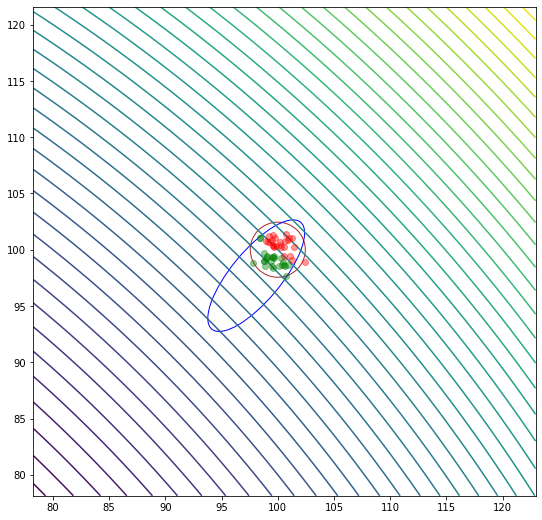

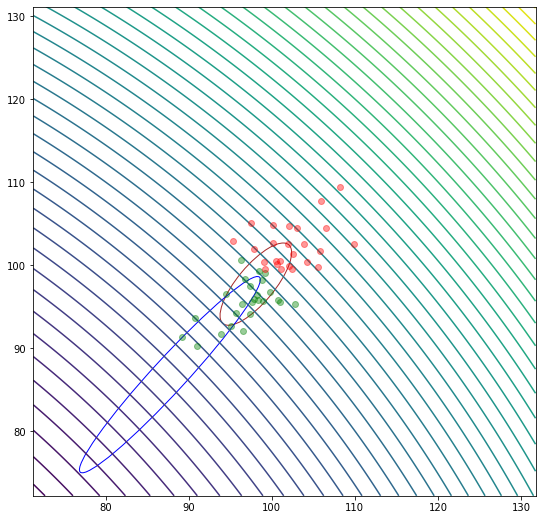

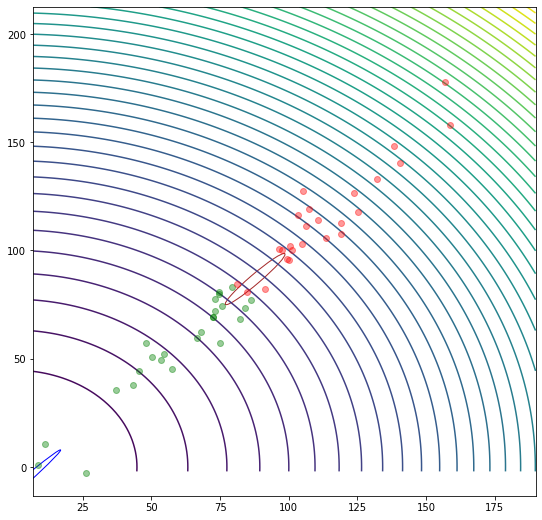

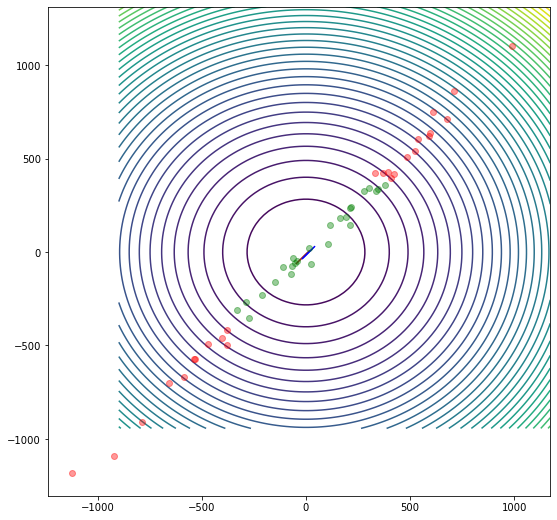

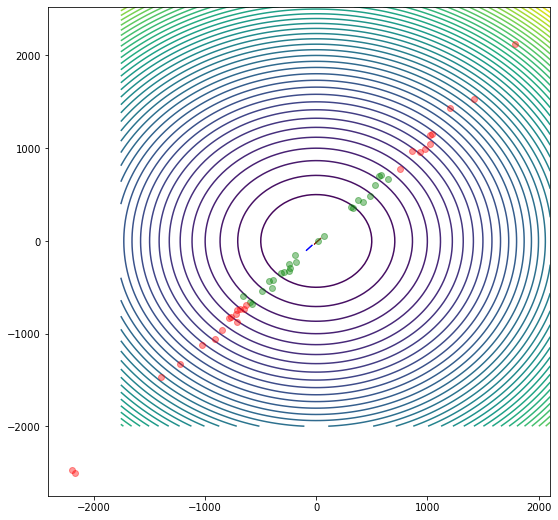

Best: [12.45446425 -4.81411872], value: 178.28941878000202
---------------------------------------------

Popsize: 10


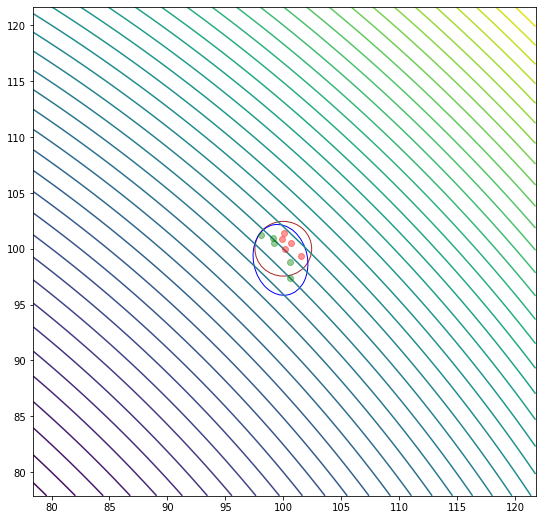

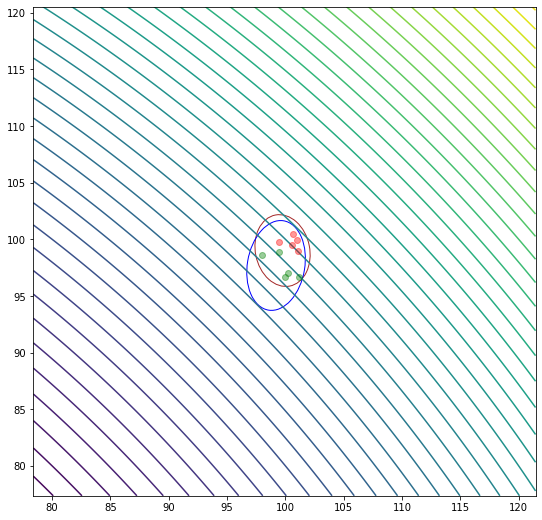

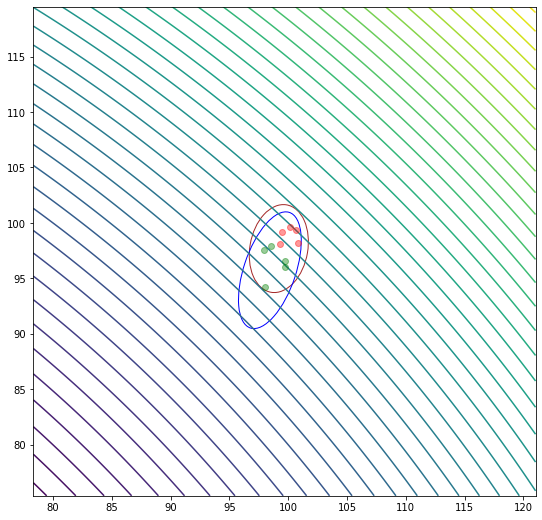

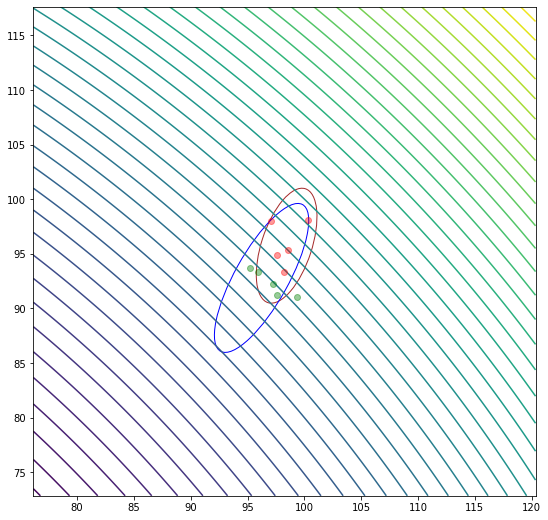

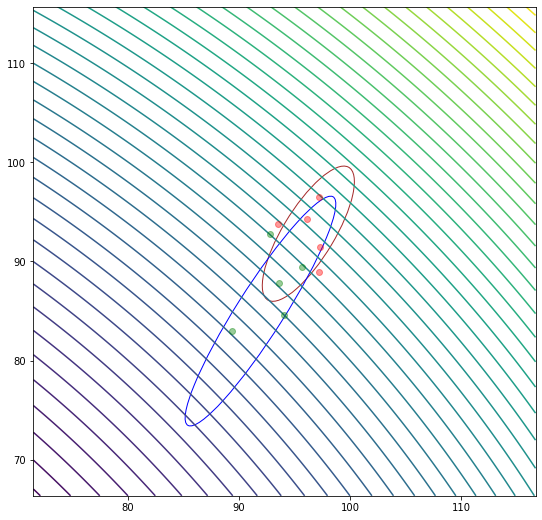

Best: [89.31270733 82.95009559], value: 14857.47805004638


In [23]:
optimize_and_show_progress_active(sphere_function, g = 5, d = 2, sigma = 1, popsize = 50)
print("---------------------------------------------\n")
optimize_and_show_progress(sphere_function, g = 5, d = 2, sigma = 1, popsize = 10)

In [56]:
optimize_and_plot_active(sphere_function, d = 10, popsize=10);

Popsize: 10
Iteration   100: 468.3619483080454
Best: [  2.83142557   4.73977767  15.2587207   -0.87950541  -1.75863299
   0.37533104  -3.2761021    0.83250911  -2.29330782 -13.57787014], value: 468.3619483080454


In [57]:
optimize_and_plot(sphere_function, d = 10, popsize=10);

Popsize: 10
Iteration   100: 823.1256137691631
Best: [-5.51109245  8.45950546  4.61576937 -3.16771246 19.86912573  1.46829346
 15.2962517  -5.10513128 -1.713048    5.47176881], value: 823.1256137691631


# sphere_function

In [60]:
functions = [sphere_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 755.9007454249228
Iteration   200: 97.4370537920452
Iteration   300: 54.10611455871547
Iteration   400: 21.906064560020905
Iteration   500: 18.20670271523019
Iteration   600: 18.734273015701287
Iteration   700: 18.33516993301779
Iteration   800: 17.670740081119973
Iteration   900: 17.64466646473803
Iteration  1000: 17.626029479174434
Iteration  1100: 17.617859453171256
Iteration  1200: 17.602741411433986
Iteration  1300: 10.882157986211432
Iteration  1400: 2.077751333628928
Iteration  1500: 1.7857038458513461
Iteration  1600: 1.7817977837779502
Iteration  1700: 1.7819861014916478
Iteration  1800: 1.7813694591085787
Iteration  1900: 1.781325071838648
Iteration  2000: 1.7813251495209836
Iteration  2100: 1.781323387191413
Iteration  2200: 1.7813203997790186
Iteration  2300: 1.7813198113761946
Iteration  2400: 1.781319660539818
Iteration  2500: 1.781319553217287
Iteration  2600: 1.78131955064133
Best: [-0.65916967  0.99610889  0.19815043 -0.407

Iteration  6100: 2.339050249130815e-24
Iteration  6200: 6.408580980612659e-25
Best: [ 4.23363655e-14  2.48065682e-13  1.64128427e-13 -1.92602311e-13
 -7.61823585e-14 -7.04317248e-14 -8.65696286e-14 -2.45111889e-13
 -8.50190147e-14 -8.87000850e-14 -1.94245974e-14 -2.08033536e-13
  1.99768306e-13  1.81078320e-13  1.63044766e-13 -5.64106983e-14
 -8.69660402e-14  7.18411267e-14 -3.60488424e-13 -7.62185320e-14]
Value: 5.154003683264829e-25

D: 20 
Sigma: 1.0
Popsize: 10
Iteration   100: 1098.8601714754914
Iteration   200: 285.0305343553179
Iteration   300: 300.33407927441493
Iteration   400: 107.23978499636688
Iteration   500: 89.96377099204639
Iteration   600: 102.46928206752823
Iteration   700: 174.20239827891967
Iteration   800: 60.55861852888611
Iteration   900: 26.882595172086738
Iteration  1000: 16.90930749235786
Iteration  1100: 14.23843204688204
Iteration  1200: 13.337642796813803
Iteration  1300: 8.332082659197193
Iteration  1400: 6.110848668227438
Iteration  1500: 5.00386488852271

Iteration   300: 672.3582181148417
Iteration   400: 452.5227584653141
Iteration   500: 421.7102332661335
Iteration   600: 530.0534287608882
Iteration   700: 471.856669741703
Iteration   800: 382.7794285508402
Iteration   900: 506.8970700763298
Iteration  1000: 416.4335150260484
Iteration  1100: 242.78070819373823
Iteration  1200: 267.3849698543128
Iteration  1300: 245.73659910624946
Iteration  1400: 251.78112729535604
Iteration  1500: 246.30201865424124
Iteration  1600: 165.1644976683167
Iteration  1700: 179.67726629733934
Iteration  1800: 155.48912887225197
Iteration  1900: 106.71337915429298
Iteration  2000: 331.10402636879286
Iteration  2100: 112.6742890693303
Iteration  2200: 131.1906265263762
Iteration  2300: 88.3177053920811
Iteration  2400: 78.30588903339384
Iteration  2500: 93.83813492336343
Iteration  2600: 77.74541208495069
Iteration  2700: 102.76093338761514
Iteration  2800: 77.31313284612686
Iteration  2900: 89.67597894515671
Iteration  3000: 70.4106931147063
Iteration  310

Iteration  2500: 2.4890808656861522e-05
Iteration  2600: 4.900704390205415e-05
Iteration  2700: 2.5057325030560993e-05
Iteration  2800: 1.4767357397194268e-05
Iteration  2900: 9.912577941802754e-06
Iteration  3000: 1.0579489212115653e-05
Iteration  3100: 1.0423251152196654e-05
Iteration  3200: 5.16347832753058e-06
Iteration  3300: 3.2875286598241514e-06
Iteration  3400: 3.3040711474347243e-06
Iteration  3500: 2.7050644687978144e-06
Iteration  3600: 2.633504174004688e-06
Iteration  3700: 1.8464877262843978e-06
Iteration  3800: 1.0554005976358264e-06
Iteration  3900: 9.609148182994877e-07
Iteration  4000: 8.017246233610477e-07
Iteration  4100: 6.196351872342497e-07
Iteration  4200: 6.305370972112277e-07
Iteration  4300: 6.041673747807961e-07
Iteration  4400: 5.999410457737682e-07
Iteration  4500: 5.741793973890723e-07
Iteration  4600: 5.53278076346668e-07
Iteration  4700: 5.529635763068328e-07
Iteration  4800: 5.468350007486814e-07
Iteration  4900: 5.407712654992037e-07
Iteration  5000: 

Iteration  2500: 0.027848575944221608
Best: [ 0.04415764  0.00804563  0.00800918 -0.00198391  0.04482598 -0.01199215
  0.00589149 -0.0358051   0.08172509 -0.05304626  0.03568903  0.0025187
  0.00296101  0.00559076  0.0164154   0.08284372 -0.01253363  0.03926302
  0.04708807 -0.02084439]
Value: 0.027848575944221608

D: 20 
Sigma: 10.0
Popsize: 100
Iteration   100: 6171.465995103109
Iteration   200: 20292.118510510725
Iteration   300: 80964.73469679526
Iteration   400: 930515.3762802471
Iteration   500: 3642476.153975766
Best: [-195.47399071  435.6778531    18.15425863 -438.21454184  528.73525307
 -141.18430477  383.04865281 -791.4561258  -208.78227183 -184.4564661
 -248.28632967  541.48147104 -558.51744659 -152.10795624 -985.6564786
   19.09902237 -263.24719088  185.89677874 -460.49016709  306.81238491]
Value: 3642476.153975766

D: 50 
Sigma: 10.0
Popsize: 6
Iteration   100: 38283.36498704772
Iteration   200: 30549.219220998562
Iteration   300: 22577.20262200803
Iteration   400: 27759.3

Iteration   100: 5077.433058329578
Iteration   200: 2798.6916943320334
Iteration   300: 1510.7456294325023
Iteration   400: 795.2919182429542
Iteration   500: 519.1684868223496
Best: [-0.82195914 -0.7056401   6.23040301 -1.05324732 -1.83277585 -2.29576317
 -2.74480759  3.44277617 -2.90125861  4.21477617 -0.97985708  2.5040129
 -2.3684489  -0.17283481  1.00204825 -3.00122932 -3.76544709 -0.95522387
 -4.55454624  1.2028196  -5.60782656  5.12375417 -7.29944557  0.26261602
 -0.47574848 -7.06949405 -6.7398862   2.55675536 -5.75571944  1.00066498
  0.33714519  2.66961573  2.20990459  2.5711184  -0.11361134  2.14493193
 -1.25152223 -1.05124276 -0.22836353  1.09026001  1.39998177 -0.03404055
 -6.44879562  3.28609379 -0.36423799  2.58025473 -1.55762819  2.78182517
  1.43434907  3.96724495]
Value: 519.1684868223496

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 110.52675210536324
Iteration   200: 0.0945624476839287
Iteration   300: 0.00107411505670576
Iteration   400: 0.00021064235962532651
Itera

Iteration  2600: 3.9603078833506896e-07
Iteration  2700: 2.8083467211979975e-07
Iteration  2800: 1.0814695013212854e-07
Iteration  2900: 3.781389422271246e-08
Iteration  3000: 6.890051795413726e-09
Iteration  3100: 5.012722387428589e-09
Iteration  3200: 2.2393350185295078e-09
Iteration  3300: 5.626432421150259e-10
Iteration  3400: 1.260518557421818e-10
Iteration  3500: 8.762055595622279e-11
Iteration  3600: 3.959652113006691e-11
Iteration  3700: 1.3059971346887563e-11
Iteration  3800: 4.456077851077577e-12
Iteration  3900: 2.4671281453247444e-12
Iteration  4000: 3.711523001087018e-13
Iteration  4100: 1.3031269839017122e-13
Iteration  4200: 6.806746065675583e-14
Iteration  4300: 1.2511388426266726e-14
Iteration  4400: 8.63484830019867e-15
Iteration  4500: 1.7375740000931195e-15
Iteration  4600: 1.1751602824119293e-15
Iteration  4700: 3.994246853224375e-16
Iteration  4800: 1.125667895274323e-16
Iteration  4900: 5.157711403954506e-17
Iteration  5000: 1.4424622911650114e-17
Iteration  5100

Popsize            6             10            20            100
D  Sigma                                                        
5  1.0    1.781320e+00  7.401334e+06  8.603806e+07  7.934100e+20
   10.0   3.330826e-06  1.064106e+06  2.090109e+10  3.221706e+22
   100.0  2.774367e-07  5.079264e+08  7.032615e+10  5.700223e+21
10 1.0    1.032667e-25  1.839885e-10  7.266447e+05  2.638529e+19
   10.0   1.365576e-25  5.292110e-07  4.422841e+09  2.224868e+20
   100.0  1.086833e-25  2.393910e-18  1.882404e-01  1.330738e+16
20 1.0    5.154004e-25  2.015178e-06  6.083062e+01  1.760433e+07
   10.0   3.227259e-25  1.599677e-07  2.784858e-02  3.642476e+06
   100.0  4.265912e-25  1.256823e-05  8.922728e-03  2.921731e-02
50 1.0    1.332987e-04  1.564512e+01  1.121957e+02  4.659696e+02
   10.0   1.079390e-03  2.894039e+02  3.818301e+02  5.191685e+02
   100.0  8.360982e-02  2.719275e+04  2.128399e+04  5.645961e+03

In [61]:
functions = [sphere_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 2156.1879260020637
Iteration   200: 12.899159497282962
Iteration   300: 0.058084240982882035
Iteration   400: 0.0008945385403655913
Iteration   500: 8.862922283000544e-07
Iteration   600: 5.072875883986106e-09
Iteration   700: 4.027138199209434e-11
Iteration   800: 4.393002752093683e-13
Iteration   900: 2.547062685680393e-15
Iteration  1000: 1.3611196107920729e-17
Iteration  1100: 6.137048703205314e-20
Iteration  1200: 6.663212591912922e-22
Iteration  1300: 4.0257415442058185e-24
Iteration  1400: 3.1182298537890394e-26
Best: [-2.44313323e-14 -2.45708748e-14 -1.25289798e-14 -9.37909093e-15
  9.70049464e-14]
Value: 1.08555201947332e-26

D: 5 
Sigma: 1.0
Popsize: 10
Iteration   100: 14.328136750925221
Iteration   200: 0.0007401374250966205
Iteration   300: 4.2023636158361594e-08
Iteration   400: 1.3071262238718217e-12
Iteration   500: 1.5708341619540424e-17
Iteration   600: 1.7727792817455115e-21
Iteration   700: 2.16896420727569e-25
Best: [-5

Iteration  7300: 1.3293165207612018e-10
Iteration  7400: 1.1617075143965809e-10
Iteration  7500: 6.1701495808668e-11
Iteration  7600: 5.215319469606288e-11
Iteration  7700: 1.7622357164181913e-11
Iteration  7800: 3.67027096186592e-11
Iteration  7900: 1.2218157931682826e-11
Iteration  8000: 7.499402857218785e-12
Iteration  8100: 4.546010195584095e-12
Iteration  8200: 2.1924553688609602e-12
Iteration  8300: 2.2019861908480707e-12
Best: [-2.60279323e-07  5.79705995e-07  1.81158582e-07  9.34511875e-07
  2.75490375e-07  2.31286779e-08  3.70095105e-07  3.92316566e-07
 -1.71541143e-07  8.05148661e-07  1.70993254e-07  1.52518622e-07
 -1.02472721e-07  2.35083245e-07  1.16581187e-07  8.53201993e-08
 -2.09196489e-07 -2.30094576e-07  6.76594717e-07 -4.14769488e-07]
Value: 3.22059547736981e-12

D: 20 
Sigma: 1.0
Popsize: 10
Iteration   100: 21014.46536001692
Iteration   200: 1206.5442932123105
Iteration   300: 174.77414356527314
Iteration   400: 72.48448266660951
Iteration   500: 51.35576403532874


Iteration   100: 161908.17851080472
Iteration   200: 43187.968021805325
Iteration   300: 5272.3871499549105
Iteration   400: 862.0368764658057
Iteration   500: 419.5380628845306
Iteration   600: 336.6021306486023
Iteration   700: 313.86433754896666
Iteration   800: 279.4910085059973
Iteration   900: 309.8260793026231
Iteration  1000: 228.78513590370758
Iteration  1100: 207.3102516968925
Iteration  1200: 156.83575156380326
Iteration  1300: 125.08870602500456
Iteration  1400: 92.83232282386315
Iteration  1500: 70.62884401335305
Iteration  1600: 82.15440029454176
Iteration  1700: 74.66121869590395
Iteration  1800: 80.61497202631617
Iteration  1900: 60.83679352201005
Iteration  2000: 37.77361970682299
Iteration  2100: 61.33352234781283
Iteration  2200: 37.785704275541924
Iteration  2300: 43.38968510065007
Iteration  2400: 36.53029445776977
Iteration  2500: 25.923344167146183
Iteration  2600: 17.460226191062297
Iteration  2700: 14.676874623615257
Iteration  2800: 20.452237288419546
Iteratio

Iteration   600: 2.9741545635066946e-05
Iteration   700: 2.8059542827193015e-06
Iteration   800: 8.474260380885129e-08
Iteration   900: 5.4256956199198895e-09
Iteration  1000: 2.808644269551457e-10
Iteration  1100: 1.789072153130989e-11
Iteration  1200: 7.682750783918643e-13
Iteration  1300: 7.66180347914322e-14
Iteration  1400: 3.598851659890148e-15
Iteration  1500: 1.954668801827764e-16
Iteration  1600: 1.2432551788413782e-17
Iteration  1700: 2.481944991140449e-19
Iteration  1800: 1.1163211251623564e-20
Iteration  1900: 1.5119179147505004e-21
Iteration  2000: 4.165011656415868e-23
Iteration  2100: 1.680412429090986e-24
Iteration  2200: 5.641077893419746e-26
Best: [-5.47002030e-14 -9.23417223e-15 -2.03582271e-14  8.75303834e-14
 -3.96474937e-14  7.21567111e-14  1.78299564e-14  1.69272659e-14
  1.62975266e-14  3.98066393e-14]
Value: 2.038653988099079e-26

D: 10 
Sigma: 10.0
Popsize: 20
Iteration   100: 11.304705372430446
Iteration   200: 0.004532623146970484
Iteration   300: 2.04378488

Iteration  1900: 4.5216638062882215e-12
Iteration  2000: 9.153710453807417e-13
Iteration  2100: 1.48129112345978e-13
Iteration  2200: 1.3615171075415872e-14
Iteration  2300: 3.7089301777923815e-15
Iteration  2400: 5.531067134291223e-16
Iteration  2500: 5.2042963864803464e-17
Best: [ 1.38036104e-10  1.52166551e-10  1.50646747e-09 -3.80393250e-10
 -2.88226891e-09  1.52056766e-09 -4.57341324e-10  5.07722506e-10
  3.00295318e-09 -2.24568923e-09  2.67732432e-09  2.85432839e-10
  1.05751677e-10 -1.25114708e-09  8.08066788e-10 -1.29545877e-09
 -1.63215777e-09 -1.71820101e-09  2.56900045e-10 -2.75677243e-09]
Value: 5.2042963864803464e-17

D: 20 
Sigma: 10.0
Popsize: 100
Iteration   100: 30.076419664816754
Iteration   200: 0.016813303002195537
Iteration   300: 9.462620716247089e-06
Iteration   400: 4.388874414787138e-09
Iteration   500: 3.1412095483675286e-12
Best: [-1.24410393e-07  7.55767202e-08 -2.72190484e-07  3.89638688e-07
  3.33263194e-07  3.93018654e-08  8.95175695e-07  7.93027197e-08
 

Iteration   100: 5399.024938702581
Iteration   200: 1618.0669723371657
Iteration   300: 398.65676218071206
Iteration   400: 123.63194476626329
Iteration   500: 27.862626795421413
Best: [ 0.43482937 -0.4377215   0.4932829   0.17338163  0.56315144  0.03035381
 -0.50291792  1.1891099  -1.00932433  0.06289331  0.38145042  1.49129998
 -0.16117262 -0.04780331  1.24845581 -0.60523995 -0.27358763 -0.05011755
  0.5637316  -0.25153402 -0.47063583  0.81339185 -0.55276513 -1.03817358
  0.83868078  0.42640097 -0.20271129  0.19667302 -0.45058681  1.54229653
 -0.13757644  0.31901312 -0.72658344  0.7158211  -0.39983941  0.71291328
 -0.9795249   0.68930568 -1.00715232 -0.48414416 -1.35868553 -0.921428
  0.62892004 -0.33534561 -0.17583383 -1.26392555  1.20674128 -0.38278317
  0.59341428 -1.51913457]
Value: 27.862626795421413

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 162.1532498223589
Iteration   200: 1.9949837018975236
Iteration   300: 0.003771558754335716
Iteration   400: 1.664743400532568e-05
Iter

Iteration  5300: 0.00025063710881698136
Iteration  5400: 0.00015929071373375886
Iteration  5500: 9.124917518040792e-05
Iteration  5600: 0.00011265256091753485
Iteration  5700: 6.050884289612797e-05
Iteration  5800: 3.435137246065325e-05
Iteration  5900: 3.203694401614322e-05
Iteration  6000: 2.427406617612604e-05
Iteration  6100: 6.607859204318782e-06
Iteration  6200: 7.530652168294921e-06
Iteration  6300: 8.551643006834482e-06
Iteration  6400: 2.927203061973632e-06
Iteration  6500: 1.477352441504289e-06
Iteration  6600: 2.4653910939735643e-06
Iteration  6700: 1.6584641360789236e-06
Iteration  6800: 7.886390591931713e-07
Iteration  6900: 6.170281053336071e-07
Iteration  7000: 3.5946919006943283e-07
Iteration  7100: 1.0665159141733843e-07
Iteration  7200: 1.0593663834187006e-07
Iteration  7300: 9.80160599485741e-08
Iteration  7400: 6.955999116690967e-08
Iteration  7500: 7.971550767341685e-08
Iteration  7600: 5.820152559582174e-08
Iteration  7700: 1.7841649442601644e-08
Iteration  7800: 

Iteration  7100: 11505.521006073324
Iteration  7200: 14596.157421373395
Iteration  7300: 13707.975643682128
Iteration  7400: 14011.657960420482
Iteration  7500: 14065.216476211877
Iteration  7600: 9565.20243478427
Iteration  7700: 6697.7444124059175
Iteration  7800: 14796.440019756688
Iteration  7900: 7752.057315764252
Iteration  8000: 12115.63780451473
Iteration  8100: 11067.837791585143
Iteration  8200: 5818.34786937486
Iteration  8300: 5559.851397985449
Best: [  0.22441693 -10.43076732  -0.35081466  -1.75064702 -13.63218283
  -1.66777917  -3.39315267  -0.3325031  -14.18821379   0.86749325
 -19.74069906  10.69803999  10.04816029  18.99413753 -20.4921605
  12.87542069 -12.49906509  11.94240926  -8.09456243  -6.74090417
 -14.0733322   -2.55239254 -14.94952885  -5.9165591    1.34013651
  19.8300396  -12.76503512 -11.6158892   11.84153088  -1.41409973
  -1.80733154  10.77058092 -10.81151677  -7.88711421 -11.78685324
   0.79274155   9.33531611   5.4101354  -18.09660167  -2.1926632
   7.38

Popsize            6             10            20            100
D  Sigma                                                        
5  1.0    1.085552e-26  1.755375e-26  2.634395e-27  2.037701e-27
   10.0   1.996236e-26  9.403573e-27  1.511707e-26  9.773753e-28
   100.0  5.664399e-27  7.454894e-27  1.463527e-26  4.212405e-27
10 1.0    6.397632e-26  2.146439e-26  1.581406e-26  1.346227e-26
   10.0   6.277358e-26  2.038654e-26  3.286091e-26  1.289026e-26
   100.0  3.854191e-26  3.530120e-26  2.072065e-26  1.487021e-26
20 1.0    3.220595e-12  5.373260e-15  9.469314e-17  1.334858e-12
   10.0   2.112842e-11  1.454177e-14  5.204296e-17  3.141210e-12
   100.0  2.050290e-09  5.445685e-13  1.509533e-15  6.737876e-12
50 1.0    2.424790e+00  8.477565e-01  6.716007e-01  2.629752e+01
   10.0   8.985824e+01  8.337692e+00  2.538299e+00  2.786263e+01
   100.0  6.190396e+03  7.283916e+02  1.128741e+02  6.956017e+02

# ellipsoid_function

In [58]:
functions = [ellipsoid_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 46.02275190953647
Iteration   200: 0.022752152404223715
Iteration   300: 2.045447144746434e-06
Iteration   400: 1.1336781648107958e-08
Iteration   500: 1.7370487306251702e-13
Iteration   600: 6.42753314091139e-16
Iteration   700: 8.976094122234268e-20
Iteration   800: 2.7364490112482704e-23
Iteration   900: 2.341960546843819e-26
Best: [-5.34291332e-14  9.39584371e-14 -2.55844119e-16 -8.35886958e-14
  7.82546751e-15]
Value: 2.5226588940867795e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 970.8938341705289
Iteration   200: 164.58779419489827
Iteration   300: 57.06714300120164
Iteration   400: 49.27304590162331
Iteration   500: 39.96959348210768
Iteration   600: 38.76489477914648
Iteration   700: 38.334801409312426
Iteration   800: 37.78286504526349
Iteration   900: 37.57929063545144
Iteration  1000: 36.385663454856875
Iteration  1100: 36.298839392320076
Iteration  1200: 36.297851107970644
Iteration  1300: 36.297368183997065
Iteration  140

Iteration  3400: 5.153072828370849e-17
Iteration  3500: 1.0107423249479597e-17
Iteration  3600: 2.236466352344405e-18
Iteration  3700: 7.262301363735902e-19
Iteration  3800: 1.5656774077717678e-19
Iteration  3900: 2.411447519589842e-20
Iteration  4000: 6.780076101641688e-21
Iteration  4100: 1.9364709940648968e-21
Iteration  4200: 1.7375777353853052e-22
Iteration  4300: 9.068336213410639e-23
Iteration  4400: 3.8785190634657125e-23
Iteration  4500: 6.405401528108075e-24
Iteration  4600: 2.070930762340815e-24
Best: [-2.69222963e-13 -1.75733261e-13  2.12489502e-13 -8.57855150e-15
  1.12809914e-14  1.44769635e-13 -6.80546828e-14 -1.08385424e-13
 -2.23177106e-13 -1.44920344e-13 -2.64310071e-13 -1.92550047e-13
  5.35064270e-14  2.41861665e-13 -2.39267613e-13 -1.08252602e-13
 -1.29358459e-13  2.01262630e-13 -1.17230004e-14 -7.01613741e-16]
Value: 7.709091973999862e-25

D: 20 
Sigma: 1.0
Popsize: 6
Iteration   100: 2140.917995555645
Iteration   200: 416.6405435991187
Iteration   300: 245.088534

Iteration  1600: 84.87615550404146
Iteration  1700: 52.337425386741046
Iteration  1800: 51.86318588886609
Iteration  1900: 40.934873043460435
Iteration  2000: 22.158424930915963
Iteration  2100: 21.299571448166038
Iteration  2200: 16.70816096558321
Iteration  2300: 15.283474297646222
Iteration  2400: 8.800615860664179
Iteration  2500: 5.092222585514902
Iteration  2600: 3.825605234382285
Iteration  2700: 3.401427953273804
Iteration  2800: 1.9285875731049074
Iteration  2900: 1.7819170006107505
Iteration  3000: 1.9675169788686395
Iteration  3100: 1.5675789346145697
Iteration  3200: 0.873655026200385
Iteration  3300: 0.5227187744360654
Iteration  3400: 0.6066704371030959
Iteration  3500: 0.33137133486691944
Iteration  3600: 0.33927813242569754
Iteration  3700: 0.3154769330816322
Iteration  3800: 0.18781277851269068
Iteration  3900: 0.16111058928479577
Iteration  4000: 0.09757802022054447
Iteration  4100: 0.07879359193035435
Iteration  4200: 0.06708355525171375
Iteration  4300: 0.0427888104

Iteration   700: 614.8712700486789
Iteration   800: 468.10199554194054
Iteration   900: 377.6269226027781
Iteration  1000: 793.6755626429833
Iteration  1100: 516.3246575659879
Iteration  1200: 335.42977420977934
Iteration  1300: 498.7763091642292
Iteration  1400: 510.6611669605027
Iteration  1500: 412.97269191829594
Iteration  1600: 381.35876381141145
Iteration  1700: 311.75877544184385
Iteration  1800: 345.7220556920253
Iteration  1900: 332.45984961483236
Iteration  2000: 247.89058716183155
Iteration  2100: 191.44934241061182
Iteration  2200: 236.30359761443648
Iteration  2300: 180.75824722708197
Iteration  2400: 167.1793286407471
Iteration  2500: 193.17304720251917
Iteration  2600: 133.27133778586077
Iteration  2700: 245.17506285568177
Iteration  2800: 148.66561958615318
Iteration  2900: 160.94395926100754
Iteration  3000: 132.21544042381763
Iteration  3100: 92.96358961475707
Iteration  3200: 102.94792362778138
Iteration  3300: 119.95590465471068
Iteration  3400: 96.20017266103879
It

Iteration  1000: 5.321768000154275e-10
Iteration  1100: 3.6247152476136975e-11
Iteration  1200: 1.544692343014874e-12
Iteration  1300: 6.338930263947252e-14
Iteration  1400: 6.948254259817765e-15
Iteration  1500: 1.5164861117331078e-16
Iteration  1600: 7.197261592226844e-18
Iteration  1700: 1.8250677629367656e-19
Iteration  1800: 1.736205959805854e-20
Iteration  1900: 7.662036975875943e-22
Iteration  2000: 3.63151730053299e-23
Iteration  2100: 3.5323207873038e-24
Best: [-1.41170061e-13  1.33564922e-14  9.17137668e-15  1.49287365e-13
 -1.39353584e-13 -4.76203028e-14 -5.67172195e-14 -1.90409958e-13
 -2.94051277e-13 -2.85206544e-14]
Value: 3.0706527093122647e-25

D: 10 
Sigma: 10.0
Popsize: 10
Iteration   100: 1044.7086443564162
Iteration   200: 204.5408670383087
Iteration   300: 156.80186486328483
Iteration   400: 16.911024141233668
Iteration   500: 16.12191227268096
Iteration   600: 4.019333519542174
Iteration   700: 1.0549084091069287
Iteration   800: 0.5254860623473311
Iteration   900

Best: [ 1.38989990e-15 -5.09061504e-14  7.10453451e-14 -3.67062439e-14
 -2.37800449e-13 -2.40119660e-14  1.52245556e-13 -4.65597947e-13
 -2.02550308e-13  1.44732999e-13  2.04150028e-13 -1.93149951e-13
 -2.56211970e-13  1.18923518e-13 -1.71586765e-13 -2.53693797e-14
 -1.67705632e-13  7.23412982e-15  1.18618700e-13  1.54921810e-13]
Value: 8.844767315066579e-25

D: 20 
Sigma: 10.0
Popsize: 10
Iteration   100: 4406.478504758731
Iteration   200: 2212.2978780036046
Iteration   300: 1685.9905898015384
Iteration   400: 958.562435328583
Iteration   500: 843.1029354498983
Iteration   600: 535.9343930451265
Iteration   700: 243.23009161049862
Iteration   800: 174.82642419425463
Iteration   900: 72.54182266466583
Iteration  1000: 61.7159435427252
Iteration  1100: 61.701118995509596
Iteration  1200: 23.19395871443229
Iteration  1300: 18.365741952800402
Iteration  1400: 7.247419768435832
Iteration  1500: 4.1546203810023465
Iteration  1600: 5.624311260243195
Iteration  1700: 1.4166384520285096
Iterat

Iteration   200: 43441.72703087925
Iteration   300: 32080.489360209227
Iteration   400: 43204.05791138896
Iteration   500: 22079.65328504482
Iteration   600: 18631.246624758827
Iteration   700: 12650.069863434834
Iteration   800: 12142.646039616233
Iteration   900: 14684.490366068037
Iteration  1000: 9825.955587779674
Iteration  1100: 5615.542516640795
Iteration  1200: 6381.226716484106
Iteration  1300: 4757.143535549023
Iteration  1400: 4439.931199762184
Iteration  1500: 3559.8959138992777
Iteration  1600: 1999.647786717857
Iteration  1700: 2947.519808456511
Iteration  1800: 1575.1830135407567
Iteration  1900: 1545.920967026655
Iteration  2000: 1148.3778802356062
Iteration  2100: 1071.4702973372225
Iteration  2200: 749.4312510464737
Iteration  2300: 517.1545967959712
Iteration  2400: 475.64828539269166
Iteration  2500: 320.4734148975492
Iteration  2600: 239.83788405945984
Iteration  2700: 231.737251501985
Iteration  2800: 211.07979350090608
Iteration  2900: 159.72097211380222
Iteratio

Iteration   500: 9.287003986393264e-12
Iteration   600: 1.6833671249598614e-14
Iteration   700: 5.889186739828901e-18
Iteration   800: 7.087520010972109e-22
Iteration   900: 1.2183930698263777e-24
Best: [-7.29167493e-14 -1.47992532e-13 -1.14390131e-13  3.31874774e-14
 -5.43108562e-14]
Value: 5.761942441978907e-26

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 342.0396248627228
Iteration   200: 0.3003892953271482
Iteration   300: 0.13464032811981697
Iteration   400: 0.0053205161230884005
Iteration   500: 0.004143109176755835
Iteration   600: 0.003786217971205549
Iteration   700: 0.00326247250180997
Iteration   800: 0.002292355750972585
Iteration   900: 0.0005187658042546256
Iteration  1000: 0.00037404155328984805
Iteration  1100: 0.00023601336850634025
Iteration  1200: 0.00019091397742322457
Iteration  1300: 0.00016870949125539212
Iteration  1400: 0.00016899516452868963
Iteration  1500: 0.00016909550794858995
Iteration  1600: 0.00016774117073753843
Iteration  1700: 0.00016766617095116242

Iteration  2800: 3.818952453154979e-12
Iteration  2900: 1.0097409600020396e-12
Iteration  3000: 2.11639785240998e-13
Iteration  3100: 6.012490013339865e-14
Iteration  3200: 9.767824890710081e-15
Iteration  3300: 2.6465743815163724e-15
Iteration  3400: 2.1972086490247349e-16
Iteration  3500: 1.032592644890492e-16
Iteration  3600: 2.041692735719558e-17
Iteration  3700: 4.607702929495443e-18
Iteration  3800: 1.1803338690373843e-18
Iteration  3900: 5.197274938591143e-19
Iteration  4000: 7.146764807408795e-20
Iteration  4100: 1.1707899061818455e-20
Iteration  4200: 6.493169952097139e-21
Iteration  4300: 1.804385464020415e-21
Iteration  4400: 3.667699552959962e-22
Iteration  4500: 7.679357744532526e-23
Iteration  4600: 2.2296480974558567e-23
Iteration  4700: 1.2611724869885342e-24
Iteration  4800: 1.3421068789333135e-24
Best: [ 5.68784395e-14 -4.92644105e-14 -3.51371696e-13 -2.84027230e-13
  7.61809102e-14  2.45141135e-13  1.23006141e-13 -1.84738452e-13
 -9.16628240e-14  6.80900788e-14  3.89

Iteration   500: 2639735.4833458485
Iteration   600: 1674653.02538332
Iteration   700: 1014254.2497225277
Iteration   800: 1046781.6099998377
Iteration   900: 778407.1039433491
Iteration  1000: 383128.63616257336
Iteration  1100: 334084.44429761777
Iteration  1200: 296241.03778678895
Iteration  1300: 292193.6231192837
Iteration  1400: 186512.17292014317
Iteration  1500: 103285.32519265525
Iteration  1600: 84206.15057438324
Iteration  1700: 81569.09319363258
Iteration  1800: 54553.812646649734
Iteration  1900: 30049.119857663678
Iteration  2000: 33349.72235150934
Iteration  2100: 22495.83283162819
Iteration  2200: 10544.799416229349
Iteration  2300: 17319.182317931474
Iteration  2400: 6327.6837025979585
Iteration  2500: 8099.460104987299
Iteration  2600: 3939.892386384844
Iteration  2700: 2672.896228782463
Iteration  2800: 3652.2629837697323
Iteration  2900: 1549.2923690185587
Iteration  3000: 1185.648690745394
Iteration  3100: 1013.5952618520728
Iteration  3200: 609.7149683278453
Itera

Iteration   700: 1095605.063986007
Iteration   800: 1195124.0690302257
Iteration   900: 1026408.8660369721
Iteration  1000: 1248775.784984214
Iteration  1100: 613736.9221881727
Iteration  1200: 887898.3363976156
Iteration  1300: 849738.5573921549
Iteration  1400: 904850.7948381274
Iteration  1500: 538257.9076963868
Iteration  1600: 469640.604154557
Iteration  1700: 484968.6809490801
Iteration  1800: 545604.0644826312
Iteration  1900: 603956.9030017934
Iteration  2000: 370930.7242509908
Iteration  2100: 390700.214224317
Iteration  2200: 394807.0070857357
Iteration  2300: 325065.88935516315
Iteration  2400: 253682.0737466814
Iteration  2500: 302604.76900123677
Iteration  2600: 241408.56857180607
Iteration  2700: 201045.5740941656
Iteration  2800: 256423.20960227522
Iteration  2900: 204523.5640944953
Iteration  3000: 157982.29781998883
Iteration  3100: 232503.90866071451
Iteration  3200: 120734.4008001189
Iteration  3300: 120967.74526493726
Iteration  3400: 106566.06599396355
Iteration  3

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    2.522659e-26  2.527598e+01  9.192797e+05  5.534438e+08  5.181155e+21
   10.0   8.669914e-26  5.406533e-05  1.085098e+07  1.519709e+09  5.218275e+22
   100.0  5.761942e-26  1.674150e-04  2.897167e+06  3.572093e+11  1.000456e+25
10 1.0    1.276323e-25  1.406638e-25  2.413250e+00  1.018503e+08  8.547318e+20
   10.0   2.323692e-25  3.070653e-25  7.704013e-09  2.831898e+07  1.960149e+20
   100.0  4.436908e-25  2.162219e-25  2.178182e-18  5.367834e+06  9.761634e+20
20 1.0    7.709092e-25  3.965686e-25  4.968380e-06  6.626489e+01  1.353125e+07
   10.0   5.983324e-25  8.844767e-25  2.466746e-07  3.643427e-01  7.594432e+06
   100.0  9.378345e-25  3.131431e-25  1.195898e-05  1.746732e-02  3.168920e-02
50 1.0    4.452106e-09  1.513125e-04  2.755724e+01  1.383988e+02  1.844691e+03
   10.0   1.737498e-08  1.572641e-03  2.875494e+02  4.861204e+02  9.059393e+02
   100.0  1.657208e-06  1.281506e-01  3.578809e+04  4.890060e+04  8.332908e+03

In [60]:
functions = [ellipsoid_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 2590.2360344825
Iteration   200: 111.67909100433097
Iteration   300: 0.391053163205762
Iteration   400: 0.007651363664914108
Iteration   500: 0.0002885820231616733
Iteration   600: 9.992453786040772e-06
Iteration   700: 1.070750144461675e-07
Iteration   800: 2.8832581147279165e-09
Iteration   900: 1.0879348040452409e-11
Iteration  1000: 6.203545841558373e-13
Iteration  1100: 1.9641532800032672e-14
Iteration  1200: 1.3425885362678562e-16
Iteration  1300: 8.053143103914192e-18
Iteration  1400: 1.9784439207518532e-19
Iteration  1500: 1.3759527025078382e-20
Iteration  1600: 4.383946712686646e-23
Iteration  1700: 1.6023251374931069e-24
Iteration  1800: 8.463751619365519e-26
Best: [-5.04853911e-14  1.12446314e-13 -1.03190018e-13 -5.26551076e-14
  3.79124245e-14]
Value: 4.0181692088032425e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 1.534944292262563
Iteration   200: 0.01055260477676068
Iteration   300: 0.00031430474582995157
Iteration   400:

Iteration   100: 2.1407526339797557e-06
Iteration   200: 4.942146425674798e-18
Best: [-1.85520805e-14  2.60801131e-14 -5.47488749e-14 -8.75993934e-16
  4.79882334e-14  1.17657387e-14  3.95933342e-14  7.99182151e-14
  2.28172833e-14  9.53605527e-15]
Value: 2.2498261919316124e-26

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 79390.35293310629
Iteration   200: 13788.237283989009
Iteration   300: 1477.9256262470738
Iteration   400: 409.71087163443474
Iteration   500: 105.53964810100055
Iteration   600: 65.31267646788783
Iteration   700: 80.68043543557053
Iteration   800: 57.556244506073064
Iteration   900: 43.004610216691155
Iteration  1000: 58.48709000423988
Iteration  1100: 22.28185249282013
Iteration  1200: 10.381156344267328
Iteration  1300: 13.803767934216523
Iteration  1400: 9.219859925186032
Iteration  1500: 3.047065384728666
Iteration  1600: 4.3001318949106775
Iteration  1700: 2.7509164827346417
Iteration  1800: 3.9207073546846303
Iteration  1900: 1.8724573689498607
Iteration  200

Iteration   800: 2.5355789561266215
Iteration   900: 1.5596220390851454
Iteration  1000: 0.5228282576909639
Iteration  1100: 0.3530601463691306
Iteration  1200: 0.09054224874689824
Iteration  1300: 0.030978436131011058
Iteration  1400: 0.03261335749909058
Iteration  1500: 0.009439464763026702
Iteration  1600: 0.004980519273587229
Iteration  1700: 0.0028070958979092018
Iteration  1800: 0.0008774490550556807
Iteration  1900: 0.0003189712184331539
Iteration  2000: 0.00016491757100007312
Iteration  2100: 9.633645237332088e-05
Iteration  2200: 3.0144021256078845e-05
Iteration  2300: 1.5185251668340779e-05
Iteration  2400: 5.377774465053492e-06
Iteration  2500: 2.8897322481366422e-06
Iteration  2600: 1.4499994236866502e-06
Iteration  2700: 2.1964114046212247e-07
Iteration  2800: 1.358819867011123e-07
Iteration  2900: 1.1401553341296855e-07
Iteration  3000: 5.7172467247256035e-08
Iteration  3100: 3.099995904340373e-08
Iteration  3200: 9.762059189223862e-09
Iteration  3300: 5.718820888959222e-

Iteration   200: 138805.26071225392
Iteration   300: 41207.999979300715
Iteration   400: 7046.6532613497175
Iteration   500: 1404.6316918473008
Iteration   600: 970.9029457143643
Iteration   700: 665.7248252988345
Iteration   800: 727.1673338033618
Iteration   900: 527.0022581841415
Iteration  1000: 591.5805397498133
Iteration  1100: 450.42100876476985
Iteration  1200: 430.1112389725483
Iteration  1300: 306.67076956423534
Iteration  1400: 337.7975229370578
Iteration  1500: 282.8109669019976
Iteration  1600: 377.88379266328053
Iteration  1700: 408.32233478770183
Iteration  1800: 231.49019650278825
Iteration  1900: 244.2859768757989
Iteration  2000: 215.07732098109148
Iteration  2100: 240.47059350418715
Iteration  2200: 241.66339562883837
Iteration  2300: 220.28164621036382
Iteration  2400: 271.76226379734237
Iteration  2500: 180.42365842782075
Iteration  2600: 151.033906696211
Iteration  2700: 124.71286855989815
Iteration  2800: 84.64161195759797
Iteration  2900: 111.37868201851241
Iter

Iteration   800: 2.5114271282474674e-11
Iteration   900: 9.131247520944207e-13
Iteration  1000: 1.1538320556816763e-14
Iteration  1100: 3.2378077510831757e-16
Iteration  1200: 7.64199033483679e-18
Iteration  1300: 1.622513913836689e-19
Iteration  1400: 1.4939491437062925e-20
Iteration  1500: 7.923361086029757e-23
Iteration  1600: 2.41123972064862e-24
Iteration  1700: 2.3693650904607547e-26
Best: [ 1.31143605e-14  1.07075878e-13  2.60596543e-14 -3.12232384e-14
  4.21331178e-16]
Value: 1.640685520044944e-26

D: 5 
Sigma: 10.0
Popsize: 6
Iteration   100: 15.872549085451789
Iteration   200: 0.052339441006458834
Iteration   300: 0.0004882461732882441
Iteration   400: 5.421841431094854e-06
Iteration   500: 6.819092655706182e-08
Iteration   600: 1.1486044842102557e-10
Iteration   700: 3.0276238010903937e-13
Iteration   800: 1.7292416642162033e-14
Iteration   900: 1.7660308489869156e-16
Iteration  1000: 2.6535212053518996e-19
Iteration  1100: 3.8287994218863955e-21
Iteration  1200: 2.811231516

Iteration   200: 1.0315135807516185e-18
Best: [ 1.95477868e-14  4.30703495e-14  7.96008308e-14 -5.50671576e-14
 -3.01148728e-15  9.12325409e-15 -1.59765226e-14 -1.21938714e-14
  7.58675224e-14 -4.20031523e-16]
Value: 2.5051315211090894e-26

D: 20 
Sigma: 10.0
Popsize: 5
Iteration   100: 5072.687673404619
Iteration   200: 3360.1432093713497
Iteration   300: 4700.406326201635
Iteration   400: 2018.00290942793
Iteration   500: 3544.6118880033805
Iteration   600: 1803.653265906764
Iteration   700: 1382.0359034476098
Iteration   800: 966.8355368982528
Iteration   900: 546.2237106017078
Iteration  1000: 231.64529306578748
Iteration  1100: 407.2137096904531
Iteration  1200: 351.79138887430645
Iteration  1300: 241.29717303167624
Iteration  1400: 102.33230291541297
Iteration  1500: 107.13483413561013
Iteration  1600: 75.5885554729452
Iteration  1700: 32.0497592473423
Iteration  1800: 61.77923528840571
Iteration  1900: 33.82423970752177
Iteration  2000: 28.5418282074804
Iteration  2100: 24.00666

Iteration  1000: 1.7325192261849434
Iteration  1100: 1.0560024928130163
Iteration  1200: 0.5992529810729917
Iteration  1300: 0.1958662656595504
Iteration  1400: 0.07646042816828015
Iteration  1500: 0.026330469634009403
Iteration  1600: 0.015892175036834735
Iteration  1700: 0.006541268791271638
Iteration  1800: 0.002156549948414493
Iteration  1900: 0.0006600797391564993
Iteration  2000: 0.0007089905703753558
Iteration  2100: 0.0003108438755336588
Iteration  2200: 0.0001089429093945461
Iteration  2300: 5.022724407248154e-05
Iteration  2400: 2.0272907659738245e-05
Iteration  2500: 1.0024912198152158e-05
Iteration  2600: 4.4887912266298065e-06
Iteration  2700: 2.1644627055661504e-06
Iteration  2800: 8.507298322127945e-07
Iteration  2900: 1.286039357087079e-07
Iteration  3000: 1.245809849392054e-07
Iteration  3100: 7.810536805894373e-08
Iteration  3200: 4.731357589594748e-08
Iteration  3300: 1.1335363370425119e-08
Iteration  3400: 8.807640935883551e-09
Iteration  3500: 2.675310429794384e-09

Iteration   500: 18208.87083844739
Iteration   600: 22817.13105263544
Iteration   700: 16082.955647267365
Iteration   800: 21850.87431844592
Iteration   900: 12039.869145331091
Iteration  1000: 11133.092603308529
Iteration  1100: 12727.467119542689
Iteration  1200: 12053.445758412232
Iteration  1300: 12119.440619719882
Iteration  1400: 11518.004154339076
Iteration  1500: 10278.040621934028
Iteration  1600: 8325.001879755146
Iteration  1700: 6185.485138862616
Iteration  1800: 7693.975858332258
Iteration  1900: 7956.747972640321
Iteration  2000: 8499.620536993656
Iteration  2100: 5452.583455889239
Iteration  2200: 6369.090632261067
Iteration  2300: 4880.608346763153
Iteration  2400: 4997.936840199896
Iteration  2500: 5126.5493712304105
Iteration  2600: 3999.872745771022
Iteration  2700: 5549.76703755845
Iteration  2800: 4227.356699332028
Iteration  2900: 4602.089279692177
Iteration  3000: 2896.0357694553873
Iteration  3100: 3902.7448033991213
Iteration  3200: 3028.072142062712
Iteration 

Iteration   800: 3.4751837575345826e-09
Iteration   900: 8.528839043659284e-11
Iteration  1000: 2.188753343983001e-13
Iteration  1100: 1.027211360543406e-14
Iteration  1200: 3.201906012286613e-16
Iteration  1300: 1.0447534281379389e-17
Iteration  1400: 1.126517913322575e-19
Iteration  1500: 1.3153505647597905e-21
Iteration  1600: 1.5666165475906276e-23
Iteration  1700: 1.2385816551905693e-23
Iteration  1800: 3.0890800382878565e-26
Best: [ 1.27240542e-13  2.68046458e-14 -1.24487551e-14 -1.21310574e-15
  7.07683789e-15]
Value: 1.736638888440907e-26

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 549.0605646680825
Iteration   200: 2.782334431830454
Iteration   300: 0.012365153397222562
Iteration   400: 5.8555549500106215e-05
Iteration   500: 7.187090132003381e-07
Iteration   600: 2.7807341926735495e-09
Iteration   700: 1.584457086746738e-11
Iteration   800: 1.5665289720087157e-13
Iteration   900: 3.592016304664461e-16
Iteration  1000: 2.527430598588731e-18
Iteration  1100: 2.194733194743648

Iteration   100: 8.434529927597526e-07
Iteration   200: 1.6248944524220814e-18
Best: [ 2.49060097e-14 -4.29145321e-14  5.37742529e-14  4.82851882e-14
 -2.74354916e-14  5.87447312e-14 -1.70059082e-14 -4.42665004e-14
  7.42774119e-15 -2.06042603e-14]
Value: 1.9786217879540305e-26

D: 20 
Sigma: 100
Popsize: 5
Iteration   100: 450254.33128089283
Iteration   200: 202769.17455874104
Iteration   300: 207175.47739481975
Iteration   400: 104522.14182020635
Iteration   500: 148172.3818124429
Iteration   600: 89203.13323941849
Iteration   700: 91923.12845887901
Iteration   800: 72249.08359076684
Iteration   900: 72447.36851036898
Iteration  1000: 25716.511340472454
Iteration  1100: 20354.903222937104
Iteration  1200: 23410.224378482606
Iteration  1300: 17915.910274377988
Iteration  1400: 9840.627046091924
Iteration  1500: 4287.485611601715
Iteration  1600: 6975.95149325871
Iteration  1700: 3663.708648870465
Iteration  1800: 1908.2592350071657
Iteration  1900: 1770.1745212504406
Iteration  2000: 

Iteration  1400: 3.481495900633187
Iteration  1500: 0.9066008863249432
Iteration  1600: 0.3465677195585122
Iteration  1700: 0.314432489018158
Iteration  1800: 0.10924255810220343
Iteration  1900: 0.0854562017298917
Iteration  2000: 0.034245177576227595
Iteration  2100: 0.007165720270020948
Iteration  2200: 0.0037347131983295158
Iteration  2300: 0.001596984424012631
Iteration  2400: 0.0010136084948319717
Iteration  2500: 0.0004155409722335443
Iteration  2600: 0.00020417048801702771
Iteration  2700: 6.95331762393654e-05
Iteration  2800: 4.7204937972628256e-05
Iteration  2900: 1.0913126403847337e-05
Iteration  3000: 6.647202447607224e-06
Iteration  3100: 2.3783652484266896e-06
Iteration  3200: 1.0055546134389708e-06
Iteration  3300: 6.06331027651459e-07
Iteration  3400: 1.530796178048858e-07
Iteration  3500: 1.0208510289942601e-07
Iteration  3600: 4.5855170874038486e-08
Iteration  3700: 1.518772758040421e-08
Iteration  3800: 7.2273295799403705e-09
Iteration  3900: 2.7763274838823755e-09
I

Iteration   200: 2237088.1224747812
Iteration   300: 1954468.7466268984
Iteration   400: 2200671.9228337836
Iteration   500: 1537535.259170942
Iteration   600: 1951129.1033493218
Iteration   700: 1937501.720822576
Iteration   800: 1440364.1805764257
Iteration   900: 1336782.107321712
Iteration  1000: 1494245.3891976336
Iteration  1100: 1177025.3729051808
Iteration  1200: 1016206.0504859078
Iteration  1300: 962057.2425529608
Iteration  1400: 894249.9543343883
Iteration  1500: 936657.1143585087
Iteration  1600: 993033.4937497599
Iteration  1700: 762993.6236034342
Iteration  1800: 826721.7514211759
Iteration  1900: 691089.1309806111
Iteration  2000: 573072.3993078973
Iteration  2100: 499588.64931642695
Iteration  2200: 741626.3096523185
Iteration  2300: 593580.9160890963
Iteration  2400: 363317.93603783706
Iteration  2500: 524164.8503890088
Iteration  2600: 494948.85721993505
Iteration  2700: 394806.65076139756
Iteration  2800: 429249.6828701932
Iteration  2900: 388391.2746978174
Iteratio

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    4.018169e-26  1.125445e-26  8.808630e-27  1.236974e-26  2.112856e-28
   10.0   1.640686e-26  3.343151e-26  9.347307e-27  1.101621e-26  5.264682e-27
   100.0  1.736639e-26  2.135329e-26  1.092659e-26  7.343740e-27  4.686907e-27
10 1.0    9.454782e-26  9.360982e-26  3.069895e-26  2.494511e-26  2.249826e-26
   10.0   1.466622e-25  5.254315e-26  3.313280e-26  4.269801e-26  2.505132e-26
   100.0  7.606831e-26  7.307318e-26  4.320348e-26  4.063948e-26  1.978622e-26
20 1.0    6.672015e-11  2.044789e-12  3.593332e-15  5.283435e-17  3.242047e-12
   10.0   2.220322e-09  2.321772e-11  2.109565e-14  7.980768e-17  5.089332e-12
   100.0  1.298883e-07  2.066220e-09  6.282266e-13  1.801018e-15  5.357327e-12
50 1.0    9.784149e+00  2.886584e+00  1.236659e+00  9.598215e-01  2.650044e+01
   10.0   3.840368e+02  9.873362e+01  1.190007e+01  4.628024e+00  4.638220e+01
   100.0  2.872915e+04  8.350604e+03  1.046611e+03  1.954420e+02  9.123070e+02

# rastrigin_function

In [67]:
functions = [rastrigin_function]
ds = [5, 10, 20, 50]
sigmas = [0.9, 1.0, 10.0, 100]
popsizes = [6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 0.9
Popsize: 6
Iteration   100: 278.4592257792862
Iteration   200: 62.51489691226314
Iteration   300: 81.3973015654682
Iteration   400: 60.000989480345574
Iteration   500: 38.13230199940758
Iteration   600: 35.106458080080046
Iteration   700: 33.66923874727886
Iteration   800: 23.546595912536
Iteration   900: 17.066652970386315
Iteration  1000: 16.922641218031707
Iteration  1100: 16.921623712705724
Iteration  1200: 16.921588183903808
Iteration  1300: 16.921584752472214
Iteration  1400: 16.921497062179554
Iteration  1500: 16.921428476309394
Iteration  1600: 16.921237507021203
Iteration  1700: 16.921015096615243
Iteration  1800: 16.920724493452887
Iteration  1900: 16.919930931389537
Iteration  2000: 16.919912602223732
Iteration  2100: 16.91973695445092
Iteration  2200: 16.919477922932984
Iteration  2300: 16.919476114357458
Iteration  2400: 16.91947215527418
Iteration  2500: 16.91946646573234
Iteration  2600: 16.91946317557997
Iteration  2700: 16.91945296722259
Iteration  28

Iteration   600: 422.6190257322756
Iteration   700: 258.1144380471365
Iteration   800: 414.34119822034484
Iteration   900: 263.8373485948389
Iteration  1000: 256.5706739476966
Iteration  1100: 269.7633084468464
Iteration  1200: 329.9666099523413
Iteration  1300: 280.7733529577542
Iteration  1400: 251.08832060837372
Iteration  1500: 207.36446082463675
Iteration  1600: 223.80772491907715
Iteration  1700: 204.56296162555105
Iteration  1800: 257.8258194587751
Iteration  1900: 173.24139222803745
Iteration  2000: 134.08680115885676
Iteration  2100: 118.66012709992944
Iteration  2200: 108.66011398743115
Iteration  2300: 104.81044051126423
Iteration  2400: 102.60311891414705
Iteration  2500: 101.92304102396977
Iteration  2600: 101.64792339289212
Iteration  2700: 101.5294802694622
Iteration  2800: 101.52230829688727
Iteration  2900: 101.49488365169401
Iteration  3000: 101.4887278297029
Iteration  3100: 101.48670576315985
Iteration  3200: 101.48601894879869
Iteration  3300: 101.48566618656855
It

Iteration  3400: 951.9700905473115
Iteration  3500: 1079.9638931487057
Iteration  3600: 887.3177642523406
Iteration  3700: 987.3071654437234
Iteration  3800: 692.741023252238
Iteration  3900: 964.9726903444279
Iteration  4000: 1134.8029133295504
Iteration  4100: 745.0122536503843
Iteration  4200: 1173.0792671538306
Iteration  4300: 804.9078020443203
Iteration  4400: 893.5936003079664
Iteration  4500: 920.2870390372573
Iteration  4600: 887.1289850239447
Iteration  4700: 884.1353970221743
Iteration  4800: 959.8087335355076
Iteration  4900: 794.9972787597737
Iteration  5000: 884.5867956722847
Iteration  5100: 661.7043890279476
Iteration  5200: 676.8387807350142
Iteration  5300: 854.4702291959806
Iteration  5400: 842.5766156192997
Iteration  5500: 822.2950771458931
Iteration  5600: 890.9727131831271
Iteration  5700: 779.9957985021081
Iteration  5800: 783.2608097358782
Iteration  5900: 730.3236157876507
Iteration  6000: 641.6002817134778
Iteration  6100: 826.0086224079622
Iteration  6200: 9

Iteration   600: 6712.217133621673
Best: [1223.15641469  252.26814822  985.33851025  371.57937788 1063.52642824]
Value: 3799872.0248172777

D: 5 
Sigma: 1.0
Popsize: 20
Iteration   100: 608053.068694638
Best: [-14791.68092571 -12566.55655763 -12856.62508734 -17500.52723057
 -10401.11433211]
Value: 956456682.6304761

D: 5 
Sigma: 1.0
Popsize: 100
Best: [-2.75103794e+10 -2.86581248e+10 -4.03669378e+10 -3.56920873e+10
 -4.62290512e+10]
Value: 6.618649037733859e+21

D: 10 
Sigma: 1.0
Popsize: 6
Iteration   100: 969.8697228592667
Iteration   200: 272.6483493007218
Iteration   300: 137.85833693497852
Iteration   400: 148.50167450241855
Iteration   500: 101.43817372399951
Iteration   600: 79.66670409177073
Iteration   700: 61.392755752688984
Iteration   800: 40.68061216256916
Iteration   900: 24.440160117002648
Iteration  1000: 22.90375455429991
Iteration  1100: 22.886554453160088
Iteration  1200: 22.884136517658703
Iteration  1300: 22.884041386946308
Iteration  1400: 22.884014669650426
Itera

Iteration  5000: 73.62662596050404
Iteration  5100: 73.62662596049762
Iteration  5200: 73.62662596049512
Iteration  5300: 73.62662596049432
Iteration  5400: 73.62662596049415
Iteration  5500: 73.62662596049398
Iteration  5600: 73.62662596049384
Iteration  5700: 73.62662596049393
Iteration  5800: 73.62662596049381
Iteration  5900: 73.62662596049384
Iteration  6000: 73.62662596049387
Iteration  6100: 73.62662596049384
Iteration  6200: 73.62662596049393
Iteration  6300: 73.62662596049387
Iteration  6400: 73.6266259604939
Iteration  6500: 73.62662596049398
Iteration  6600: 73.62662596049393
Iteration  6700: 73.62662596049393
Iteration  6800: 73.6266259604939
Iteration  6900: 73.62662596049387
Iteration  7000: 73.62662596049387
Iteration  7100: 73.62662596049387
Iteration  7200: 73.62662596049387
Iteration  7300: 73.6266259604939
Iteration  7400: 73.62662596049387
Iteration  7500: 73.62662596049387
Iteration  7600: 73.62662596049387
Iteration  7700: 73.62662596049387
Iteration  7800: 73.626

Iteration  8000: 680.9447744727829
Iteration  8100: 616.730134182282
Iteration  8200: 600.6388306943578
Iteration  8300: 600.3346572088543
Best: [-0.95974322 -2.29317578 -1.76555453  1.55896599 -0.0580157   1.82564686
 -2.10986937  3.12472626  3.88904825 -1.14460475  3.22937015  1.96551909
 -0.01197998 -0.95293824 -1.08853334 -2.009041   -1.89047653  1.03954719
  2.00985414 -0.10102562 -0.14825503  0.63704317 -2.05795316  0.94726129
  2.59763073 -0.54945952  0.57011612 -3.92240779 -0.8904603  -2.54706845
 -1.00131899  3.00796929 -4.06488941 -3.87520696 -1.10817643  2.1417138
  4.25092392 -2.79577976  2.21420476  2.39136125  0.15644486  1.15398172
  0.8827546   2.31026058 -2.80935558 -4.02089842 -2.02635853  1.88007962
  5.74369542 -1.07741894]
Value: 541.8183863352929

D: 50 
Sigma: 1.0
Popsize: 10
Iteration   100: 26280.365154480714
Iteration   200: 879.306270802593
Iteration   300: 1075.3483659071817
Iteration   400: 1126.9500570908306
Iteration   500: 1270.7478191730756
Iteration   

Iteration   700: 66.74896832564241
Iteration   800: 72.59825413553514
Iteration   900: 26.511229302342983
Iteration  1000: 24.345368207777767
Iteration  1100: 23.90738650938161
Iteration  1200: 23.883429667825936
Iteration  1300: 23.87904572982231
Iteration  1400: 23.878980086827582
Iteration  1500: 23.878972761603592
Iteration  1600: 23.878972014419475
Iteration  1700: 23.878971985438938
Iteration  1800: 23.878971984513186
Iteration  1900: 23.878971984433818
Iteration  2000: 23.8789719844292
Iteration  2100: 23.878971984429157
Iteration  2200: 23.878971984429185
Iteration  2300: 23.878971984429157
Iteration  2400: 23.878971984429157
Iteration  2500: 23.878971984429143
Iteration  2600: 23.878971984429143
Iteration  2700: 23.878971984429157
Iteration  2800: 23.878971984429143
Iteration  2900: 23.878971984429157
Iteration  3000: 23.87897198442913
Iteration  3100: 23.87897198442913
Iteration  3200: 23.878971984429143
Iteration  3300: 23.878971984429143
Iteration  3400: 23.878971984429143


Iteration  6600: 61.687213911911954
Iteration  6700: 61.687213911911954
Iteration  6800: 61.68721391191198
Iteration  6900: 61.68721391191201
Iteration  7000: 61.68721391191201
Iteration  7100: 61.68721391191207
Iteration  7200: 61.68721391191204
Iteration  7300: 61.68721391191207
Iteration  7400: 61.687213911912124
Iteration  7500: 61.68721391191207
Iteration  7600: 61.687213911912096
Iteration  7700: 61.68721391191207
Iteration  7800: 61.687213911912096
Iteration  7900: 61.68721391191204
Iteration  8000: 61.687213911912096
Iteration  8100: 61.687213911912096
Iteration  8200: 61.68721391191207
Iteration  8300: 61.68721391191207
Best: [ 9.94958628e-01  9.94958641e-01  6.44526046e-09  1.98991222e+00
  9.94958650e-01 -9.94958643e-01 -1.46997505e-09 -9.94958629e-01
  9.94958633e-01  3.97978385e+00  4.48525298e-09  2.98485570e+00
  1.98991223e+00 -9.94958645e-01 -2.39905121e-09  9.94958636e-01
 -9.15733055e-09  1.98991224e+00 -3.97978386e+00  9.94958636e-01]
Value: 61.68721391191207

D: 20

Iteration   200: 12795.274631963433
Iteration   300: 14207.894148608562
Iteration   400: 16562.661614057764
Iteration   500: 13569.306687566635
Iteration   600: 13259.10949137455
Iteration   700: 7230.95904797654
Iteration   800: 9110.879353799737
Iteration   900: 7434.413871335757
Iteration  1000: 9347.167494248337
Iteration  1100: 8330.53417784176
Iteration  1200: 6674.428054940619
Iteration  1300: 7114.59464829821
Iteration  1400: 5629.402112955196
Iteration  1500: 6298.265831747968
Iteration  1600: 3208.267615736932
Iteration  1700: 4480.577032519367
Iteration  1800: 5240.555317993533
Iteration  1900: 3467.1347838792967
Iteration  2000: 4275.849678874526
Iteration  2100: 3203.579452913094
Iteration  2200: 2830.1873965591008
Iteration  2300: 2283.8871870345965
Iteration  2400: 2810.214435477231
Iteration  2500: 1864.2152717699594
Iteration  2600: 2652.6994596351706
Iteration  2700: 2366.5252389806165
Iteration  2800: 2061.4206575056905
Iteration  2900: 2286.225960710316
Iteration  3

Iteration  3800: 30.843675308444034
Iteration  3900: 30.843675308444034
Iteration  4000: 30.84367530844405
Iteration  4100: 30.843675308444034
Iteration  4200: 30.843675308444034
Iteration  4300: 30.84367530844402
Iteration  4400: 30.843675308444034
Iteration  4500: 30.843675308444034
Iteration  4600: 30.843675308444034
Iteration  4700: 30.843675308444034
Iteration  4800: 30.843675308444034
Iteration  4900: 30.843675308444034
Iteration  5000: 30.84367530844405
Iteration  5100: 30.843675308444034
Iteration  5200: 30.84367530844405
Iteration  5300: 30.843675308444034
Iteration  5400: 30.843675308444034
Iteration  5500: 30.84367530844405
Iteration  5600: 30.843675308444034
Iteration  5700: 30.843675308444034
Iteration  5800: 30.843675308444034
Iteration  5900: 30.84367530844405
Iteration  6000: 30.843675308444034
Iteration  6100: 30.843675308444034
Iteration  6200: 30.843675308444034
Iteration  6300: 30.84367530844405
Iteration  6400: 30.843675308444034
Iteration  6500: 30.843675308444034

Iteration   400: 46765.97245277394
Iteration   500: 29071.629956718803
Iteration   600: 24005.114508838156
Iteration   700: 9080.847495395865
Iteration   800: 8880.45020220672
Iteration   900: 3020.0021835799607
Iteration  1000: 2700.318498647651
Iteration  1100: 2204.059461763402
Iteration  1200: 1962.6022030367049
Iteration  1300: 945.5774466733874
Iteration  1400: 603.3101320471287
Iteration  1500: 474.4051881912341
Iteration  1600: 506.17245549123083
Iteration  1700: 259.88968957180197
Iteration  1800: 273.2061030486241
Iteration  1900: 302.59803284290575
Iteration  2000: 230.61623593300257
Iteration  2100: 227.74561430494757
Iteration  2200: 170.26901623384242
Iteration  2300: 265.6543636134586
Iteration  2400: 182.08955411095135
Iteration  2500: 235.60466324266736
Iteration  2600: 210.88888567678404
Iteration  2700: 220.38740121926944
Iteration  2800: 235.94543925506616
Iteration  2900: 258.0593198228167
Iteration  3000: 184.99579326920588
Iteration  3100: 210.25727840284623
Iter

Popsize          6             10            20            100
D  Sigma                                                      
5  0.9     16.919228  1.473322e+06  3.501061e+08  8.242972e+20
   1.0     15.278535  3.799872e+06  9.564567e+08  6.618649e+21
   10.0    17.909225  9.052394e+05  2.536480e+09  9.931964e+20
   100.0   10.944541  1.289197e+06  1.004675e+12  7.367649e+23
10 0.9     22.884018  1.492438e+01  2.930337e+08  1.734125e+19
   1.0     22.884013  2.698341e+01  1.315038e+06  1.878482e+17
   10.0    23.878972  2.089410e+01  1.337370e+09  3.360889e+19
   100.0   30.843675  2.089514e+01  1.832338e+01  3.394190e+03
20 0.9    101.485425  5.970090e+01  1.616712e+02  1.991543e+07
   1.0     73.626626  4.975419e+01  2.027059e+02  2.181541e+06
   10.0    61.687214  4.881667e+01  1.181637e+02  1.029571e+07
   100.0   74.621646  6.921895e+01  1.402444e+02  1.337813e+02
50 0.9    666.676728  5.773174e+02  6.106057e+02  1.086235e+03
   1.0    541.818386  6.704329e+02  5.541041e+02  1.746189e+03
   10.0   651.088655  7.749970e+02  8.365575e+02  9.883782e+02
   100.0  873.547152  1.728963e+04  2.296597e+04  6.622508e+03

In [65]:
functions = [rastrigin_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 216.84440003966256
Iteration   200: 61.62333856719586
Iteration   300: 34.47896323748222
Iteration   400: 19.599162885910985
Iteration   500: 18.90811954391247
Iteration   600: 18.90424390309917
Iteration   700: 18.90418183187031
Iteration   800: 18.904181738464615
Iteration   900: 18.904181736785162
Iteration  1000: 18.904181736781837
Iteration  1100: 18.904181736781773
Iteration  1200: 18.904181736781773
Iteration  1300: 18.904181736781766
Iteration  1400: 18.904181736781766
Iteration  1500: 18.904181736781766
Iteration  1600: 18.904181736781766
Iteration  1700: 18.904181736781766
Iteration  1800: 18.904181736781766
Iteration  1900: 18.90418173678176
Iteration  2000: 18.904181736781766
Iteration  2100: 18.90418173678176
Iteration  2200: 18.904181736781766
Iteration  2300: 18.904181736781766
Iteration  2400: 18.904181736781766
Iteration  2500: 18.904181736781766
Iteration  2600: 18.904181736781766
Iteration  2700: 18.904181736781766
Iterat

Iteration  2300: 18.90420193349621
Iteration  2400: 18.904201933496225
Iteration  2500: 18.90420193349621
Iteration  2600: 18.904201933496225
Iteration  2700: 18.904201933496225
Iteration  2800: 18.904201933496225
Iteration  2900: 18.90420193349621
Iteration  3000: 18.904201933496225
Iteration  3100: 18.90420193349621
Iteration  3200: 18.90420193349621
Iteration  3300: 18.904201933496225
Iteration  3400: 18.90420193349621
Iteration  3500: 18.90420193349621
Iteration  3600: 18.90420193349621
Iteration  3700: 18.904201933496225
Iteration  3800: 18.904201933496225
Iteration  3900: 18.90420193349621
Iteration  4000: 18.90420193349621
Iteration  4100: 18.90420193349621
Iteration  4200: 18.904201933496225
Iteration  4300: 18.90420193349621
Iteration  4400: 18.90420193349621
Iteration  4500: 18.904201933496225
Iteration  4600: 18.90420193349621
Iteration  4700: 18.904201933496225
Iteration  4800: 18.90420193349621
Iteration  4900: 18.90420193349621
Iteration  5000: 18.904201933496225
Best: [-

Iteration   700: 149.26729150282648
Iteration   800: 185.48073075511945
Iteration   900: 168.4240720937744
Iteration  1000: 109.23649996884306
Iteration  1100: 41.4036740320349
Iteration  1200: 22.974913995167896
Iteration  1300: 19.628927980795396
Iteration  1400: 19.029408842327797
Iteration  1500: 18.936517257621745
Iteration  1600: 18.908814537946967
Iteration  1700: 18.905024590494747
Iteration  1800: 18.90432376702293
Iteration  1900: 18.904225404538323
Iteration  2000: 18.90421399676174
Iteration  2100: 18.90421238723806
Iteration  2200: 18.90421208225331
Iteration  2300: 18.90421201775743
Iteration  2400: 18.904212009837977
Iteration  2500: 18.904212009264995
Best: [ 9.94958610e-01 -9.94958226e-01 -1.98991218e+00 -6.15899670e-08
  9.94958746e-01  9.94958453e-01 -9.94958791e-01 -1.18557215e-07
  9.94958327e-01 -2.42751144e-07  9.94958545e-01  3.96024311e-08
 -9.94958699e-01 -9.94958914e-01 -1.98991242e+00 -9.94958620e-01
  1.06262758e-07 -1.74733363e-07 -9.94958570e-01  2.668283

Iteration  1800: 496.93265073291775
Iteration  1900: 550.100889639838
Iteration  2000: 557.9584831281535
Iteration  2100: 533.0626199193804
Iteration  2200: 493.48606586657843
Iteration  2300: 477.43774981724056
Iteration  2400: 496.91513339575107
Iteration  2500: 567.7848618614887
Best: [ 2.52374384  2.86015316  1.14961859  2.89605563  1.03328682  3.31456548
  0.72133405  1.38800794  0.94631147 -2.64669232  4.96065775 -2.02422688
 -0.57438302 -1.0418703  -1.25749148 -0.30838585  0.89450364 -0.84579718
 -1.03732161 -0.8840333   1.88017102 -1.19442724 -1.38304381  0.49606815
  3.11108121 -1.96095239  2.45719266 -1.76689342  0.51354725 -1.51772604
 -2.35684072  0.88340075  1.99860088 -0.37205733 -2.08653485 -0.01258292
  0.87200239 -0.0266916   1.66817897  0.06675955 -3.5324843  -1.15408415
  0.18379737  3.67474135 -0.9201976  -0.03213029 -1.60352882  1.93685604
 -0.35993926  1.08317666]
Value: 567.7848618614887

D: 50 
Sigma: 1.0
Popsize: 100
Iteration   100: 4463.759394703842
Iteration

Iteration   300: 56.79294787508856
Iteration   400: 97.1799424212542
Iteration   500: 66.34424007099565
Iteration   600: 80.77250830717634
Iteration   700: 19.654408573315393
Iteration   800: 11.299944765177301
Iteration   900: 10.972362306780255
Iteration  1000: 10.946713447817842
Iteration  1100: 10.94465393573519
Iteration  1200: 10.94455038489653
Iteration  1300: 10.944544820490819
Iteration  1400: 10.944544600441233
Iteration  1500: 10.944544590538626
Iteration  1600: 10.944544590227522
Iteration  1700: 10.944544590207926
Iteration  1800: 10.944544590207173
Iteration  1900: 10.94454459020713
Iteration  2000: 10.94454459020713
Iteration  2100: 10.94454459020713
Iteration  2200: 10.944544590207116
Iteration  2300: 10.944544590207116
Iteration  2400: 10.94454459020713
Iteration  2500: 10.944544590207116
Iteration  2600: 10.94454459020713
Iteration  2700: 10.944544590207116
Iteration  2800: 10.944544590207116
Iteration  2900: 10.944544590207116
Iteration  3000: 10.94454459020713
Itera

Iteration  4500: 71.63683821523611
Iteration  4600: 71.636836721132
Iteration  4700: 71.63683562554115
Iteration  4800: 71.63683523337014
Iteration  4900: 71.63683505785781
Iteration  5000: 71.63683504851235
Best: [-9.94964420e-01 -9.94954467e-01  2.98485042e+00  1.62610152e-06
  2.98484856e+00  1.98991323e+00  1.98991610e+00 -9.94963004e-01
  1.98990939e+00 -1.98991023e+00  6.46561912e-06  9.94958260e-01
  9.94961229e-01  9.94962452e-01 -9.94964408e-01 -3.97978517e+00
 -2.98485238e+00  9.94955903e-01 -1.98991640e+00  9.94962446e-01]
Value: 71.63683504851235

D: 20 
Sigma: 10.0
Popsize: 20
Iteration   100: 1124.929933335382
Iteration   200: 340.6736819106826
Iteration   300: 173.69628558050624
Iteration   400: 175.3696809203236
Iteration   500: 173.14365424097824
Iteration   600: 172.64194285934354
Iteration   700: 188.93143088214774
Iteration   800: 160.6666379835906
Iteration   900: 199.8165027678003
Iteration  1000: 123.3880431173482
Iteration  1100: 89.1882674369489
Iteration  1200

Iteration   200: 5275.573643234788
Iteration   300: 3711.3120167951574
Iteration   400: 2627.5388110167605
Iteration   500: 2437.8511813017244
Iteration   600: 1691.86248787278
Iteration   700: 1382.2651189622911
Iteration   800: 1102.2030579042184
Iteration   900: 863.0462925336543
Iteration  1000: 843.0390499070656
Iteration  1100: 944.4394051729524
Iteration  1200: 723.3163167278491
Iteration  1300: 582.0988051393542
Iteration  1400: 659.1401355338812
Iteration  1500: 599.1864599660584
Iteration  1600: 549.757095326841
Iteration  1700: 625.9829963496719
Iteration  1800: 524.8355497968149
Iteration  1900: 470.5780203797466
Iteration  2000: 563.7693055625198
Iteration  2100: 544.2700687388315
Iteration  2200: 470.21934298165326
Iteration  2300: 511.91102257735565
Iteration  2400: 552.1012424081762
Iteration  2500: 501.1592813448447
Best: [-0.28042749 -0.39924616 -0.34583777 -0.40016328  0.62585551 -0.04522077
 -2.06230506  1.00920407  0.65007679 -0.99371478  2.52584146  0.64586947
  0

Iteration  7100: 10.94454459020713
Iteration  7200: 10.94454459020713
Iteration  7300: 10.94454459020713
Iteration  7400: 10.94454459020713
Iteration  7500: 10.94454459020713
Iteration  7600: 10.94454459020713
Iteration  7700: 10.94454459020713
Iteration  7800: 10.94454459020713
Iteration  7900: 10.94454459020713
Iteration  8000: 10.94454459020713
Iteration  8100: 10.94454459020713
Iteration  8200: 10.94454459020713
Iteration  8300: 10.94454459020713
Best: [ 1.98991223e+00 -9.94958640e-01 -9.94958641e-01 -9.94958639e-01
  9.94958637e-01 -9.94958639e-01 -9.94958640e-01  9.94958636e-01
  5.23636452e-09 -3.45278110e-09]
Value: 10.944544590207116

D: 10 
Sigma: 100
Popsize: 10
Iteration   100: 1911.060050782667
Iteration   200: 252.8170623096962
Iteration   300: 84.77040975691673
Iteration   400: 99.9927593452339
Iteration   500: 94.17443194592714
Iteration   600: 72.47455641843989
Iteration   700: 73.2425900694755
Iteration   800: 22.924688244077686
Iteration   900: 14.035472778918205
Ite

Iteration  2500: 158.0627345875724
Iteration  2600: 168.8462783864888
Iteration  2700: 85.1482714160123
Iteration  2800: 68.99063047252375
Iteration  2900: 55.81301253503099
Iteration  3000: 39.38288142858892
Iteration  3100: 34.49035799694326
Iteration  3200: 32.0874035489426
Iteration  3300: 30.589886727996173
Iteration  3400: 30.34102317922097
Iteration  3500: 30.08054943213341
Iteration  3600: 29.937032624121173
Iteration  3700: 29.88059838707332
Iteration  3800: 29.86993614302557
Iteration  3900: 29.857297622870703
Iteration  4000: 29.852667025513966
Iteration  4100: 29.849981819071502
Iteration  4200: 29.84943302386702
Iteration  4300: 29.84905825522023
Iteration  4400: 29.84885880072605
Iteration  4500: 29.84880387310767
Iteration  4600: 29.84877610870589
Iteration  4700: 29.848754222566896
Iteration  4800: 29.848750592161338
Iteration  4900: 29.848748836105074
Iteration  5000: 29.848747391496545
Best: [-1.98991953e+00 -9.94942897e-01 -1.98989704e+00  9.94980720e-01
  9.13716461

Iteration  4300: 2747.1879136285215
Iteration  4400: 2139.7096267355405
Iteration  4500: 2100.753192230378
Iteration  4600: 1764.7948499962504
Iteration  4700: 1963.4915166682326
Iteration  4800: 1422.1106617556807
Iteration  4900: 1172.5579705528924
Iteration  5000: 1442.9102924139474
Best: [-6.09527034  3.68324595 -7.3686555  -5.11027284  1.7832763  -0.51493369
 -4.02538705  3.66711044  4.61356205  4.75861199  3.36953674  3.05380397
 -2.51956662  4.63610423 -7.99274293 -3.18897782  1.84636581  1.96702547
 -5.50746169  0.10232909  3.83252919 -1.69464195  7.48080015 -7.36204129
 -5.14255619 -1.70805992 -3.79035477  4.87012448  2.44551596  4.93750166
 -0.08876474  5.55898879  4.96282047  4.07674074  2.90492117  5.90950442
  5.29142079  3.02204418  3.78266991  8.07754205  2.43897454 -1.28180188
 -6.09017693  5.43011062  8.8356541  -2.68443336  2.18551821 -2.09101482
 -2.28711284 -0.27043664]
Value: 1442.9102924139474

D: 50 
Sigma: 100
Popsize: 20
Iteration   100: 305263.44868317834
Iter

Popsize           6            10          20           100
D  Sigma                                                   
5  1.0      18.904182    12.934437    1.989918     0.000000
   10.0      2.984877     0.994959    1.989918     0.000000
   100.0     4.974790     3.979836    0.994959     0.000000
10 1.0      24.873931    18.904202    4.974795     0.000000
   10.0     19.899141    10.944545    6.964708     1.989918
   100.0    10.944545    13.929417   10.944540     1.989918
20 1.0      41.788165    27.858788   18.904212     4.978156
   10.0     79.596530    71.636835   20.894125     8.955203
   100.0    45.768584    29.848747   16.914294     4.975560
50 1.0     699.950327   615.566665  567.784862   431.642856
   10.0    805.130921   634.444704  501.159281   499.843454
   100.0  8463.657294  1442.910292  612.201541  1193.829902

# griewank_function

In [62]:
functions = [griewank_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 0.9261064518336358
Iteration   200: 0.6526400848431639
Iteration   300: 0.6236187882646597
Iteration   400: 0.17175748360812548
Iteration   500: 0.1429727688084429
Iteration   600: 0.14177447937434717
Iteration   700: 0.13777853150550012
Iteration   800: 0.13583131186734043
Iteration   900: 0.1349451376106654
Iteration  1000: 0.13444908810332368
Iteration  1100: 0.13429428749559003
Iteration  1200: 0.13381186399608613
Iteration  1300: 0.13350653862865647
Iteration  1400: 0.13347610478278105
Iteration  1500: 0.13346913423683993
Iteration  1600: 0.13346813710203675
Iteration  1700: 0.13346757875249016
Iteration  1800: 0.13346700424031643
Iteration  1900: 0.13346624528347018
Best: [-3.10255396 -8.62515536  4.90820866  6.55135072 -7.35233259]
Value: 0.13346618701365243

D: 5 
Sigma: 1.0
Popsize: 10
Iteration   100: 3.5822879270994297
Iteration   200: 3.822496057659167
Iteration   300: 17.754211250853082
Iteration   400: 158.1075968847594
Iterat

Iteration  1300: 0.004448460644452146
Iteration  1400: 0.0015715706480053937
Iteration  1500: 0.0008166938930544987
Iteration  1600: 0.0001742824304468149
Iteration  1700: 0.0001010569804528183
Iteration  1800: 2.6310062568812853e-05
Iteration  1900: 7.5216319300741574e-06
Iteration  2000: 6.722346607590524e-06
Iteration  2100: 1.7185306142586398e-06
Iteration  2200: 7.884396309165709e-07
Iteration  2300: 1.6478142716991329e-07
Iteration  2400: 6.618019920967555e-08
Iteration  2500: 3.6457572405446115e-08
Iteration  2600: 1.2195567666850593e-08
Iteration  2700: 2.2030309798637404e-09
Iteration  2800: 8.296000553187355e-10
Iteration  2900: 3.7221525861497184e-10
Iteration  3000: 1.9423651576033762e-10
Iteration  3100: 4.137901132850175e-11
Iteration  3200: 1.6675660852172314e-11
Iteration  3300: 5.100919686640282e-12
Iteration  3400: 2.4914514895613138e-12
Iteration  3500: 9.859890681696015e-13
Iteration  3600: 1.98507876802978e-13
Iteration  3700: 4.474198789239381e-14
Iteration  3800:

Iteration  4700: 0.014831314484738511
Iteration  4800: 0.00908796890541319
Iteration  4900: 0.008618348422152255
Iteration  5000: 0.00658748947036869
Iteration  5100: 0.008432785602615178
Iteration  5200: 0.0049949424586399616
Iteration  5300: 0.005267493546707636
Iteration  5400: 0.001627634079231055
Iteration  5500: 0.0028113668475863163
Iteration  5600: 0.0020943639558042015
Iteration  5700: 0.0019124939970902588
Iteration  5800: 0.0012175424083513686
Iteration  5900: 0.0008929581424506061
Iteration  6000: 0.0007869087295996335
Iteration  6100: 0.0009378959164457745
Iteration  6200: 0.00043356281591178103
Iteration  6300: 0.0005967555732192542
Iteration  6400: 0.0004052164304538808
Iteration  6500: 0.0004597029098126759
Iteration  6600: 0.00036781786030870567
Iteration  6700: 0.00024267252926712946
Iteration  6800: 0.00014080923339210294
Iteration  6900: 0.0002134348574842626
Iteration  7000: 0.0001238641455876266
Iteration  7100: 0.00010052901726076424
Iteration  7200: 8.5447910128

Iteration   600: 28.338658004546065
Iteration   700: 1992.019475065349
Best: [8946.88011996 9686.59847584 9785.47660346 8386.36492912 4321.51445467]
Value: 89660.57316906142

D: 5 
Sigma: 10.0
Popsize: 20
Iteration   100: 3.5864720151117986
Iteration   200: 82430.25750170223
Best: [-200632.45597269 -174622.04102296 -117394.69440273 -106502.26859854
 -163191.14267854]
Value: 30625459.995152894

D: 5 
Sigma: 10.0
Popsize: 100
Best: [1.37135107e+11 1.60800041e+11 1.44450124e+11 2.06391771e+11
 1.77702852e+11]
Value: 3.49260989593396e+19

D: 10 
Sigma: 10.0
Popsize: 6
Iteration   100: 1.071531425623774
Iteration   200: 1.0142163102248027
Iteration   300: 0.9002950442922375
Iteration   400: 0.1802207816976783
Iteration   500: 0.02079188525219322
Iteration   600: 0.017435253531568273
Iteration   700: 0.017244763328572832
Iteration   800: 0.017227883296015878
Iteration   900: 0.01722635318769239
Iteration  1000: 0.01722629822843258
Iteration  1100: 0.017226293967380735
Iteration  1200: 0.0172

Iteration  3700: 0.0098572846078534
Iteration  3800: 0.00985728460783375
Iteration  3900: 0.0098572846078272
Iteration  4000: 0.009857284607821648
Iteration  4100: 0.009857284607820982
Iteration  4200: 0.009857284607821204
Iteration  4300: 0.009857284607821093
Iteration  4400: 0.009857284607820982
Iteration  4500: 0.009857284607821315
Iteration  4600: 0.00985728460782076
Iteration  4700: 0.009857284607820982
Iteration  4800: 0.00985728460782076
Iteration  4900: 0.00985728460782076
Iteration  5000: 0.009857284607820871
Iteration  5100: 0.009857284607820982
Iteration  5200: 0.009857284607820982
Iteration  5300: 0.009857284607821204
Iteration  5400: 0.009857284607820982
Iteration  5500: 0.009857284607821093
Iteration  5600: 0.009857284607821204
Iteration  5700: 0.009857284607821204
Iteration  5800: 0.009857284607821204
Iteration  5900: 0.009857284607821093
Iteration  6000: 0.009857284607821093
Iteration  6100: 0.009857284607821093
Iteration  6200: 0.009857284607820982
Iteration  6300: 0.0

Iteration  5800: 0.023139996781206373
Iteration  5900: 0.01874490500039827
Iteration  6000: 0.015500801866941694
Iteration  6100: 0.011165037974636638
Iteration  6200: 0.011661301676570535
Iteration  6300: 0.00894651647939626
Iteration  6400: 0.011297270036252915
Iteration  6500: 0.006943114013294616
Iteration  6600: 0.006659455555611982
Iteration  6700: 0.003509519264199401
Iteration  6800: 0.0034332638493055345
Iteration  6900: 0.0020343802833506786
Iteration  7000: 0.0018040160597863064
Iteration  7100: 0.0015865826969034824
Iteration  7200: 0.0009915045923291066
Iteration  7300: 0.0018436514741035914
Iteration  7400: 0.0008991774440320066
Iteration  7500: 0.000894749461007982
Iteration  7600: 0.0005793432457849024
Iteration  7700: 0.0005618832445628552
Iteration  7800: 0.0005085527707763271
Iteration  7900: 0.00044258982496292454
Iteration  8000: 0.00030090710450836333
Iteration  8100: 0.00024024508195841232
Iteration  8200: 0.0001941355916796894
Iteration  8300: 0.0001579816387206

Iteration   100: 2.2741614144650734e+18
Best: [-5.13206107e+10 -6.05901911e+10 -5.55801242e+10 -5.72107768e+10
 -6.05853049e+10]
Value: 4.0844446770358743e+18

D: 10 
Sigma: 100
Popsize: 6
Iteration   100: 3.4754340396041314
Iteration   200: 1.1754563381667096
Iteration   300: 1.030439752352541
Iteration   400: 0.928674904392322
Iteration   500: 0.05997018584572189
Iteration   600: 0.018559540842260414
Iteration   700: 0.014946826805419033
Iteration   800: 0.014779501087777702
Iteration   900: 0.014772709395950323
Iteration  1000: 0.014772423086125475
Iteration  1100: 0.014772409146697196
Iteration  1200: 0.014772407804864218
Iteration  1300: 0.014772407726388992
Iteration  1400: 0.014772407723104841
Iteration  1500: 0.014772407722837277
Iteration  1600: 0.0147724077228234
Iteration  1700: 0.014772407722823178
Iteration  1800: 0.014772407722823067
Iteration  1900: 0.014772407722823067
Iteration  2000: 0.014772407722822956
Iteration  2100: 0.014772407722823067
Iteration  2200: 0.0147724

Iteration  3600: 0.00739604033642649
Iteration  3700: 0.007396040336406617
Iteration  3800: 0.007396040334737952
Iteration  3900: 0.0073960403343511505
Iteration  4000: 0.0073960403341817305
Iteration  4100: 0.0073960403341521985
Iteration  4200: 0.007396040334122667
Iteration  4300: 0.007396040334117893
Iteration  4400: 0.00739604033411656
Iteration  4500: 0.007396040334115561
Iteration  4600: 0.007396040334115561
Iteration  4700: 0.007396040334115228
Iteration  4800: 0.00739604033411545
Iteration  4900: 0.007396040334115228
Iteration  5000: 0.007396040334115228
Iteration  5100: 0.007396040334115117
Iteration  5200: 0.007396040334115117
Iteration  5300: 0.007396040334115117
Iteration  5400: 0.007396040334115117
Iteration  5500: 0.007396040334115006
Iteration  5600: 0.007396040334115006
Iteration  5700: 0.007396040334115117
Iteration  5800: 0.007396040334115006
Iteration  5900: 0.007396040334115006
Iteration  6000: 0.007396040334115006
Iteration  6100: 0.007396040334115228
Iteration  6

Iteration  5900: 0.47040483590758664
Iteration  6000: 0.5030815050207209
Iteration  6100: 0.6663891733552242
Iteration  6200: 0.44064098066686685
Iteration  6300: 0.3925154208597168
Iteration  6400: 0.36707223402526445
Iteration  6500: 0.24462548976304488
Iteration  6600: 0.2326185358305456
Iteration  6700: 0.25148651403484823
Iteration  6800: 0.15483635375911076
Iteration  6900: 0.15242324577017807
Iteration  7000: 0.12346293226656813
Iteration  7100: 0.1464151517729717
Iteration  7200: 0.06749459437566041
Iteration  7300: 0.042286259440740936
Iteration  7400: 0.05685469878649618
Iteration  7500: 0.074767573838178
Iteration  7600: 0.08785621025710799
Iteration  7700: 0.031180716884260717
Iteration  7800: 0.03337425530276439
Iteration  7900: 0.02832551224295221
Iteration  8000: 0.02276825129712834
Iteration  8100: 0.01590120390384797
Iteration  8200: 0.0131883308615931
Iteration  8300: 0.014771918977941056
Best: [ 0.01941859  0.01165787  0.14436739 -0.00568354 -0.01740698 -0.07792056
 

Popsize        6             10            20            100
D  Sigma                                                    
5  1.0    0.133466  1.294522e+04  8.264051e+04  4.455492e+18
   10.0   0.197640  8.966057e+04  3.062546e+07  3.492610e+19
   100.0  0.108437  9.199294e+03  1.550008e+09  4.084445e+18
10 1.0    0.044288  1.806031e-08  3.397788e+03  6.861948e+14
   10.0   0.017226  7.396040e-03  4.905985e+02  7.939764e+17
   100.0  0.014772  1.232099e-02  1.012399e-01  2.930896e-02
20 1.0    0.000000  6.338301e-09  8.564607e-01  6.171541e+03
   10.0   0.009857  9.864690e-03  3.240765e-04  1.025507e+03
   100.0  0.007396  1.232346e-02  1.489529e-02  1.031324e-01
50 1.0    0.000008  3.714990e-01  1.005095e+00  1.237254e+00
   10.0   0.000158  1.044859e+00  1.077593e+00  1.149091e+00
   100.0  0.017420  7.419615e+00  7.812296e+00  2.569579e+00

In [63]:
functions = [griewank_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 12.24281669317031
Iteration   200: 12.239614943309808
Iteration   300: 12.239590991307779
Iteration   400: 12.2395909178164
Iteration   500: 12.239590915899697
Iteration   600: 12.23959091589763
Iteration   700: 12.239590915897589
Iteration   800: 12.239590915897587
Iteration   900: 12.239590915897585
Iteration  1000: 12.239590915897587
Iteration  1100: 12.239590915897585
Iteration  1200: 12.239590915897587
Iteration  1300: 12.239590915897587
Iteration  1400: 12.239590915897587
Iteration  1500: 12.239590915897587
Iteration  1600: 12.239590915897585
Iteration  1700: 12.239590915897587
Iteration  1800: 12.239590915897587
Iteration  1900: 12.239590915897587
Iteration  2000: 12.239590915897585
Iteration  2100: 12.239590915897587
Iteration  2200: 12.239590915897587
Iteration  2300: 12.239590915897587
Iteration  2400: 12.239590915897587
Iteration  2500: 12.239590915897587
Iteration  2600: 12.239590915897587
Iteration  2700: 12.239590915897587
Ite

Iteration  5700: 0.022185660857256484
Iteration  5800: 0.022185660857256484
Iteration  5900: 0.022185660857256484
Iteration  6000: 0.022185660857256484
Iteration  6100: 0.022185660857256373
Iteration  6200: 0.022185660857256373
Iteration  6300: 0.022185660857256484
Iteration  6400: 0.022185660857256484
Iteration  6500: 0.022185660857256484
Iteration  6600: 0.022185660857256484
Iteration  6700: 0.022185660857256484
Iteration  6800: 0.022185660857256373
Iteration  6900: 0.022185660857256484
Iteration  7000: 0.022185660857256484
Iteration  7100: 0.022185660857256373
Iteration  7200: 0.022185660857256484
Iteration  7300: 0.022185660857256484
Iteration  7400: 0.022185660857256484
Iteration  7500: 0.022185660857256595
Iteration  7600: 0.022185660857256595
Iteration  7700: 0.022185660857256595
Iteration  7800: 0.022185660857256484
Iteration  7900: 0.022185660857256484
Iteration  8000: 0.022185660857256484
Iteration  8100: 0.022185660857256484
Iteration  8200: 0.022185660857256373
Iteration  8

Iteration   500: 1.0185664581177365
Iteration   600: 0.838978520112798
Iteration   700: 0.43037218402122324
Iteration   800: 0.39054292291520765
Iteration   900: 0.15044300915762898
Iteration  1000: 0.0729216665199558
Iteration  1100: 0.05929525893249832
Iteration  1200: 0.03852853214065022
Iteration  1300: 0.028753894692189585
Iteration  1400: 0.023796797283688997
Iteration  1500: 0.023241617086139033
Iteration  1600: 0.022598272036199463
Iteration  1700: 0.02240295866455211
Iteration  1800: 0.022220289020541184
Iteration  1900: 0.022168417683454678
Iteration  2000: 0.02215270437458472
Iteration  2100: 0.022133067319492716
Iteration  2200: 0.022130862531360318
Iteration  2300: 0.022128889007412722
Iteration  2400: 0.022127583950577345
Iteration  2500: 0.022127066669595963
Iteration  2600: 0.022126915196746255
Iteration  2700: 0.022126808123073327
Iteration  2800: 0.022126771834659276
Iteration  2900: 0.022126745485552046
Iteration  3000: 0.02212673885770222
Iteration  3100: 0.02212673

Iteration  1600: 1.0263359978075648
Iteration  1700: 0.9858875634080843
Iteration  1800: 1.000755787978448
Iteration  1900: 0.9784644729775683
Iteration  2000: 0.952712079666509
Iteration  2100: 0.8926313807432479
Iteration  2200: 0.8501217699877521
Iteration  2300: 0.7416372753538494
Iteration  2400: 0.7008962337456749
Iteration  2500: 0.6998850058512913
Iteration  2600: 0.6055634694634466
Iteration  2700: 0.5356021769843159
Iteration  2800: 0.4867659665206584
Iteration  2900: 0.5447292729901116
Iteration  3000: 0.512255509978041
Iteration  3100: 0.4634551181747585
Iteration  3200: 0.2932866637339703
Iteration  3300: 0.36657944377516216
Iteration  3400: 0.2650660306138788
Iteration  3500: 0.29300433279340854
Iteration  3600: 0.23119510299327273
Iteration  3700: 0.2475069494925044
Iteration  3800: 0.17481013629951214
Iteration  3900: 0.19170665073346072
Iteration  4000: 0.16507099810101056
Iteration  4100: 0.1812992034979536
Iteration  4200: 0.1081975284383987
Iteration  4300: 0.129389

Iteration  1700: 0.0344771317383783
Iteration  1800: 0.0344771317383783
Iteration  1900: 0.034477131738378186
Iteration  2000: 0.0344771317383783
Iteration  2100: 0.034477131738378186
Iteration  2200: 0.0344771317383783
Iteration  2300: 0.034477131738378186
Iteration  2400: 0.0344771317383783
Iteration  2500: 0.0344771317383783
Best: [ 6.92853545e-09  4.43844422e+00  5.43324774e+00 -6.27064335e+00
 -7.00729568e+00]
Value: 0.0344771317383783

D: 5 
Sigma: 10.0
Popsize: 100
Iteration   100: 0.017236111917661612
Iteration   200: 0.0172361119176615
Iteration   300: 0.0172361119176615
Iteration   400: 0.0172361119176615
Iteration   500: 0.0172361119176615
Best: [3.06970692e-09 4.43844435e+00 9.15169339e-09 8.83025518e-09
 7.00729623e+00]
Value: 0.0172361119176615

D: 10 
Sigma: 10.0
Popsize: 6
Iteration   100: 1.1321220432482761
Iteration   200: 1.0323169572381328
Iteration   300: 1.0225435624745143
Iteration   400: 0.9854322557419695
Iteration   500: 0.5941099195835011
Iteration   600: 0.1

Iteration  1800: 0.32572788067221925
Iteration  1900: 0.25728955390318164
Iteration  2000: 0.1602943848074767
Iteration  2100: 0.06041083318562457
Iteration  2200: 0.09753184964113137
Iteration  2300: 0.05820475965601346
Iteration  2400: 0.0415909422428683
Iteration  2500: 0.028729544343153113
Iteration  2600: 0.0194673412144295
Iteration  2700: 0.014412954847292991
Iteration  2800: 0.012938694029982711
Iteration  2900: 0.01245100619505779
Iteration  3000: 0.010419096805878492
Iteration  3100: 0.009133209133808218
Iteration  3200: 0.008803301385261864
Iteration  3300: 0.008279723356621083
Iteration  3400: 0.00797804830316906
Iteration  3500: 0.007839409687107834
Iteration  3600: 0.00771664730554289
Iteration  3700: 0.00750532006214033
Iteration  3800: 0.007453927295396623
Iteration  3900: 0.007447694007539529
Iteration  4000: 0.007460186797842994
Iteration  4100: 0.007435862174591801
Iteration  4200: 0.007418778460395847
Iteration  4300: 0.007407133360274765
Iteration  4400: 0.00740822

Iteration  3400: 1.5298430708024777
Iteration  3500: 1.3789979422448377
Iteration  3600: 1.523624406230887
Iteration  3700: 1.4038536668022032
Iteration  3800: 1.3366552578332198
Iteration  3900: 1.2462385167571215
Iteration  4000: 1.3525227798448798
Iteration  4100: 1.4205270835040997
Iteration  4200: 1.2765094447177188
Iteration  4300: 1.2865392091451204
Iteration  4400: 1.2834791465112918
Iteration  4500: 1.2328912336918187
Iteration  4600: 1.23482391014807
Iteration  4700: 1.233503532413303
Iteration  4800: 1.166176423876819
Iteration  4900: 1.1432304400049211
Iteration  5000: 1.2089571987906464
Iteration  5100: 1.2050696817146327
Iteration  5200: 1.199849194516825
Iteration  5300: 1.1237260546266483
Iteration  5400: 1.1247818861464214
Iteration  5500: 1.1331961819740388
Iteration  5600: 1.1063280580212618
Iteration  5700: 1.0976277362319216
Iteration  5800: 1.0886737284885395
Iteration  5900: 1.1067791177315423
Iteration  6000: 1.092776486535686
Iteration  6100: 1.0549378664828857

Iteration  2900: 0.06649300965507521
Iteration  3000: 0.06649300965507521
Iteration  3100: 0.06649300965507521
Iteration  3200: 0.06649300965507532
Iteration  3300: 0.06649300965507532
Iteration  3400: 0.0664930096550751
Iteration  3500: 0.06649300965507521
Iteration  3600: 0.06649300965507521
Iteration  3700: 0.06649300965507521
Iteration  3800: 0.0664930096550751
Iteration  3900: 0.06649300965507521
Iteration  4000: 0.06649300965507521
Iteration  4100: 0.0664930096550751
Iteration  4200: 0.06649300965507521
Iteration  4300: 0.06649300965507521
Iteration  4400: 0.0664930096550751
Iteration  4500: 0.06649300965507521
Iteration  4600: 0.06649300965507521
Iteration  4700: 0.06649300965507532
Iteration  4800: 0.0664930096550751
Iteration  4900: 0.06649300965507521
Iteration  5000: 0.06649300965507521
Best: [-3.14002244 -4.43844394  5.43324726 12.54128618  7.00729464]
Value: 0.06649300965507532

D: 5 
Sigma: 100
Popsize: 10
Iteration   100: 0.4687515961832508
Iteration   200: 0.16123060084

Iteration  1800: 0.01969735601034117
Iteration  1900: 0.01969735601034117
Iteration  2000: 0.019697356010341283
Iteration  2100: 0.01969735601034117
Iteration  2200: 0.019697356010341283
Iteration  2300: 0.019697356010341283
Iteration  2400: 0.01969735601034117
Iteration  2500: 0.01969735601034117
Iteration  2600: 0.019697356010341283
Iteration  2700: 0.01969735601034117
Iteration  2800: 0.01969735601034117
Iteration  2900: 0.01969735601034117
Iteration  3000: 0.01969735601034117
Iteration  3100: 0.019697356010341283
Iteration  3200: 0.019697356010341283
Iteration  3300: 0.019697356010341283
Iteration  3400: 0.01969735601034117
Iteration  3500: 0.01969735601034117
Iteration  3600: 0.019697356010341283
Iteration  3700: 0.019697356010341283
Iteration  3800: 0.019697356010341283
Iteration  3900: 0.019697356010341283
Iteration  4000: 0.019697356010341283
Iteration  4100: 0.01969735601034117
Iteration  4200: 0.019697356010341283
Iteration  4300: 0.01969735601034117
Iteration  4400: 0.019697

Iteration   100: 7.772809018543733
Iteration   200: 1.90956865685421
Iteration   300: 1.132167322621742
Iteration   400: 1.0250141468871672
Iteration   500: 0.9263247463507878
Iteration   600: 0.21861149783481282
Iteration   700: 0.05381895949259541
Iteration   800: 0.008282240781558925
Iteration   900: 0.0012933799659949896
Iteration  1000: 0.00015739368800471443
Iteration  1100: 3.657971179671371e-05
Iteration  1200: 5.858489315002657e-06
Iteration  1300: 7.595760838086107e-07
Iteration  1400: 1.314272988217624e-07
Iteration  1500: 1.6065282437693895e-08
Iteration  1600: 2.761340156531844e-09
Iteration  1700: 3.04747227453106e-10
Iteration  1800: 5.16756637480853e-11
Iteration  1900: 1.016153827748667e-11
Iteration  2000: 1.2678746941219288e-12
Iteration  2100: 1.6042722705833512e-13
Iteration  2200: 3.141931159689193e-14
Iteration  2300: 2.7755575615628914e-15
Iteration  2400: 8.881784197001252e-16
Iteration  2500: 0.0
Best: [ 4.30949588e-09  2.80745476e-10 -4.62575310e-09  1.668579

Iteration   700: 14.559809109718275
Iteration   800: 11.420323232474662
Iteration   900: 6.924907446550173
Iteration  1000: 5.0011503879222765
Iteration  1100: 4.960558652708814
Iteration  1200: 3.331991783109455
Iteration  1300: 3.1216927212549406
Iteration  1400: 2.363031266705751
Iteration  1500: 2.065929841206625
Iteration  1600: 1.8125237983229336
Iteration  1700: 1.541478711303191
Iteration  1800: 1.4005466736996397
Iteration  1900: 1.314084193060933
Iteration  2000: 1.1496405955202385
Iteration  2100: 1.1288095016993527
Iteration  2200: 1.1122345903427227
Iteration  2300: 1.0713626762318196
Iteration  2400: 1.059641752712817
Iteration  2500: 1.026278282987093
Best: [ 1.93417986e+00  2.05534544e+00  1.86743760e+00 -2.05543141e+00
 -4.44512276e-01 -6.18879858e-01 -2.77443576e+00 -1.72849185e+00
 -6.09174774e-01 -1.20830686e+00 -1.67181975e-01 -6.46853247e-01
  2.15899886e+00  1.25111345e+00 -5.74189473e-01  1.45209959e-01
  1.35546972e+00 -2.24141581e-01  2.35404577e-03 -6.1845092

Popsize            6             10        20            100
D  Sigma                                                    
5  1.0    1.223959e+01  1.355284e-01  0.019697  7.396040e-03
   10.0   5.915604e-02  6.649301e-02  0.034477  1.723611e-02
   100.0  6.649301e-02  4.436640e-02  0.029562  7.396040e-03
10 1.0    2.218566e-02  2.463706e-02  0.007396  0.000000e+00
   10.0   9.857285e-03  1.969000e-02  0.014780  0.000000e+00
   100.0  4.427803e-02  1.969736e-02  0.009857  0.000000e+00
20 1.0    2.244871e-13  2.212673e-02  0.000000  4.913847e-13
   10.0   7.396040e-03  5.551115e-16  0.000000  1.509903e-13
   100.0  2.415610e-10  7.249756e-14  0.000000  2.970957e-13
50 1.0    7.175689e-02  3.322095e-02  0.030899  5.257309e-01
   10.0   1.016202e+00  3.375742e-01  0.124672  6.352832e-01
   100.0  2.399875e+00  1.176180e+00  1.026278  1.150037e+00

# cigar_function

In [36]:
functions = [cigar_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 3289.0062078425626
Iteration   200: 622.6665018350111
Iteration   300: 32.99713811109603
Iteration   400: 6.614185889645186
Iteration   500: 0.026872454595539965
Iteration   600: 0.00010956027461812913
Iteration   700: 5.050723020934369e-07
Iteration   800: 4.232561072452024e-09
Iteration   900: 1.971009271886702e-11
Iteration  1000: 3.1248721468228026e-15
Iteration  1100: 4.106000278200126e-17
Iteration  1200: 2.4644620298958497e-19
Iteration  1300: 1.0805603670056591e-20
Iteration  1400: 5.948062918482824e-21
Iteration  1500: 1.946992948189395e-21
Iteration  1600: 3.4778580899454016e-22
Iteration  1700: 1.8548183867512822e-22
Iteration  1800: 4.284517458739779e-23
Iteration  1900: 1.4624465687338112e-23
Iteration  2000: 1.1680429676774736e-23
Best: [ 6.50961388e-13 -3.44576294e-13  1.75666660e-12 -5.89361975e-13
  4.02790357e-13]
Value: 1.156634466927259e-23

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 2141.1527348487143
Iteration   200:

Iteration  2100: 6.653900476390083e-08
Iteration  2200: 2.121228954390958e-08
Iteration  2300: 3.797307607217372e-09
Iteration  2400: 1.0721755914060146e-09
Iteration  2500: 2.6646200161848996e-10
Iteration  2600: 7.093990275018045e-11
Iteration  2700: 1.5852343455770957e-11
Iteration  2800: 4.628539758012216e-12
Iteration  2900: 1.3416385026694585e-12
Iteration  3000: 3.3949618278843935e-13
Iteration  3100: 2.4141519326249955e-14
Iteration  3200: 1.7024917472026454e-14
Iteration  3300: 3.2637740120369357e-15
Iteration  3400: 6.785896082344283e-16
Iteration  3500: 1.6176218256146303e-16
Iteration  3600: 4.0189455226317765e-17
Iteration  3700: 1.501181993793728e-17
Iteration  3800: 2.157255360460728e-18
Iteration  3900: 1.304119385617805e-18
Iteration  4000: 2.4626370999363917e-19
Iteration  4100: 1.9838026085693293e-20
Iteration  4200: 1.0995507456769492e-20
Iteration  4300: 2.4470104114501194e-21
Iteration  4400: 3.9968325547873346e-22
Iteration  4500: 1.23083902940485e-22
Iteration  

Iteration   300: 4778.604764985281
Iteration   400: 3742.385425690694
Iteration   500: 1600.437323371144
Iteration   600: 2295.5324771484306
Iteration   700: 2815.6818749608483
Iteration   800: 1723.6767013703804
Iteration   900: 679.0474710520433
Iteration  1000: 582.9964582352217
Iteration  1100: 593.9899102133755
Iteration  1200: 427.5713478625862
Iteration  1300: 273.89277861189265
Iteration  1400: 187.74659830777455
Iteration  1500: 178.53964823111022
Iteration  1600: 140.19927990272132
Iteration  1700: 107.16261818774683
Iteration  1800: 86.83053873777756
Iteration  1900: 53.41457457959896
Iteration  2000: 49.081153543729684
Iteration  2100: 40.897088062603316
Iteration  2200: 46.92285418817035
Iteration  2300: 25.799780481262374
Iteration  2400: 19.221142620915845
Iteration  2500: 13.488833974389575
Iteration  2600: 9.01300275072517
Iteration  2700: 6.115729302580042
Iteration  2800: 4.996408165555106
Iteration  2900: 3.5740880997699978
Iteration  3000: 2.517000120733128
Iterati

Iteration   200: 2676.6204600647006
Iteration   300: 1890.3477215232786
Iteration   400: 2044.081469571925
Iteration   500: 1420.8552454166293
Iteration   600: 1352.1124158489408
Iteration   700: 1586.0956189651188
Iteration   800: 1069.8779808104769
Iteration   900: 832.0379676091768
Iteration  1000: 1425.440261182878
Iteration  1100: 943.3788546982265
Iteration  1200: 1140.597030812667
Iteration  1300: 1035.7234216876184
Iteration  1400: 1225.328958070864
Iteration  1500: 875.246180479656
Iteration  1600: 651.4911596181183
Iteration  1700: 497.82629603729185
Iteration  1800: 672.9697692349373
Iteration  1900: 486.5821233289352
Iteration  2000: 596.6066199621753
Iteration  2100: 564.3588692629539
Iteration  2200: 404.6999417581362
Iteration  2300: 550.8188101125422
Iteration  2400: 470.748836468622
Iteration  2500: 359.0223878777153
Iteration  2600: 335.10000622348707
Iteration  2700: 344.5982225792257
Iteration  2800: 371.6032862735226
Iteration  2900: 216.4149896802659
Iteration  30

Iteration   300: 2.2480859326217058
Iteration   400: 0.04314970524728188
Iteration   500: 0.00246638944774708
Iteration   600: 0.0005285348818927921
Iteration   700: 1.1396131705403256e-05
Iteration   800: 1.0571653012750829e-06
Iteration   900: 2.7392055147327355e-08
Iteration  1000: 9.665060967286167e-10
Iteration  1100: 1.4622975243894792e-10
Iteration  1200: 7.282169097761807e-12
Iteration  1300: 2.338462374338571e-13
Iteration  1400: 1.1522331262592614e-14
Iteration  1500: 3.515478119397288e-16
Iteration  1600: 2.7987355838072e-17
Iteration  1700: 8.454238905888702e-19
Iteration  1800: 1.898008210832628e-20
Iteration  1900: 2.3480551737444863e-21
Iteration  2000: 6.940830576053831e-23
Iteration  2100: 2.719203704360982e-24
Iteration  2200: 7.485910452537273e-26
Best: [-1.03395510e-13  3.48310586e-14 -7.72299540e-14 -2.60869495e-15
  7.52363340e-14 -5.66365875e-14 -4.60042387e-14  3.16239427e-14
 -4.68248641e-14 -5.27035845e-15]
Value: 7.485910452537273e-26

D: 10 
Sigma: 10.0
Pops

Iteration  5500: 1.2072758543216538e-21
Iteration  5600: 6.056880964247382e-22
Iteration  5700: 3.315339141544149e-22
Iteration  5800: 1.3915455633224908e-22
Iteration  5900: 1.6652506026631062e-23
Iteration  6000: 1.1093693687397647e-23
Iteration  6100: 3.651139144838434e-24
Iteration  6200: 9.635815883643307e-25
Best: [-9.04348226e-15 -2.20286569e-15 -1.15554659e-13 -3.07258853e-14
  3.30605052e-13  1.79450715e-14 -1.55699636e-13  5.42820381e-14
 -1.23863778e-13 -2.26514852e-13 -5.54001111e-14 -1.10938538e-13
  4.23846454e-14 -7.29218760e-14 -2.03939637e-13 -2.40128741e-13
  1.93102591e-13 -1.52778983e-13 -1.12521449e-13  1.58258773e-13]
Value: 1.3136149517993759e-24

D: 20 
Sigma: 10.0
Popsize: 10
Iteration   100: 6826.4842695627485
Iteration   200: 4796.029192411415
Iteration   300: 2760.3833548444386
Iteration   400: 2165.270048804181
Iteration   500: 930.6153198107144
Iteration   600: 755.1387285937044
Iteration   700: 478.4689969650123
Iteration   800: 289.9059304607238
Iteratio

Iteration  9500: 1.449436496442001e-07
Iteration  9600: 7.307343284702325e-08
Iteration  9700: 7.154967918679953e-08
Iteration  9800: 4.337358893711175e-08
Iteration  9900: 4.942537796570535e-08
Iteration 10000: 3.53746242301655e-08
Best: [ 5.41354896e-05 -2.76405616e-05  1.83058221e-05  3.21890516e-06
 -1.55372890e-06 -2.64414830e-05  1.59994277e-06  1.20609585e-06
  2.46341515e-06  9.52740776e-06 -1.66794038e-05  3.34740695e-05
 -1.20281866e-05 -1.49465329e-05 -8.41436253e-06  1.46611533e-06
 -2.19784331e-05  3.36031308e-06  1.84767654e-05 -1.72891653e-06
  1.18012204e-05  7.99223061e-06  3.89882775e-06  1.63275137e-05
 -1.35213033e-05  1.40234569e-05  4.85600427e-06 -6.90719846e-06
 -2.72663286e-05 -6.28456916e-06  2.11592217e-05 -1.94797254e-05
  2.24649325e-05 -4.98784597e-06 -6.16246326e-07  8.49467886e-06
 -1.16529082e-05  1.31139760e-05  9.62165091e-06 -1.40280067e-05
 -4.07372961e-06  6.24153458e-06  1.75296431e-05 -8.36873261e-06
 -1.73577366e-05 -1.29995460e-05  8.08094641e-

Iteration  2500: 1141.629490978077
Best: [ 2.01685567  0.80073634  1.80526653 -1.72726268  0.80711886  4.56123864
  0.79669545  0.71856475 -3.99282856  0.56904997  0.29759779 -1.18857338
 -1.6880606   0.428845    5.60145548  6.39251159  2.79028889 -2.97129577
 -0.76190987  1.70482529  0.96893043 -2.64885422  5.16706501  2.41505274
 -3.086488   -2.0574552   1.94433877 -0.77190412 -1.17426677 -3.46973651
  1.38396968  0.37049057  4.19619456  7.04939887  3.17190921  0.30372638
  5.17979606 -2.24692313  0.8919868   2.86191947 -0.97580732 -3.71611238
  2.78367424 -0.25771078  1.84436308  2.26558662  1.22167455 -0.88072836
  0.38687838 -3.25740694]
Value: 1141.629490978077

D: 50 
Sigma: 10.0
Popsize: 100
Iteration   100: 13703.86014263962
Iteration   200: 11040.550951652383
Iteration   300: 4620.8690705349245
Iteration   400: 3128.0025776222747
Iteration   500: 1603.1589723657894
Best: [-5.99658251e+00  5.11348695e+00  1.75713470e+00  3.65818996e+00
  1.31569974e+00  3.07793056e+00 -7.94860

Iteration   100: 16907.754228150985
Iteration   200: 5299.501300775371
Iteration   300: 945.8243808349338
Iteration   400: 715.8448314427258
Iteration   500: 141.19380388607084
Iteration   600: 489.72619967246186
Iteration   700: 400.6530534805876
Iteration   800: 2352.156296516029
Iteration   900: 3461.8538824273505
Iteration  1000: 8527.326287262198
Iteration  1100: 9104.791269399748
Iteration  1200: 270730.44048810337
Iteration  1300: 6216.8377307524
Iteration  1400: 88486.84876067247
Iteration  1500: 2582171.7072811387
Iteration  1600: 13215.84658748004
Iteration  1700: 5182237.496918772
Iteration  1800: 38798774.04333883
Iteration  1900: 8111227.250198887
Iteration  2000: 41016795.158738814
Best: [-1248.47413315  1080.40612266  1731.05245036    16.44007886
  2278.9091477   2024.08173416  1039.51304268  1142.17133139
  1113.08858943  -170.53262453]
Value: 52881530.627538875

D: 10 
Sigma: 100
Popsize: 100
Iteration   100: 334189.8578577889
Iteration   200: 3492547132987.087
Iterati

Iteration   100: 240561.04413911662
Iteration   200: 114796.7710430047
Iteration   300: 51712.1055758407
Iteration   400: 32676.996482919043
Iteration   500: 14593.137737341885
Iteration   600: 9054.879178718886
Iteration   700: 5635.977865067994
Iteration   800: 1992.6234235719837
Iteration   900: 1262.5792508514821
Iteration  1000: 649.1904721489368
Iteration  1100: 184.76182148074656
Iteration  1200: 153.2858757076252
Iteration  1300: 146.2563661676793
Iteration  1400: 45.42106236199264
Iteration  1500: 22.515378547400854
Iteration  1600: 14.640356208125294
Iteration  1700: 6.6774336873359275
Iteration  1800: 3.1939748177480474
Iteration  1900: 1.8785025740034846
Iteration  2000: 0.6175853651258094
Iteration  2100: 0.47396655616610234
Iteration  2200: 0.35293858357732066
Iteration  2300: 0.11291387392999981
Iteration  2400: 0.05754698205398265
Iteration  2500: 0.026377036055392586
Best: [-0.03033295 -0.0237821  -0.00447853 -0.00666088 -0.00441353 -0.03058566
  0.01201804 -0.02136579

Iteration  5600: 72.66742178788178
Iteration  5700: 72.20108504610955
Iteration  5800: 73.83820894198605
Iteration  5900: 61.37030758992803
Iteration  6000: 44.19219969964766
Iteration  6100: 27.53763318119848
Iteration  6200: 30.83263602974276
Iteration  6300: 19.476107151722086
Iteration  6400: 20.08925380275542
Iteration  6500: 12.163014738574056
Iteration  6600: 10.546658174761953
Iteration  6700: 10.831365669160673
Iteration  6800: 8.077476176398289
Iteration  6900: 7.964853923230944
Iteration  7000: 5.046825724657522
Iteration  7100: 3.300310123752469
Iteration  7200: 4.178937932558696
Iteration  7300: 2.486331669919627
Iteration  7400: 1.720976120044439
Iteration  7500: 1.7243182880051335
Iteration  7600: 1.4188257216548632
Iteration  7700: 1.0882917977053443
Iteration  7800: 0.9124689989287166
Iteration  7900: 0.7643513698168505
Iteration  8000: 0.4017780822458118
Iteration  8100: 0.5455482460733798
Iteration  8200: 0.4676242213047047
Iteration  8300: 0.27637152596383124
Best: 

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    1.156634e-23  5.403220e+01  1.001613e+05  1.346450e+10  6.926788e+22
   10.0   1.169975e-26  1.114249e-03  1.330793e+08  1.491057e+11  1.383425e+24
   100.0  3.750477e-26  1.312824e-08  1.324224e+06  3.196722e+13  3.012708e+21
10 1.0    2.418808e-25  1.736144e-25  6.668805e+01  1.176504e+09  2.575368e+20
   10.0   4.803552e-25  7.485910e-26  2.079050e-03  4.614059e+07  3.760304e+21
   100.0  5.357488e-25  2.773876e-25  1.096798e-14  5.288153e+07  2.128504e+21
20 1.0    9.734622e-25  1.075246e-24  8.610433e-06  1.467626e+02  3.685039e+07
   10.0   1.019448e-24  1.313615e-24  6.046380e-07  2.665634e+00  8.277961e+07
   100.0  1.953003e-24  7.581669e-25  3.048932e-05  2.637704e-02  6.885608e-02
50 1.0    5.475601e-09  5.473755e-04  5.840191e+01  2.862720e+02  2.708610e+03
   10.0   3.537462e-08  3.252883e-03  7.165630e+02  1.141629e+03  1.603159e+03
   100.0  3.508010e-06  2.748860e-01  6.758004e+04  7.135528e+04  1.968897e+04

In [37]:
functions = [cigar_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 4568.95100145071
Iteration   200: 503.7210356947989
Iteration   300: 0.7414504968774189
Iteration   400: 0.01450624020683073
Iteration   500: 0.00028212083712909414
Iteration   600: 1.0564338247651446e-05
Iteration   700: 2.125325658161326e-07
Iteration   800: 5.164504914194174e-09
Iteration   900: 5.787284275838241e-10
Iteration  1000: 2.2666056232429465e-12
Iteration  1100: 1.2411997241117363e-13
Iteration  1200: 7.39312736152517e-16
Iteration  1300: 1.41103583781431e-17
Iteration  1400: 4.618444193336115e-19
Iteration  1500: 7.308869153733288e-21
Iteration  1600: 2.73595591365312e-22
Iteration  1700: 3.739376909632391e-24
Iteration  1800: 1.7216587433383967e-25
Best: [-7.11189261e-14 -6.41622362e-14  2.54841705e-14 -1.12127193e-14
 -1.51584243e-13]
Value: 8.866713177369718e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 4891.381266599836
Iteration   200: 1275.5226825446712
Iteration   300: 1.7055116861270958
Iteration   400: 0.00549839

Best: [-6.13313984e-14  3.61531967e-14  5.77894893e-14  5.65569150e-14
  1.42683579e-14  1.18423906e-14 -1.41164900e-14  4.69489361e-14
  6.02352190e-15 -1.72077662e-14]
Value: 3.653671897535094e-26

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 4.153321055079389e-06
Iteration   200: 3.163220349243189e-18
Best: [-1.04651195e-14 -1.07899159e-14 -9.96054516e-15  2.92859504e-14
 -5.35322009e-15 -5.78756605e-14 -6.26594359e-15  1.29280772e-14
 -1.32134515e-14  1.39215050e-14]
Value: 1.5188573231241323e-26

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 165679.7877224929
Iteration   200: 13208.830162494312
Iteration   300: 2006.7418657235585
Iteration   400: 763.2932376116383
Iteration   500: 243.44605344950543
Iteration   600: 230.24303724744303
Iteration   700: 144.16274430567134
Iteration   800: 145.14773664122797
Iteration   900: 90.22309182922818
Iteration  1000: 68.43523512296528
Iteration  1100: 40.393254519402944
Iteration  1200: 49.01986966780187
Iteration  1300: 32.53447521346476

Iteration   300: 1256.450640892025
Iteration   400: 169.66039646847176
Iteration   500: 54.41753832019705
Iteration   600: 38.98427192040871
Iteration   700: 13.242209703707134
Iteration   800: 8.528952747456408
Iteration   900: 4.722372084459829
Iteration  1000: 2.1839654871568035
Iteration  1100: 0.6891993851931866
Iteration  1200: 0.25602344554659556
Iteration  1300: 0.07896203635305282
Iteration  1400: 0.08422843348314564
Iteration  1500: 0.034745355082292595
Iteration  1600: 0.01608132877399956
Iteration  1700: 0.007604840598581761
Iteration  1800: 0.0032371510386878456
Iteration  1900: 0.0011369791842343216
Iteration  2000: 0.0003484010025642957
Iteration  2100: 0.00023057370317066476
Iteration  2200: 7.509524471105875e-05
Iteration  2300: 4.2822907699461165e-05
Iteration  2400: 1.798003907293929e-05
Iteration  2500: 6.974119051601644e-06
Iteration  2600: 3.5136465309526954e-06
Iteration  2700: 8.445647319414445e-07
Iteration  2800: 4.719147486645177e-07
Iteration  2900: 3.259325

Iteration   400: 15122.30619065882
Iteration   500: 4819.809937073497
Iteration   600: 1896.804761998063
Iteration   700: 1925.5904748158305
Iteration   800: 679.4746976551421
Iteration   900: 1213.8598167112118
Iteration  1000: 1107.0696052509334
Iteration  1100: 968.3220455151198
Iteration  1200: 568.5828314534194
Iteration  1300: 776.420101581528
Iteration  1400: 417.07905674503326
Iteration  1500: 657.0989104382055
Iteration  1600: 566.8866843741243
Iteration  1700: 621.1300543067797
Iteration  1800: 645.6963810701677
Iteration  1900: 565.3720651539406
Iteration  2000: 493.542785920105
Iteration  2100: 549.6815324472614
Iteration  2200: 418.1966765090082
Iteration  2300: 642.053596709837
Iteration  2400: 205.66497029987292
Iteration  2500: 538.565159721485
Iteration  2600: 286.10629047377574
Iteration  2700: 247.21377320839107
Iteration  2800: 369.03094725642364
Iteration  2900: 248.975639872918
Iteration  3000: 271.6650304240938
Iteration  3100: 267.84232082492525
Iteration  3200:

Iteration   700: 9.305755846435705e-09
Iteration   800: 1.4675032507182092e-10
Iteration   900: 4.748929876450794e-12
Iteration  1000: 2.1957140523466358e-14
Iteration  1100: 1.0846660869280508e-15
Iteration  1200: 5.591796266415629e-18
Iteration  1300: 5.976098492625338e-19
Iteration  1400: 5.591768654632586e-20
Iteration  1500: 1.5967268674757394e-22
Iteration  1600: 1.0171878948724176e-23
Iteration  1700: 1.96938939873635e-25
Best: [ 5.41695933e-14 -2.10602603e-14  4.30561843e-14  3.52012079e-14
 -1.86248339e-14]
Value: 1.4584481992816785e-26

D: 5 
Sigma: 10.0
Popsize: 6
Iteration   100: 35.960726731983186
Iteration   200: 0.06931132240308963
Iteration   300: 0.0017662366912009086
Iteration   400: 7.821605164400149e-06
Iteration   500: 2.4479429817917118e-08
Iteration   600: 2.2386360202494884e-10
Iteration   700: 8.394075132081671e-13
Iteration   800: 3.2832801984847106e-15
Iteration   900: 6.975652689216624e-17
Iteration  1000: 5.169620941306714e-19
Iteration  1100: 1.14080687322

Iteration   200: 6.630361999841996e-20
Best: [-4.23538710e-15 -1.17301233e-14  3.56296982e-15 -2.46353437e-14
  1.08474083e-14 -5.77832947e-14  1.13755948e-14  1.25441573e-15
 -3.54274106e-15  2.66877357e-15]
Value: 1.3111190127461953e-26

D: 20 
Sigma: 10.0
Popsize: 5
Iteration   100: 13055.655278837268
Iteration   200: 9871.80279419814
Iteration   300: 3432.6180632043547
Iteration   400: 4837.751073743533
Iteration   500: 2685.6707021428642
Iteration   600: 2526.8961050165576
Iteration   700: 2101.7509970593364
Iteration   800: 1385.625271103296
Iteration   900: 775.6483129258002
Iteration  1000: 723.3035572770883
Iteration  1100: 430.61448242457726
Iteration  1200: 482.2156158988223
Iteration  1300: 385.9653569397109
Iteration  1400: 414.290167588348
Iteration  1500: 203.61597473593173
Iteration  1600: 185.0368533917704
Iteration  1700: 107.06406206321084
Iteration  1800: 84.73469463420525
Iteration  1900: 61.23098917787134
Iteration  2000: 45.5989724892743
Iteration  2100: 47.22416

Iteration  1300: 0.0904577662917132
Iteration  1400: 0.16107037160775958
Iteration  1500: 0.06293413098135249
Iteration  1600: 0.02650873857695982
Iteration  1700: 0.012037383519543731
Iteration  1800: 0.0033558667824185456
Iteration  1900: 0.0021009127538368123
Iteration  2000: 0.0009178237290108759
Iteration  2100: 0.0004860404834284581
Iteration  2200: 0.00021258488125437577
Iteration  2300: 7.476518435486494e-05
Iteration  2400: 3.7170299637211105e-05
Iteration  2500: 1.5698577688250285e-05
Iteration  2600: 4.509515361746031e-06
Iteration  2700: 1.84788955113139e-06
Iteration  2800: 1.2088878585460923e-06
Iteration  2900: 5.683875868410604e-07
Iteration  3000: 3.4317369189371623e-07
Iteration  3100: 8.707338266249229e-08
Iteration  3200: 4.847526903430749e-08
Iteration  3300: 2.0115932800035534e-08
Iteration  3400: 8.889845966887084e-09
Iteration  3500: 4.543811801869453e-09
Iteration  3600: 2.150448310271033e-09
Iteration  3700: 8.172759576436566e-10
Iteration  3800: 4.71124948900

Iteration   100: 68932.41610748006
Iteration   200: 53792.51282365412
Iteration   300: 40835.965804211744
Iteration   400: 57843.750819658344
Iteration   500: 48278.76849508908
Iteration   600: 28515.305432426154
Iteration   700: 30352.043660612482
Iteration   800: 20799.34258465397
Iteration   900: 32336.149812552787
Iteration  1000: 22233.696031855336
Iteration  1100: 15593.554047749964
Iteration  1200: 26810.734655849385
Iteration  1300: 23227.89918912231
Iteration  1400: 24199.147187451857
Iteration  1500: 19854.44586964139
Iteration  1600: 16053.402710726557
Iteration  1700: 14154.378649691302
Iteration  1800: 15929.339219187457
Iteration  1900: 25746.387101593973
Iteration  2000: 13112.019643514235
Iteration  2100: 12695.895111237736
Iteration  2200: 6977.648430011798
Iteration  2300: 13493.331393726605
Iteration  2400: 10941.387416659774
Iteration  2500: 12393.483155411834
Iteration  2600: 7991.876787588145
Iteration  2700: 7387.30810900027
Iteration  2800: 8556.471261601722
Ite

Iteration   600: 1.2988793973494439e-05
Iteration   700: 3.4044331484209697e-07
Iteration   800: 2.1360305258485304e-09
Iteration   900: 5.065358938126743e-11
Iteration  1000: 1.66304671453959e-12
Iteration  1100: 3.740617369009619e-14
Iteration  1200: 2.708489203988205e-15
Iteration  1300: 5.757900499422791e-18
Iteration  1400: 5.902743812209095e-19
Iteration  1500: 1.9069126689588168e-20
Iteration  1600: 3.3050767881084856e-22
Iteration  1700: 1.6079718833525903e-23
Iteration  1800: 5.584888407202518e-26
Best: [-7.28000546e-14 -2.28045050e-15 -1.69237209e-14 -8.45849991e-15
  6.81355515e-14]
Value: 2.031668508593086e-26

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 560.1962011793753
Iteration   200: 2.187774625292212
Iteration   300: 0.02676235622753475
Iteration   400: 0.00013147557273412953
Iteration   500: 4.7506437130290374e-07
Iteration   600: 6.917985739322535e-09
Iteration   700: 1.9025227263307238e-10
Iteration   800: 1.21436101304861e-13
Iteration   900: 5.588939027034258e-1

Iteration   800: 1.6281623705606558e-18
Iteration   900: 1.930678161862609e-21
Iteration  1000: 1.726632644256972e-24
Best: [ 1.68098073e-14 -3.28752277e-14  3.26990505e-14  8.03443215e-14
 -4.34226910e-14 -6.36568935e-14  3.65514076e-14  7.54748791e-15
 -2.15032571e-14 -4.38514622e-14]
Value: 5.52463479751095e-26

D: 10 
Sigma: 100
Popsize: 100
Iteration   100: 3.003627963016954e-07
Iteration   200: 2.9570080022547953e-19
Best: [ 4.42051248e-14  6.74716836e-15 -5.40263537e-15 -4.31073556e-14
  3.44404303e-14 -9.74888873e-15 -2.57986214e-14 -6.62895429e-15
  3.87280571e-14  2.37341238e-14]
Value: 1.9914564649548756e-26

D: 20 
Sigma: 100
Popsize: 5
Iteration   100: 959420.2491561967
Iteration   200: 647906.3481296053
Iteration   300: 705537.2335540181
Iteration   400: 376456.4932752138
Iteration   500: 500409.37852340355
Iteration   600: 225030.64015610947
Iteration   700: 188205.9558483928
Iteration   800: 109951.53259247105
Iteration   900: 128567.11602344757
Iteration  1000: 70184.5

Iteration   500: 8897.90351991736
Iteration   600: 4165.711844514824
Iteration   700: 1940.8378081365925
Iteration   800: 918.212571890925
Iteration   900: 445.00389260484144
Iteration  1000: 162.99491159867654
Iteration  1100: 48.48337937107434
Iteration  1200: 38.5768508387708
Iteration  1300: 13.639895925381898
Iteration  1400: 6.073739542493648
Iteration  1500: 2.369330473926107
Iteration  1600: 1.1502507472723924
Iteration  1700: 0.3295447342316232
Iteration  1800: 0.1893431007353665
Iteration  1900: 0.12934727035522695
Iteration  2000: 0.050293187423798874
Iteration  2100: 0.015267064961895567
Iteration  2200: 0.0073793580748030465
Iteration  2300: 0.00321924049959466
Iteration  2400: 0.0013960912181114034
Iteration  2500: 0.0005069936545439881
Iteration  2600: 0.00034411152215155954
Iteration  2700: 0.0001273035789181419
Iteration  2800: 3.2247181589437136e-05
Iteration  2900: 2.4898974138177158e-05
Iteration  3000: 1.2342579731711562e-05
Iteration  3100: 4.6626364871226884e-06


Iteration   100: 4450083.342380139
Iteration   200: 3835652.681409351
Iteration   300: 3982035.1297092633
Iteration   400: 3979858.4278855384
Iteration   500: 2883421.420172433
Iteration   600: 3798460.5976983663
Iteration   700: 2511108.3292981316
Iteration   800: 3626796.516360391
Iteration   900: 2159346.6710615256
Iteration  1000: 2657900.8610869874
Iteration  1100: 2587376.30408198
Iteration  1200: 2242571.4309223606
Iteration  1300: 2407078.5715808184
Iteration  1400: 1894277.9820430512
Iteration  1500: 2176542.7616585717
Iteration  1600: 1590962.819248406
Iteration  1700: 1870618.4367882586
Iteration  1800: 1359114.3140289367
Iteration  1900: 1144383.7717979525
Iteration  2000: 1186586.5984345109
Iteration  2100: 1061159.0626726518
Iteration  2200: 929771.5519042715
Iteration  2300: 806997.182804667
Iteration  2400: 875804.7572782689
Iteration  2500: 1037794.6255413004
Iteration  2600: 831828.6383555484
Iteration  2700: 847368.356797642
Iteration  2800: 856544.8913770589
Iterati

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    8.866713e-26  6.560897e-26  1.578693e-26  4.692370e-27  3.971844e-27
   10.0   1.458448e-26  1.851040e-26  1.236327e-26  5.975208e-27  2.669108e-27
   100.0  2.031669e-26  1.639069e-26  2.050752e-26  5.992799e-27  5.949877e-27
10 1.0    3.250823e-25  8.610858e-26  4.016060e-26  3.653672e-26  1.518857e-26
   10.0   9.938246e-26  6.158811e-26  5.155667e-26  4.548463e-26  1.311119e-26
   100.0  6.986932e-26  1.142540e-25  5.879895e-26  5.524635e-26  1.991456e-26
20 1.0    1.306912e-10  1.165920e-11  1.196340e-14  4.710816e-16  6.416987e-12
   10.0   3.012485e-09  2.353493e-11  1.518315e-14  1.175226e-16  5.941783e-12
   100.0  1.946204e-07  3.145753e-09  9.469087e-13  2.961220e-15  1.220207e-11
50 1.0    2.139531e+01  6.633624e+00  2.065869e+00  1.739147e+00  7.023166e+01
   10.0   4.487335e+02  2.342474e+02  3.349592e+01  5.818809e+00  1.127419e+02
   100.0  5.660996e+04  1.968138e+04  1.922463e+03  4.138240e+02  2.160364e+03

# discus_function

In [41]:
functions = [discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 52.333504215647785
Iteration   200: 0.4607607431342895
Iteration   300: 0.00034594411760422204
Iteration   400: 2.0205195713137185e-05
Iteration   500: 1.7263870151425446e-09
Iteration   600: 1.7992161601494743e-12
Iteration   700: 3.617950219595656e-16
Iteration   800: 4.461882529796597e-19
Iteration   900: 5.38629991087643e-23
Best: [ 2.04753039e-14 -1.01026986e-14  3.09090414e-14  5.43956414e-14
  1.32016736e-13]
Value: 2.2702451983630954e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 682.8603805271424
Iteration   200: 567.230860892205
Iteration   300: 266.44268608123286
Iteration   400: 219.46614894171063
Iteration   500: 186.60479088444538
Iteration   600: 150.74769235813784
Iteration   700: 128.11670051925176
Iteration   800: 93.32086552623487
Iteration   900: 90.09387475604642
Iteration  1000: 89.83051969889505
Iteration  1100: 88.78836191783869
Iteration  1200: 42.093860761545415
Iteration  1300: 0.2852033766107482
Iteration  140

Iteration   900: 0.1330609954311293
Iteration  1000: 0.020890834108610014
Iteration  1100: 0.007334000753474951
Iteration  1200: 0.0018789722249767614
Iteration  1300: 0.0006110995621759246
Iteration  1400: 0.00017786907381450758
Iteration  1500: 2.478249753194579e-05
Iteration  1600: 5.183064743549417e-06
Iteration  1700: 1.4010452096675088e-06
Iteration  1800: 4.11983808771511e-07
Iteration  1900: 9.33995708700436e-08
Iteration  2000: 2.4059997845623614e-08
Iteration  2100: 9.789305630617156e-09
Iteration  2200: 1.7311920663516535e-09
Iteration  2300: 2.336300119151e-10
Iteration  2400: 6.712632185710414e-11
Iteration  2500: 1.9899154124166818e-11
Iteration  2600: 7.985994373471761e-12
Iteration  2700: 1.2909357114583469e-12
Iteration  2800: 3.6865734053379606e-13
Iteration  2900: 3.597771403593649e-14
Iteration  3000: 1.0767052907690536e-14
Iteration  3100: 2.766513246983814e-15
Iteration  3200: 1.036710167372194e-15
Iteration  3300: 3.2212732180684755e-16
Iteration  3400: 2.5320276

Iteration   200: 68343.34502460255
Iteration   300: 368915.79437920277
Iteration   400: 843003.1488388146
Iteration   500: 19252573.940832697
Best: [1642.81420233  741.10167616  440.30818074  836.30383944  495.93525318
  721.77783688  655.29189528  806.37309484  450.36663046 1144.66230536
  619.99043802  783.79092934  130.09911641  369.6207549   892.01757384
  646.27814668 1080.07855806 1221.84393297  692.50272751  921.5446927 ]
Value: 19252573.940832697

D: 50 
Sigma: 1.0
Popsize: 5
Iteration   100: 60764.549575490375
Iteration   200: 3082.213590041052
Iteration   300: 1644.9509813771176
Iteration   400: 1709.9624656078438
Iteration   500: 1101.4942000273336
Iteration   600: 760.3446913674868
Iteration   700: 383.4389920487277
Iteration   800: 381.56107644757253
Iteration   900: 387.67126884214287
Iteration  1000: 279.75383277614327
Iteration  1100: 226.4244171018062
Iteration  1200: 158.56690493093456
Iteration  1300: 114.82933637736718
Iteration  1400: 107.01202348460255
Iteration  

Iteration   300: 603.2532190965343
Iteration   400: 520.8803830375291
Iteration   500: 595.7011229613157
Iteration   600: 284.4409764639916
Iteration   700: 276.46089434755305
Iteration   800: 327.4288409755766
Iteration   900: 373.2068633168652
Iteration  1000: 376.2834251683859
Iteration  1100: 419.5224035855475
Iteration  1200: 232.76925490878853
Iteration  1300: 365.69584315322606
Iteration  1400: 215.19308059531667
Iteration  1500: 341.6288263827568
Iteration  1600: 221.41960523718004
Iteration  1700: 160.78878707902575
Iteration  1800: 127.47024292081342
Iteration  1900: 181.95873029418368
Iteration  2000: 159.87763200064893
Iteration  2100: 134.4176760428552
Iteration  2200: 98.48571079554414
Iteration  2300: 168.02426923415354
Iteration  2400: 139.77619128916328
Iteration  2500: 129.6097718048243
Iteration  2600: 119.1780692190155
Iteration  2700: 61.56303527950436
Iteration  2800: 60.95785631002962
Iteration  2900: 67.21055519428705
Iteration  3000: 57.90578662206112
Iteration

Iteration  1400: 7.093574960371364e-16
Iteration  1500: 3.068539201202352e-17
Iteration  1600: 7.938487687712215e-19
Iteration  1700: 2.6769168513442908e-20
Iteration  1800: 3.0066571598436223e-21
Iteration  1900: 1.5761943158709217e-22
Iteration  2000: 4.930946727129446e-24
Iteration  2100: 3.800545531833826e-25
Best: [ 3.46656347e-14 -1.42843566e-13 -2.08021011e-13  5.42674707e-14
 -8.86647969e-14 -5.44689676e-14 -1.02206663e-13  1.40769977e-14
  2.30228635e-14  1.14029829e-13]
Value: 1.052326350251599e-25

D: 10 
Sigma: 10.0
Popsize: 10
Iteration   100: 342.4472849419935
Iteration   200: 296.9917035882667
Iteration   300: 28.44957816894959
Iteration   400: 8.18213943958284
Iteration   500: 3.0555127133720017
Iteration   600: 0.42068198541771123
Iteration   700: 0.08079427813668093
Iteration   800: 0.05278689613997683
Iteration   900: 0.004288170441138211
Iteration  1000: 0.0010435643974250988
Iteration  1100: 0.00018023289941734532
Iteration  1200: 0.00011858706959089993
Iteration  

Iteration   300: 967.7312272218443
Iteration   400: 544.2334259698624
Iteration   500: 507.8943006327914
Iteration   600: 163.99794373067988
Iteration   700: 186.31526450680963
Iteration   800: 61.68565365180382
Iteration   900: 41.74523181099054
Iteration  1000: 24.036129306551096
Iteration  1100: 15.212028318664853
Iteration  1200: 21.043527939683546
Iteration  1300: 7.457288301727019
Iteration  1400: 5.785640711661129
Iteration  1500: 3.4706861670251214
Iteration  1600: 2.2806770143301875
Iteration  1700: 0.8539260455777307
Iteration  1800: 0.6821907639563086
Iteration  1900: 0.5981052688202817
Iteration  2000: 0.32926560027099155
Iteration  2100: 0.2679270989514546
Iteration  2200: 0.11351689731750568
Iteration  2300: 0.0861565455263372
Iteration  2400: 0.054727462551756326
Iteration  2500: 0.030228116782455145
Iteration  2600: 0.019897049310607443
Iteration  2700: 0.006963524920413907
Iteration  2800: 0.005772020526882994
Iteration  2900: 0.004015106291253271
Iteration  3000: 0.00

Iteration   300: 22340.694140143118
Iteration   400: 19853.524559037054
Iteration   500: 26702.85026445013
Iteration   600: 15936.04193306761
Iteration   700: 13873.979606654657
Iteration   800: 7781.618526568595
Iteration   900: 6072.964498725348
Iteration  1000: 5323.661503195517
Iteration  1100: 5614.338043790125
Iteration  1200: 6247.2148749173975
Iteration  1300: 3290.1050979983124
Iteration  1400: 2583.6872216531297
Iteration  1500: 2049.1685170898804
Iteration  1600: 2062.7353249384005
Iteration  1700: 1803.1028367320487
Iteration  1800: 1339.9194984854455
Iteration  1900: 1418.5032774513172
Iteration  2000: 617.321867253216
Iteration  2100: 532.1202234615914
Iteration  2200: 353.26876870523995
Iteration  2300: 271.96150527545217
Iteration  2400: 295.4983376914561
Iteration  2500: 306.46013051278425
Iteration  2600: 199.68919569118452
Iteration  2700: 181.83440620832383
Iteration  2800: 150.64913267328757
Iteration  2900: 136.91189120568956
Iteration  3000: 69.3330403198602
Iter

Iteration   600: 4.743401895992418e-16
Iteration   700: 1.2714163895196466e-19
Iteration   800: 5.145578998522179e-23
Best: [ 8.84312660e-14 -7.74206457e-14 -8.72516776e-14 -1.48874431e-13
  1.33627378e-13]
Value: 7.708695030287256e-26

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 261.3232381485774
Iteration   200: 0.061293460232058686
Iteration   300: 0.0002562176367924439
Iteration   400: 4.393630388984007e-07
Iteration   500: 9.184437719701306e-10
Iteration   600: 5.63518714141404e-12
Iteration   700: 6.891090098983944e-14
Iteration   800: 2.7377041714442622e-14
Iteration   900: 7.657526347552571e-15
Iteration  1000: 3.682234017303241e-16
Iteration  1100: 2.841604380729298e-17
Iteration  1200: 1.48798770800835e-17
Iteration  1300: 2.138570290131841e-18
Iteration  1400: 1.4787397320339752e-18
Iteration  1500: 1.083929586690328e-18
Iteration  1600: 8.058320864574241e-19
Iteration  1700: 7.123168981052504e-19
Iteration  1800: 5.568224744437409e-19
Iteration  1900: 4.841344983715882e-19

Iteration  1500: 0.00014984707965525677
Iteration  1600: 4.018843118132357e-05
Iteration  1700: 9.459460532450418e-06
Iteration  1800: 2.505663532964167e-06
Iteration  1900: 3.944048659225513e-07
Iteration  2000: 9.486981277943224e-08
Iteration  2100: 2.6117182404730017e-08
Iteration  2200: 5.101242479656326e-09
Iteration  2300: 7.027947263014972e-10
Iteration  2400: 3.2804429558518473e-10
Iteration  2500: 9.26970065417746e-11
Iteration  2600: 2.5623772410874373e-11
Iteration  2700: 3.425257980024534e-12
Iteration  2800: 8.878371865489685e-13
Iteration  2900: 1.6235301770937116e-13
Iteration  3000: 4.299261273274767e-14
Iteration  3100: 1.1464232096603589e-14
Iteration  3200: 3.0331446510486097e-15
Iteration  3300: 4.919897115446222e-16
Iteration  3400: 6.720924723681434e-17
Iteration  3500: 4.638969719792875e-17
Iteration  3600: 4.688305641677266e-18
Iteration  3700: 2.252107649284897e-18
Iteration  3800: 5.272953609708742e-19
Iteration  3900: 1.4071395739428236e-19
Iteration  4000: 2

Iteration   300: 3579638.2439794126
Iteration   400: 2609287.6935474165
Iteration   500: 1917827.8180137475
Iteration   600: 1202028.6401501645
Iteration   700: 1061136.5382240813
Iteration   800: 1003178.4239856484
Iteration   900: 732455.4926329405
Iteration  1000: 446079.0615903176
Iteration  1100: 373273.9230975214
Iteration  1200: 221616.19265053692
Iteration  1300: 187923.168087321
Iteration  1400: 110152.67024145731
Iteration  1500: 72076.8166015061
Iteration  1600: 71760.5088774032
Iteration  1700: 32875.89189914908
Iteration  1800: 30164.879963617983
Iteration  1900: 26478.7045168322
Iteration  2000: 17518.846003237286
Iteration  2100: 14068.398713654122
Iteration  2200: 16856.309485804868
Iteration  2300: 6442.296424709805
Iteration  2400: 6803.671437436966
Iteration  2500: 5015.817924857366
Iteration  2600: 4395.572589813843
Iteration  2700: 2004.029890541513
Iteration  2800: 1882.5809670790723
Iteration  2900: 1374.0142739213097
Iteration  3000: 706.2120220127888
Iteration 

Iteration   100: 1961656.7980534835
Iteration   200: 1377578.0794091392
Iteration   300: 1061005.4883286327
Iteration   400: 1044377.5008284496
Iteration   500: 770268.909236047
Iteration   600: 892908.6199942444
Iteration   700: 1022394.6272109493
Iteration   800: 1205454.9954592246
Iteration   900: 1087767.754662254
Iteration  1000: 489550.9215036499
Iteration  1100: 628583.2955171171
Iteration  1200: 813670.9583082027
Iteration  1300: 538606.528854318
Iteration  1400: 385630.8202599868
Iteration  1500: 472809.45886658225
Iteration  1600: 568690.7854489674
Iteration  1700: 477498.48802194657
Iteration  1800: 440399.16124423326
Iteration  1900: 253106.71167746437
Iteration  2000: 290016.0789506874
Iteration  2100: 227673.89664636547
Iteration  2200: 202376.07055627924
Iteration  2300: 261067.42383698313
Iteration  2400: 230275.20472347984
Iteration  2500: 188175.9542579665
Iteration  2600: 199686.39185569045
Iteration  2700: 145351.87699931563
Iteration  2800: 141549.95673799718
Itera

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    2.270245e-26  2.548728e-15  1.078706e+06  7.563721e+09  4.374950e+21
   10.0   6.752122e-27  5.011081e-20  3.802244e+08  2.974355e+11  5.364323e+22
   100.0  7.708695e-26  4.633102e-19  2.137591e+08  5.097387e+11  1.076255e+23
10 1.0    2.186904e-25  1.096283e-25  2.659148e-26  3.584185e+07  1.031121e+20
   10.0   5.826330e-26  1.052326e-25  1.251493e-26  2.580445e+08  7.747186e+20
   100.0  3.948699e-25  5.261269e-26  2.288368e-22  1.126355e-03  2.715025e+22
20 1.0    5.786908e-25  5.395328e-25  3.790244e-08  4.598843e-04  1.925257e+07
   10.0   7.889924e-25  3.707129e-25  1.601395e-07  2.295409e-04  5.093811e+06
   100.0  6.158553e-25  4.546647e-25  1.535447e-05  1.448356e-02  3.561977e-02
50 1.0    1.449988e-09  1.231986e-04  8.229796e+00  6.649313e+01  1.464017e+03
   10.0   1.044870e-08  1.105786e-03  2.698450e+02  3.521250e+02  4.623213e+02
   100.0  1.013624e-06  8.195467e-02  2.659229e+04  2.989355e+04  6.533945e+03

In [39]:
functions = [discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 1644.9454762236062
Iteration   200: 15.409382950307238
Iteration   300: 0.04573342831096184
Iteration   400: 0.002487895771261547
Iteration   500: 0.0002429874350149724
Iteration   600: 3.866716100922538e-06
Iteration   700: 4.9813922794547934e-08
Iteration   800: 6.445729737765257e-10
Iteration   900: 5.893538842734284e-11
Iteration  1000: 6.666742409103736e-13
Iteration  1100: 2.7537544834155035e-14
Iteration  1200: 7.824649802831778e-16
Iteration  1300: 2.26290493847423e-17
Iteration  1400: 3.6590735595018615e-19
Iteration  1500: 2.790406757056957e-21
Iteration  1600: 2.8412754284722626e-22
Iteration  1700: 4.1828827264329425e-24
Iteration  1800: 1.5689523874806195e-25
Best: [-1.36335923e-14  1.14617554e-13 -1.98795948e-14 -1.28615214e-14
  5.44874422e-14]
Value: 1.7224306631202818e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 3619.2805419694555
Iteration   200: 17.596289126771932
Iteration   300: 0.0997753636944514
Iteration   400: 

Best: [-3.16379665e-15  5.99701590e-14  3.66145057e-14  5.61713546e-14
  3.31916520e-14  7.72662038e-14  1.26716397e-14 -3.22973161e-14
 -1.95490403e-16 -5.20597734e-14]
Value: 1.9107989230476958e-26

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 9.421814226134086e-07
Iteration   200: 3.705956543423462e-19
Best: [ 1.77798042e-14  3.32189982e-14  4.72842903e-14  7.29613870e-14
  3.62946487e-14 -3.54210589e-15 -5.76484281e-14 -1.23591513e-14
 -3.27706588e-14  2.59177254e-14]
Value: 1.6162616731152236e-26

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 53996.59718819859
Iteration   200: 4841.631807178041
Iteration   300: 419.0785397654343
Iteration   400: 96.0828861556162
Iteration   500: 136.09850343824237
Iteration   600: 83.04593249852543
Iteration   700: 102.17767766520174
Iteration   800: 69.72755509544191
Iteration   900: 35.58926400659026
Iteration  1000: 25.199554765027077
Iteration  1100: 11.099326210721923
Iteration  1200: 15.072005980194074
Iteration  1300: 12.615592534919568


Iteration   600: 18.824869761192428
Iteration   700: 11.921820472604146
Iteration   800: 5.694246977337861
Iteration   900: 1.953689405224916
Iteration  1000: 0.805034453246892
Iteration  1100: 0.3600325624853511
Iteration  1200: 0.07926175843246182
Iteration  1300: 0.05244310444221815
Iteration  1400: 0.028213917218442165
Iteration  1500: 0.00951235658693838
Iteration  1600: 0.005655015006541782
Iteration  1700: 0.004640537434675526
Iteration  1800: 0.001393983301213385
Iteration  1900: 0.0005429006676228461
Iteration  2000: 0.00020911341724870943
Iteration  2100: 0.00011347702596352919
Iteration  2200: 6.896642096340819e-05
Iteration  2300: 1.71159372658502e-05
Iteration  2400: 1.3880345418072882e-05
Iteration  2500: 4.006428563610762e-06
Iteration  2600: 1.5471752596136505e-06
Iteration  2700: 1.052279262118392e-06
Iteration  2800: 2.8478524586535253e-07
Iteration  2900: 1.8743510923885411e-07
Iteration  3000: 9.803716226440859e-08
Iteration  3100: 2.7539929696732934e-08
Iteration  

Iteration   400: 5258.2277061763625
Iteration   500: 1168.7753395300633
Iteration   600: 676.2137306458965
Iteration   700: 444.6871144823069
Iteration   800: 520.1225083085608
Iteration   900: 394.42186519846365
Iteration  1000: 319.22538337728224
Iteration  1100: 516.6300505107282
Iteration  1200: 362.70122850979146
Iteration  1300: 414.5619856688714
Iteration  1400: 228.84585310524852
Iteration  1500: 235.34780525701464
Iteration  1600: 251.69935342698994
Iteration  1700: 273.8059924245675
Iteration  1800: 187.48148353287527
Iteration  1900: 248.79224494928653
Iteration  2000: 102.43522262481017
Iteration  2100: 158.34072976517714
Iteration  2200: 172.78330121669916
Iteration  2300: 136.00856441441334
Iteration  2400: 147.3641015538415
Iteration  2500: 109.27653582884062
Iteration  2600: 112.40084528553025
Iteration  2700: 110.39835756682523
Iteration  2800: 69.26430513829092
Iteration  2900: 53.97785776880369
Iteration  3000: 86.91642576859587
Iteration  3100: 97.96259925190262
Ite

Iteration   700: 2.337566721775337e-09
Iteration   800: 1.5110353631687198e-10
Iteration   900: 4.290662422434279e-12
Iteration  1000: 1.383966839324749e-14
Iteration  1100: 4.715085247315056e-16
Iteration  1200: 1.4224963155351762e-17
Iteration  1300: 4.56453348476243e-19
Iteration  1400: 6.927461366190248e-21
Iteration  1500: 6.89386642191296e-23
Iteration  1600: 2.6703806932832753e-25
Iteration  1700: 3.494038078325177e-26
Best: [-1.23827744e-14 -1.23069608e-14  8.88534943e-15  1.68714423e-14
 -1.39027000e-14]
Value: 1.1683406523437913e-27

D: 5 
Sigma: 10.0
Popsize: 6
Iteration   100: 16.116998001396766
Iteration   200: 0.1498711296217785
Iteration   300: 0.0006948627076129249
Iteration   400: 8.754118681030054e-06
Iteration   500: 1.9022500927808633e-08
Iteration   600: 3.3055696916131354e-11
Iteration   700: 9.093798609217792e-13
Iteration   800: 5.640636885765024e-15
Iteration   900: 3.9074260153571456e-17
Iteration  1000: 4.447068962491644e-19
Iteration  1100: 6.404950690551877

Iteration   100: 8.179182025651537e-07
Iteration   200: 1.2848376081209195e-18
Best: [ 4.40232487e-14 -7.08597742e-14 -1.57457381e-14  2.70672646e-14
 -2.63028979e-14  1.34030979e-14  2.22117115e-14 -4.02108512e-14
 -3.16702862e-15 -4.51984014e-14]
Value: 1.6850495654191036e-26

D: 20 
Sigma: 10.0
Popsize: 5
Iteration   100: 3346.774053552073
Iteration   200: 3294.91648989085
Iteration   300: 3354.9723009065256
Iteration   400: 1117.9090853659663
Iteration   500: 1939.3571768610836
Iteration   600: 2133.7731509520077
Iteration   700: 861.6806324562432
Iteration   800: 407.5217736295084
Iteration   900: 431.39006626517414
Iteration  1000: 260.03079740788695
Iteration  1100: 135.15500219664204
Iteration  1200: 184.52611672331864
Iteration  1300: 88.80284248026992
Iteration  1400: 82.57062750974656
Iteration  1500: 64.13527189555403
Iteration  1600: 40.01385122160483
Iteration  1700: 23.22743491275824
Iteration  1800: 16.158101982536785
Iteration  1900: 23.683888158053385
Iteration  2000:

Iteration   700: 14.237212095217135
Iteration   800: 4.538759732428885
Iteration   900: 2.8452901877882355
Iteration  1000: 2.0792867135991413
Iteration  1100: 0.6278490241199564
Iteration  1200: 0.2565196896842535
Iteration  1300: 0.08133248408028887
Iteration  1400: 0.0398188942214702
Iteration  1500: 0.022492001559082892
Iteration  1600: 0.008048387901714282
Iteration  1700: 0.003837270929488553
Iteration  1800: 0.0015297460049821135
Iteration  1900: 0.0010153507679195404
Iteration  2000: 0.0003932885300631067
Iteration  2100: 9.777788718576411e-05
Iteration  2200: 5.8694264387932036e-05
Iteration  2300: 2.8992446364754704e-05
Iteration  2400: 1.4360731677327634e-05
Iteration  2500: 4.4495963908392694e-06
Iteration  2600: 1.644851997030191e-06
Iteration  2700: 6.408644993419755e-07
Iteration  2800: 5.975075094016216e-07
Iteration  2900: 2.6388019393565675e-07
Iteration  3000: 6.229527022175017e-08
Iteration  3100: 2.6969240500465905e-08
Iteration  3200: 1.8528454286202554e-08
Iterat

Iteration   400: 18706.140373472343
Iteration   500: 11952.922194777682
Iteration   600: 13178.70066380089
Iteration   700: 12116.034682018826
Iteration   800: 9761.688176590014
Iteration   900: 7674.819662278247
Iteration  1000: 11805.489937326774
Iteration  1100: 8321.487187455175
Iteration  1200: 10580.17841947273
Iteration  1300: 9296.907533258225
Iteration  1400: 4774.192944659575
Iteration  1500: 9356.73544711069
Iteration  1600: 6956.101384651866
Iteration  1700: 6541.258558574681
Iteration  1800: 4074.6131758623196
Iteration  1900: 3729.09656485771
Iteration  2000: 6141.652975788314
Iteration  2100: 3093.20085200108
Iteration  2200: 3764.298312960794
Iteration  2300: 4508.403695474427
Iteration  2400: 2389.1169572658005
Iteration  2500: 3101.4154289989915
Iteration  2600: 2917.4132236060914
Iteration  2700: 3364.8833738913117
Iteration  2800: 2530.69345134159
Iteration  2900: 3513.0750888021144
Iteration  3000: 2239.092540531248
Iteration  3100: 3053.568738854915
Iteration  320

Iteration   500: 0.0005101408591289003
Iteration   600: 8.011409678047557e-06
Iteration   700: 1.072053918340526e-07
Iteration   800: 5.874579040640898e-09
Iteration   900: 8.627875827936283e-11
Iteration  1000: 8.54474682964829e-12
Iteration  1100: 7.366651053661791e-14
Iteration  1200: 1.5291578990623049e-15
Iteration  1300: 2.3370087911926815e-17
Iteration  1400: 9.247694686915672e-19
Iteration  1500: 9.69093068488717e-21
Iteration  1600: 1.0719745087532173e-22
Iteration  1700: 9.013657440027495e-24
Iteration  1800: 2.1870540547981146e-25
Best: [-3.05638837e-15 -1.41346984e-14 -5.26822303e-14 -2.08263189e-14
 -6.01242740e-14]
Value: 7.05189550267524e-27

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 137.78079120085607
Iteration   200: 1.1706200225591594
Iteration   300: 0.01096378671336015
Iteration   400: 4.8902642403737654e-05
Iteration   500: 2.5077236884552483e-07
Iteration   600: 1.604933567120539e-09
Iteration   700: 8.945038886696374e-12
Iteration   800: 5.581106599877512e-14


Iteration   800: 5.976046941637335e-19
Iteration   900: 3.538280251185745e-22
Iteration  1000: 5.653971794337159e-25
Best: [-1.76984750e-14  2.38879641e-14 -1.16952975e-14 -1.14307984e-14
 -8.13012213e-14  3.60549113e-14 -3.76005952e-14 -1.88449958e-14
  2.27018725e-14 -1.10458044e-14]
Value: 1.2093954670328603e-26

D: 10 
Sigma: 100
Popsize: 100
Iteration   100: 1.7735908470215488e-07
Iteration   200: 1.6562336385227046e-19
Best: [-2.28724196e-14  6.84930834e-14 -5.47534143e-15  1.18048091e-14
  4.98630533e-14  3.44937806e-14  5.59159463e-14 -1.23227297e-14
  2.55726205e-14  1.62099986e-14]
Value: 1.4301388779891972e-26

D: 20 
Sigma: 100
Popsize: 5
Iteration   100: 185220.2668955865
Iteration   200: 244325.76005201045
Iteration   300: 255977.4855654272
Iteration   400: 120306.33137873282
Iteration   500: 69788.01988312209
Iteration   600: 52888.24774413341
Iteration   700: 82673.38887867435
Iteration   800: 32588.285999575404
Iteration   900: 24071.864701134655
Iteration  1000: 27554

Iteration   400: 7475.413954255337
Iteration   500: 2689.834441682547
Iteration   600: 1445.6548842537654
Iteration   700: 667.0937634750471
Iteration   800: 204.03155236341442
Iteration   900: 181.74886577610667
Iteration  1000: 64.23800876502206
Iteration  1100: 34.046698166690035
Iteration  1200: 14.891425589207564
Iteration  1300: 5.189688868210212
Iteration  1400: 2.336037464095487
Iteration  1500: 1.1956157547569086
Iteration  1600: 0.23109947918037432
Iteration  1700: 0.21893712685619213
Iteration  1800: 0.103298152719182
Iteration  1900: 0.0324410524999861
Iteration  2000: 0.014039941660481234
Iteration  2100: 0.009846070955725891
Iteration  2200: 0.0034297115249515703
Iteration  2300: 0.0015219431611777875
Iteration  2400: 0.0011507134684334915
Iteration  2500: 0.00037626799251310426
Iteration  2600: 0.0001718233473036293
Iteration  2700: 4.6328681126295035e-05
Iteration  2800: 4.6032359686715785e-05
Iteration  2900: 7.920061966697053e-06
Iteration  3000: 4.7541350308054235e-0

Iteration   100: 1273239.2340134638
Iteration   200: 2230033.1211399124
Iteration   300: 1142614.6967895871
Iteration   400: 1313085.6190067523
Iteration   500: 1095416.9469246913
Iteration   600: 1163823.4682718834
Iteration   700: 1089252.9298060422
Iteration   800: 949684.8545743949
Iteration   900: 592937.207297135
Iteration  1000: 1049412.226717164
Iteration  1100: 795194.0230541341
Iteration  1200: 892642.501928057
Iteration  1300: 719420.4033634617
Iteration  1400: 426744.06848680705
Iteration  1500: 573396.986117834
Iteration  1600: 686830.5430046904
Iteration  1700: 436869.8885601557
Iteration  1800: 550457.576709759
Iteration  1900: 536386.6768213111
Iteration  2000: 400689.9706533879
Iteration  2100: 521377.90281787555
Iteration  2200: 323618.22889433784
Iteration  2300: 410030.0671440817
Iteration  2400: 327921.09735155496
Iteration  2500: 370426.85602420004
Iteration  2600: 342925.5020696016
Iteration  2700: 232110.7667882501
Iteration  2800: 227172.58058534784
Iteration  

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    1.722431e-26  1.059490e-26  7.213850e-27  9.229873e-27  2.019561e-27
   10.0   1.168341e-27  1.382486e-26  8.937678e-27  4.936485e-27  4.177985e-27
   100.0  7.051896e-27  1.205355e-26  1.283134e-26  9.122042e-27  4.827436e-27
10 1.0    6.066199e-26  3.814009e-26  3.625888e-26  1.910799e-26  1.616262e-26
   10.0   6.072464e-26  3.767360e-26  2.127969e-26  3.722213e-26  1.685050e-26
   100.0  5.359127e-26  5.972984e-26  1.970954e-26  1.209395e-26  1.430139e-26
20 1.0    6.378005e-11  5.179014e-12  6.660940e-15  1.308506e-16  3.598056e-12
   10.0   9.708858e-10  1.539993e-11  1.275322e-14  5.133838e-17  2.170322e-12
   100.0  4.103970e-08  1.070638e-09  4.179031e-13  1.310213e-15  4.499182e-12
50 1.0    3.963761e+00  2.420624e+00  7.950660e-01  8.440121e-01  2.499130e+01
   10.0   2.135349e+02  7.801241e+01  1.610629e+01  2.653591e+00  3.317895e+01
   100.0  1.571682e+04  6.970467e+03  8.727791e+02  1.501985e+02  7.143098e+02

# cigar_discus_function

In [47]:
functions = [cigar_discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 222.97585309774635
Iteration   200: 66.5331800126763
Iteration   300: 1.3924873451211779
Iteration   400: 0.10663165598042873
Iteration   500: 0.05076584482837358
Iteration   600: 0.03920882718120884
Iteration   700: 0.02798155501770657
Iteration   800: 0.020246195175936822
Iteration   900: 0.01817384052046117
Iteration  1000: 0.016611537755329385
Iteration  1100: 0.01521443711329903
Iteration  1200: 0.008725522170921391
Iteration  1300: 0.007080840786189894
Iteration  1400: 4.047884678960534e-05
Iteration  1500: 1.0145161666609595e-06
Iteration  1600: 2.2258488836700516e-09
Iteration  1700: 8.165291209177616e-12
Iteration  1800: 6.796850601764591e-14
Iteration  1900: 1.2751281541065042e-15
Iteration  2000: 1.119189726111809e-17
Iteration  2100: 1.992571129404592e-18
Iteration  2200: 2.0143729973474548e-21
Iteration  2300: 1.6034735823117475e-23
Iteration  2400: 3.3629381115732983e-25
Iteration  2500: 2.836689227987271e-26
Best: [ 2.3231940

Iteration  1400: 236817278.9423898
Best: [-1143.36771096  -982.09612561  -713.0464656   -895.54800272
  -236.88235063  -782.44002518  -748.79135266  -933.27021562
 -1030.81587508  -457.3837187 ]
Value: 10513626.483257689

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 43577883.20282956
Iteration   200: 4.083483309650729e+17
Best: [-1.47846825e+08 -8.55026809e+07 -1.73038669e+07 -5.90933809e+07
 -8.40371346e+07 -8.26823714e+07 -7.37838733e+07 -6.80963668e+07
 -6.87281236e+07 -1.64007123e+06]
Value: 1.0001354128815307e+17

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 2250.2642993008194
Iteration   200: 1025.6565647425787
Iteration   300: 93.7829399895751
Iteration   400: 63.42963808916993
Iteration   500: 13.170917349430685
Iteration   600: 5.706773053247247
Iteration   700: 2.2097462710810376
Iteration   800: 0.33881588959453807
Iteration   900: 0.13282002937215484
Iteration  1000: 0.03487234822471542
Iteration  1100: 0.007991038826338726
Iteration  1200: 0.0023821828294977344
Iterati

Iteration  1900: 47.96912595825714
Iteration  2000: 34.545463011105504
Iteration  2100: 24.09623484217482
Iteration  2200: 41.12144688925694
Iteration  2300: 33.58675664330201
Iteration  2400: 37.24492127247372
Iteration  2500: 7.014147038689034
Best: [ 0.33674988  0.59818369 -0.06783    -0.5580748   0.14759169 -0.38916338
 -0.65193551 -0.19073127 -0.31289313 -0.16166995  0.598894   -0.06239243
  0.0015404  -0.06078805  0.15090812 -0.86749264 -1.13969029 -0.32035585
 -0.90690786  0.04208593]
Value: 7.014147038689034

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 5946.560760579694
Iteration   200: 10263.665937039788
Iteration   300: 125574.94553781066
Iteration   400: 942781.2596554311
Iteration   500: 19297585.01422248
Best: [ -578.57982538  -920.20227132  -992.14381637  -791.93034173
  -546.47513215  -322.83837333  -518.76447182  -503.79448274
  -743.1227129   -888.68386603  -689.76728325 -1919.79227056
  -825.04392745  -705.79598167 -1066.59332274  -472.3712105
  -742.27295284  -69

Iteration  7000: 0.002116948677376497
Iteration  7100: 0.001963148196095291
Iteration  7200: 0.0013535561306851462
Iteration  7300: 0.0012939803539522992
Iteration  7400: 0.0013277346351503292
Iteration  7500: 0.001029234218363262
Iteration  7600: 0.0005555683434905771
Iteration  7700: 0.000600977421290066
Iteration  7800: 0.0006474055940841743
Iteration  7900: 0.0004582167978303564
Iteration  8000: 0.00033096892197923743
Iteration  8100: 0.0002116893302265307
Iteration  8200: 0.0002488457263566038
Iteration  8300: 0.0001673861259359367
Best: [ 0.00069757 -0.00081942 -0.00058831 -0.00016236 -0.00165706 -0.00281496
  0.00107315 -0.00245656 -0.00144938  0.00057796  0.00232388  0.00178757
  0.00139243 -0.00284858 -0.00151343 -0.00051173 -0.00087918  0.00040546
 -0.00137574  0.00057871 -0.00256494  0.00170842 -0.0014717  -0.00099504
 -0.00075942  0.00139188 -0.00052314  0.00157813  0.00024401  0.00086941
 -0.00237682  0.00033141  0.00118029  0.00086832 -0.00177372  0.00276564
  0.0018425  

Iteration   100: 1.6694615099864838e+22
Best: [9.56715719e+11 6.86021568e+11 5.36493942e+11 4.17559301e+11
 4.13208916e+11]
Value: 3.320540009609066e+24

D: 10 
Sigma: 10.0
Popsize: 5
Iteration   100: 361.88949390815
Iteration   200: 6.659516156211816
Iteration   300: 0.08935539613479745
Iteration   400: 0.0015988637739605578
Iteration   500: 4.885485541187637e-06
Iteration   600: 2.970888565572826e-07
Iteration   700: 2.598790622285523e-09
Iteration   800: 6.560297700493884e-11
Iteration   900: 7.74712449518018e-13
Iteration  1000: 5.862990733523702e-14
Iteration  1100: 6.151673768388142e-16
Iteration  1200: 1.2317832837740758e-17
Iteration  1300: 1.801399682754565e-19
Iteration  1400: 2.221150413972386e-21
Iteration  1500: 2.076586525386906e-23
Iteration  1600: 4.188919764880834e-25
Best: [-9.62922038e-14  1.33411664e-13  1.72928655e-13 -8.75915648e-14
  1.66291048e-14 -6.52086057e-14 -3.83687354e-14  5.05682956e-14
 -2.76226628e-13  1.86744708e-13]
Value: 2.5173939017758824e-25

D: 

Iteration  2400: 1.0114283783277123e-07
Iteration  2500: 2.9020741763106957e-08
Iteration  2600: 1.7606176544549546e-08
Iteration  2700: 7.92945058020704e-09
Iteration  2800: 1.1179124689965422e-09
Iteration  2900: 9.109243599467494e-10
Iteration  3000: 1.9451755562554612e-10
Iteration  3100: 8.228354181146109e-11
Iteration  3200: 2.4454980561838827e-11
Iteration  3300: 9.83799513296474e-12
Iteration  3400: 3.3684999349761265e-12
Iteration  3500: 7.340815347943538e-13
Iteration  3600: 2.1660014741994955e-13
Iteration  3700: 1.0871909141785468e-13
Iteration  3800: 3.3595470618440575e-14
Iteration  3900: 4.947535858300151e-15
Iteration  4000: 5.319963040702709e-15
Iteration  4100: 1.067465741138836e-15
Iteration  4200: 5.54930142829976e-16
Iteration  4300: 3.2159294539182073e-16
Iteration  4400: 6.958043529351542e-17
Iteration  4500: 3.771142345555336e-17
Iteration  4600: 1.1408438861491161e-17
Iteration  4700: 2.14147580801132e-18
Iteration  4800: 1.1389360077628708e-18
Iteration  4900:

Iteration  6400: 0.0004916497548585783
Iteration  6500: 0.0003461703214498386
Iteration  6600: 0.00022037865712310495
Iteration  6700: 0.00017600812564692923
Iteration  6800: 0.00017862999432942706
Iteration  6900: 0.00011072087074275571
Iteration  7000: 9.484062408717207e-05
Iteration  7100: 6.111692036195302e-05
Iteration  7200: 5.489340897336548e-05
Iteration  7300: 4.542892523261359e-05
Iteration  7400: 2.415861317630832e-05
Iteration  7500: 2.2638211497091974e-05
Iteration  7600: 1.263295366608095e-05
Iteration  7700: 1.2022703173130884e-05
Iteration  7800: 1.2463061814920579e-05
Iteration  7900: 5.856411590785062e-06
Iteration  8000: 5.35156654944683e-06
Iteration  8100: 4.006019179317839e-06
Iteration  8200: 3.0797078886590426e-06
Iteration  8300: 2.3715324744253413e-06
Iteration  8400: 1.136957743143294e-06
Iteration  8500: 1.1658668087375292e-06
Iteration  8600: 5.346912008582064e-07
Iteration  8700: 6.074515506709143e-07
Iteration  8800: 3.8037107354379037e-07
Iteration  8900

Iteration   100: 10036.693981396598
Iteration   200: 8411.312402698723
Iteration   300: 7114.6386032812625
Iteration   400: 7071.308528206212
Iteration   500: 5175.994208923927
Iteration   600: 5170.979969093186
Iteration   700: 5246.067735382846
Iteration   800: 3011.6584022130933
Iteration   900: 3075.3232775116066
Iteration  1000: 2860.829513311021
Iteration  1100: 2630.4203494547733
Iteration  1200: 2850.266860531551
Iteration  1300: 1960.2639788472886
Iteration  1400: 1566.1254786648606
Iteration  1500: 1664.948746834934
Iteration  1600: 1613.5108862078032
Iteration  1700: 1433.130786190262
Iteration  1800: 1191.3270867252206
Iteration  1900: 1030.5620790206845
Iteration  2000: 865.7240543529402
Iteration  2100: 612.5575949814526
Iteration  2200: 647.0612900517981
Iteration  2300: 467.0382009609281
Iteration  2400: 480.07861496943116
Iteration  2500: 436.7797393714644
Best: [-2.01257666 -2.23398511 -4.99310692 -0.55100294 -0.54337271  4.53539221
 -0.0102787  -2.24715474 -2.4257174

Iteration  3400: 5.648416626461167e-15
Iteration  3500: 3.657562022231755e-15
Iteration  3600: 4.329313938483759e-15
Iteration  3700: 8.424526889722245e-15
Iteration  3800: 3.4355350577452315e-15
Iteration  3900: 6.380459743293282e-16
Iteration  4000: 2.7487754785237326e-16
Iteration  4100: 1.931487984330218e-15
Iteration  4200: 4.792749732711391e-16
Iteration  4300: 2.1107644840136962e-16
Iteration  4400: 3.6000220474758096e-16
Iteration  4500: 2.689975970301327e-16
Iteration  4600: 1.1041810604411485e-16
Iteration  4700: 1.491341826465648e-16
Iteration  4800: 1.3644188100319354e-16
Iteration  4900: 1.0781574605280172e-16
Iteration  5000: 1.0448769225470689e-16
Best: [ 3.65191508e-09  1.81002331e-09  2.28060171e-09 -6.29304609e-11
  4.94975274e-09 -5.25849882e-11 -3.23314212e-09 -3.08779609e-09
  1.41959764e-09 -2.26459739e-10]
Value: 1.0448769225470689e-16

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 9600.404213459178
Iteration   200: 1472.4819398034442
Iteration   300: 359.049224

Iteration  2200: 7.893452598040474
Iteration  2300: 5.039873924893915
Iteration  2400: 4.910967534108326
Iteration  2500: 2.314802882690738
Iteration  2600: 2.176901549003081
Iteration  2700: 0.8119008245801602
Iteration  2800: 0.996020295719085
Iteration  2900: 0.5664096393812159
Iteration  3000: 0.30680442854307166
Iteration  3100: 0.16649067141119953
Iteration  3200: 0.1045814199195347
Iteration  3300: 0.024584466940063093
Iteration  3400: 0.03730782425595653
Iteration  3500: 0.020155431588946445
Iteration  3600: 0.016572576730274697
Iteration  3700: 0.006899705437068038
Iteration  3800: 0.006396219098334357
Iteration  3900: 0.0018410050045452083
Iteration  4000: 0.0011536365494561433
Iteration  4100: 0.001081798001813449
Iteration  4200: 0.0005588839531777671
Iteration  4300: 0.0002407754159110016
Iteration  4400: 0.00020647855162925764
Iteration  4500: 9.212843238132467e-05
Iteration  4600: 8.506726790870827e-05
Iteration  4700: 9.140944206243985e-05
Iteration  4800: 3.10454206315

Iteration  1800: 103914.55621930254
Iteration  1900: 115558.1981039338
Iteration  2000: 93565.58735917887
Iteration  2100: 83253.8452173581
Iteration  2200: 59455.45256607287
Iteration  2300: 47490.237333160265
Iteration  2400: 43061.498962951664
Iteration  2500: 36751.9607836919
Iteration  2600: 35668.10802889254
Iteration  2700: 22055.3190606764
Iteration  2800: 18290.603975922157
Iteration  2900: 11688.82626942055
Iteration  3000: 11815.393551542802
Iteration  3100: 10045.253641185065
Iteration  3200: 6411.238159121656
Iteration  3300: 6996.084574793357
Iteration  3400: 3386.6899072569604
Iteration  3500: 3562.3230334558302
Iteration  3600: 4510.799136675145
Iteration  3700: 2278.4907177080995
Iteration  3800: 1723.7522240597336
Iteration  3900: 2222.661714951061
Iteration  4000: 1443.7667863580164
Iteration  4100: 1041.0182465530506
Iteration  4200: 781.8881563104173
Iteration  4300: 699.7842247790303
Iteration  4400: 723.6377752315848
Iteration  4500: 779.1151498767595
Iteration  

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    7.603419e-27  7.441804e-12  1.224501e+07  9.268515e+10  1.348963e+23
   10.0   6.216654e-25  1.710936e-17  2.260058e+07  4.698021e+11  3.320540e+24
   100.0  2.521774e-26  7.738954e-21  2.707179e+08  2.990956e+12  7.869828e+23
10 1.0    2.140986e-25  1.402864e-25  1.033862e-13  1.051363e+07  1.000135e+17
   10.0   2.517394e-25  8.495572e-26  8.626462e-06  1.192389e+08  4.183876e+21
   100.0  3.353486e-25  1.236723e-25  1.044877e-16  3.061367e-02  1.913736e+17
20 1.0    7.929246e-25  5.602114e-25  2.050532e-07  7.014147e+00  1.929759e+07
   10.0   7.116886e-25  7.176853e-25  1.640498e-07  3.022174e-03  4.935718e+06
   100.0  6.473647e-25  1.091071e-24  1.776347e-05  1.371202e-02  2.485358e-02
50 1.0    1.320731e-09  1.813971e-04  1.695639e+01  1.259179e+02  9.082417e+02
   10.0   1.203027e-08  1.586009e-03  2.811826e+02  4.367797e+02  1.018482e+03
   100.0  1.408722e-06  2.420518e-01  3.437667e+04  4.129873e+04  6.724381e+03

In [48]:
functions = [cigar_discus_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 2948.3418564681438
Iteration   200: 27.898466569871097
Iteration   300: 0.44869722029273157
Iteration   400: 0.017840822874600305
Iteration   500: 5.4811404194617474e-05
Iteration   600: 1.3059450145302547e-05
Iteration   700: 9.40922015706013e-08
Iteration   800: 3.762060998856886e-09
Iteration   900: 1.16013216861612e-10
Iteration  1000: 2.491930236868854e-12
Iteration  1100: 8.639842952636731e-14
Iteration  1200: 1.2948902371717882e-14
Iteration  1300: 1.5734672294986847e-16
Iteration  1400: 2.052781575220334e-18
Iteration  1500: 1.1065752404315476e-19
Iteration  1600: 5.011603287679782e-22
Iteration  1700: 1.4053821443312558e-23
Iteration  1800: 9.916011567818828e-25
Best: [-5.83389555e-14 -8.37630616e-14 -3.02389110e-14  1.16066159e-13
 -6.39501769e-15]
Value: 3.7114756070241387e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 2069.7965716225576
Iteration   200: 1.3018877260232613
Iteration   300: 0.01580787087275443
Iteration   400: 

Best: [ 2.82310568e-14  3.93391599e-14  1.51955557e-14  1.21212277e-14
  7.14398927e-15  9.66224849e-14 -8.15675102e-14 -1.86240912e-15
  5.17747432e-14 -5.31193592e-14]
Value: 3.361872463768798e-26

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 2.800017601094126e-06
Iteration   200: 4.9129097769203635e-18
Best: [ 1.68722762e-15 -1.67374227e-14  5.28608799e-15  1.19844167e-13
  9.03746102e-15 -3.48473616e-14  1.13990204e-14 -6.04981258e-15
  1.41077403e-14 -2.18200943e-14]
Value: 2.3579154670896287e-26

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 70583.28482248144
Iteration   200: 14198.624338914262
Iteration   300: 1242.9327654789786
Iteration   400: 348.57342270415893
Iteration   500: 92.98900035213447
Iteration   600: 87.95217873971895
Iteration   700: 122.48296284736793
Iteration   800: 71.72581989540956
Iteration   900: 38.33003307157802
Iteration  1000: 19.65507261050567
Iteration  1100: 17.23583019906485
Iteration  1200: 18.987689859120394
Iteration  1300: 9.965398401064313


Iteration   100: 18757.1873761449
Iteration   200: 852.1527487400303
Iteration   300: 235.5698203200019
Iteration   400: 106.61285089791878
Iteration   500: 38.113325934498505
Iteration   600: 14.34757377826499
Iteration   700: 9.613073957603389
Iteration   800: 3.4641625099955884
Iteration   900: 0.9258802738619177
Iteration  1000: 0.6770933061747099
Iteration  1100: 0.17175524463219016
Iteration  1200: 0.17199590825596525
Iteration  1300: 0.04044784364472089
Iteration  1400: 0.026712386977958576
Iteration  1500: 0.013495300490209295
Iteration  1600: 0.0053973305735566125
Iteration  1700: 0.0024361422572875533
Iteration  1800: 0.0007828736839205902
Iteration  1900: 0.0004358620040026111
Iteration  2000: 0.00011089403859962638
Iteration  2100: 9.052191457225224e-05
Iteration  2200: 3.7213795957825804e-05
Iteration  2300: 1.7473077775139282e-05
Iteration  2400: 9.628541654112898e-06
Iteration  2500: 2.2771132664405666e-06
Iteration  2600: 1.1787482194902347e-06
Iteration  2700: 7.314192

Iteration   300: 23925.219942667543
Iteration   400: 3660.5867819844466
Iteration   500: 723.0692997025478
Iteration   600: 665.8831732411313
Iteration   700: 670.1523239098633
Iteration   800: 521.3203382777808
Iteration   900: 491.6816160759752
Iteration  1000: 679.5379624411936
Iteration  1100: 529.5025596496272
Iteration  1200: 497.202231830264
Iteration  1300: 411.80261209502277
Iteration  1400: 359.27563451756225
Iteration  1500: 421.38808982989195
Iteration  1600: 433.46362036410966
Iteration  1700: 331.8795439578568
Iteration  1800: 267.5268255869304
Iteration  1900: 228.93238988173061
Iteration  2000: 188.97198620027552
Iteration  2100: 172.95809733070098
Iteration  2200: 161.96778326295444
Iteration  2300: 175.92014558088061
Iteration  2400: 141.80468264815391
Iteration  2500: 162.32971243716236
Iteration  2600: 154.42691418100515
Iteration  2700: 147.31362944309546
Iteration  2800: 125.97065112341063
Iteration  2900: 100.45200426256402
Iteration  3000: 145.45034060808933
Ite

Iteration   700: 5.471980574867852e-09
Iteration   800: 8.255928779106173e-11
Iteration   900: 1.7430759396113934e-12
Iteration  1000: 5.736718551894857e-14
Iteration  1100: 1.4060436599180204e-15
Iteration  1200: 2.017576287174565e-17
Iteration  1300: 4.679719579887351e-19
Iteration  1400: 1.0745574322730505e-20
Iteration  1500: 3.028194742345932e-22
Iteration  1600: 9.582163316117306e-24
Iteration  1700: 1.2430313693176124e-25
Best: [-2.24473673e-14  7.67932498e-14  7.22814651e-14 -5.60106531e-14
  1.43304483e-13]
Value: 4.1709224104506133e-26

D: 5 
Sigma: 10.0
Popsize: 6
Iteration   100: 12.77751362411333
Iteration   200: 0.17968815281497386
Iteration   300: 0.0011307368400262543
Iteration   400: 8.174329608808182e-06
Iteration   500: 3.684461579570952e-08
Iteration   600: 1.511014796946278e-10
Iteration   700: 1.3965088833533053e-12
Iteration   800: 1.9204910479839403e-14
Iteration   900: 2.4279451624494246e-17
Iteration  1000: 1.2266529302307357e-19
Iteration  1100: 7.85896664445

Iteration   300: 1962.9198925213673
Iteration   400: 2782.822136147992
Iteration   500: 1807.7073013287902
Iteration   600: 975.1544624060182
Iteration   700: 1128.4838138866112
Iteration   800: 901.7227584302985
Iteration   900: 702.6448115229185
Iteration  1000: 551.7026367846731
Iteration  1100: 334.2014762051606
Iteration  1200: 155.76966699254965
Iteration  1300: 236.50875448992682
Iteration  1400: 131.47608865480427
Iteration  1500: 123.27000603772605
Iteration  1600: 102.37224448820959
Iteration  1700: 64.3849739337963
Iteration  1800: 47.71528306168139
Iteration  1900: 42.08030562321739
Iteration  2000: 14.580801176461883
Iteration  2100: 17.719575767471902
Iteration  2200: 13.803654501588356
Iteration  2300: 9.641877828936918
Iteration  2400: 4.283807451168654
Iteration  2500: 4.632717750730893
Iteration  2600: 4.357101824354602
Iteration  2700: 3.2149056893355574
Iteration  2800: 1.8008801824856318
Iteration  2900: 0.3220166306685021
Iteration  3000: 0.6387389059746403
Iterat

Iteration  2200: 0.00016363854797067477
Iteration  2300: 4.150656531577011e-05
Iteration  2400: 3.182348546427617e-05
Iteration  2500: 7.549822721611146e-06
Iteration  2600: 7.1909800754961395e-06
Iteration  2700: 2.5400050394667833e-06
Iteration  2800: 7.585864293465546e-07
Iteration  2900: 6.206906352319863e-07
Iteration  3000: 2.994600985348479e-07
Iteration  3100: 1.1214111562569579e-07
Iteration  3200: 4.544624597767043e-08
Iteration  3300: 2.153875192259614e-08
Iteration  3400: 4.5398739051472405e-09
Iteration  3500: 4.772377624297729e-09
Iteration  3600: 9.66441802146992e-10
Iteration  3700: 4.2553693513244026e-10
Iteration  3800: 2.71805361133333e-10
Iteration  3900: 1.933420917999577e-10
Iteration  4000: 6.544291179144008e-11
Iteration  4100: 4.5942826156491826e-11
Iteration  4200: 1.6770361481885367e-11
Iteration  4300: 4.6534428412941874e-12
Iteration  4400: 1.820957819845313e-12
Iteration  4500: 1.2916617293899438e-12
Iteration  4600: 5.739353362992219e-13
Iteration  4700: 

Iteration  1500: 9861.339096727415
Iteration  1600: 6875.31940860009
Iteration  1700: 8700.931536546472
Iteration  1800: 5627.932743778365
Iteration  1900: 5361.905546470529
Iteration  2000: 4105.4804743427585
Iteration  2100: 7444.67950048352
Iteration  2200: 4472.274069852025
Iteration  2300: 7371.040863805347
Iteration  2400: 6044.116360576314
Iteration  2500: 4940.603779154557
Iteration  2600: 5157.603507975276
Iteration  2700: 5397.9063453997605
Iteration  2800: 4219.504308366539
Iteration  2900: 3657.7669156765364
Iteration  3000: 3243.594851894074
Iteration  3100: 3004.1936359648635
Iteration  3200: 2870.081745926395
Iteration  3300: 3088.1766197608067
Iteration  3400: 2128.558116584793
Iteration  3500: 2831.3309493379265
Iteration  3600: 2697.5071409855977
Iteration  3700: 2340.2911606479856
Iteration  3800: 2561.189186813733
Iteration  3900: 1085.370695899548
Iteration  4000: 1637.7532888491533
Iteration  4100: 1732.4924598950965
Iteration  4200: 1614.6589290409793
Iteration  

Iteration   800: 9.341564930907805e-10
Iteration   900: 6.9988851726207865e-12
Iteration  1000: 4.1784013168389075e-13
Iteration  1100: 4.05380268897614e-15
Iteration  1200: 4.2128501328616236e-16
Iteration  1300: 2.9574991137038405e-18
Iteration  1400: 7.199857341436594e-20
Iteration  1500: 2.800114669760017e-21
Iteration  1600: 5.590122842365072e-23
Iteration  1700: 3.4130590108277846e-25
Iteration  1800: 2.5927510712404384e-26
Best: [-4.26715516e-14 -3.57335668e-14 -5.98727865e-15 -1.30512998e-14
  2.67890376e-14]
Value: 6.4567553240732156e-27

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 220.34367366534576
Iteration   200: 1.5116339836428911
Iteration   300: 0.007761488937043641
Iteration   400: 1.3538424880290884e-05
Iteration   500: 8.774774900908456e-08
Iteration   600: 9.367082266857602e-10
Iteration   700: 5.113482155161469e-12
Iteration   800: 1.6617154527260664e-14
Iteration   900: 2.657810159873274e-16
Iteration  1000: 1.8113115778788527e-19
Iteration  1100: 9.7041800636294

Iteration   100: 2.3186217700305622e-07
Iteration   200: 1.7623124867250277e-19
Best: [-8.72270036e-15  4.00867729e-14  4.18869928e-14 -8.97410012e-15
  2.67026094e-14  9.24695609e-14  2.49123516e-14 -1.15630760e-14
 -5.17607704e-14 -9.79345629e-14]
Value: 3.2567569093097154e-26

D: 20 
Sigma: 100
Popsize: 5
Iteration   100: 337037.8330518512
Iteration   200: 329194.9840826377
Iteration   300: 317813.61291825393
Iteration   400: 233467.0630790781
Iteration   500: 140767.36925433684
Iteration   600: 55731.356000489905
Iteration   700: 98336.70652014058
Iteration   800: 46917.77797248937
Iteration   900: 39026.885176816024
Iteration  1000: 50084.35077332889
Iteration  1100: 37450.511410819316
Iteration  1200: 28424.03836081254
Iteration  1300: 11874.467507974497
Iteration  1400: 5940.931255932459
Iteration  1500: 7812.748844749314
Iteration  1600: 4916.769962896113
Iteration  1700: 4475.142394927522
Iteration  1800: 2783.3619259997063
Iteration  1900: 1158.8519123454807
Iteration  2000: 

Iteration  1200: 13.41422481414953
Iteration  1300: 7.113724107338385
Iteration  1400: 2.972378470232995
Iteration  1500: 0.5508206694957299
Iteration  1600: 0.6244760093321118
Iteration  1700: 0.18499219759067126
Iteration  1800: 0.09891577678533399
Iteration  1900: 0.04978309011544278
Iteration  2000: 0.015207772423313
Iteration  2100: 0.0068174207238076625
Iteration  2200: 0.004632187683053751
Iteration  2300: 0.0016110994305004842
Iteration  2400: 0.0005993910085490499
Iteration  2500: 0.0003720684915947359
Iteration  2600: 0.00020243532215663456
Iteration  2700: 6.22528827751184e-05
Iteration  2800: 2.7643798642781946e-05
Iteration  2900: 1.4319579553893862e-05
Iteration  3000: 6.74737901485322e-06
Iteration  3100: 2.327349722225366e-06
Iteration  3200: 2.396965703470962e-06
Iteration  3300: 6.26141892352096e-07
Iteration  3400: 2.1784085839941723e-07
Iteration  3500: 1.4020889485387816e-07
Iteration  3600: 4.7223101792578597e-08
Iteration  3700: 2.1754711184323587e-08
Iteration  

Iteration   500: 1953233.825565101
Iteration   600: 1460312.2676691627
Iteration   700: 1434433.8285630902
Iteration   800: 1390444.2444608095
Iteration   900: 1416626.7597074604
Iteration  1000: 1005249.2112004753
Iteration  1100: 1032892.0507404249
Iteration  1200: 733606.2352355397
Iteration  1300: 788751.2460125044
Iteration  1400: 679897.6752222227
Iteration  1500: 695014.4699073071
Iteration  1600: 827944.1350390184
Iteration  1700: 743354.3642244514
Iteration  1800: 803860.6619236203
Iteration  1900: 733268.6134230542
Iteration  2000: 632841.9761363277
Iteration  2100: 385014.94534533995
Iteration  2200: 479445.32046663016
Iteration  2300: 466812.36255734006
Iteration  2400: 482541.21395312925
Iteration  2500: 478954.2868755653
Iteration  2600: 413508.8853382737
Iteration  2700: 343238.2469526651
Iteration  2800: 383974.97866433143
Iteration  2900: 286779.132552556
Iteration  3000: 316462.24952121516
Iteration  3100: 187178.91723669882
Iteration  3200: 341423.7225982399
Iteratio

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    3.711476e-26  1.091970e-26  1.289869e-26  8.074695e-27  1.823344e-27
   10.0   4.170922e-26  1.657172e-26  1.464909e-26  2.175184e-26  4.139020e-27
   100.0  6.456755e-27  3.248381e-26  9.242413e-27  5.535626e-27  7.187029e-28
10 1.0    9.687015e-26  3.971323e-26  5.026351e-26  3.361872e-26  2.357915e-26
   10.0   3.916931e-26  4.971457e-26  5.667607e-26  3.938220e-26  2.620324e-26
   100.0  6.204388e-26  7.455809e-26  5.382347e-26  2.836842e-26  3.256757e-26
20 1.0    4.947108e-11  4.118325e-12  3.697146e-15  1.390069e-16  8.294580e-12
   10.0   1.585794e-09  2.101188e-11  2.642136e-14  9.024492e-17  1.854837e-12
   100.0  1.585081e-07  2.286921e-09  5.047100e-13  1.959436e-15  1.017392e-11
50 1.0    7.172557e+00  2.902458e+00  1.408114e+00  1.073031e+00  2.851337e+01
   10.0   2.191314e+02  7.408484e+01  1.340244e+01  3.033373e+00  5.862410e+01
   100.0  2.614221e+04  7.266894e+03  1.321829e+03  2.029141e+02  1.043792e+03

# two_axes_function

In [51]:
functions = [two_axes_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize_active(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 544.1012911721525
Iteration   200: 20.52312501652055
Iteration   300: 0.2375345294098223
Iteration   400: 0.05611964771087933
Iteration   500: 0.011752654483816911
Iteration   600: 0.004641557232239518
Iteration   700: 0.0008742213068073444
Iteration   800: 0.00034754697223630124
Iteration   900: 0.00024554181009193006
Iteration  1000: 0.00024120742543360486
Iteration  1100: 0.00023159169401537413
Iteration  1200: 0.00022419377635344087
Iteration  1300: 0.0002215326471096796
Iteration  1400: 0.00021975711504430755
Iteration  1500: 0.0002167022064908245
Iteration  1600: 0.00017258215440306397
Iteration  1700: 5.265451155012752e-05
Iteration  1800: 3.725632540039231e-06
Iteration  1900: 1.8076475433811027e-07
Iteration  2000: 1.0366832298815683e-08
Iteration  2100: 2.1441884702969233e-09
Iteration  2200: 4.1044039006842853e-10
Iteration  2300: 1.1043916874906573e-10
Iteration  2400: 5.898420605372026e-11
Iteration  2500: 4.6150299911137055e-1

Iteration   200: 2.0282247778280797e+17
Best: [2.70949412e+09 3.31413847e+09 3.17228139e+09 3.47433697e+09
 3.44150604e+09 1.75310858e+08 1.91205174e+09 1.81877820e+09
 1.70803899e+08 3.96439053e+08]
Value: 2.6869708083155875e+20

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 7632.142478102688
Iteration   200: 2808.1197167254522
Iteration   300: 2115.8724685405477
Iteration   400: 411.20985554612594
Iteration   500: 71.37944552831651
Iteration   600: 39.109513946856644
Iteration   700: 8.710992234374848
Iteration   800: 4.8056134882654975
Iteration   900: 0.7460831012156597
Iteration  1000: 0.304767980783761
Iteration  1100: 0.1070646081828791
Iteration  1200: 0.015262685403224495
Iteration  1300: 0.003714147308973667
Iteration  1400: 0.0011199084929852177
Iteration  1500: 0.00022280187795269154
Iteration  1600: 0.00012018851976163123
Iteration  1700: 1.9126868238887598e-05
Iteration  1800: 7.0893552377808055e-06
Iteration  1900: 2.761491949544688e-06
Iteration  2000: 3.549808557220690

Iteration  2000: 213.113960538058
Iteration  2100: 139.54208000969942
Iteration  2200: 172.73753128358487
Iteration  2300: 155.7521045284479
Iteration  2400: 129.92021646421787
Iteration  2500: 154.11435743993553
Best: [-1.06454832  0.47082549  0.10976293 -0.54255691 -0.72246878  0.74594646
  1.33518092  0.42694365  1.13445221 -1.53233828 -4.04824088 -4.81392066
  1.78499616 -0.45536334  2.09783553 -1.6344384  -5.74058992 -2.60657084
 -4.67749604 -0.87173749]
Value: 154.11435743993553

D: 20 
Sigma: 1.0
Popsize: 100
Iteration   100: 34640.177023212585
Iteration   200: 90787.59230088192
Iteration   300: 561006.2635873985
Iteration   400: 2581351.867970392
Iteration   500: 185856719.13662034
Best: [1983.0099528  1941.15310083 2156.82306651 1613.02235214 2339.93964235
 1716.0919276   280.21644572 1720.3728387  3012.9890697  1222.07547609
  211.39303987  -84.97199919   10.62274568 -264.44920183  368.23662164
 -771.39510042  263.42445336  -63.62424378   57.9285433    79.65199764]
Value: 185

Iteration  7300: 0.00816687562417626
Iteration  7400: 0.005501502376077175
Iteration  7500: 0.006266080421922553
Iteration  7600: 0.003086523682214012
Iteration  7700: 0.001793640878589705
Iteration  7800: 0.002146785183540277
Iteration  7900: 0.0019130287080647377
Iteration  8000: 0.0017230051914195505
Iteration  8100: 0.000985956928943624
Iteration  8200: 0.0012572544471716174
Iteration  8300: 0.0007843720591443643
Best: [ 3.77959379e-05  3.33916631e-03  4.57879174e-04 -4.75885919e-04
 -1.85691117e-03 -1.50735320e-03  3.49446185e-03  7.69119897e-04
  2.65261344e-03 -4.56339853e-03 -1.59495389e-03  1.90129431e-03
  5.99625576e-03 -3.50948446e-03 -3.02372521e-03  7.03941931e-04
  1.60103618e-03 -3.09559926e-03 -2.42762013e-04 -3.11786771e-03
  2.69809409e-03 -4.37053278e-04  2.82483105e-03 -5.29889807e-04
 -1.26210459e-03  1.60508523e-03 -2.28281865e-03 -1.30473347e-04
 -3.32924924e-03  3.59213014e-05 -5.67830706e-03  7.36293882e-03
  5.09548360e-04 -7.89712022e-03  2.27743136e-03 -1.8

Iteration   300: 2030696.0196865527
Iteration   400: 7025.319320155746
Iteration   500: 279099.086799759
Iteration   600: 6539580.028426191
Best: [-3893.11257596 -6813.26268584 -3829.64575091 -2307.61370362
 -3369.57601747]
Value: 339229679.89729416

D: 5 
Sigma: 10.0
Popsize: 20
Iteration   100: 87970.13244714808
Iteration   200: 179928987.16188
Best: [-61238.16765961 -89063.5308932  -26190.10875527 -28113.52521714
 -24641.82941747]
Value: 60495640421.144585

D: 5 
Sigma: 10.0
Popsize: 100
Best: [-4.11846107e+11 -4.12522684e+11 -7.78208987e+10 -1.09686406e+11
 -8.04891465e+10]
Value: 1.7235266072664348e+24

D: 10 
Sigma: 10.0
Popsize: 5
Iteration   100: 1872.560910356862
Iteration   200: 26.125811577170552
Iteration   300: 0.1428005743198244
Iteration   400: 0.0055970010448531575
Iteration   500: 0.00010858125191157722
Iteration   600: 2.561253258740425e-06
Iteration   700: 5.2133340542119324e-09
Iteration   800: 3.125855911980832e-10
Iteration   900: 2.3693069723780443e-12
Iteration 

Iteration  1200: 0.16026556003441977
Iteration  1300: 0.07297401973209688
Iteration  1400: 0.021709670483553344
Iteration  1500: 0.00576446133529506
Iteration  1600: 0.0018192441595553893
Iteration  1700: 0.0008254101727959791
Iteration  1800: 0.00029981377972581355
Iteration  1900: 9.655825016434272e-05
Iteration  2000: 3.892329631489458e-05
Iteration  2100: 1.7412481929312506e-05
Iteration  2200: 4.1375264377241774e-06
Iteration  2300: 1.1263446928400242e-06
Iteration  2400: 7.099688261611363e-07
Iteration  2500: 2.728053321387566e-07
Iteration  2600: 1.110166421870332e-07
Iteration  2700: 4.142593032008122e-08
Iteration  2800: 8.470059012859775e-09
Iteration  2900: 2.125002740343425e-09
Iteration  3000: 1.4885539498326643e-09
Iteration  3100: 4.305909195090553e-10
Iteration  3200: 1.7442626292009467e-10
Iteration  3300: 3.4053040442387635e-11
Iteration  3400: 3.315281040650365e-11
Iteration  3500: 4.504014768266067e-12
Iteration  3600: 2.1541347738123417e-12
Iteration  3700: 3.92842

Iteration  5200: 0.09155748722828584
Iteration  5300: 0.10053842513490202
Iteration  5400: 0.05695661753126033
Iteration  5500: 0.03494131437813906
Iteration  5600: 0.04828441332641669
Iteration  5700: 0.02869286274957649
Iteration  5800: 0.013544220339009564
Iteration  5900: 0.012338795197950338
Iteration  6000: 0.009936957432749072
Iteration  6100: 0.008863681249148148
Iteration  6200: 0.005996882241713257
Iteration  6300: 0.004379117785775686
Iteration  6400: 0.003510713565673336
Iteration  6500: 0.0036879501545933266
Iteration  6600: 0.0020248582468108856
Iteration  6700: 0.0008790587102721736
Iteration  6800: 0.001061475649974119
Iteration  6900: 0.0008137770527732828
Iteration  7000: 0.0005312072645773681
Iteration  7100: 0.0004336865084496914
Iteration  7200: 0.0002724771815812474
Iteration  7300: 0.00021680394817747095
Iteration  7400: 0.000174582478659663
Iteration  7500: 0.00010842987729272737
Iteration  7600: 9.822623028855056e-05
Iteration  7700: 5.138895162864599e-05
Itera

Iteration   200: 14041.563702032767
Iteration   300: 16416.74902765943
Iteration   400: 14275.934876611374
Iteration   500: 10112.41041638797
Iteration   600: 12355.941177777575
Iteration   700: 10344.960330407921
Iteration   800: 9758.343019579293
Iteration   900: 7696.115098132927
Iteration  1000: 5913.5867948701325
Iteration  1100: 8360.613114249309
Iteration  1200: 5167.345941546351
Iteration  1300: 4170.031286349786
Iteration  1400: 3460.1708693682867
Iteration  1500: 3644.663438886024
Iteration  1600: 3282.259529223661
Iteration  1700: 3025.784315811124
Iteration  1800: 2676.99865479638
Iteration  1900: 2046.9544047713011
Iteration  2000: 2001.1769817119334
Iteration  2100: 1665.104727968307
Iteration  2200: 1792.2326730226825
Iteration  2300: 1791.0755893318906
Iteration  2400: 1056.8984762022471
Iteration  2500: 1049.838433010544
Best: [-4.14082955  0.77951976 -1.01200464  0.56350348  3.22134391  3.05770168
  2.50799465  2.60328742 -0.6763933   0.01308144 -4.59127875  2.7147764

Iteration  3500: 9.636399196042841e-14
Iteration  3600: 2.46380125059475e-14
Iteration  3700: 1.7141295962091987e-14
Iteration  3800: 1.434590529854395e-14
Iteration  3900: 8.386475613271245e-15
Iteration  4000: 6.124591653725879e-15
Iteration  4100: 3.195923217830263e-15
Iteration  4200: 2.4920259938971018e-15
Iteration  4300: 2.3738224480085088e-15
Iteration  4400: 3.3117115543807198e-15
Iteration  4500: 5.72491036426143e-16
Iteration  4600: 5.806156930955586e-16
Iteration  4700: 6.545322124821091e-16
Iteration  4800: 5.952230058344823e-16
Iteration  4900: 3.44043795401097e-16
Iteration  5000: 3.701070878946468e-16
Best: [ 3.32052899e-12  7.24705841e-10  6.80065336e-10 -1.24609705e-09
  3.54437725e-09  1.24587083e-08 -2.34076376e-09 -3.74362199e-09
 -9.77782344e-10 -1.09051550e-08]
Value: 3.701070878946468e-16

D: 10 
Sigma: 100
Popsize: 20
Iteration   100: 34135.95608340857
Iteration   200: 5991.468670252165
Iteration   300: 786.8529628128598
Iteration   400: 137.05775479891463
Iter

Iteration  2700: 2.171309545733468
Iteration  2800: 2.137020101425004
Iteration  2900: 1.5261833448868816
Iteration  3000: 0.5756794193851738
Iteration  3100: 0.859880551400485
Iteration  3200: 0.22228741174341196
Iteration  3300: 0.1710235328187662
Iteration  3400: 0.09755500907409007
Iteration  3500: 0.04364152975420605
Iteration  3600: 0.02576280323058871
Iteration  3700: 0.021328029391130387
Iteration  3800: 0.020184414888907785
Iteration  3900: 0.017077579867823385
Iteration  4000: 0.004576091651158612
Iteration  4100: 0.005430516609765549
Iteration  4200: 0.0018634324681188331
Iteration  4300: 0.0023844933904451464
Iteration  4400: 0.001096448173600137
Iteration  4500: 0.0005510817901696681
Iteration  4600: 0.0003697593315480931
Iteration  4700: 0.0001897098535306256
Iteration  4800: 0.00020516677590878428
Iteration  4900: 7.000445310861179e-05
Iteration  5000: 6.231447701032623e-05
Best: [-0.00122922 -0.00072857 -0.00072571 -0.00171134 -0.00048633  0.00033399
  0.00117328 -0.000

Iteration  2400: 129814.31023327597
Iteration  2500: 112317.0585646315
Iteration  2600: 103495.79936472258
Iteration  2700: 104138.93788051799
Iteration  2800: 58898.058826332184
Iteration  2900: 53826.2691375105
Iteration  3000: 48462.616281236384
Iteration  3100: 26658.99264957743
Iteration  3200: 29800.274375715955
Iteration  3300: 13862.071867007591
Iteration  3400: 16075.123159687762
Iteration  3500: 9988.303058873966
Iteration  3600: 11039.105640266398
Iteration  3700: 9604.643126967123
Iteration  3800: 9125.171615421423
Iteration  3900: 5581.016529608796
Iteration  4000: 4839.295618367224
Iteration  4100: 4712.295987416387
Iteration  4200: 2937.5608903209604
Iteration  4300: 2971.524270805715
Iteration  4400: 2441.0998306986057
Iteration  4500: 1391.7554734918149
Iteration  4600: 1343.5397802543716
Iteration  4700: 854.0224780350566
Iteration  4800: 844.3667743746265
Iteration  4900: 833.5433045988581
Iteration  5000: 513.8071177537036
Iteration  5100: 524.1531162153893
Iteratio

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    1.753769e-25  4.822606e-13  5.953483e+06  1.379847e+09  1.316764e+22
   10.0   3.111960e-26  8.727112e-27  3.392297e+08  6.049564e+10  1.723527e+24
   100.0  4.999833e-26  3.468576e-16  1.240341e+09  9.790893e+11  6.816587e+25
10 1.0    2.560713e-25  7.141103e-26  3.457244e-07  4.074823e+07  2.686971e+20
   10.0   1.117604e-25  6.940092e-26  1.559737e-18  5.171239e+09  7.831701e+21
   100.0  1.871730e-25  1.340365e-25  3.701071e-16  9.531706e+07  4.377049e+21
20 1.0    1.574430e-24  3.633709e-25  2.372408e-06  1.541144e+02  1.858567e+08
   10.0   9.341009e-25  8.581544e-25  4.310533e-07  3.837611e-02  9.063721e+06
   100.0  7.624487e-25  5.835149e-25  6.231448e-05  5.202562e-02  4.763923e-01
50 1.0    1.806592e-08  1.256469e-03  5.026579e+01  4.489105e+02  5.732456e+03
   10.0   1.131412e-07  6.145785e-03  6.161836e+02  1.049838e+03  2.552756e+03
   100.0  1.064697e-05  7.270161e-01  7.776727e+04  1.074187e+05  3.005188e+04

In [52]:
functions = [two_axes_function]
ds = [5, 10, 20, 50]
sigmas = [1.0, 10.0, 100]
popsizes = [5, 6, 10, 20, 100]

results = []
for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    print("\nD:", d, "\nSigma:", sigma)
    x0 = np.repeat(100.0, d)
    res = optimize(f, x0, sigma, maxfevals = 50000, popsize = popsize, weights = None)
    print(f"Best: {res[-1][0]}\nValue: {res[-1][1]}")
#     res = optimize_and_plot(f, sigma, d, popsize = popsize, maxfevals = 50000)
    results.append({"D" : d, "Sigma" : sigma, "Popsize" : popsize, "Result" : res[-1][1]})
    
df = pd.DataFrame(results)
pd.pivot_table(df, values='Result', index=['D', 'Sigma'], columns=['Popsize'])


D: 5 
Sigma: 1.0
Popsize: 5
Iteration   100: 23393.24479238528
Iteration   200: 1927.0336336080684
Iteration   300: 7.872519011931031
Iteration   400: 0.1716208253895831
Iteration   500: 0.0021035681333242125
Iteration   600: 3.873429626687722e-05
Iteration   700: 2.520178719744893e-07
Iteration   800: 3.015444506863237e-08
Iteration   900: 1.788484290113697e-10
Iteration  1000: 4.968759388074017e-12
Iteration  1100: 1.1618945545331331e-13
Iteration  1200: 1.6938947295531023e-15
Iteration  1300: 3.712758876434167e-17
Iteration  1400: 1.4072981759452834e-18
Iteration  1500: 9.64504732966284e-21
Iteration  1600: 1.0853196990810388e-22
Iteration  1700: 5.247420254770085e-24
Iteration  1800: 1.57215094997625e-25
Best: [-6.75057913e-14 -1.66783869e-14 -2.76507660e-14  5.11000249e-14
 -7.73589887e-14]
Value: 3.353619278079412e-26

D: 5 
Sigma: 1.0
Popsize: 6
Iteration   100: 2918.825082147823
Iteration   200: 276.88185657348436
Iteration   300: 0.15199850013905924
Iteration   400: 0.0008513

Iteration   800: 2.351328408873879e-18
Iteration   900: 2.793936320647783e-21
Iteration  1000: 4.845399965877895e-24
Best: [-1.60011977e-14  1.92874709e-14 -2.55110173e-14  3.75886157e-14
  1.55637441e-14  9.86859987e-14  2.37412491e-14  3.25538015e-14
  1.07153418e-13 -5.39266228e-14]
Value: 4.0422213979473095e-26

D: 10 
Sigma: 1.0
Popsize: 100
Iteration   100: 2.5815212647062766e-05
Iteration   200: 1.31152274297515e-17
Best: [ 1.43961519e-14 -1.22350433e-14  2.20262730e-14  2.12982567e-14
 -1.31174211e-14 -4.60303168e-14  5.48828709e-14  6.36782284e-14
 -3.21291890e-14 -6.25473302e-15]
Value: 1.7596166082277522e-26

D: 20 
Sigma: 1.0
Popsize: 5
Iteration   100: 150325.861914771
Iteration   200: 41261.32707870247
Iteration   300: 5860.099870527942
Iteration   400: 1336.7663063860575
Iteration   500: 552.066782228992
Iteration   600: 273.12351850583354
Iteration   700: 178.40949663212197
Iteration   800: 214.01508968109323
Iteration   900: 122.4310231442416
Iteration  1000: 107.70653

Iteration   200: 6266.131574357026
Iteration   300: 567.4642524538478
Iteration   400: 135.943058450661
Iteration   500: 93.65746840892302
Iteration   600: 57.56827357607917
Iteration   700: 20.682157840593717
Iteration   800: 8.609096956085772
Iteration   900: 3.760243126201042
Iteration  1000: 2.119190905244649
Iteration  1100: 0.9111903414679442
Iteration  1200: 0.3212236138127528
Iteration  1300: 0.11035580380072782
Iteration  1400: 0.07169504916360486
Iteration  1500: 0.021804204713826898
Iteration  1600: 0.013501153194260256
Iteration  1700: 0.005298730004576679
Iteration  1800: 0.00269200083222018
Iteration  1900: 0.0010781074913399358
Iteration  2000: 0.0003943113766486873
Iteration  2100: 0.00032433383936423805
Iteration  2200: 8.506233550075071e-05
Iteration  2300: 2.9044111682340837e-05
Iteration  2400: 1.7519416123509124e-05
Iteration  2500: 1.2966913661218244e-05
Iteration  2600: 3.3446302715102238e-06
Iteration  2700: 9.494773923807142e-07
Iteration  2800: 7.8195738378532

Iteration   200: 281422.07526078145
Iteration   300: 127664.04466059653
Iteration   400: 48260.1725521976
Iteration   500: 14414.004461036668
Iteration   600: 4951.365046255961
Iteration   700: 2935.2035220656426
Iteration   800: 952.0308160074028
Iteration   900: 972.7379969638669
Iteration  1000: 659.3209326701983
Iteration  1100: 1303.2440683310188
Iteration  1200: 1053.3943355109172
Iteration  1300: 776.7020802661739
Iteration  1400: 672.0268013918576
Iteration  1500: 895.4184250961105
Iteration  1600: 647.947928908011
Iteration  1700: 518.176566333854
Iteration  1800: 678.7729117556592
Iteration  1900: 720.6708073276872
Iteration  2000: 795.4995567644447
Iteration  2100: 531.4228570028758
Iteration  2200: 427.3079765458625
Iteration  2300: 328.95209697243115
Iteration  2400: 501.7706532772404
Iteration  2500: 357.2673706451792
Iteration  2600: 374.9430265071352
Iteration  2700: 391.4196508145107
Iteration  2800: 293.8675406232823
Iteration  2900: 220.46955741871176
Iteration  3000

Iteration   700: 5.401681486411525e-09
Iteration   800: 8.787620126842173e-11
Iteration   900: 2.188106723641035e-12
Iteration  1000: 1.4067362362709193e-14
Iteration  1100: 3.251971131628721e-16
Iteration  1200: 1.2434933904082782e-17
Iteration  1300: 1.6077274142747325e-19
Iteration  1400: 2.0763478004141736e-21
Iteration  1500: 1.4260994555766588e-22
Iteration  1600: 8.378642185757144e-25
Iteration  1700: 2.0186631086513658e-26
Best: [-6.27160914e-14  1.81136410e-14  4.06440110e-14 -4.17089494e-14
 -1.55231154e-15]
Value: 2.4701042295549632e-26

D: 5 
Sigma: 10.0
Popsize: 6
Iteration   100: 42.64889374017454
Iteration   200: 1.041470225866314
Iteration   300: 0.0007667525428854674
Iteration   400: 4.167207434461099e-06
Iteration   500: 1.235452790065817e-07
Iteration   600: 4.732463481485948e-10
Iteration   700: 3.5381360120290113e-12
Iteration   800: 1.855062768509258e-14
Iteration   900: 1.007815557363901e-16
Iteration  1000: 6.647149451243366e-19
Iteration  1100: 2.27349017288396

Best: [ 2.19536226e-14 -6.19658936e-15 -2.47151559e-14  1.55924011e-14
  4.57408938e-15 -4.17557469e-14  2.18939123e-14 -3.96131348e-14
 -5.90634170e-14 -6.50997791e-14]
Value: 1.8494772004229245e-26

D: 20 
Sigma: 10.0
Popsize: 5
Iteration   100: 18543.26575597091
Iteration   200: 9730.859534289753
Iteration   300: 6394.777374456231
Iteration   400: 4793.414503842478
Iteration   500: 2598.0278495698617
Iteration   600: 3540.292772612186
Iteration   700: 1361.6713164821062
Iteration   800: 702.1994571368705
Iteration   900: 1404.9304297691488
Iteration  1000: 718.2945762875951
Iteration  1100: 745.785315315713
Iteration  1200: 637.7627505168834
Iteration  1300: 191.79849780721455
Iteration  1400: 221.43183632904643
Iteration  1500: 189.0844732523264
Iteration  1600: 152.0013784680935
Iteration  1700: 79.07663133060873
Iteration  1800: 113.73897010934762
Iteration  1900: 45.06584324571593
Iteration  2000: 36.61734203653275
Iteration  2100: 20.54832329299651
Iteration  2200: 16.348744524

Iteration  1000: 2.6977905040368726
Iteration  1100: 2.4147224245513113
Iteration  1200: 0.9412655154261895
Iteration  1300: 0.22327160520116174
Iteration  1400: 0.1752069215675661
Iteration  1500: 0.06739129981605783
Iteration  1600: 0.03687845521551081
Iteration  1700: 0.0077612483209406604
Iteration  1800: 0.004065584453674737
Iteration  1900: 0.0016639785942550763
Iteration  2000: 0.0006850984367652523
Iteration  2100: 0.00026110874382559223
Iteration  2200: 0.00016738860732141996
Iteration  2300: 4.922541023113686e-05
Iteration  2400: 3.629574962000893e-05
Iteration  2500: 2.0064777004085672e-05
Iteration  2600: 8.517674286918078e-06
Iteration  2700: 3.4838000193632863e-06
Iteration  2800: 1.6839229888234533e-06
Iteration  2900: 6.030203629694356e-07
Iteration  3000: 3.0378652973715976e-07
Iteration  3100: 1.0717872048265991e-07
Iteration  3200: 6.051613019878135e-08
Iteration  3300: 2.479864752528766e-08
Iteration  3400: 1.0981484881660102e-08
Iteration  3500: 5.383656213676731e-

Iteration   700: 27991.65155648
Iteration   800: 22499.60385682441
Iteration   900: 36187.53166797191
Iteration  1000: 24444.15391148634
Iteration  1100: 26686.101291798204
Iteration  1200: 21092.548279798997
Iteration  1300: 15092.246977030502
Iteration  1400: 19654.944539491156
Iteration  1500: 21462.69659269375
Iteration  1600: 18506.859647262056
Iteration  1700: 19343.66666306096
Iteration  1800: 12387.511874522432
Iteration  1900: 10006.812463482987
Iteration  2000: 18119.640937013064
Iteration  2100: 9991.349251563544
Iteration  2200: 13334.552643897327
Iteration  2300: 14273.64185932646
Iteration  2400: 9716.837053840653
Iteration  2500: 10039.415509774088
Iteration  2600: 9129.60791241989
Iteration  2700: 7029.210489542962
Iteration  2800: 9679.162327490107
Iteration  2900: 7869.419861391868
Iteration  3000: 6927.730877278513
Iteration  3100: 7345.08041077901
Iteration  3200: 6705.091568914839
Iteration  3300: 7321.173068237948
Iteration  3400: 5564.346400384726
Iteration  3500

Iteration   600: 1.0558105402244647e-05
Iteration   700: 3.9295189073163123e-07
Iteration   800: 1.0447550746635109e-08
Iteration   900: 3.210479908975742e-10
Iteration  1000: 3.332181266549234e-12
Iteration  1100: 1.1982209032827267e-13
Iteration  1200: 1.6068657914400873e-15
Iteration  1300: 1.7976577437937316e-17
Iteration  1400: 1.4675932371661955e-18
Iteration  1500: 4.227093617280601e-20
Iteration  1600: 3.635806667571672e-22
Iteration  1700: 1.1978696135646992e-23
Iteration  1800: 1.7165498315916274e-25
Best: [1.74055463e-14 1.69118897e-14 5.97560070e-14 3.72585639e-14
 3.61407104e-14]
Value: 9.209957181484542e-27

D: 5 
Sigma: 100
Popsize: 6
Iteration   100: 304.48097498953047
Iteration   200: 2.020135702832013
Iteration   300: 0.006859888356645962
Iteration   400: 0.00016043668790658637
Iteration   500: 1.0040563242199298e-06
Iteration   600: 7.860408032259318e-09
Iteration   700: 4.982936773613768e-11
Iteration   800: 4.756195281529687e-13
Iteration   900: 1.8061912305525036e

Iteration   600: 5.899902848530719e-13
Iteration   700: 6.115773650255798e-16
Iteration   800: 6.26007909791373e-19
Iteration   900: 1.436255194552747e-21
Iteration  1000: 1.780591057852692e-24
Best: [ 1.56317879e-14  1.52391348e-14  4.20687235e-15 -4.70183234e-14
  4.90780808e-14 -4.02096813e-14 -4.05910929e-14  4.82962553e-14
  2.04052812e-14 -6.33320039e-14]
Value: 3.5592614538257356e-26

D: 10 
Sigma: 100
Popsize: 100
Iteration   100: 1.0452030254687794e-06
Iteration   200: 2.7147556034002156e-18
Best: [-1.45100821e-14  6.57803878e-15  2.80832314e-15 -3.67319139e-14
 -2.18739681e-14  3.76562151e-15 -4.57874637e-14  6.44083781e-15
 -3.56050912e-15  3.86098379e-14]
Value: 1.4102571612144698e-26

D: 20 
Sigma: 100
Popsize: 5
Iteration   100: 1132855.3976943255
Iteration   200: 1039194.032759831
Iteration   300: 324372.6396038018
Iteration   400: 387380.684367836
Iteration   500: 394423.70225929737
Iteration   600: 199152.95403200574
Iteration   700: 139071.8540492705
Iteration   800: 

Iteration   600: 3759.4681105644136
Iteration   700: 2629.9658417489204
Iteration   800: 686.4792974756945
Iteration   900: 497.4504212936863
Iteration  1000: 251.16625379183245
Iteration  1100: 116.75816334922183
Iteration  1200: 32.31947932585602
Iteration  1300: 20.934814776189857
Iteration  1400: 9.695886576398548
Iteration  1500: 3.218424502147774
Iteration  1600: 1.0705452551999592
Iteration  1700: 0.5410252037928716
Iteration  1800: 0.2998529980008705
Iteration  1900: 0.1966650077975532
Iteration  2000: 0.0603802732372045
Iteration  2100: 0.022966999996181646
Iteration  2200: 0.011229711811000093
Iteration  2300: 0.004687013652617474
Iteration  2400: 0.002843098194823208
Iteration  2500: 0.0014095722609721937
Iteration  2600: 0.0002819325331904146
Iteration  2700: 0.00011292933948514453
Iteration  2800: 6.762788707164716e-05
Iteration  2900: 3.221216593293878e-05
Iteration  3000: 1.3068363456661939e-05
Iteration  3100: 9.585193327375675e-06
Iteration  3200: 2.1881286656331304e-0

Iteration   300: 3112439.8092222232
Iteration   400: 3608998.6181498496
Iteration   500: 2506914.8851064467
Iteration   600: 3603559.532537224
Iteration   700: 3003495.509972656
Iteration   800: 2950811.5995577234
Iteration   900: 2735591.851822731
Iteration  1000: 2283133.3149348004
Iteration  1100: 2470179.2611543266
Iteration  1200: 1856311.146219927
Iteration  1300: 2177664.801973
Iteration  1400: 2355926.9618150406
Iteration  1500: 1840820.2689267742
Iteration  1600: 2215674.862430468
Iteration  1700: 1445405.4595288383
Iteration  1800: 1085599.1726974915
Iteration  1900: 1842618.6187723437
Iteration  2000: 1645636.2146838296
Iteration  2100: 721054.175913702
Iteration  2200: 1054270.9910853896
Iteration  2300: 817365.1896922195
Iteration  2400: 996143.5344073214
Iteration  2500: 877680.493649919
Iteration  2600: 925408.4785317342
Iteration  2700: 787513.0346248507
Iteration  2800: 626775.0177428685
Iteration  2900: 630634.1667848511
Iteration  3000: 571174.1040230604
Iteration  3

Popsize            5             6             10            20            100
D  Sigma                                                                      
5  1.0    3.353619e-26  9.801883e-27  4.374481e-27  5.412080e-27  3.999431e-27
   10.0   2.470104e-26  1.638306e-26  9.299516e-27  1.568173e-26  1.208236e-27
   100.0  9.209957e-27  1.820596e-26  2.367016e-26  3.082802e-27  1.381192e-27
10 1.0    6.565670e-26  6.401275e-26  5.657980e-26  4.042221e-26  1.759617e-26
   10.0   4.115502e-26  6.340579e-26  4.412920e-26  3.120617e-26  1.849477e-26
   100.0  7.307882e-26  9.720169e-26  4.833597e-26  3.559261e-26  1.410257e-26
20 1.0    1.845856e-10  9.147619e-12  9.725695e-15  2.158230e-16  1.806307e-11
   10.0   3.517569e-09  4.742353e-11  4.183796e-14  2.175406e-16  6.245386e-12
   100.0  2.782369e-07  3.529995e-09  2.063710e-12  3.397059e-15  1.856962e-11
50 1.0    1.219525e+01  7.519813e+00  3.254626e+00  3.300210e+00  1.231618e+02
   10.0   6.826885e+02  2.045697e+02  3.348524e+01  8.688011e+00  1.410959e+02
   100.0  5.161963e+04  1.545521e+04  2.393131e+03  6.254775e+02  2.132266e+03

# Random tests

In [ ]:
functions = [sphere_function, ellipsoid_function, rastrigin_function, schwefel_function, griewank_function,
            cigar_function, discus_function, cigar_discus_function, parab_ridge_function, two_axes_function]
# x0s = [np.repeat(100.0, d)]
sigmas = [1.0, 3.0, 10.0]
ds = [5, 10, 20, 50]
popsizes = [6, 10, 50]

for (f, sigma, d, popsize) in itertools.product(functions, sigmas, ds, popsizes):
    optimize_and_plot(f, sigma, d, popsize = popsize)

In [33]:
test_x = np.array([5,3,6,2,7])
test_I = np.argsort(test_x)
test_x[test_I]

array([2, 3, 5, 6, 7])

In [36]:
np.zeros((5, 3)) - np.array([1,2,3])

array([[-1., -2., -3.],
       [-1., -2., -3.],
       [-1., -2., -3.],
       [-1., -2., -3.],
       [-1., -2., -3.]])

In [118]:
np.array([1,2,3]) + np.zeros((5, 3))

array([[1., 2., 3.],
       [1., 2., 3.],
       [1., 2., 3.],
       [1., 2., 3.],
       [1., 2., 3.]])

In [119]:
for x in np.array([1,2,3]) + np.zeros((5, 3)):
    print(x, "\n----")

[1. 2. 3.] 
----
[1. 2. 3.] 
----
[1. 2. 3.] 
----
[1. 2. 3.] 
----
[1. 2. 3.] 
----


In [121]:
test = np.array([1,2,3]) + np.zeros((5, 3))

array([[1., 4., 9.],
       [1., 4., 9.],
       [1., 4., 9.],
       [1., 4., 9.],
       [1., 4., 9.]])

In [30]:
test = np.vstack((np.arange(5), np.arange(5)))
test
# test[:50],test[50:]

array([[0, 1, 2, 3, 4],
       [0, 1, 2, 3, 4]])

In [52]:
def fun(x,y):
    print(x)
    print(y)
fun(*test[::-1, 0])
q = np.asarray(0.95)
r2 = chi2.ppf(q, 2)
cov = np.array([[1.0, 0.5],[0.5, 0.25]])
val, vec = np.linalg.eigh(cov)
width, height = 2 * np.sqrt(val[:, None] * r2)
rotation = np.degrees(np.arctan2(*vec[::-1, 0]))
val, vec

0
0


(array([0.  , 1.25]),
 array([[ 0.4472136 , -0.89442719],
        [-0.89442719, -0.4472136 ]]))

In [70]:
vec[:, 0] @ vec[:, 1]

0.0

In [54]:
width, height

(array([0.]), array([5.47332831]))

In [79]:
np.degrees(np.arctan(vec[::-1, 0][0] / vec[::-1, 0][1])), np.degrees(np.arctan2(*vec[::-1, 0]))

(-63.43494882292201, -63.43494882292201)

Popsize: 10


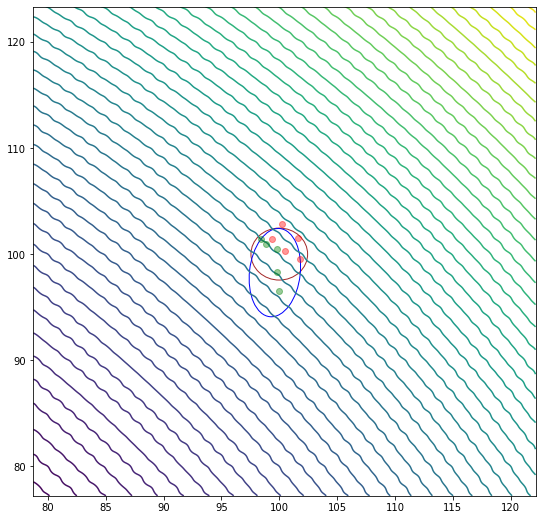

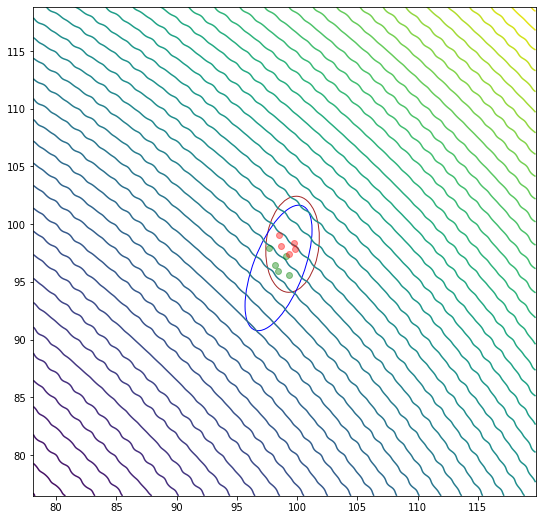

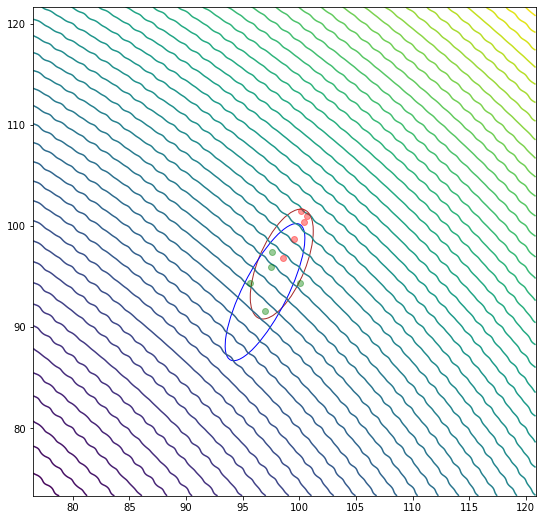

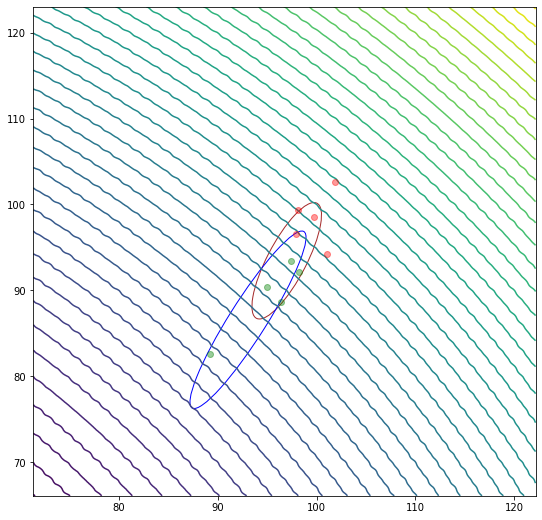

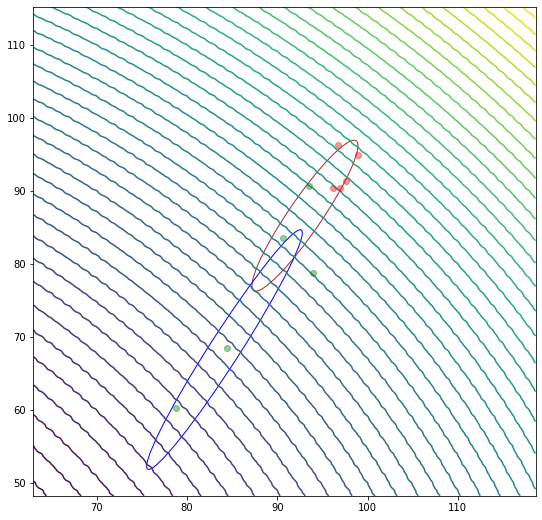

Best: [78.73205956 60.24250456], value: 9848.550625258978


In [81]:
optimize_and_show_progress(rastrigin_function, g = 5, d = 2, sigma = 1, popsize = 10)

In [68]:
lam = 100
mu = lam // 2
w = np.array([np.log(lam / 2 + 0.5) - np.log(i + 1) for i in range(lam)])
w[:mu], w[mu:], w.sum()

(array([3.92197334, 3.22882616, 2.82336105, 2.53567898, 2.31253542,
        2.13021387, 1.97606319, 1.84253179, 1.72474876, 1.61938824,
        1.52407806, 1.43706669, 1.35702398, 1.28291601, 1.21392314,
        1.14938461, 1.08875999, 1.03160158, 0.97753436, 0.92624106,
        0.8774509 , 0.83093088, 0.78647912, 0.74391951, 0.70309751,
        0.6638768 , 0.62613647, 0.58976883, 0.55467751, 0.52077595,
        0.48798613, 0.45623743, 0.42546577, 0.39561281, 0.36662527,
        0.3384544 , 0.31105542, 0.28438718, 0.25841169, 0.23309388,
        0.20840127, 0.18430372, 0.16077322, 0.1377837 , 0.11531085,
        0.09333194, 0.07182573, 0.05077233, 0.03015304, 0.00995033]),
 array([-0.0098523 , -0.02927038, -0.04831858, -0.06701071, -0.08535985,
        -0.10337835, -0.12107793, -0.13846967, -0.15556411, -0.17237123,
        -0.18890053, -0.20516105, -0.22116139, -0.23690975, -0.25241393,
        -0.26768141, -0.28271928, -0.29753437, -0.31213317, -0.32652191,
        -0.34070654, -0.35

In [26]:
z = np.array([[1,1,1], [2,2,2], [3,3,3], [4,4,4]])
[np.outer(z[k, :], z[k,:]) for k in range(0, 4)], np.sum(np.array([np.outer(z[k, :], z[k,:]) for k in range(0, 4)]), axis=0)

([array([[1, 1, 1],
         [1, 1, 1],
         [1, 1, 1]]),
  array([[4, 4, 4],
         [4, 4, 4],
         [4, 4, 4]]),
  array([[9, 9, 9],
         [9, 9, 9],
         [9, 9, 9]]),
  array([[16, 16, 16],
         [16, 16, 16],
         [16, 16, 16]])],
 array([[30, 30, 30],
        [30, 30, 30],
        [30, 30, 30]]))

In [27]:
for i in range(0, 5):
    print(i)

0
1
2
3
4


In [28]:
for i in range(5, 10):
    print(i)

5
6
7
8
9


In [64]:
N = 20
lam = 6
mu = lam//2
weights = np.array([np.log(lam / 2 + 0.5) - np.log(i + 1) if i < mu else 0
                        for i in range(lam)])
mueff = np.sum(weights)**2 / np.sum(weights**2)
c1 = 2 / ((N + 1.3)**2 + mueff) 
cmu = min([1 - c1, 2 * (mueff - 2 + 1/mueff) / ((N + 2)**2 + mueff)])
0.5 * N * lam * (c1 + cmu)**-1 / N**2

22.95374254907223

In [50]:
C = np.array([[1.0, 2.0, 3.0], [11.0, 21.0, 31.0], [15.0, 26.0, 35.0]])
C = C @ C.T
print(C)
eigen_values, eigen_vectors = np.linalg.eig(C)
inv_sqrt = eigen_vectors @ np.diag(eigen_values**-0.5) @ eigen_vectors.T
x = np.dot(np.random.randn(10, 3),np.linalg.cholesky(C).T)
y = x/1.0
z = (inv_sqrt @ y.T).T
print(z)
self.ps = (1-self.cs) * self.ps + np.sqrt(self.cs*(2-self.cs)*self.mueff) * (self.inv_sqrt @ \
                (self.xmean - x_old) / self.sigma)

self.pc = (1-self.cc) * self.pc + np.sqrt(self.cc*(2-self.cc)*self.mueff) * (self.xmean - x_old)/self.sigma

sum_diff = 1.0/5.0 * np.sum(np.array([np.outer(z[k, :], z[k,:]) for k in range(0, self.mu)]), axis=0) - \
           1.0/5.0 * np.sum(np.array([np.outer(z[k, :], z[k,:]) for k in range(self.lam-self.mu, self.lam)]))

Z = self.eigen_vectors @ np.diag(self.eigen_values**0.5) @ \
    sum_diff @ \
    (self.eigen_vectors @ np.diag(self.eigen_values**0.5)).T

self.C = (1-self.ccov)*self.C +\
         self.ccov * self.pc.reshape(-1,1) @ self.pc.reshape(1,-1) +\
         self.beta * Z

self.C = (self.C + self.C.T)/2.0

[[  14.  146.  172.]
 [ 146. 1523. 1796.]
 [ 172. 1796. 2126.]]
[[ 1.52908059 -0.62992246  0.65176594]
 [-0.62498885  0.29466203  0.47818145]
 [-0.48475916 -2.1651859   0.62286068]
 [-0.30945948 -0.41174372  0.84032655]
 [-0.34905625 -0.35388979 -1.41681029]
 [ 1.83846497 -0.43509942  0.07228158]
 [-1.21007376 -0.59900224  0.01332809]
 [ 1.46913037  0.23993622 -0.78488609]
 [-0.45008455 -0.3241542  -0.26939439]
 [ 1.44941917  0.89670277  0.60158659]]
